In [1]:
# import all libraries and dependencies for dataframe
from numpy import *
from pandas import *
from scipy.stats import *
from matplotlib.pyplot import *
from seaborn import *
#from statsmodels.api import *
from statsmodels.formula.api import *
from pylab import rcParams
#import warnings
#warnings.filterwarnings("ignore")
# Don't need to type show() command further if you do %matplotlib inline
%matplotlib inline
from statsmodels.tsa.api import *
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant
#from datetime import datetime, timedelta

In [2]:
#import all libraries and dependencies for data visualization
rcParams['figure.figsize'] = [10,10]
set(style='darkgrid')
rcParams["scatter.edgecolors"]='black'
from matplotlib.ticker import *
#Set Option for Displaying All Columns of a Pandas DataFrame
#Set Option for Displaying All Rows of a Pandas DataFrame
set_option('display.max_columns',None)
set_option('display.max_rows',None)

# Check out the Data

In [4]:
# sep=',' to align the DataFrame properly
# header='infer' which Row should be taken as header, default behaviour is to infer the Column names as header
# header=0 means 0th Row index should be taken as header
# na_values=None or na_values="String" or na_values=["String1","String2"] if you wanna specify any "String" as NaN
# keep_default_na=True by default ‘#N/A’,‘#N/A N/A’,‘#NA’,‘-1.#IND’,‘-1.#QNAN’,‘-NaN’,‘-nan’,‘1.#IND’,‘1.#QNAN’,‘N/A’,‘NA’,‘NULL’,‘NaN’,‘n/a’,‘nan’,‘null’ will be treated as NaN
# na_filter=True blank cells will be treated as NaN
# index_col=None works just like set_index() & you just need to type the column name to be set as index column

Titanic_Train=read_csv("DataFile\\titanic_train.csv",sep=',',header='infer',na_values=None,keep_default_na=True,na_filter=True,index_col=None) #Write the file path & name inside ("")
Titanic_Train

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,1,0,3,"Braund, Mr. Owen Harris",male,22.00,1,0,A/5 21171,7.2500,NaN,S
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.00,1,0,PC 17599,71.2833,C85,C
2,3,1,3,"Heikkinen, Miss. Laina",female,26.00,0,0,STON/O2. 3101282,7.9250,NaN,S
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.00,1,0,113803,53.1000,C123,S
4,5,0,3,"Allen, Mr. William Henry",male,35.00,0,0,373450,8.0500,NaN,S
5,6,0,3,"Moran, Mr. James",male,NaN,0,0,330877,8.4583,NaN,Q
6,7,0,1,"McCarthy, Mr. Timothy J",male,54.00,0,0,17463,51.8625,E46,S
7,8,0,3,"Palsson, Master. Gosta Leonard",male,2.00,3,1,349909,21.0750,NaN,S
8,9,1,3,"Johnson, Mrs. Oscar W (Elisabeth Vilhelmina Berg)",female,27.00,0,2,347742,11.1333,NaN,S
9,10,1,2,"Nasser, Mrs. Nicholas (Adele Achem)",female,14.00,1,0,237736,30.0708,NaN,C


In [5]:
#Rename the Data col "Sex" as "Gender"
Titanic_Train.rename(columns={"Sex":"Gender"},inplace=True)
Titanic_Train.columns

Index(['PassengerId', 'Survived', 'Pclass', 'Name', 'Gender', 'Age', 'SibSp',
       'Parch', 'Ticket', 'Fare', 'Cabin', 'Embarked'],
      dtype='object')

In [6]:
#Rename the Data col "Embarked" as "BoardPort"
Titanic_Train.rename(columns={"Embarked":"BoardPort"},inplace=True)
Titanic_Train.columns

Index(['PassengerId', 'Survived', 'Pclass', 'Name', 'Gender', 'Age', 'SibSp',
       'Parch', 'Ticket', 'Fare', 'Cabin', 'BoardPort'],
      dtype='object')

In [7]:
# Titanic_Train is a DataFrame in type
type(Titanic_Train)

pandas.core.frame.DataFrame

In [8]:
# It shows type of the DataFrame
# Shows no of Rows & Cols
# Shows all Col names
# Shows total no of NaN values for each Column
# Shows data type of each Columns
Titanic_Train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 891 entries, 0 to 890
Data columns (total 12 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   PassengerId  891 non-null    int64  
 1   Survived     891 non-null    int64  
 2   Pclass       891 non-null    int64  
 3   Name         891 non-null    object 
 4   Gender       891 non-null    object 
 5   Age          714 non-null    float64
 6   SibSp        891 non-null    int64  
 7   Parch        891 non-null    int64  
 8   Ticket       891 non-null    object 
 9   Fare         891 non-null    float64
 10  Cabin        204 non-null    object 
 11  BoardPort    889 non-null    object 
dtypes: float64(2), int64(5), object(5)
memory usage: 83.7+ KB


In [9]:
# detect duplicate DataFrame rows: True if an entire row is identical to a previous row
Titanic_Train.duplicated().tail()

886    False
887    False
888    False
889    False
890    False
dtype: bool

In [10]:
# Fetch Test Data
Titanic_Test=read_csv("DataFile\\titanic_test.csv",sep=',',header='infer',na_values=None,keep_default_na=True,na_filter=True,index_col=None) #Write the file path & name inside ("")
Titanic_Test

,PassengerId,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,892,3,"Kelly, Mr. James",male,34.50,0,0,330911,7.8292,NaN,Q
1,893,3,"Wilkes, Mrs. James (Ellen Needs)",female,47.00,1,0,363272,7.0000,NaN,S
2,894,2,"Myles, Mr. Thomas Francis",male,62.00,0,0,240276,9.6875,NaN,Q
3,895,3,"Wirz, Mr. Albert",male,27.00,0,0,315154,8.6625,NaN,S
4,896,3,"Hirvonen, Mrs. Alexander (Helga E Lindqvist)",female,22.00,1,1,3101298,12.2875,NaN,S
5,897,3,"Svensson, Mr. Johan Cervin",male,14.00,0,0,7538,9.2250,NaN,S
6,898,3,"Connolly, Miss. Kate",female,30.00,0,0,330972,7.6292,NaN,Q
7,899,2,"Caldwell, Mr. Albert Francis",male,26.00,1,1,248738,29.0000,NaN,S
8,900,3,"Abrahim, Mrs. Joseph (Sophie Halaut Easu)",female,18.00,0,0,2657,7.2292,NaN,C
9,901,3,"Davies, Mr. John Samuel",male,21.00,2,0,A/4 48871,24.1500,NaN,S


In [11]:
#Rename the Data col "Sex" as "Gender"
Titanic_Test.rename(columns={"Sex":"Gender"},inplace=True)
Titanic_Test.columns

Index(['PassengerId', 'Pclass', 'Name', 'Gender', 'Age', 'SibSp', 'Parch',
       'Ticket', 'Fare', 'Cabin', 'Embarked'],
      dtype='object')

In [12]:
#Rename the Data col "Embarked" as "BoardPort"
Titanic_Test.rename(columns={"Embarked":"BoardPort"},inplace=True)
Titanic_Test.columns

Index(['PassengerId', 'Pclass', 'Name', 'Gender', 'Age', 'SibSp', 'Parch',
       'Ticket', 'Fare', 'Cabin', 'BoardPort'],
      dtype='object')

In [13]:
# It shows type of the DataFrame
# Shows no of Rows & Cols
# Shows all Col names
# Shows total no of non-null/NaN values for each Column
# Shows data type of each Columns
Titanic_Train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 891 entries, 0 to 890
Data columns (total 12 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   PassengerId  891 non-null    int64  
 1   Survived     891 non-null    int64  
 2   Pclass       891 non-null    int64  
 3   Name         891 non-null    object 
 4   Gender       891 non-null    object 
 5   Age          714 non-null    float64
 6   SibSp        891 non-null    int64  
 7   Parch        891 non-null    int64  
 8   Ticket       891 non-null    object 
 9   Fare         891 non-null    float64
 10  Cabin        204 non-null    object 
 11  BoardPort    889 non-null    object 
dtypes: float64(2), int64(5), object(5)
memory usage: 83.7+ KB


In [14]:
# Total no of NaN Values in each column
# Shows which col has how many no of NaN values in total
# No Column has NaN value
Titanic_Train.isna().sum()

PassengerId      0
Survived         0
Pclass           0
Name             0
Gender           0
Age            177
SibSp            0
Parch            0
Ticket           0
Fare             0
Cabin          687
BoardPort        2
dtype: int64

In [15]:
# It shows type of the DataFrame
# Shows no of Rows & Cols
# Shows all Col names
# Shows total no of non-null/NaN values for each Column
# Shows data type of each Columns
Titanic_Test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 418 entries, 0 to 417
Data columns (total 11 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   PassengerId  418 non-null    int64  
 1   Pclass       418 non-null    int64  
 2   Name         418 non-null    object 
 3   Gender       418 non-null    object 
 4   Age          332 non-null    float64
 5   SibSp        418 non-null    int64  
 6   Parch        418 non-null    int64  
 7   Ticket       418 non-null    object 
 8   Fare         417 non-null    float64
 9   Cabin        91 non-null     object 
 10  BoardPort    418 non-null    object 
dtypes: float64(2), int64(4), object(5)
memory usage: 36.0+ KB


In [16]:
# Total no of NaN Values in each column
# Shows which col has how many no of NaN values in total
# No Column has NaN value
Titanic_Test.isna().sum()

PassengerId      0
Pclass           0
Name             0
Gender           0
Age             86
SibSp            0
Parch            0
Ticket           0
Fare             1
Cabin          327
BoardPort        0
dtype: int64

# Normality Check of Continuous Variables/Features

In [17]:
#Normality test/Distribution test of Age Numeric column in Training Data/variables
from scipy.stats import shapiro
stat,pvalue = shapiro(Titanic_Train['Age'])
if pvalue >= 0.05:
    print("Null Hypothesis (H0): Age is Normally distributed")
else:
    print("Alternate Hypothesis (H1): Age is not Normally Distributed")
print("Confidence Level : {} %".format(((1- pvalue)*100)))
print('Statistics=%.3f, p=%.3f' % (stat, pvalue))

#*D'Agostino's Skewness/K^2 test(normality)
from scipy.stats import normaltest
stat,pvalue = normaltest(Titanic_Train['Age'],nan_policy='omit') #nan_policy='omit' excludes NaN values from the Calculation
if pvalue >= 0.05:
    print("Null Hypothesis (H0): Age is Normally distributed")
else:
    print("Alternate Hypothesis (H1): Age is not Normally Distributed")
print("Confidence Level : {} %".format(((1- pvalue)*100)))
print('Statistics=%.3f, p=%.3f' % (stat, pvalue))

#*Anderson Darling Test(normality)
from scipy.stats import anderson
Result=anderson(Titanic_Train['Age'])
p=0
for i in range(len(Result.critical_values)):
    SL, CV = Result.significance_level[i], Result.critical_values[i]
    if Result.statistic < Result.critical_values[i]:
        print("Null Hypothesis (H0): '%.3f : %.3f, Age is Normally distributed"%(SL,CV))
    else:
        print("Alternate Hypothesis (H1): '%.3f : %.3f, Age is not Normally Distributed"%(SL,CV))
print("Confidence Level : {} %".format(((1- Result.statistic)*100)))
print('Statistic: %.3f' % Result.statistic)

Null Hypothesis (H0): Age is Normally distributed
Confidence Level : 0.0 %
Statistics=nan, p=1.000
Alternate Hypothesis (H1): Age is not Normally Distributed
Confidence Level : 99.98829040034265 %
Statistics=18.105, p=0.000
Alternate Hypothesis (H1): '15.000 : 0.573, Age is not Normally Distributed
Alternate Hypothesis (H1): '10.000 : 0.653, Age is not Normally Distributed
Alternate Hypothesis (H1): '5.000 : 0.784, Age is not Normally Distributed
Alternate Hypothesis (H1): '2.500 : 0.914, Age is not Normally Distributed
Alternate Hypothesis (H1): '1.000 : 1.087, Age is not Normally Distributed
Confidence Level : nan %
Statistic: nan


D:\D Program Files\Anaconda\lib\site-packages\scipy\stats\_distn_infrastructure.py:1889: RuntimeWarning: invalid value encountered in greater_equal
  cond2 = (x >= _b) & cond0
D:\D Program Files\Anaconda\lib\site-packages\scipy\stats\_distn_infrastructure.py:1977: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)


In [18]:
#Normality test/Distribution test of Age Numeric column in Testing Data/variables
stat,pvalue = shapiro(Titanic_Test['Age'])
if pvalue >= 0.05:
    print("Null Hypothesis (H0): Age is Normally distributed")
else:
    print("Alternate Hypothesis (H1): Age is not Normally Distributed")
print("Confidence Level : {} %".format(((1- pvalue)*100)))
print('Statistics=%.3f, p=%.3f' % (stat, pvalue))

#*D'Agostino's Skewness/K^2 test(normality)
stat,pvalue = normaltest(Titanic_Test['Age'],nan_policy='omit') #nan_policy='omit' excludes NaN values from the Calculation
if pvalue >= 0.05:
    print("Null Hypothesis (H0): Age is Normally distributed")
else:
    print("Alternate Hypothesis (H1): Age is not Normally Distributed")
print("Confidence Level : {} %".format(((1- pvalue)*100)))
print('Statistics=%.3f, p=%.3f' % (stat, pvalue))

#*Anderson Darling Test(normality)
Result=anderson(Titanic_Test['Age'])
p=0
for i in range(len(Result.critical_values)):
    SL, CV = Result.significance_level[i], Result.critical_values[i]
    if Result.statistic < Result.critical_values[i]:
        print("Null Hypothesis (H0): '%.3f : %.3f, Age is Normally distributed"%(SL,CV))
    else:
        print("Alternate Hypothesis (H1): '%.3f : %.3f, Age is not Normally Distributed"%(SL,CV))
print("Confidence Level : {} %".format(((1- Result.statistic)*100)))
print('Statistic: %.3f' % Result.statistic)

Null Hypothesis (H0): Age is Normally distributed
Confidence Level : 0.0 %
Statistics=nan, p=1.000
Alternate Hypothesis (H1): Age is not Normally Distributed
Confidence Level : 99.61988447825019 %
Statistics=11.145, p=0.004
Alternate Hypothesis (H1): '15.000 : 0.571, Age is not Normally Distributed
Alternate Hypothesis (H1): '10.000 : 0.650, Age is not Normally Distributed
Alternate Hypothesis (H1): '5.000 : 0.780, Age is not Normally Distributed
Alternate Hypothesis (H1): '2.500 : 0.909, Age is not Normally Distributed
Alternate Hypothesis (H1): '1.000 : 1.082, Age is not Normally Distributed
Confidence Level : nan %
Statistic: nan


In [19]:
#Normality test/Distribution test of Fare Numeric column in Training Data/variables
stat,pvalue = shapiro(Titanic_Train['Fare'])
if pvalue >= 0.05:
    print("Null Hypothesis (H0): Fare is Normally distributed")
else:
    print("Alternate Hypothesis (H1): Fare is not Normally Distributed")
print("Confidence Level : {} %".format(((1- pvalue)*100)))
print('Statistics=%.3f, p=%.3f' % (stat, pvalue))

#*D'Agostino's Skewness/K^2 test(normality)
stat,pvalue = normaltest(Titanic_Train['Fare'],nan_policy='omit') #nan_policy='omit' excludes NaN values from the Calculation
if pvalue >= 0.05:
    print("Null Hypothesis (H0): Fare is Normally distributed")
else:
    print("Alternate Hypothesis (H1): Fare is not Normally Distributed")
print("Confidence Level : {} %".format(((1- pvalue)*100)))
print('Statistics=%.3f, p=%.3f' % (stat, pvalue))

#*Anderson Darling Test(normality)
Result=anderson(Titanic_Train['Fare'])
p=0
for i in range(len(Result.critical_values)):
    SL, CV = Result.significance_level[i], Result.critical_values[i]
    if Result.statistic < Result.critical_values[i]:
        print("Null Hypothesis (H0): '%.3f : %.3f, Fare is Normally distributed"%(SL,CV))
    else:
        print("Alternate Hypothesis (H1): '%.3f : %.3f, Fare is not Normally Distributed"%(SL,CV))
print("Confidence Level : {} %".format(((1- Result.statistic)*100)))
print('Statistic: %.3f' % Result.statistic)

Alternate Hypothesis (H1): Fare is not Normally Distributed
Confidence Level : 100.0 %
Statistics=0.522, p=0.000
Alternate Hypothesis (H1): Fare is not Normally Distributed
Confidence Level : 100.0 %
Statistics=904.587, p=0.000
Alternate Hypothesis (H1): '15.000 : 0.573, Fare is not Normally Distributed
Alternate Hypothesis (H1): '10.000 : 0.653, Fare is not Normally Distributed
Alternate Hypothesis (H1): '5.000 : 0.784, Fare is not Normally Distributed
Alternate Hypothesis (H1): '2.500 : 0.914, Fare is not Normally Distributed
Alternate Hypothesis (H1): '1.000 : 1.087, Fare is not Normally Distributed
Confidence Level : -12116.962721459207 %
Statistic: 122.170


In [20]:
#Normality test/Distribution test of Fare Numeric column in Testing Data/variables
stat,pvalue = shapiro(Titanic_Test['Fare'])
if pvalue >= 0.05:
    print("Null Hypothesis (H0): Fare is Normally distributed")
else:
    print("Alternate Hypothesis (H1): Fare is not Normally Distributed")
print("Confidence Level : {} %".format(((1- pvalue)*100)))
print('Statistics=%.3f, p=%.3f' % (stat, pvalue))

#*D'Agostino's Skewness/K^2 test(normality)
stat,pvalue = normaltest(Titanic_Test['Fare'],nan_policy='omit') #nan_policy='omit' excludes NaN values from the Calculation
if pvalue >= 0.05:
    print("Null Hypothesis (H0): Fare is Normally distributed")
else:
    print("Alternate Hypothesis (H1): Fare is not Normally Distributed")
print("Confidence Level : {} %".format(((1- pvalue)*100)))
print('Statistics=%.3f, p=%.3f' % (stat, pvalue))

#*Anderson Darling Test(normality)
Result=anderson(Titanic_Test['Fare'])
p=0
for i in range(len(Result.critical_values)):
    SL, CV = Result.significance_level[i], Result.critical_values[i]
    if Result.statistic < Result.critical_values[i]:
        print("Null Hypothesis (H0): '%.3f : %.3f, Fare is Normally distributed"%(SL,CV))
    else:
        print("Alternate Hypothesis (H1): '%.3f : %.3f, Fare is not Normally Distributed"%(SL,CV))
print("Confidence Level : {} %".format(((1- Result.statistic)*100)))
print('Statistic: %.3f' % Result.statistic)

Null Hypothesis (H0): Fare is Normally distributed
Confidence Level : 0.0 %
Statistics=nan, p=1.000
Alternate Hypothesis (H1): Fare is not Normally Distributed
Confidence Level : 100.0 %
Statistics=354.308, p=0.000
Alternate Hypothesis (H1): '15.000 : 0.571, Fare is not Normally Distributed
Alternate Hypothesis (H1): '10.000 : 0.650, Fare is not Normally Distributed
Alternate Hypothesis (H1): '5.000 : 0.780, Fare is not Normally Distributed
Alternate Hypothesis (H1): '2.500 : 0.909, Fare is not Normally Distributed
Alternate Hypothesis (H1): '1.000 : 1.082, Fare is not Normally Distributed
Confidence Level : nan %
Statistic: nan


# Treating Missing Values & Feature Engineering
**Missing values in *train* & *test* dataset.**

In [21]:
# Let's write a functin to print the total percentage of the missing values.
def missing_percentage(df):
    """This function takes a DataFrame(df) as input and returns two columns, total missing values and total missing values percentage"""
    total = df.isnull().sum().sort_values(ascending = False)
    percent = round(df.isnull().sum().sort_values(ascending = False)/len(df)*100,2)
    return concat([total, percent], axis=1, keys=['Total','Percent'])

In [22]:
print(missing_percentage(Titanic_Train))
print(missing_percentage(Titanic_Test))

             Total  Percent
Cabin          687    77.10
Age            177    19.87
BoardPort        2     0.22
Fare             0     0.00
Ticket           0     0.00
Parch            0     0.00
SibSp            0     0.00
Gender           0     0.00
Name             0     0.00
Pclass           0     0.00
Survived         0     0.00
PassengerId      0     0.00
             Total  Percent
Cabin          327    78.23
Age             86    20.57
Fare             1     0.24
BoardPort        0     0.00
Ticket           0     0.00
Parch            0     0.00
SibSp            0     0.00
Gender           0     0.00
Name             0     0.00
Pclass           0     0.00
PassengerId      0     0.00


In [23]:
#Working With "BoardPort" feature
# 2 entries missing in "BoardPort" feature "Titanic_Train" data
Titanic_Train[Titanic_Train.BoardPort.isnull()]
"""We may be able to solve these two missing values by looking at other independent variables of the two raws.
Both passengers paid a fare of $80, are of Pclass 1 and female Sex.
Let's see how the Fare is distributed among all Pclass and BoardPort feature values"""

"We may be able to solve these two missing values by looking at other independent variables of the two raws.\nBoth passengers paid a fare of $80, are of Pclass 1 and female Sex.\nLet's see how the Fare is distributed among all Pclass and BoardPort feature values"

Text(0.5, 1.0, 'Titanic_Test')

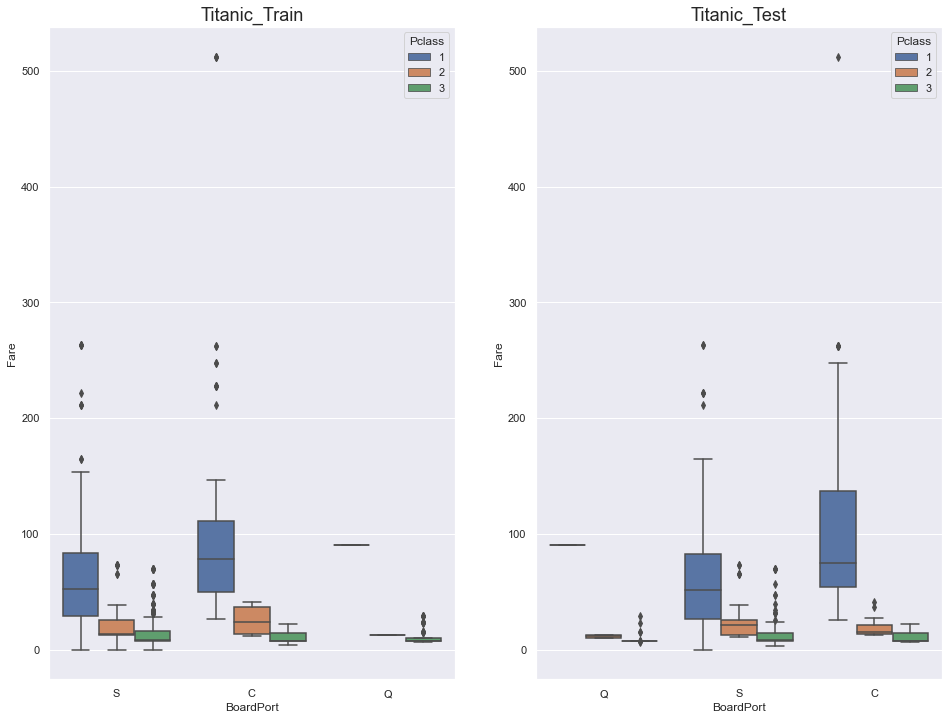

In [24]:
#Visualizing Distribution of "Fair" based on "BoardPort" & "Pclass"
fig, ax = subplots(figsize=(16,12),ncols=2)
ax1 = boxplot(x="BoardPort", y="Fare", hue="Pclass", data=Titanic_Train, ax = ax[0]);
ax2 = boxplot(x="BoardPort", y="Fare", hue="Pclass", data=Titanic_Test, ax = ax[1]);
ax1.set_title("Titanic_Train", fontsize = 18)
ax2.set_title("Titanic_Test",  fontsize = 18)

Here, in both training set and test set, the average fare closest to $80 are in the C BoardPort values where pclass is 1. So, let's fill in the missing values as "C"

In [25]:
# Dont Count the NaN Values
Titanic_Train.BoardPort.value_counts(dropna=True)
# Replacing "BoardPort" NaN values with 'C' in Train Data as Per "Fair" & "Pclass"
# We will Replace NaN Values of BoardPort Column by BoardPort Column mode value ie 'C' for Train Data
Titanic_Train["BoardPort"].fillna('C', inplace=True)

In [26]:
# Checking Missing Value Percentage in "Cabin" Feature for both Titanic_Train & Titanic_Test
print("Titanic_Train Cabin missing: " + str(Titanic_Train.Cabin.isnull().sum()/len(Titanic_Train.Cabin)))
print("Titanic_Test Cabin missing: " + str(Titanic_Test.Cabin.isnull().sum()/len(Titanic_Test.Cabin)))

Titanic_Train Cabin missing: 0.7710437710437711
Titanic_Test Cabin missing: 0.7822966507177034


In [27]:
## Assign all the null values to N for "Cabin" Feature
Titanic_Train.Cabin.fillna("N", inplace=True)
Titanic_Test.Cabin.fillna("N", inplace=True)

In [28]:
#We will Check Average "Fair" for Each factor of "Cabin" feature
#Titanic_Train.groupby("Cabin").agg({'Fare':[min,max]})
Titanic_Train.Cabin = [i[0] for i in Titanic_Train.Cabin]
Titanic_Test.Cabin = [i[0] for i in Titanic_Test.Cabin]

In [29]:
# Showing Mean Fare value for each category of "Cabin" Feature
print(Titanic_Train.groupby("Cabin")['Fare'].mean().sort_values())

Cabin
G     13.581250
F     18.696792
N     19.157325
T     35.500000
A     39.623887
E     46.026694
D     57.244576
C    100.151341
B    113.505764
Name: Fare, dtype: float64


In [30]:
#For Titanic_Train Data
def cabin_estimator(i):
    """Grouping cabin feature by the first letter"""
    a = 0
    if i<15.5:
        a = "G"
    elif i>=15.5 and i<26.5:
        a = "F"
    elif i>=26.5 and i<37.5:
        a = "T"
    elif i>=37.5 and i<42.5:
        a = "A"
    elif i>= 42.5 and i<51.5:
        a = "E"
    elif i>= 51.5 and i<78.5:
        a = "D"
    elif i>=78.5 and i<106.5:
        a = 'C'
    else:
        a = "B"
    return a
    

Let's apply cabin_estimator function in each unknown cabins(cabin with null values).

In [31]:
Train_with_N = Titanic_Train[Titanic_Train.Cabin == "N"]
Train_without_N = Titanic_Train[Titanic_Train.Cabin != "N"]
##applying cabin estimator function. 
Train_with_N['Cabin'] = Train_with_N.Fare.apply(lambda x: cabin_estimator(x))
## getting back train. 
Titanic_Train = concat([Train_with_N, Train_without_N], axis=0)
## PassengerId helps us to separate train and test.
Titanic_Train.sort_values(by = 'PassengerId', inplace=True)

D:\D Program Files\Anaconda\lib\site-packages\ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.


In [32]:
# Again Check Mean Fare value for each category of "Cabin" Feature
print(Titanic_Test.groupby("Cabin")['Fare'].mean().sort_values())

Cabin
G     16.700000
F     17.076050
N     19.080828
D     42.251277
A     44.716657
E     84.921756
C    121.033460
B    145.562733
Name: Fare, dtype: float64


In [33]:
#For Titanic_Test Data
def cabin_estimator(i):
    """Grouping cabin feature by the first letter"""
    a = 0
    if i<16.5:
        a = "G"
    elif i>=16.5 and i<29.5:
        a = "F"
    elif i>=29.5 and i<43.5:
        a = "D"
    elif i>=43.5 and i<64:
        a = "A"
    elif i>= 64 and i<102.5:
        a = "E"
    elif i>= 102.5 and i<133:
        a = "C"
    else:
        a = "B"
    return a
    

In [34]:
Test_with_N = Titanic_Test[Titanic_Test.Cabin == "N"]
Test_without_N = Titanic_Test[Titanic_Test.Cabin != "N"]
##applying cabin estimator function. 
Test_with_N['Cabin'] = Test_with_N.Fare.apply(lambda x: cabin_estimator(x))
## getting back train. 
Titanic_Test = concat([Test_with_N, Test_without_N], axis=0)
## PassengerId helps us to separate train and test. 
Titanic_Test.sort_values(by = 'PassengerId', inplace=True)

D:\D Program Files\Anaconda\lib\site-packages\ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.


In [35]:
# Total no of NaN Values in each column
# Shows which col has how many no of NaN values in total
# No Column has NaN value
Titanic_Train.isna().sum()

PassengerId      0
Survived         0
Pclass           0
Name             0
Gender           0
Age            177
SibSp            0
Parch            0
Ticket           0
Fare             0
Cabin            0
BoardPort        0
dtype: int64

In [36]:
# Total no of NaN Values in each column
# Shows which col has how many no of NaN values in total
# No Column has NaN value
Titanic_Test.isna().sum()

PassengerId     0
Pclass          0
Name            0
Gender          0
Age            86
SibSp           0
Parch           0
Ticket          0
Fare            1
Cabin           0
BoardPort       0
dtype: int64

In [37]:
#Fare Feature
#We will See the Missing "Fare" feature Row
Titanic_Test[Titanic_Test.Fare.isnull()]

,PassengerId,Pclass,Name,Gender,Age,SibSp,Parch,Ticket,Fare,Cabin,BoardPort
152,1044,3,"Storey, Mr. Thomas",male,60.5,0,0,3701,NaN,B,S


Here, We can take the average of the **Fare** column to fill in the NaN value. However, for the sake of learning and practicing, we will try something else. We can take the average of the values where**Pclass** is ***3***, **Sex** is ***male*** and **Embarked** is ***S***

In [38]:
Missing_Fare = Titanic_Test[(Titanic_Test.Pclass == 3) & 
                     (Titanic_Test.BoardPort == "S") & 
                     (Titanic_Test.Gender == "male")].Fare.mean()
## replace the test.fare null values with test.fare mean
Titanic_Test.Fare.fillna(Missing_Fare, inplace=True)

In [39]:
# Replacing "Age" NaN values with Random Samples in Train Data
# After dropping the NaN values We have Taken Random Samples for each NaN value of Titanic_Train["Age"] Column
Random_Sample=Titanic_Train["Age"].dropna().sample(Titanic_Train["Age"].isnull().sum(),random_state=0)
# Each element of Random_Sample got assigned the index value of NaN values of Titanic_Train["Age"] column
Random_Sample.index=Titanic_Train[Titanic_Train["Age"].isnull()].index
# All index locations of NaN values of Titanic_Train["Age"] Column have got replaced by Random_Sample having same index
Titanic_Train.loc[Titanic_Train["Age"].isnull(),"Age"]=Random_Sample

In [40]:
# Replacing "Age" NaN values with Random Samples in Test Data
# After dropping the NaN values We have Taken Random Samples for each NaN value of Titanic_Test["Age"] Column
Random_Sample=Titanic_Test["Age"].dropna().sample(Titanic_Test["Age"].isnull().sum(),random_state=0)
# Each element of Random_Sample got assigned the index value of NaN values of Titanic_Test["Age"] column
Random_Sample.index=Titanic_Test[Titanic_Test["Age"].isnull()].index
# All index locations of NaN values of Titanic_Test["Age"] Column have got replaced by Random_Sample having same index
Titanic_Test.loc[Titanic_Test["Age"].isnull(),"Age"]=Random_Sample

In [41]:
# detect duplicate DataFrame rows: True if an entire row is identical to a previous row
Titanic_Train.duplicated().tail()

886    False
887    False
888    False
889    False
890    False
dtype: bool

In [42]:
# detect duplicate DataFrame rows: True if an entire row is identical to a previous row
Titanic_Test.duplicated().tail()

413    False
414    False
415    False
416    False
417    False
dtype: bool

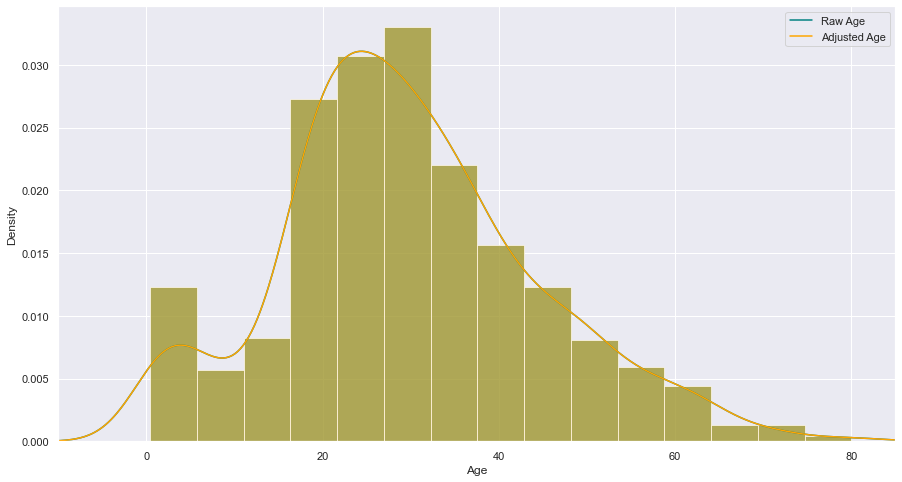

In [43]:
# Raw Age Vs Adjusted Age Distribution for Titanic_Train
figure(figsize=(15,8))
ax = Titanic_Train["Age"].hist(bins=15, density=True, stacked=True, color='teal', alpha=0.6)
Titanic_Train["Age"].plot(kind='density', color='teal')
ax = Titanic_Train["Age"].hist(bins=15, density=True, stacked=True, color='orange', alpha=0.5)
Titanic_Train["Age"].plot(kind='density', color='orange')
ax.legend(['Raw Age', 'Adjusted Age'])
ax.set(xlabel='Age')
xlim(-10,85) #Set Scale limit to X-axis
show()

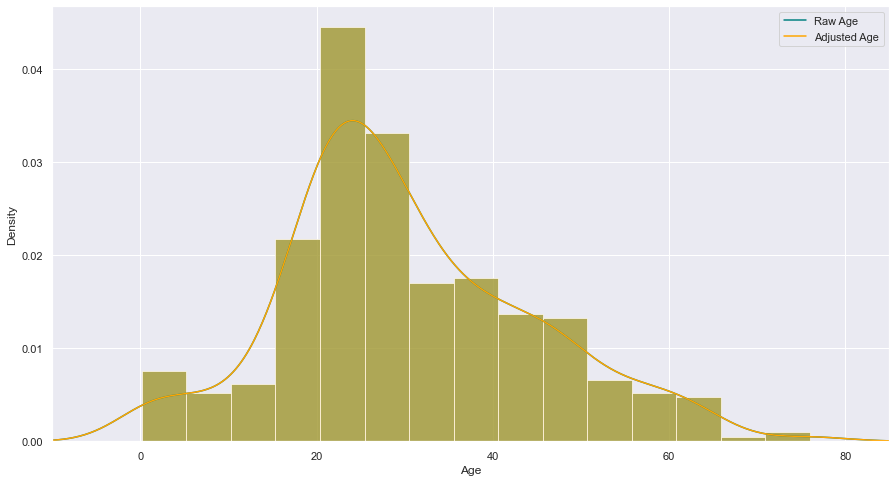

In [44]:
# Raw Age Vs Adjusted Age Distribution for Titanic_Test
figure(figsize=(15,8))
ax = Titanic_Test["Age"].hist(bins=15, density=True, stacked=True, color='teal', alpha=0.6)
Titanic_Test["Age"].plot(kind='density', color='teal')
ax = Titanic_Test["Age"].hist(bins=15, density=True, stacked=True, color='orange', alpha=0.5)
Titanic_Test["Age"].plot(kind='density', color='orange')
ax.legend(['Raw Age', 'Adjusted Age'])
ax.set(xlabel='Age')
xlim(-10,85) #Set Scale limit to X-axis
show()

In [45]:
## create bins for age
def age_group_fun(age):
    """
    This function creates a bin for age
    """
    a = ''
    if age <= 1:
        a = 'infant'
    elif age <= 4: 
        a = 'toddler'
    elif age <= 13:
        a = 'child'
    elif age <= 18:
        a = 'teenager'
    elif age <= 35:
        a = 'Young_Adult'
    elif age <= 45:
        a = 'adult'
    elif age <= 55:
        a = 'middle_aged'
    elif age <= 65:
        a = 'senior_citizen'
    else:
        a = 'old'
    return a
        
## Applying "age_group_fun" function to the "Age" column.
Titanic_Train['Age_Group'] = Titanic_Train['Age'].map(age_group_fun)
Titanic_Test['Age_Group'] = Titanic_Test['Age'].map(age_group_fun)

In [46]:
# Total no of NaN Values in each column
# Shows which col has how many no of NaN values in total
# No Column has NaN value
Titanic_Train.isna().sum()

PassengerId    0
Survived       0
Pclass         0
Name           0
Gender         0
Age            0
SibSp          0
Parch          0
Ticket         0
Fare           0
Cabin          0
BoardPort      0
Age_Group      0
dtype: int64

In [47]:
# Total no of NaN Values in each column
# Shows which col has how many no of NaN values in total
# No Column has NaN value
Titanic_Test.isna().sum()

PassengerId    0
Pclass         0
Name           0
Gender         0
Age            0
SibSp          0
Parch          0
Ticket         0
Fare           0
Cabin          0
BoardPort      0
Age_Group      0
dtype: int64

In [48]:
# Dont Count the NaN Values
# Count the Frequency of Each Factor of Survived Column
# Survived is Imbalanced Categorical Target Column
Titanic_Train.Survived.value_counts(dropna=True)

0    549
1    342
Name: Survived, dtype: int64

In [49]:
# detect duplicate DataFrame rows: True if an entire row is identical to a previous row
# Check both For Train data & Test data
Titanic_Train.duplicated().tail(), Titanic_Test.duplicated().tail()

(886    False
 887    False
 888    False
 889    False
 890    False
 dtype: bool,
 413    False
 414    False
 415    False
 416    False
 417    False
 dtype: bool)

In [50]:
## Create categorical variable for "WithFamily" in Titanic_Train Data
Titanic_Train['WithFamily']=where((Titanic_Train["SibSp"]+Titanic_Train["Parch"])>0, 1, 0)

In [51]:
## Create categorical variable for "WithFamily" in Titanic_Test Data
Titanic_Test['WithFamily']=where((Titanic_Test["SibSp"]+Titanic_Test["Parch"])>0, 1, 0)

In [52]:
## Family_size seems like a good feature to create
Titanic_Train['Family_Size'] = Titanic_Train.SibSp + Titanic_Train.Parch+1
Titanic_Test['Family_Size'] = Titanic_Test.SibSp + Titanic_Test.Parch+1

def Family_Group(size):
    a = ''
    if (size <= 1):
        a = 'loner'
    elif (size <= 4):
        a = 'small'
    else:
        a = 'large'
    return a

Titanic_Train['Family_Group'] = Titanic_Train['Family_Size'].map(Family_Group)
Titanic_Test['Family_Group'] = Titanic_Test['Family_Size'].map(Family_Group)

In [53]:
## Calculating fare based on family size. 
Titanic_Train['Average_Fare'] = Titanic_Train.Fare/Titanic_Train.Family_Size
Titanic_Test['Average_Fare'] = Titanic_Test.Fare/Titanic_Test.Family_Size

def Fare_Group(fare):
    a= ''
    if (fare <= 4):
        a = 'Very_low'
    elif (fare <= 10):
        a = 'low'
    elif (fare <= 20):
        a = 'mid'
    elif (fare <= 45):
        a = 'high'
    else:
        a = "very_high"
    return a

Titanic_Train['Fare_Group'] = Titanic_Train['Average_Fare'].map(Fare_Group)
Titanic_Test['Fare_Group'] = Titanic_Test['Average_Fare'].map(Fare_Group)


In [54]:
# detect duplicate DataFrame rows: True if an entire row is identical to a previous row
# Check both For Train data & Test data
Titanic_Train.duplicated().tail(), Titanic_Test.duplicated().tail()

(886    False
 887    False
 888    False
 889    False
 890    False
 dtype: bool,
 413    False
 414    False
 415    False
 416    False
 417    False
 dtype: bool)

# Dropping Features after Feature Engineering

In [55]:
Titanic_Train.drop('SibSp', axis=1, inplace=True)
Titanic_Train.drop('Parch', axis=1, inplace=True)
Titanic_Test.drop('SibSp', axis=1, inplace=True)
Titanic_Test.drop('Parch', axis=1, inplace=True)
Titanic_Train.drop('PassengerId', axis=1, inplace=True)
Titanic_Test.drop('PassengerId', axis=1, inplace=True)

# Redo Feature Engineering

In [56]:
# Creating a new colomn with a 
Titanic_Train['name_length'] = [len(i) for i in Titanic_Train.Name]
Titanic_Test['name_length'] = [len(i) for i in Titanic_Test.Name]

def name_length_group(size):
    a = ''
    if (size <=20):
        a = 'short'
    elif (size <=35):
        a = 'medium'
    elif (size <=45):
        a = 'good'
    else:
        a = 'long'
    return a


Titanic_Train['nLength_group'] = Titanic_Train['name_length'].map(name_length_group)
Titanic_Test['nLength_group'] = Titanic_Test['name_length'].map(name_length_group)

In [57]:
## get the title from the name
Titanic_Train["title"] = [i.split('.')[0] for i in Titanic_Train.Name]
Titanic_Train["title"] = [i.split(',')[1] for i in Titanic_Train.title]
## Whenever we split like that, there is a good change that we will end up with while space around our string values. Let's check that. 

In [58]:
## Let's fix that
Titanic_Train.title = Titanic_Train.title.apply(lambda x: x.strip())

In [59]:
## We can also combile all three lines above for test set here
Titanic_Test['title'] = [i.split('.')[0].split(',')[1].strip() for i in Titanic_Test.Name]

## However it is important to be able to write readable code, and the line above is not so readable. 

In [60]:
## Let's replace some of the rare values with the keyword 'rare' and other word choice of our own. 
## Titanic_Train Data
Titanic_Train["title"] = [i.replace('Ms', 'Miss') for i in Titanic_Train.title]
Titanic_Train["title"] = [i.replace('Mlle', 'Miss') for i in Titanic_Train.title]
Titanic_Train["title"] = [i.replace('Mme', 'Mrs') for i in Titanic_Train.title]
Titanic_Train["title"] = [i.replace('Dr', 'rare') for i in Titanic_Train.title]
Titanic_Train["title"] = [i.replace('Col', 'rare') for i in Titanic_Train.title]
Titanic_Train["title"] = [i.replace('Major', 'rare') for i in Titanic_Train.title]
Titanic_Train["title"] = [i.replace('Don', 'rare') for i in Titanic_Train.title]
Titanic_Train["title"] = [i.replace('Jonkheer', 'rare') for i in Titanic_Train.title]
Titanic_Train["title"] = [i.replace('Sir', 'rare') for i in Titanic_Train.title]
Titanic_Train["title"] = [i.replace('Lady', 'rare') for i in Titanic_Train.title]
Titanic_Train["title"] = [i.replace('Capt', 'rare') for i in Titanic_Train.title]
Titanic_Train["title"] = [i.replace('the Countess', 'rare') for i in Titanic_Train.title]
Titanic_Train["title"] = [i.replace('Rev', 'rare') for i in Titanic_Train.title]


## Now in programming there is a term called DRY(Don't repeat yourself), whenever we are repeating  
## same code over and over again, there should be a light-bulb turning on in our head and make us think
## to code in a way that is not repeating or dull. Let's do that with a function. 

In [61]:
## we are writing a function that can help us modify title column
def name_converted(feature):
    """
    This function helps modifying the title column
    """
    
    result = ''
    if feature in ['the Countess','Capt','Lady','Sir','Jonkheer','Don','Major','Col', 'Rev', 'Dona', 'Dr']:
        result = 'rare'
    elif feature in ['Ms', 'Mlle']:
        result = 'Miss'
    elif feature == 'Mme':
        result = 'Mrs'
    else:
        result = feature
    return result

Titanic_Test.title = Titanic_Test.title.map(name_converted)
Titanic_Train.title = Titanic_Train.title.map(name_converted)

In [62]:
print(Titanic_Train.title.unique())
print(Titanic_Test.title.unique())

['Mr' 'Mrs' 'Miss' 'Master' 'rare']
['Mr' 'Mrs' 'Miss' 'Master' 'rare']


In [63]:
# detect duplicate DataFrame rows: True if an entire row is identical to a previous row
# Check both For Train data & Test data
Titanic_Train.duplicated().tail(), Titanic_Test.duplicated().tail()

(886    False
 887    False
 888    False
 889    False
 890    False
 dtype: bool,
 413    False
 414    False
 415    False
 416    False
 417    False
 dtype: bool)

# Again Drop unwanted Features

In [64]:
Titanic_Train.drop('Ticket', axis=1, inplace=True)
Titanic_Test.drop('Ticket', axis=1, inplace=True)
Titanic_Train.drop('Name', axis=1, inplace=True)
Titanic_Test.drop('Name', axis=1, inplace=True)

In [65]:
# detect duplicate DataFrame rows: True if an entire row is identical to a previous row
# Check both For Train data & Test data
Titanic_Train.duplicated().tail(), Titanic_Test.duplicated().tail()

(886    False
 887    False
 888    False
 889    False
 890    False
 dtype: bool,
 413    False
 414    False
 415    False
 416    False
 417    False
 dtype: bool)

# Check & Drop Duplicate Rows

In [66]:
# drop the duplicate rows (inplace=False by default)
Titanic_Train.drop_duplicates(keep='first', inplace=True)
Titanic_Train.shape

(887, 16)

In [67]:
# drop the duplicate rows (inplace=False by default)
Titanic_Test.drop_duplicates(keep='first', inplace=True)
Titanic_Test.shape

(418, 15)

In [68]:
# examine the duplicate rows (ignoring the first occurrence)
Titanic_Train.loc[Titanic_Train.duplicated(keep='first'), :]

,Survived,Pclass,Gender,Age,Fare,Cabin,BoardPort,Age_Group,WithFamily,Family_Size,Family_Group,Average_Fare,Fare_Group,name_length,nLength_group,title


In [69]:
# examine the duplicate rows (ignoring the first occurrence)
Titanic_Test.loc[Titanic_Test.duplicated(keep='first'), :]

,Pclass,Gender,Age,Fare,Cabin,BoardPort,Age_Group,WithFamily,Family_Size,Family_Group,Average_Fare,Fare_Group,name_length,nLength_group,title


In [70]:
Titanic_Train

,Survived,Pclass,Gender,Age,Fare,Cabin,BoardPort,Age_Group,WithFamily,Family_Size,Family_Group,Average_Fare,Fare_Group,name_length,nLength_group,title
0,0,3,male,22.00,7.2500,G,S,Young_Adult,1,2,small,3.625000,Very_low,23,medium,Mr
1,1,1,female,38.00,71.2833,C,C,adult,1,2,small,35.641650,high,51,long,Mrs
2,1,3,female,26.00,7.9250,G,S,Young_Adult,0,1,loner,7.925000,low,22,medium,Miss
3,1,1,female,35.00,53.1000,C,S,Young_Adult,1,2,small,26.550000,high,44,good,Mrs
4,0,3,male,35.00,8.0500,G,S,Young_Adult,0,1,loner,8.050000,low,24,medium,Mr
5,0,3,male,28.00,8.4583,G,Q,Young_Adult,0,1,loner,8.458300,low,16,short,Mr
6,0,1,male,54.00,51.8625,E,S,middle_aged,0,1,loner,51.862500,very_high,23,medium,Mr
7,0,3,male,2.00,21.0750,F,S,toddler,1,5,large,4.215000,low,30,medium,Master
8,1,3,female,27.00,11.1333,G,S,Young_Adult,1,3,small,3.711100,Very_low,49,long,Mrs
9,1,2,female,14.00,30.0708,T,C,teenager,1,2,small,15.035400,mid,35,medium,Mrs


In [71]:
Titanic_Test

,Pclass,Gender,Age,Fare,Cabin,BoardPort,Age_Group,WithFamily,Family_Size,Family_Group,Average_Fare,Fare_Group,name_length,nLength_group,title
0,3,male,34.50,7.829200,G,Q,Young_Adult,0,1,loner,7.829200,low,16,short,Mr
1,3,female,47.00,7.000000,G,S,middle_aged,1,2,small,3.500000,Very_low,32,medium,Mrs
2,2,male,62.00,9.687500,G,Q,senior_citizen,0,1,loner,9.687500,low,25,medium,Mr
3,3,male,27.00,8.662500,G,S,Young_Adult,0,1,loner,8.662500,low,16,short,Mr
4,3,female,22.00,12.287500,G,S,Young_Adult,1,3,small,4.095833,low,44,good,Mrs
5,3,male,14.00,9.225000,G,S,teenager,0,1,loner,9.225000,low,26,medium,Mr
6,3,female,30.00,7.629200,G,Q,Young_Adult,0,1,loner,7.629200,low,20,short,Miss
7,2,male,26.00,29.000000,F,S,Young_Adult,1,3,small,9.666667,low,28,medium,Mr
8,3,female,18.00,7.229200,G,C,teenager,0,1,loner,7.229200,low,41,good,Mrs
9,3,male,21.00,24.150000,F,S,Young_Adult,1,3,small,8.050000,low,23,medium,Mr


In [72]:
# detect duplicate DataFrame rows: True if an entire row is identical to a previous row
# Check both For Train data & Test data
Titanic_Train.duplicated().tail(), Titanic_Test.duplicated().tail()

(886    False
 887    False
 888    False
 889    False
 890    False
 dtype: bool,
 413    False
 414    False
 415    False
 416    False
 417    False
 dtype: bool)

In [73]:
type(Titanic_Train), type(Titanic_Test)

(pandas.core.frame.DataFrame, pandas.core.frame.DataFrame)

# Exploratory Data Analysis ( EDA )

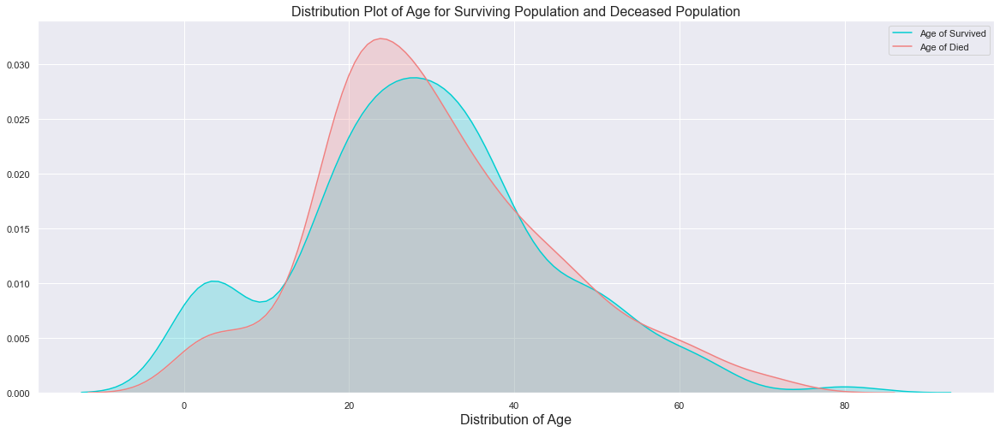

In [74]:
# See the Distribution of "Age" as per the two factors of "Survived" categorical feature
# kdeplot means kernel density plot
fig, ax = subplots(figsize=(20,8))
ax = kdeplot(Titanic_Train["Age"][Titanic_Train.Survived == 1], color="darkturquoise", shade=True)
kdeplot(Titanic_Train["Age"][Titanic_Train.Survived == 0], color="lightcoral", shade=True)
legend(['Age of Survived', 'Age of Died'])
title('Distribution Plot of Age for Surviving Population and Deceased Population', fontsize=16)
ax.set_xlabel('Distribution of Age', fontsize=16)
show()

Text(0, 0.5, 'Probability')

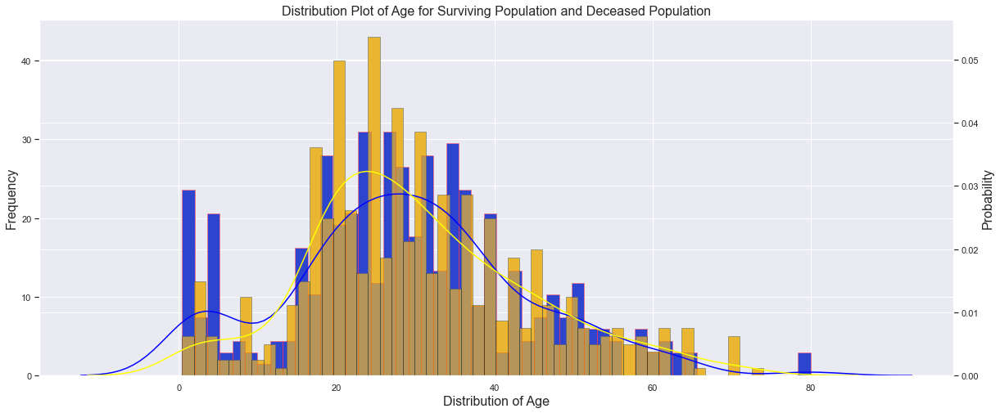

In [75]:
# See the Distribution of "Age" as per the two factors of "Survived" categorical feature
fig, ax = subplots(figsize=(20,8))
ax2 = ax.twinx()
ax.hist(Titanic_Train["Age"][Titanic_Train.Survived == 1], bins=50)
ax.hist(Titanic_Train["Age"][Titanic_Train.Survived == 0], bins=50)
ax2.hist(Titanic_Train["Age"][Titanic_Train.Survived == 1], bins=50, density=True)
ax2.hist(Titanic_Train["Age"][Titanic_Train.Survived == 0], bins=50, density=True)
distplot(Titanic_Train["Age"][Titanic_Train.Survived == 1], hist_kws=dict(edgecolor="Red", linewidth=1), color='Blue', bins=50)
distplot(Titanic_Train["Age"][Titanic_Train.Survived == 0], hist_kws=dict(edgecolor="Black", linewidth=1), color='Yellow', bins=50)
title('Distribution Plot of Age for Surviving Population and Deceased Population', fontsize=16) #Give the Distribution plot Name
ax.set_xlabel('Distribution of Age', fontsize=16) #Give name to the X-axis
ax.set_ylabel('Frequency',fontsize=16)
ax2.set_ylabel('Probability',fontsize=16)

Considering the survival rate of passengers under 16, I'll also include another categorical variable in my dataset: "Minor"

In [76]:
# Creating Minor Category as per "Age" Distribution for both "Survived" category
Titanic_Train['Minor']=where(Titanic_Train['Age']<=16, 1, 0)

Titanic_Test['Minor']=where(Titanic_Test['Age']<=16, 1, 0)

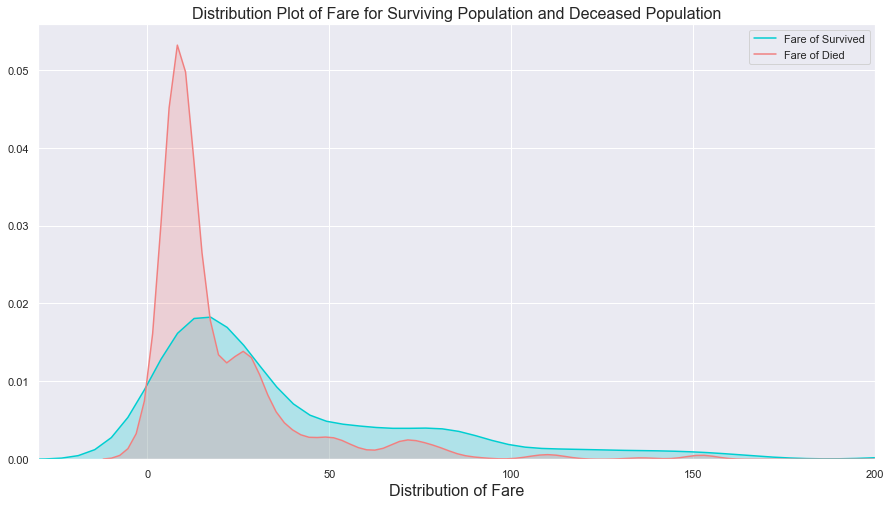

In [77]:
# See the Distribution of "Fare" as per the two factors of "Survived" categorical feature
# kdeplot means kernel density plot
fig, ax = subplots(figsize=(15,8))
ax = kdeplot(Titanic_Train["Fare"][Titanic_Train.Survived == 1], color="darkturquoise", shade=True)
kdeplot(Titanic_Train["Fare"][Titanic_Train.Survived == 0], color="lightcoral", shade=True)
legend(['Fare of Survived', 'Fare of Died'])
title('Distribution Plot of Fare for Surviving Population and Deceased Population', fontsize=16)
ax.set_xlabel('Distribution of Fare', fontsize=16)
xlim(-30,200)
show()

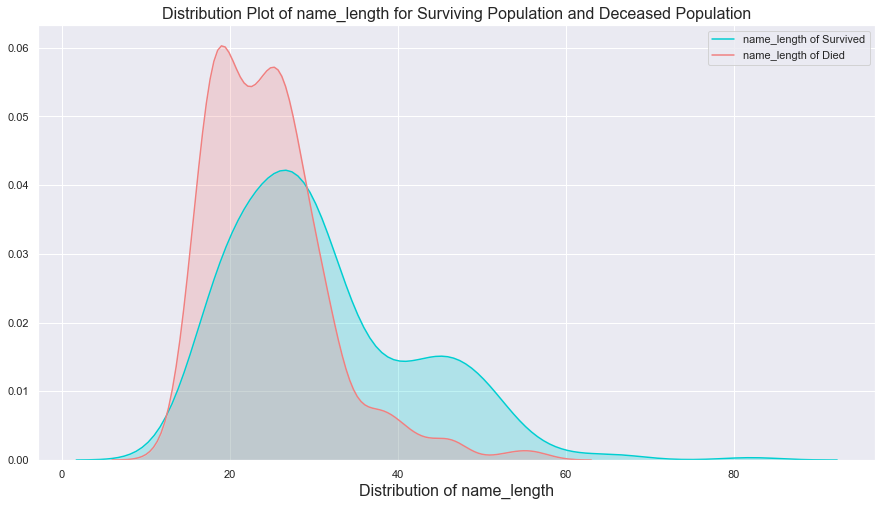

In [78]:
# See the Distribution of "Fare" as per the two factors of "Survived" categorical feature
# kdeplot means kernel density plot
fig, ax = subplots(figsize=(15,8))
ax = kdeplot(Titanic_Train["name_length"][Titanic_Train.Survived == 1], color="darkturquoise", shade=True)
kdeplot(Titanic_Train["name_length"][Titanic_Train.Survived == 0], color="lightcoral", shade=True)
legend(['name_length of Survived', 'name_length of Died'])
title('Distribution Plot of name_length for Surviving Population and Deceased Population', fontsize=16)
ax.set_xlabel('Distribution of name_length', fontsize=16)
show()

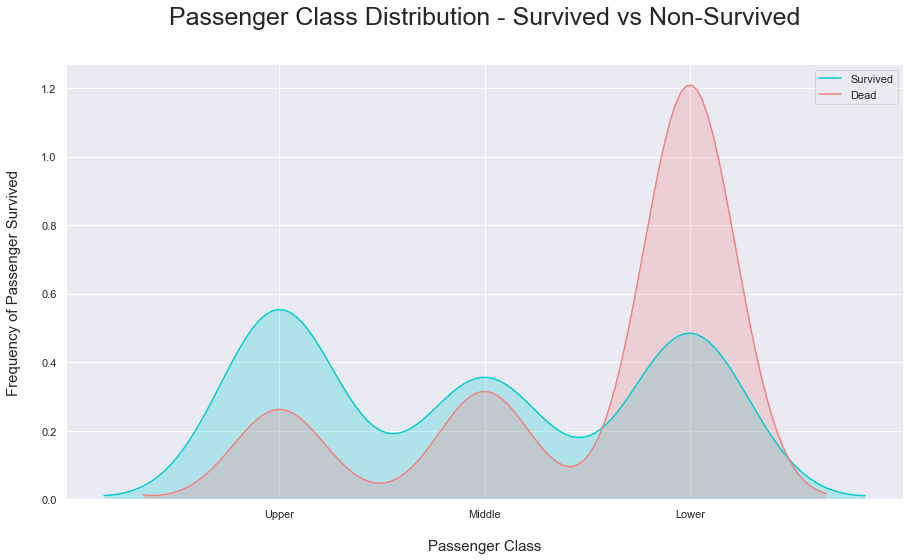

In [79]:
# Kernel Density Plot
fig,ax = subplots(figsize=(15,8))
## I have included to different ways to code a plot below, choose the one that suites you. 
ax=kdeplot(Titanic_Train["Pclass"][Titanic_Train.Survived == 1] , color='darkturquoise', shade=True, label='Survived')
kdeplot(Titanic_Train["Pclass"][Titanic_Train.Survived == 0], color="lightcoral", shade=True, label='Dead')
title('Passenger Class Distribution - Survived vs Non-Survived', fontsize = 25, pad = 40)
ylabel("Frequency of Passenger Survived", fontsize = 15, labelpad = 20)
xlabel("Passenger Class", fontsize = 15,labelpad =20)
## Converting xticks into words for better understanding
labels = ['Upper', 'Middle', 'Lower']
xticks(sorted(Titanic_Train.Pclass.unique()), labels);

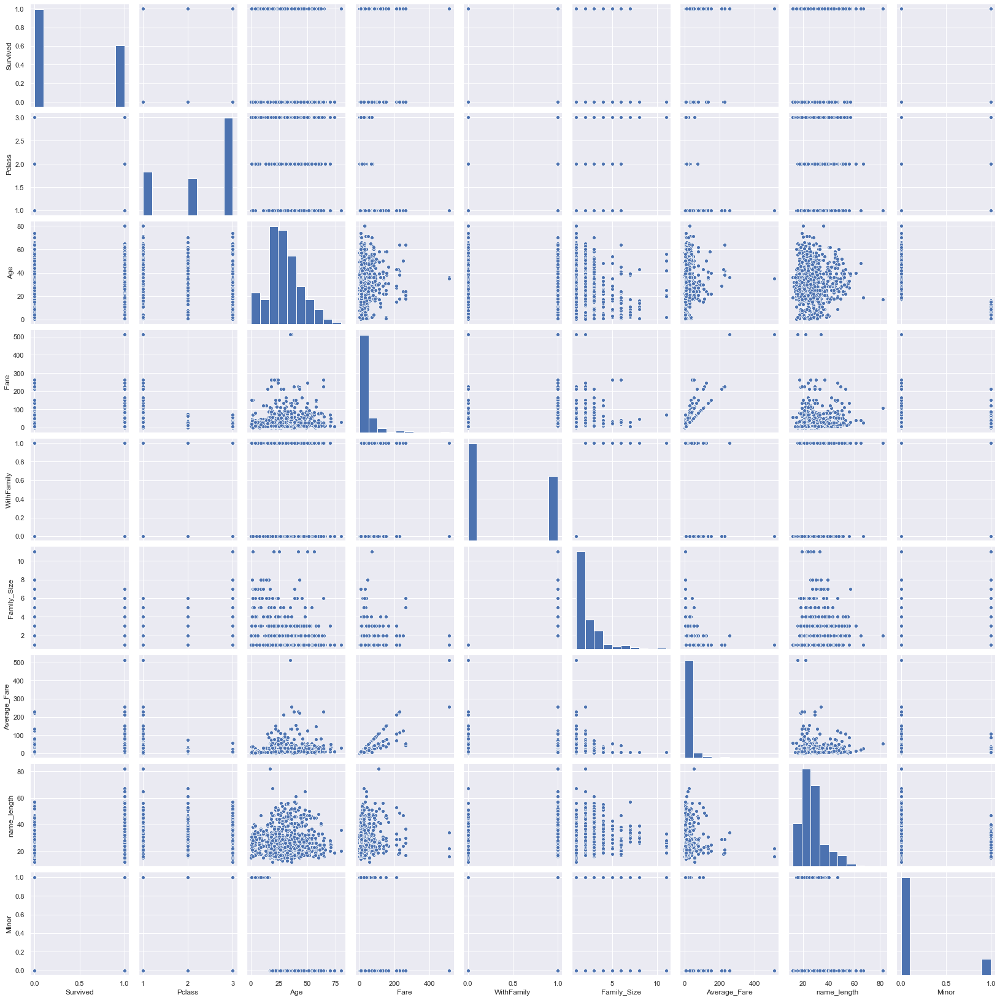

In [80]:
# See the pair plot of Titanic_Train DataFrame
# To plot multiple pairwise bivariate distributions in a dataset, you can use the pairplot() function.
# This creates a matrix of axes and shows the relationship for each pair of columns in a DataFrame.
# By default, it also draws the univariate distribution of each variable on the diagonal Axes:
pairplot(Titanic_Train)
show()

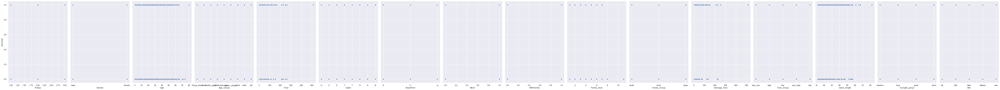

In [81]:
# Visualise the relationship between Each Feature & Label Combination Using Scatterplots
pairplot(Titanic_Train, x_vars=['Pclass','Gender','Age','Age_Group','Fare','Cabin','BoardPort','Minor','WithFamily','Family_Size','Family_Group','Average_Fare','Fare_Group','name_length','nLength_group','title'], y_vars='Survived',height=7, aspect=0.7, kind='scatter')
show()

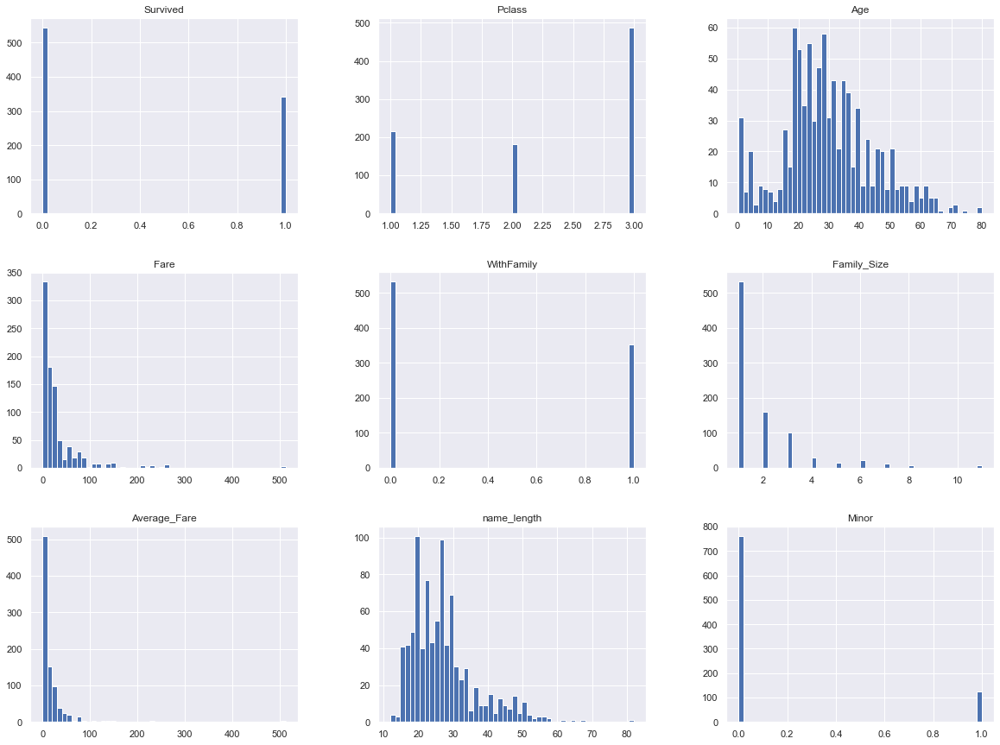

In [82]:
# See the histogram plot of Titanic_Train DataFrame
# Univariate Distribution of Each Variable
Titanic_Train.hist(bins=50, figsize=(20, 15))
show()

# Measures Of Association between Categorical Variables

In [83]:
# Association between "Survived" & "Gender"
# Nominal Dichotomous With Nominal Dichotomous
# Scipy ---> Scientific Python ---> All formulaes related to math and stats to be applied
# Acceptable p-value for my hypothesis is 0.05
# Chi-Square test (Association between two Categorical variables, Nominal With Nominal Or Nominal With Ordinal)
# (Each Variable having multiple level of Factors, 80% cells of Contingency Table Should have expected frequency >= 5)
# (Expected Frequency of Each Cell = [Row Total x Column Total]/Total Sample Size)
# (No Cell Should Have expected frequency < 3)
# (Apply Chi-Square When Sample Size > Total no of Cells x 5)
# (If We Take Square Root of Chi-Square then it will tell the avg difference in each pair point of O-E)
from scipy.stats import chi2_contingency
import researchpy
# from scipy.stats import chisquare
# Contingency table of observed counts
# "Survived" is Response/Dependent Variable
# "Gender" is Explanatory/Independent Variable
ObsTable=researchpy.crosstab(Titanic_Train['Survived'],Titanic_Train['Gender'])
print('ObsTable:-',ObsTable)

# Row Proportion/Percentage
RowProp=researchpy.crosstab(Titanic_Train['Survived'],Titanic_Train['Gender'], prop="row")
print('RowProp:-',RowProp)

# Column Proportion/Percentage
# The Percentages of Response variable for each value of Explanatory variable
# Since the Explanatory variable is "Gender" we would calculate the percentage for each Factor of "Survived" variable Seperately
# Percentage with Respect to Column Total Frequency for each Factor of "Survived" variable
ColProp=researchpy.crosstab(Titanic_Train['Survived'],Titanic_Train['Gender'], prop="col")
print('ColProp:-',ColProp)

# Cell Proportion/Percentage
CellProp=researchpy.crosstab(Titanic_Train['Survived'],Titanic_Train['Gender'], prop="cell")
print('CellProp:-',CellProp)

# Chi-square
# Expected Count = Column Total*Row Total/Table Total
# Degrees of Freedom: (rows-1) * (cols-1)
ObsTable, Chi_Result, ExpTable=researchpy.crosstab(Titanic_Train['Survived'],Titanic_Train['Gender'], test="chi-square", expected_freqs=True)
print("ObsTable:-",ObsTable)
print('ExpTable:-',ExpTable)
print(Chi_Result)

#Finding chi_square critical_value
alpha = 0.05
no_of_rows=2
no_of_columns=2
ddof=(no_of_rows-1)*(no_of_columns-1)
critical_value=chi2.ppf(q=1-alpha,df=ddof) #ppf is percent point function
print('critical_value:-',critical_value)
print('Significance level:-',alpha)

# The G-test (Likelihood-ratio chi-square)
ObsTable, G_Result, ExpTable=researchpy.crosstab(Titanic_Train['Survived'],Titanic_Train['Gender'], test="g-test", expected_freqs=True)
print(G_Result)

# Fisher's Exact Test (for 2x2 table)
ObsTable, Fish_Result, ExpTable=researchpy.crosstab(Titanic_Train['Survived'],Titanic_Train['Gender'], test="fisher", expected_freqs=True)
print(Fish_Result)

# Lambda Coefficient of Correlation
#Gender is Independent Variable
#E1=Ntotal-Nmode
#E2=(Mtotal-Mmode)+(Ftotal-Fmode)
X=np.array([[81,464],[233,109]])
n=len(X)
d=len(X[0])
addZeros=zeros((n,1))
X=append(X, addZeros, axis=1)
X[:,d]=transpose(sum(X, axis=1))
X=append(X, [sum(X, axis=0)], axis=0)
E1=X[2,2]-max(X[2,0],X[2,1],X[0,2],X[1,2])
E2=(X[2,0]-max(X[0,0],X[1,0])) + (X[2,1]-max(X[0,1],X[1,1]))
E1=887-573
E2=(314-233)+(573-464)
Lambda=(E1-E2)/E1
print("Lambda Coefficient of Correlation:- %.3f" % Lambda)

#Pearson's Contingency Coefficient(SQRT(chi2/[N+chi2]))
chiSquare=Chi_Result.iloc[0,1]
N=887
PearsonsContingencyCoefficient=sqrt(chiSquare/[N+chiSquare])
print("Pearson's Contingency Coefficient:- %.3f" % PearsonsContingencyCoefficient)

#Tschuprow's T Measures of Association
ϕ2=Chi_Result.iloc[0,1]/N
TschuprowsT=sqrt(ϕ2/[sqrt(ddof)])
print("Tschuprow's T Measures of Association:- %.3f" % TschuprowsT)

#Cohen's Kappa Coefficient/Inter Range Agreement
from sklearn.metrics import cohen_kappa_score
Gender=Titanic_Train["Gender"].replace({'female':1,'male':0})
cohen_kappa=cohen_kappa_score(Titanic_Train["Survived"],Gender)
print('cohen_kappa:- %.3f' % cohen_kappa)

#Choosing Hypothesis based on Chi-Square Critical_Value & P_Value
chi_square_statistic=Chi_Result.iloc[0,1]
p_value=Chi_Result.iloc[1,1]
if chi_square_statistic>=critical_value:
    print("Alternate Hypothesis (H1) - Survived & Gender have relationship")
else:
    print("Null Hypothesis (H0)- Survived & Gender have no relationship")
    
if p_value<=alpha:
    print("Alternate Hypothesis (H1) - Survived & Gender have relationship")
else:
    print("Null Hypothesis (H0)- Survived & Gender have no relationship")

ObsTable:-          Gender          
Gender   female male  All
Survived                 
0            81  464  545
1           233  109  342
All         314  573  887
RowProp:-          Gender              
Gender   female   male    All
Survived                     
0         14.86  85.14  100.0
1         68.13  31.87  100.0
All       35.40  64.60  100.0
ColProp:-          Gender                
Gender   female    male     All
Survived                       
0          25.8   80.98   61.44
1          74.2   19.02   38.56
All       100.0  100.00  100.00
CellProp:-          Gender               
Gender   female   male     All
Survived                      
0          9.13  52.31   61.44
1         26.27  12.29   38.56
All       35.40  64.60  100.00
ObsTable:-          Gender          
Gender   female male  All
Survived                 
0            81  464  545
1           233  109  342
All         314  573  887
ExpTable:-               Gender            
Gender        female        male


In [84]:
# Finding Strength
DegFree=ddof
Cramers_Phi_Coefficient=Chi_Result.iloc[2,1]
if DegFree == 1:
    if Cramers_Phi_Coefficient < 0.10:
        Correlation = 'negligible'
    elif Cramers_Phi_Coefficient < 0.30:
        Correlation = 'small'
    elif Cramers_Phi_Coefficient < 0.50:
        Correlation = 'medium'
    else:
        Correlation = 'large'
elif DegFree == 2:
    if Cramers_Phi_Coefficient < 0.07:
        Correlation = 'negligible'
    elif Cramers_Phi_Coefficient < 0.21:
        Correlation = 'small'
    elif Cramers_Phi_Coefficient < 0.35:
        Correlation = 'medium'
    else:
        Correlation = 'large'
elif DegFree == 3:
    if Cramers_Phi_Coefficient < 0.06:
        Correlation = 'negligible'
    elif Cramers_Phi_Coefficient < 0.17:
        Correlation = 'small'
    elif Cramers_Phi_Coefficient < 0.29:
        Correlation = 'medium'
    else:
        Correlation = 'large'
elif DegFree == 4:
    if Cramers_Phi_Coefficient < 0.05:
        Correlation = 'negligible'
    elif Cramers_Phi_Coefficient < 0.15:
        Correlation = 'small'
    elif Cramers_Phi_Coefficient < 0.25:
        Correlation = 'medium'
    else:
        Correlation = 'large'
else:
    if Cramers_Phi_Coefficient < 0.05:
        Correlation = 'negligible'
    elif Cramers_Phi_Coefficient < 0.13:
        Correlation = 'small'
    elif Cramers_Phi_Coefficient < 0.22:
        Correlation = 'medium'
    else:
        Correlation = 'large'

Correlation

'large'

D:\D Program Files\Anaconda\lib\site-packages\seaborn\categorical.py:3666: UserWarning: The `factorplot` function has been renamed to `catplot`. The original name will be removed in a future release. Please update your code. Note that the default `kind` in `factorplot` (`'point'`) has changed `'strip'` in `catplot`.
  warnings.warn(msg)


Text(8.96, 0.5, 'Percentage of Survived as per Gender type')

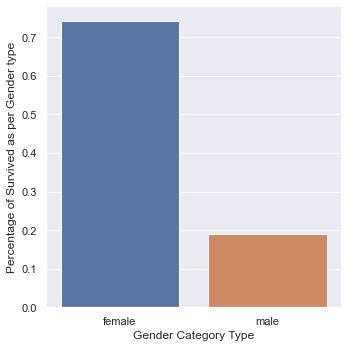

In [85]:
# Set Variable Types
Titanic_Train['Gender'] = Titanic_Train['Gender'].astype('category')
Titanic_Train['Survived'] = to_numeric(Titanic_Train['Survived'])

factorplot(x="Gender", y="Survived", data=Titanic_Train, kind="bar", ci=None)
xlabel('Gender Category Type')
ylabel('Percentage of Survived as per Gender type')

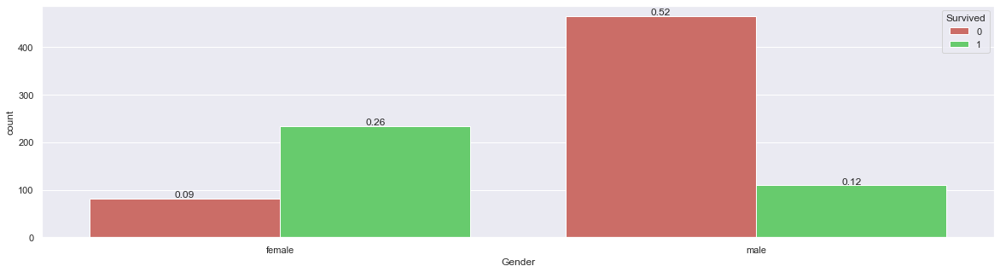

In [86]:
# % of Survived & Not Survived as per each factor of "Gender" Categorical feature
set(style="darkgrid")
set_palette("hls",3) #3 is no of Colours
fig, ax = subplots(figsize=(20,5))
ax = countplot(x="Gender", hue="Survived", data=Titanic_Train)
for p in ax.patches:
    height = p.get_height()
    ax.text(p.get_x()+p.get_width()/2., # 2 indicates centre % placement on bar top
            height + 3, # 3 indicates % placement distance from the Bar Top
            '{:1.2f}'.format(height/Titanic_Train.shape[0]),
            ha="center")

In [87]:
# Adjusted Bonferroni P-Value=0.05/3, 3 is number of Pairs
# The goal is to examine the P-Value for each of the Paired Comparisons and to use the Adjusted Bonferroni P-Value=0.017
# To evaluate significance
ObsTable=crosstab(Titanic_Train['Survived'],Titanic_Train['Gender'])
chiVal, pVal, df, ExpTable = chi2_contingency(ObsTable)
colTotals = ObsTable.sum()
nCols = len(colTotals)
print(nCols, colTotals)

rowTotals = ObsTable.sum(axis=1)
nRows = len(rowTotals)
print(nRows, rowTotals)

n = sum(rowTotals)

phRes = DataFrame(columns=['Survived', 'Gender', 'Adj. Res.'])
for i in range(nRows):
    for j in range(nCols):
        AdjRes = (ObsTable.iloc[i,j] - ExpTable[i,j]) / (ExpTable[i,j]*(1-rowTotals[i]/n)*(1-colTotals[j]/n))**0.5
        phRes = phRes.append({'Survived':ObsTable.index[i], 'Gender':ObsTable.columns[j], 'Adj. Res.':AdjRes}, ignore_index=True)
phRes
#These adjusted residuals are so-called z-values. So we can convert them to corresponding probabilities (p-values / sig.) using the standard normal distribution.
#For this we can use the 'norm.cdf' function from scipy.stats, so lets import that:
#The significance can then be added using:
phRes['Sig.'] = 2*(1-norm.cdf(abs(phRes['Adj. Res.'])))
phRes
#However, since we are doing multiple testing, we would have to adjust our found p-values.
#I'll use the Bonferroni correction, which simply multiplies the found p-value by the number of tests performed:
phRes['Adj. Sig.'] = phRes.shape[0]*phRes['Sig.']
phRes
#Ai, it worked but now some of our adj. sig. are above 1, which is in theory impossible.
#So lets replace those with a 1:
phRes.loc[phRes['Adj. Sig.']> 1, 'Adj. Sig.'] = 1
phRes

2 Gender
female    314
male      573
dtype: int64
2 Survived
0    545
1    342
dtype: int64


,Survived,Gender,Adj. Res.,Sig.,Adj. Sig.
0,0,female,-16.146681,0.0,0.0
1,0,male,16.146681,0.0,0.0
2,1,female,16.146681,0.0,0.0
3,1,male,-16.146681,0.0,0.0


Adjusted Bonferroni P-Value=0.05/4=0.0125,
Check for Adj. Sig. <   0.0125

In [88]:
# Association between "Survived" & "BoardPort"
# Nominal Dichotomous With Nominal 3 Category
# Scipy ---> Scientific Python ---> All formulaes related to math and stats to be applied
# Acceptable p-value for my hypothesis is 0.05
# Chi-Square test (Association between two Categorical variables, Nominal With Nominal Or Nominal With Ordinal)
# (Each Variable having multiple level of Factors, 80% cells of Contingency Table Should have expected frequency >= 5)
# (Expected Frequency of Each Cell = [Row Total x Column Total]/Total Sample Size)
# (No Cell Should Have expected frequency < 3)
# (Apply Chi-Square When Sample Size > Total no of Cells x 5)
# (If We Take Square Root of Chi-Square then it will tell the avg difference in each pair point of O-E)
# from scipy.stats import chisquare
# Contingency table of observed counts
# "Survived" is Response/Dependent Variable
# "BoardPort" is Explanatory/Independent Variable
ObsTable=researchpy.crosstab(Titanic_Train['Survived'],Titanic_Train['BoardPort'])
print('ObsTable:-',ObsTable)

# Row Proportion/Percentage
RowProp=researchpy.crosstab(Titanic_Train['Survived'],Titanic_Train['BoardPort'], prop="row")
print('RowProp:-',RowProp)

# Column Proportion/Percentage
# The Percentages of Response variable for each value of Explanatory variable
# Since the Explanatory variable is "BoardPort" we would calculate the percentage for each Factor of "Survived" variable Seperately
# Percentage with Respect to Column Total Frequency for each Factor of "Survived" variable
ColProp=researchpy.crosstab(Titanic_Train['Survived'],Titanic_Train['BoardPort'], prop="col")
print('ColProp:-',ColProp)

# Cell Proportion/Percentage
CellProp=researchpy.crosstab(Titanic_Train['Survived'],Titanic_Train['BoardPort'], prop="cell")
print('CellProp:-',CellProp)

# Chi-square
# Expected Count = Column Total*Row Total/Table Total
# Degrees of Freedom: (rows-1) * (cols-1)
ObsTable, Chi_Result, ExpTable=researchpy.crosstab(Titanic_Train['Survived'],Titanic_Train['BoardPort'], test="chi-square", expected_freqs=True)
print("ObsTable:-",ObsTable)
print('ExpTable:-',ExpTable)
print(Chi_Result)

#Finding chi_square critical_value
alpha = 0.05
no_of_rows=2
no_of_columns=2
ddof=(no_of_rows-1)*(no_of_columns-1)
critical_value=chi2.ppf(q=1-alpha,df=ddof) #ppf is percent point function
print('critical_value:-',critical_value)
print('Significance level:-',alpha)

# The G-test (Likelihood-ratio chi-square)
ObsTable, G_Result, ExpTable=researchpy.crosstab(Titanic_Train['Survived'],Titanic_Train['BoardPort'], test="g-test", expected_freqs=True)
print(G_Result)

#Pearson's Contingency Coefficient(SQRT(chi2/[N+chi2]))
chiSquare=Chi_Result.iloc[0,1]
N=887
PearsonsContingencyCoefficient=sqrt(chiSquare/[N+chiSquare])
print("Pearson's Contingency Coefficient:- %.3f" % PearsonsContingencyCoefficient)

#Tschuprow's T Measures of Association
ϕ2=Chi_Result.iloc[0,1]/N
TschuprowsT=sqrt(ϕ2/[sqrt(ddof)])
print("Tschuprow's T Measures of Association:- %.3f" % TschuprowsT)

# Lambda Coefficient of Correlation
#E1=Ntotal-Nmode
#E2=(Ctotal-Cmode)+(Qtotal-Qmode)+(Stotal-Smode)
E1=887-640
E2=(170-95)+(77-47)+(640-423)
Lambda=(E1-E2)/E1
print("Lambda Coefficient of Correlation:- %.3f" % Lambda)


#Choosing Hypothesis based on Critical_Value & P_Value
chi_square_statistic=Chi_Result.iloc[0,1]
p_value=Chi_Result.iloc[1,1]
if chi_square_statistic>=critical_value:
    print("Alternate Hypothesis (H1) - Survived & BoardPort have relationship")
else:
    print("Null Hypothesis (H0)- Survived & BoardPort have no relationship")
    
if p_value<=alpha:
    print("Alternate Hypothesis (H1) - Survived & BoardPort have relationship")
else:
    print("Null Hypothesis (H0)- Survived & BoardPort have no relationship")

ObsTable:-           BoardPort              
BoardPort         C   Q    S  All
Survived                         
0                75  47  423  545
1                95  30  217  342
All             170  77  640  887
RowProp:-           BoardPort                    
BoardPort         C     Q      S    All
Survived                               
0             13.76  8.62  77.61  100.0
1             27.78  8.77  63.45  100.0
All           19.17  8.68  72.15  100.0
ColProp:-           BoardPort                        
BoardPort         C       Q       S     All
Survived                                   
0             44.12   61.04   66.09   61.44
1             55.88   38.96   33.91   38.56
All          100.00  100.00  100.00  100.00
CellProp:-           BoardPort                     
BoardPort         C     Q      S     All
Survived                                
0              8.46  5.30  47.69   61.44
1             10.71  3.38  24.46   38.56
All           19.17  8.68  72.15  100.00
ObsT

So, as can be seen from the result, Cramér's V is 0.1737. To classify this, we also need the degrees of freedom. This is simply:

\begin{equation*}
df* = \text{MIN}(r, c) - 1
\end{equation*}

Where $r$ is the number of rows, and $c$ the number of columns.

In [89]:
# Finding Strength
DegFree=ddof
Cramers_V=Chi_Result.iloc[2,1]
if DegFree == 1:
    if Cramers_V < 0.10:
        Correlation = 'negligible'
    elif Cramers_V < 0.30:
        Correlation = 'small'
    elif Cramers_V < 0.50:
        Correlation = 'medium'
    else:
        Correlation = 'large'
elif DegFree == 2:
    if Cramers_V < 0.07:
        Correlation = 'negligible'
    elif Cramers_V < 0.21:
        Correlation = 'small'
    elif Cramers_V < 0.35:
        Correlation = 'medium'
    else:
        Correlation = 'large'
elif DegFree == 3:
    if Cramers_V < 0.06:
        Correlation = 'negligible'
    elif Cramers_V < 0.17:
        Correlation = 'small'
    elif Cramers_V < 0.29:
        Correlation = 'medium'
    else:
        Correlation = 'large'
elif DegFree == 4:
    if Cramers_V < 0.05:
        Correlation = 'negligible'
    elif Cramers_V < 0.15:
        Correlation = 'small'
    elif Cramers_V < 0.25:
        Correlation = 'medium'
    else:
        Correlation = 'large'
else:
    if Cramers_V < 0.05:
        Correlation = 'negligible'
    elif Cramers_V < 0.13:
        Correlation = 'small'
    elif Cramers_V < 0.22:
        Correlation = 'medium'
    else:
        Correlation = 'large'

Correlation

'small'

D:\D Program Files\Anaconda\lib\site-packages\seaborn\categorical.py:3666: UserWarning: The `factorplot` function has been renamed to `catplot`. The original name will be removed in a future release. Please update your code. Note that the default `kind` in `factorplot` (`'point'`) has changed `'strip'` in `catplot`.
  warnings.warn(msg)


Text(8.96, 0.5, 'Percentage of Survived as per BoardPort type')

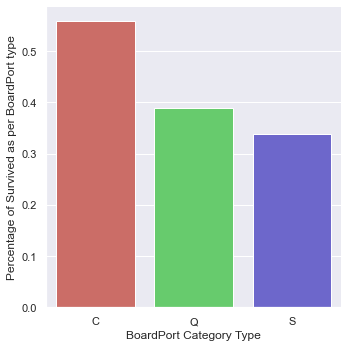

In [90]:
# Set Variable Types
Titanic_Train['BoardPort'] = Titanic_Train['BoardPort'].astype('category')
Titanic_Train['Survived'] = to_numeric(Titanic_Train['Survived'])

factorplot(x="BoardPort", y="Survived", data=Titanic_Train, kind="bar", ci=None)
xlabel('BoardPort Category Type')
ylabel('Percentage of Survived as per BoardPort type')

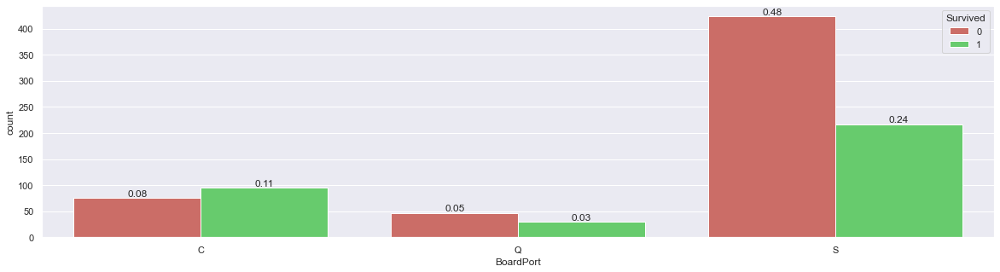

In [91]:
# % of Survived & Not Survived as per each factor of "BoardPort" Categorical feature
set(style="darkgrid")
set(style="darkgrid")
set_palette("hls",3) #3 is no of Colours
fig, ax = subplots(figsize=(20,5))
ax = countplot(x="BoardPort", hue="Survived", data=Titanic_Train)
for p in ax.patches:
    height = p.get_height()
    ax.text(p.get_x()+p.get_width()/2., # 2 indicates centre % placement on bar top
            height + 3, # 3 indicates % placement distance from the Bar Top
            '{:1.2f}'.format(height/Titanic_Train.shape[0]),
            ha="center")

When the Explanatory variable has more the 2 factors the Chi-Square Statistic and Associated P-Vale do
Not Provide insight into why the Null Hypothesis can be rejected.
It doesn't tell us what way the rates of "Survived" are not equal across the "BoardPort" Category Factors
It doesn't tell us which Factor/Factors of "BoardPort" Feature causes the Rejection of Null Hypothesis
To determine which Factor/Factors of "BoardPort" are different from others, we again need to perform a Post-HOC test
By conducting Post-HOC comparisons between Pairs of "BoardPort" Factors in a way that avoids excessive type-1 error
in other words avoids rejecting the Null Hypothesis, when Null Hypothesis is True. We will be much better able to appropriately describe which Factors of "BoardPort" are different from others. If we Reject the Null Hypothesis, we need to perform comparisons for each pair of "BoardPort" Factors & there will 3 pairwise comparisons (3C2).

The post-hoc test used in this documentation looks at every cell, and checks if the observed counts are significantly different from the expected counts for that cell. This is done by calculating the adjusted residuals for each cell with the formula:

\begin{equation*}
AR_{i,j} = \frac{O_{i,j}-E_{i,j}}{\sqrt{E_{i,j}\times\left(1-\frac{R_i}{n}\right)\left(1-\frac{C_j}{n}\right)}}
\end{equation*}

In this formula $AR_{i,j}$ is the adjusted residuals, for the cell with row i and column j. $O_{i,j}$ are the observed counts, and $E_{i,j}$ the expected counts. We already have both of these.

The $R_i$ are the row totals and $C_j$ the column totals. So lets get those, and also for later the number of rows and the number of columns. The $n$ is the total number of cases, so we can use either the sum of the row totals, or the sum of the column totals, since this should be the same.

In [92]:
# Adjusted Bonferroni P-Value=0.05/3, 3 is number of Pairs
# The goal is to examine the P-Value for each of the Paired Comparisons and to use the Adjusted Bonferroni P-Value=0.017
# To evaluate significance
ObsTable=crosstab(Titanic_Train['Survived'],Titanic_Train['BoardPort'])
chiVal, pVal, df, ExpTable = chi2_contingency(ObsTable)
colTotals = ObsTable.sum()
nCols = len(colTotals)
print(nCols, colTotals)

rowTotals = ObsTable.sum(axis=1)
nRows = len(rowTotals)
print(nRows, rowTotals)

n = sum(rowTotals)

phRes = DataFrame(columns=['Survived', 'BoardPort', 'Adj. Res.'])
for i in range(nRows):
    for j in range(nCols):
        AdjRes = (ObsTable.iloc[i,j] - ExpTable[i,j]) / (ExpTable[i,j]*(1-rowTotals[i]/n)*(1-colTotals[j]/n))**0.5
        phRes = phRes.append({'Survived':ObsTable.index[i], 'BoardPort':ObsTable.columns[j], 'Adj. Res.':AdjRes}, ignore_index=True)
phRes
#These adjusted residuals are so-called z-values. So we can convert them to corresponding probabilities (p-values / sig.) using the standard normal distribution.
#For this we can use the 'norm.cdf' function from scipy.stats, so lets import that:
#The significance can then be added using:
phRes['Sig.'] = 2*(1-norm.cdf(abs(phRes['Adj. Res.'])))
phRes
#However, since we are doing multiple testing, we would have to adjust our found p-values.
#I'll use the Bonferroni correction, which simply multiplies the found p-value by the number of tests performed:
phRes['Adj. Sig.'] = phRes.shape[0]*phRes['Sig.']
phRes
#Ai, it worked but now some of our adj. sig. are above 1, which is in theory impossible.
#So lets replace those with a 1:
phRes.loc[phRes['Adj. Sig.']> 1, 'Adj. Sig.'] = 1
phRes

3 BoardPort
C    170
Q     77
S    640
dtype: int64
2 Survived
0    545
1    342
dtype: int64


,Survived,BoardPort,Adj. Res.,Sig.,Adj. Sig.
0,0,C,-5.162057,2.442513e-07,0.000001
1,0,Q,-0.076238,9.392297e-01,1.000000
2,0,S,4.580706,4.634089e-06,0.000028
3,1,C,5.162057,2.442513e-07,0.000001
4,1,Q,0.076238,9.392297e-01,1.000000
5,1,S,-4.580706,4.634089e-06,0.000028


These adjusted residuals are so-called z-values. So we can convert them to corresponding probabilities (p-values / sig.) using the standard normal distribution. For this we can use the 'norm.cdf' function from scipy.stats, so lets import that:

The significance can then be added using:
Adjusted Bonferroni P-Value=0.05/6=0.0083,
Check for Adj. Sig. <   0.0083

In [93]:
# Association between "Survived" & "WithFamily"
# Nominal Dichotomous With Nominal Dichotomous
# Scipy ---> Scientific Python ---> All formulaes related to math and stats to be applied
# Acceptable p-value for my hypothesis is 0.05
# Chi-Square test (Association between two Categorical variables, Nominal With Nominal Or Nominal With Ordinal)
# (Each Variable having multiple level of Factors, 80% cells of Contingency Table Should have expected frequency >= 5)
# (Expected Frequency of Each Cell = [Row Total x Column Total]/Total Sample Size)
# (No Cell Should Have expected frequency < 3)
# (Apply Chi-Square When Sample Size > Total no of Cells x 5)
# (If We Take Square Root of Chi-Square then it will tell the avg difference in each pair point of O-E)
from scipy.stats import chi2_contingency
import researchpy
# from scipy.stats import chisquare
# Contingency table of observed counts
# "Survived" is Response/Dependent Variable
# "WithFamily" is Explanatory/Independent Variable
ObsTable=researchpy.crosstab(Titanic_Train['Survived'],Titanic_Train['WithFamily'])
print('ObsTable:-',ObsTable)

# Row Proportion/Percentage
RowProp=researchpy.crosstab(Titanic_Train['Survived'],Titanic_Train['WithFamily'], prop="row")
print('RowProp:-',RowProp)

# Column Proportion/Percentage
# The Percentages of Response variable for each value of Explanatory variable
# Since the Explanatory variable is "WithFamily" we would calculate the percentage for each Factor of "Survived" variable Seperately
# Percentage with Respect to Column Total Frequency for each Factor of "Survived" variable
ColProp=researchpy.crosstab(Titanic_Train['Survived'],Titanic_Train['WithFamily'], prop="col")
print('ColProp:-',ColProp)

# Cell Proportion/Percentage
CellProp=researchpy.crosstab(Titanic_Train['Survived'],Titanic_Train['WithFamily'], prop="cell")
print('CellProp:-',CellProp)

# Chi-square
# Expected Count = Column Total*Row Total/Table Total
# Degrees of Freedom: (rows-1) * (cols-1)
ObsTable, Chi_Result, ExpTable=researchpy.crosstab(Titanic_Train['Survived'],Titanic_Train['WithFamily'], test="chi-square", expected_freqs=True)
print("ObsTable:-",ObsTable)
print('ExpTable:-',ExpTable)
print(Chi_Result)

#Finding chi_square critical_value
alpha = 0.05
no_of_rows=2
no_of_columns=2
ddof=(no_of_rows-1)*(no_of_columns-1)
critical_value=chi2.ppf(q=1-alpha,df=ddof) #ppf is percent point function
print('critical_value:-',critical_value)
print('Significance level:-',alpha)

# The G-test (Likelihood-ratio chi-square)
ObsTable, G_Result, ExpTable=researchpy.crosstab(Titanic_Train['Survived'],Titanic_Train['WithFamily'], test="g-test", expected_freqs=True)
print(G_Result)

# Fisher's Exact Test (for 2x2 table)
ObsTable, Fish_Result, ExpTable=researchpy.crosstab(Titanic_Train['Survived'],Titanic_Train['WithFamily'], test="fisher", expected_freqs=True)
print(Fish_Result)

# Lambda Coefficient of Correlation
#WithFamily is Independent Variable
#E1=Ntotal-Nmode
#E2=(Mtotal-Mmode)+(Ftotal-Fmode)
X=np.array([[370,175],[163,179]])
n=len(X)
d=len(X[0])
addZeros=zeros((n,1))
X=append(X, addZeros, axis=1)
X[:,d]=transpose(sum(X, axis=1))
X=append(X, [sum(X, axis=0)], axis=0)
E1=X[2,2]-max(X[2,0],X[2,1],X[0,2],X[1,2])
E2=(X[2,0]-max(X[0,0],X[1,0])) + (X[2,1]-max(X[0,1],X[1,1]))
E1=887-545
E2=(533-370)+(354-179)
Lambda=(E1-E2)/E1
print("Lambda Coefficient of Correlation:- %.3f" % Lambda)

#Pearson's Contingency Coefficient(SQRT(chi2/[N+chi2]))
chiSquare=Chi_Result.iloc[0,1]
N=887
PearsonsContingencyCoefficient=sqrt(chiSquare/[N+chiSquare])
print("Pearson's Contingency Coefficient:- %.3f" % PearsonsContingencyCoefficient)

#Tschuprow's T Measures of Association
ϕ2=Chi_Result.iloc[0,1]/N
TschuprowsT=sqrt(ϕ2/[sqrt(ddof)])
print("Tschuprow's T Measures of Association:- %.3f" % TschuprowsT)

#Cohen's Kappa Coefficient/Inter Range Agreement
from sklearn.metrics import cohen_kappa_score
cohen_kappa=cohen_kappa_score(Titanic_Train["Survived"],Titanic_Train["WithFamily"])
print('cohen_kappa:- %.3f' % cohen_kappa)

#Choosing Hypothesis based on Chi-Square Critical_Value & P_Value
chi_square_statistic=Chi_Result.iloc[0,1]
p_value=Chi_Result.iloc[1,1]
if chi_square_statistic>=critical_value:
    print("Alternate Hypothesis (H1) - Survived & WithFamily have relationship")
else:
    print("Null Hypothesis (H0)- Survived & WithFamily have no relationship")
    
if p_value<=alpha:
    print("Alternate Hypothesis (H1) - Survived & WithFamily have relationship")
else:
    print("Null Hypothesis (H0)- Survived & WithFamily have no relationship")

ObsTable:-            WithFamily          
WithFamily          0    1  All
Survived                       
0                 370  175  545
1                 163  179  342
All               533  354  887
RowProp:-            WithFamily              
WithFamily          0      1    All
Survived                           
0               67.89  32.11  100.0
1               47.66  52.34  100.0
All             60.09  39.91  100.0
ColProp:-            WithFamily                
WithFamily          0       1     All
Survived                             
0               69.42   49.44   61.44
1               30.58   50.56   38.56
All            100.00  100.00  100.00
CellProp:-            WithFamily               
WithFamily          0      1     All
Survived                            
0               41.71  19.73   61.44
1               18.38  20.18   38.56
All             60.09  39.91  100.00
ObsTable:-            WithFamily          
WithFamily          0    1  All
Survived                 

In [94]:
# Finding Strength
DegFree=ddof
Cramers_Phi_Coefficient=Chi_Result.iloc[2,1]
if DegFree == 1:
    if Cramers_Phi_Coefficient < 0.10:
        Correlation = 'negligible'
    elif Cramers_Phi_Coefficient < 0.30:
        Correlation = 'small'
    elif Cramers_Phi_Coefficient < 0.50:
        Correlation = 'medium'
    else:
        Correlation = 'large'
elif DegFree == 2:
    if Cramers_Phi_Coefficient < 0.07:
        Correlation = 'negligible'
    elif Cramers_Phi_Coefficient < 0.21:
        Correlation = 'small'
    elif Cramers_Phi_Coefficient < 0.35:
        Correlation = 'medium'
    else:
        Correlation = 'large'
elif DegFree == 3:
    if Cramers_Phi_Coefficient < 0.06:
        Correlation = 'negligible'
    elif Cramers_Phi_Coefficient < 0.17:
        Correlation = 'small'
    elif Cramers_Phi_Coefficient < 0.29:
        Correlation = 'medium'
    else:
        Correlation = 'large'
elif DegFree == 4:
    if Cramers_Phi_Coefficient < 0.05:
        Correlation = 'negligible'
    elif Cramers_Phi_Coefficient < 0.15:
        Correlation = 'small'
    elif Cramers_Phi_Coefficient < 0.25:
        Correlation = 'medium'
    else:
        Correlation = 'large'
else:
    if Cramers_Phi_Coefficient < 0.05:
        Correlation = 'negligible'
    elif Cramers_Phi_Coefficient < 0.13:
        Correlation = 'small'
    elif Cramers_Phi_Coefficient < 0.22:
        Correlation = 'medium'
    else:
        Correlation = 'large'

Correlation

'small'

D:\D Program Files\Anaconda\lib\site-packages\seaborn\categorical.py:3666: UserWarning: The `factorplot` function has been renamed to `catplot`. The original name will be removed in a future release. Please update your code. Note that the default `kind` in `factorplot` (`'point'`) has changed `'strip'` in `catplot`.
  warnings.warn(msg)


Text(8.96, 0.5, 'Percentage of Survived as per WithFamily type')

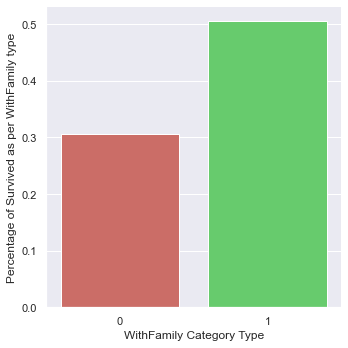

In [95]:
# Set Variable Types
Titanic_Train['WithFamily'] = Titanic_Train['WithFamily'].astype('category')
Titanic_Train['Survived'] = to_numeric(Titanic_Train['Survived'])

factorplot(x="WithFamily", y="Survived", data=Titanic_Train, kind="bar", ci=None)
xlabel('WithFamily Category Type')
ylabel('Percentage of Survived as per WithFamily type')

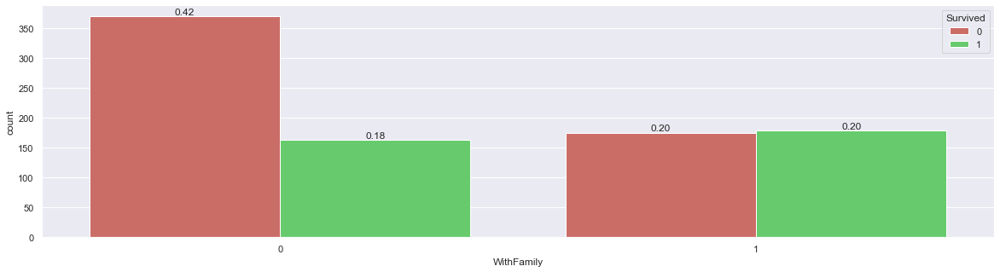

In [96]:
# % of Survived & Not Survived as per each factor of "WithFamily" Categorical feature
set(style="darkgrid")
set_palette("hls",3) #3 is no of Colours
fig, ax = subplots(figsize=(20,5))
ax = countplot(x="WithFamily", hue="Survived", data=Titanic_Train)
for p in ax.patches:
    height = p.get_height()
    ax.text(p.get_x()+p.get_width()/2., # 2 indicates centre % placement on bar top
            height + 3, # 3 indicates % placement distance from the Bar Top
            '{:1.2f}'.format(height/Titanic_Train.shape[0]),
            ha="center")

In [97]:
# Adjusted Bonferroni P-Value=0.05/3, 3 is number of Pairs
# The goal is to examine the P-Value for each of the Paired Comparisons and to use the Adjusted Bonferroni P-Value=0.017
# To evaluate significance
ObsTable=crosstab(Titanic_Train['Survived'],Titanic_Train['WithFamily'])
chiVal, pVal, df, ExpTable = chi2_contingency(ObsTable)
colTotals = ObsTable.sum()
nCols = len(colTotals)
print(nCols, colTotals)

rowTotals = ObsTable.sum(axis=1)
nRows = len(rowTotals)
print(nRows, rowTotals)

n = sum(rowTotals)

phRes = DataFrame(columns=['Survived', 'WithFamily', 'Adj. Res.'])
for i in range(nRows):
    for j in range(nCols):
        AdjRes = (ObsTable.iloc[i,j] - ExpTable[i,j]) / (ExpTable[i,j]*(1-rowTotals[i]/n)*(1-colTotals[j]/n))**0.5
        phRes = phRes.append({'Survived':ObsTable.index[i], 'WithFamily':ObsTable.columns[j], 'Adj. Res.':AdjRes}, ignore_index=True)
phRes
#These adjusted residuals are so-called z-values. So we can convert them to corresponding probabilities (p-values / sig.) using the standard normal distribution.
#For this we can use the 'norm.cdf' function from scipy.stats, so lets import that:
#The significance can then be added using:
phRes['Sig.'] = 2*(1-norm.cdf(abs(phRes['Adj. Res.'])))
phRes
#However, since we are doing multiple testing, we would have to adjust our found p-values.
#I'll use the Bonferroni correction, which simply multiplies the found p-value by the number of tests performed:
phRes['Adj. Sig.'] = phRes.shape[0]*phRes['Sig.']
phRes
#Ai, it worked but now some of our adj. sig. are above 1, which is in theory impossible.
#So lets replace those with a 1:
phRes.loc[phRes['Adj. Sig.']> 1, 'Adj. Sig.'] = 1
phRes

2 WithFamily
0    533
1    354
dtype: int64
2 Survived
0    545
1    342
dtype: int64


,Survived,WithFamily,Adj. Res.,Sig.,Adj. Sig.
0,0.0,0.0,5.988033,2.123934e-09,8.495737e-09
1,0.0,1.0,-5.988033,2.123934e-09,8.495737e-09
2,1.0,0.0,-5.988033,2.123934e-09,8.495737e-09
3,1.0,1.0,5.988033,2.123934e-09,8.495737e-09


Adjusted Bonferroni P-Value=0.05/4=0.0125,
Check for Adj. Sig. <   0.0125

In [98]:
# Association between "Survived" & "Pclass"
# Nominal Dichotomous With Ordinal Pclass
# Scipy ---> Scientific Python ---> All formulaes related to math and stats to be applied
# Acceptable p-value for my hypothesis is 0.05
# Chi-Square test (Association between two Categorical variables, Nominal With Nominal Or Nominal With Ordinal)
# (Each Variable having multiple level of Factors, 80% cells of Contingency Table Should have expected frequency >= 5)
# (Expected Frequency of Each Cell = [Row Total x Column Total]/Total Sample Size)
# (No Cell Should Have expected frequency < 3)
# (Apply Chi-Square When Sample Size > Total no of Cells x 5)
# (If We Take Square Root of Chi-Square then it will tell the avg difference in each pair point of O-E)
# from scipy.stats import chisquare
# Contingency table of observed counts
# "Survived" is Response/Dependent Variable
# "Pclass" is Explanatory/Independent Variable
ObsTable=researchpy.crosstab(Titanic_Train['Survived'],Titanic_Train['Pclass'])
print('ObsTable:-',ObsTable)

# Row Proportion/Percentage
RowProp=researchpy.crosstab(Titanic_Train['Survived'],Titanic_Train['Pclass'], prop="row")
print('RowProp:-',RowProp)

# Column Proportion/Percentage
# The Percentages of Response variable for each value of Explanatory variable
# Since the Explanatory variable is "Pclass" we would calculate the percentage for each Factor of "Survived" variable Seperately
# Percentage with Respect to Column Total Frequency for each Factor of "Survived" variable
ColProp=researchpy.crosstab(Titanic_Train['Survived'],Titanic_Train['Pclass'], prop="col")
print('ColProp:-',ColProp)

# Cell Proportion/Percentage
CellProp=researchpy.crosstab(Titanic_Train['Survived'],Titanic_Train['Pclass'], prop="cell")
print('CellProp:-',CellProp)

# Chi-square
# Expected Count = Column Total*Row Total/Table Total
# Degrees of Freedom: (rows-1) * (cols-1)
ObsTable, Chi_Result, ExpTable=researchpy.crosstab(Titanic_Train['Survived'],Titanic_Train['Pclass'], test="chi-square", expected_freqs=True)
print("ObsTable:-",ObsTable)
print('ExpTable:-',ExpTable)
print(Chi_Result)

#Finding chi_square critical_value
alpha = 0.05
no_of_rows=2
no_of_columns=2
ddof=(no_of_rows-1)*(no_of_columns-1)
critical_value=chi2.ppf(q=1-alpha,df=ddof) #ppf is percent point function
print('critical_value:-',critical_value)
print('Significance level:-',alpha)

# The G-test (Likelihood-ratio chi-square)
ObsTable, G_Result, ExpTable=researchpy.crosstab(Titanic_Train['Survived'],Titanic_Train['Pclass'], test="g-test", expected_freqs=True)
print(G_Result)

#Pearson's Contingency Coefficient(SQRT(chi2/[N+chi2]))
chiSquare=Chi_Result.iloc[0,1]
N=887
PearsonsContingencyCoefficient=sqrt(chiSquare/[N+chiSquare])
print("Pearson's Contingency Coefficient:- %.3f" % PearsonsContingencyCoefficient)

#Tschuprow's T Measures of Association
ϕ2=Chi_Result.iloc[0,1]/N
TschuprowsT=sqrt(ϕ2/[sqrt(ddof)])
print("Tschuprow's T Measures of Association:- %.3f" % TschuprowsT)

# Lambda Coefficient of Correlation
#E1=Ntotal-Nmode
#E2=(Ctotal-Cmode)+(Qtotal-Qmode)+(Stotal-Smode)
E1=887-545
E2=(216-136)+(183-96)+(488-369)
Lambda=(E1-E2)/E1
print("Lambda Coefficient of Correlation:- %.3f" % Lambda)


#Choosing Hypothesis based on Chi-Square Critical_Value & P_Value
chi_square_statistic=Chi_Result.iloc[0,1]
p_value=Chi_Result.iloc[1,1]
if chi_square_statistic>=critical_value:
    print("Alternate Hypothesis (H1) - Survived & Pclass have relationship")
else:
    print("Null Hypothesis (H0)- Survived & Pclass have no relationship")
    
if p_value<=alpha:
    print("Alternate Hypothesis (H1) - Survived & Pclass have relationship")
else:
    print("Null Hypothesis (H0)- Survived & Pclass have no relationship")

ObsTable:-          Pclass               
Pclass        1    2    3  All
Survived                      
0            80   96  369  545
1           136   87  119  342
All         216  183  488  887
RowProp:-          Pclass                     
Pclass        1      2      3    All
Survived                            
0         14.68  17.61  67.71  100.0
1         39.77  25.44  34.80  100.0
All       24.35  20.63  55.02  100.0
ColProp:-           Pclass                        
Pclass         1       2       3     All
Survived                                
0          37.04   52.46   75.61   61.44
1          62.96   47.54   24.39   38.56
All       100.00  100.00  100.00  100.00
CellProp:-          Pclass                      
Pclass        1      2      3     All
Survived                             
0          9.02  10.82  41.60   61.44
1         15.33   9.81  13.42   38.56
All       24.35  20.63  55.02  100.00
ObsTable:-          Pclass               
Pclass        1    2    3  All
Sur

In [99]:
# Finding Strength
DegFree=ddof
Cramers_V=Chi_Result.iloc[2,1]
if DegFree == 1:
    if Cramers_V < 0.10:
        Correlation = 'negligible'
    elif Cramers_V < 0.30:
        Correlation = 'small'
    elif Cramers_V < 0.50:
        Correlation = 'medium'
    else:
        Correlation = 'large'
elif DegFree == 2:
    if Cramers_V < 0.07:
        Correlation = 'negligible'
    elif Cramers_V < 0.21:
        Correlation = 'small'
    elif Cramers_V < 0.35:
        Correlation = 'medium'
    else:
        Correlation = 'large'
elif DegFree == 3:
    if Cramers_V < 0.06:
        Correlation = 'negligible'
    elif Cramers_V < 0.17:
        Correlation = 'small'
    elif Cramers_V < 0.29:
        Correlation = 'medium'
    else:
        Correlation = 'large'
elif DegFree == 4:
    if Cramers_V < 0.05:
        Correlation = 'negligible'
    elif Cramers_V < 0.15:
        Correlation = 'small'
    elif Cramers_V < 0.25:
        Correlation = 'medium'
    else:
        Correlation = 'large'
else:
    if Cramers_V < 0.05:
        Correlation = 'negligible'
    elif Cramers_V < 0.13:
        Correlation = 'small'
    elif Cramers_V < 0.22:
        Correlation = 'medium'
    else:
        Correlation = 'large'

Correlation

'medium'

D:\D Program Files\Anaconda\lib\site-packages\seaborn\categorical.py:3666: UserWarning: The `factorplot` function has been renamed to `catplot`. The original name will be removed in a future release. Please update your code. Note that the default `kind` in `factorplot` (`'point'`) has changed `'strip'` in `catplot`.
  warnings.warn(msg)


Text(8.96, 0.5, 'Percentage of Survived as per Pclass type')

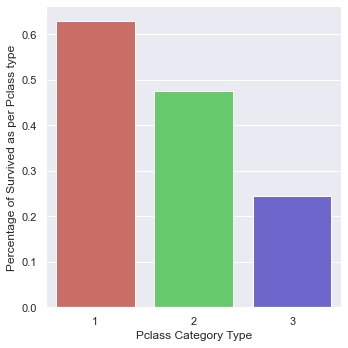

In [100]:
# Set Variable Types
Titanic_Train['Pclass'] = Titanic_Train['Pclass'].astype('category')
Titanic_Train['Survived'] = to_numeric(Titanic_Train['Survived'])

factorplot(x="Pclass", y="Survived", data=Titanic_Train, kind="bar", ci=None)
xlabel('Pclass Category Type')
ylabel('Percentage of Survived as per Pclass type')

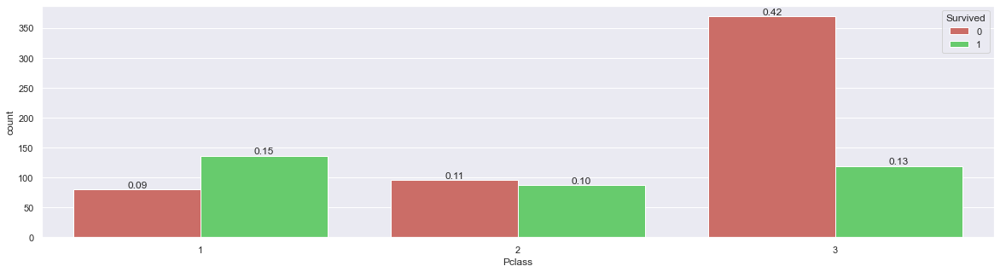

In [101]:
# % of Survived & Not Survived as per each factor of "Pclass" Categorical feature
set(style="darkgrid")
set_palette("hls",3) #3 is no of Colours
fig, ax = subplots(figsize=(20,5))
ax = countplot(x="Pclass", hue="Survived", data=Titanic_Train)
for p in ax.patches:
    height = p.get_height()
    ax.text(p.get_x()+p.get_width()/2., # 2 indicates centre % placement on bar top
            height + 3, # 3 indicates % placement distance from the Bar Top
            '{:1.2f}'.format(height/Titanic_Train.shape[0]),
            ha="center")

In [102]:
# Adjusted Bonferroni P-Value=0.05/3, 3 is number of Pairs
# The goal is to examine the P-Value for each of the Paired Comparisons and to use the Adjusted Bonferroni P-Value=0.017
# To evaluate significance
ObsTable=crosstab(Titanic_Train['Survived'],Titanic_Train['Pclass'])
chiVal, pVal, df, ExpTable = chi2_contingency(ObsTable)
colTotals = ObsTable.sum()
nCols = len(colTotals)
print(nCols, colTotals)

rowTotals = ObsTable.sum(axis=1)
nRows = len(rowTotals)
print(nRows, rowTotals)

n = sum(rowTotals)

phRes = DataFrame(columns=['Survived', 'Pclass', 'Adj. Res.'])
for i in range(nRows):
    for j in range(nCols):
        AdjRes = (ObsTable.iloc[i,j] - ExpTable[i,j]) / (ExpTable[i,j]*(1-rowTotals[i]/n)*(1-colTotals[j]/n))**0.5
        phRes = phRes.append({'Survived':ObsTable.index[i], 'Pclass':ObsTable.columns[j], 'Adj. Res.':AdjRes}, ignore_index=True)
phRes
#These adjusted residuals are so-called z-values. So we can convert them to corresponding probabilities (p-values / sig.) using the standard normal distribution.
#For this we can use the 'norm.cdf' function from scipy.stats, so lets import that:
#The significance can then be added using:
phRes['Sig.'] = 2*(1-norm.cdf(abs(phRes['Adj. Res.'])))
phRes
#However, since we are doing multiple testing, we would have to adjust our found p-values.
#I'll use the Bonferroni correction, which simply multiplies the found p-value by the number of tests performed:
phRes['Adj. Sig.'] = phRes.shape[0]*phRes['Sig.']
phRes
#Ai, it worked but now some of our adj. sig. are above 1, which is in theory impossible.
#So lets replace those with a 1:
phRes.loc[phRes['Adj. Sig.']> 1, 'Adj. Sig.'] = 1
phRes

3 Pclass
1    216
2    183
3    488
dtype: int64
2 Survived
0    545
1    342
dtype: int64


,Survived,Pclass,Adj. Res.,Sig.,Adj. Sig.
0,0.0,1.0,-8.472993,0.000000,0.000000
1,0.0,2.0,-2.802757,0.005067,0.030401
2,0.0,3.0,9.590012,0.000000,0.000000
3,1.0,1.0,8.472993,0.000000,0.000000
4,1.0,2.0,2.802757,0.005067,0.030401
5,1.0,3.0,-9.590012,0.000000,0.000000


Adjusted Bonferroni P-Value=0.05/6=0.0083, Check for Adj. Sig. < 0.0083

In [103]:
# Association between "Survived" & "Minor"
# Nominal Dichotomous With Nominal Dichotomous
# Scipy ---> Scientific Python ---> All formulaes related to math and stats to be applied
# Acceptable p-value for my hypothesis is 0.05
# Chi-Square test (Association between two Categorical variables, Nominal With Nominal Or Nominal With Ordinal)
# (Each Variable having multiple level of Factors, 80% cells of Contingency Table Should have expected frequency >= 5)
# (Expected Frequency of Each Cell = [Row Total x Column Total]/Total Sample Size)
# (No Cell Should Have expected frequency < 3)
# (Apply Chi-Square When Sample Size > Total no of Cells x 5)
# (If We Take Square Root of Chi-Square then it will tell the avg difference in each pair point of O-E)
# from scipy.stats import chisquare
# Contingency table of observed counts
# "Survived" is Response/Dependent Variable
# "Minor" is Explanatory/Independent Variable
ObsTable=researchpy.crosstab(Titanic_Train['Survived'],Titanic_Train['Minor'])
print('ObsTable:-',ObsTable)

# Row Proportion/Percentage
RowProp=researchpy.crosstab(Titanic_Train['Survived'],Titanic_Train['Minor'], prop="row")
print('RowProp:-',RowProp)

# Column Proportion/Percentage
# The Percentages of Response variable for each value of Explanatory variable
# Since the Explanatory variable is "Minor" we would calculate the percentage for each Factor of "Survived" variable Seperately
# Percentage with Respect to Column Total Frequency for each Factor of "Survived" variable
ColProp=researchpy.crosstab(Titanic_Train['Survived'],Titanic_Train['Minor'], prop="col")
print('ColProp:-',ColProp)

# Cell Proportion/Percentage
CellProp=researchpy.crosstab(Titanic_Train['Survived'],Titanic_Train['Minor'], prop="cell")
print('CellProp:-',CellProp)

# Chi-square
# Expected Count = Column Total*Row Total/Table Total
# Degrees of Freedom: (rows-1) * (cols-1)
ObsTable, Chi_Result, ExpTable=researchpy.crosstab(Titanic_Train['Survived'],Titanic_Train['Minor'], test="chi-square", expected_freqs=True)
print("ObsTable:-",ObsTable)
print('ExpTable:-',ExpTable)
print(Chi_Result)

#Finding chi_square critical_value
alpha = 0.05
no_of_rows=2
no_of_columns=2
ddof=(no_of_rows-1)*(no_of_columns-1)
critical_value=chi2.ppf(q=1-alpha,df=ddof) #ppf is percent point function
print('critical_value:-',critical_value)
print('Significance level:-',alpha)

# The G-test (Likelihood-ratio chi-square)
ObsTable, G_Result, ExpTable=researchpy.crosstab(Titanic_Train['Survived'],Titanic_Train['Minor'], test="g-test", expected_freqs=True)
print(G_Result)

# Fisher's Exact Test (for 2x2 table)
ObsTable, Fish_Result, ExpTable=researchpy.crosstab(Titanic_Train['Survived'],Titanic_Train['Minor'], test="fisher", expected_freqs=True)
print(Fish_Result)

#Pearson's Contingency Coefficient(SQRT(chi2/[N+chi2]))
chiSquare=Chi_Result.iloc[0,1]
N=887
PearsonsContingencyCoefficient=sqrt(chiSquare/[N+chiSquare])
print("Pearson's Contingency Coefficient:- %.3f" % PearsonsContingencyCoefficient)

#Tschuprow's T Measures of Association
ϕ2=Chi_Result.iloc[0,1]/N
TschuprowsT=sqrt(ϕ2/[sqrt(ddof)])
print("Tschuprow's T Measures of Association:- %.3f" % TschuprowsT)

# Lambda Coefficient of Correlation
#E1=Ntotal-Nmode
#E2=(Ctotal-Cmode)+(Qtotal-Qmode)+(Stotal-Smode)
E1=887-763
E2=(763-481)+(124-64)
Lambda=(E1-E2)/E1
print("Lambda Coefficient of Correlation:- %.3f" % Lambda)

#Cohen's Kappa Coefficient/Inter Range Agreement
cohen_kappa=cohen_kappa_score(Titanic_Train["Survived"],Titanic_Train['Minor'])
print('cohen_kappa:- %.3f' % cohen_kappa)


#Choosing Hypothesis based on Chi-Square Critical_Value & P_Value
chi_square_statistic=Chi_Result.iloc[0,1]
p_value=Chi_Result.iloc[1,1]
if chi_square_statistic>=critical_value:
    print("Alternate Hypothesis (H1) - Survived & Minor have relationship")
else:
    print("Null Hypothesis (H0)- Survived & Minor have no relationship")
    
if p_value<=alpha:
    print("Alternate Hypothesis (H1) - Survived & Minor have relationship")
else:
    print("Null Hypothesis (H0)- Survived & Minor have no relationship")

ObsTable:-          Minor          
Minor        0    1  All
Survived                
0          481   64  545
1          282   60  342
All        763  124  887
RowProp:-           Minor              
Minor         0      1    All
Survived                     
0         88.26  11.74  100.0
1         82.46  17.54  100.0
All       86.02  13.98  100.0
ColProp:-            Minor                
Minor          0       1     All
Survived                        
0          63.04   51.61   61.44
1          36.96   48.39   38.56
All       100.00  100.00  100.00
CellProp:-           Minor               
Minor         0      1     All
Survived                      
0         54.23   7.22   61.44
1         31.79   6.76   38.56
All       86.02  13.98  100.00
ObsTable:-          Minor          
Minor        0    1  All
Survived                
0          481   64  545
1          282   60  342
All        763  124  887
ExpTable:-                Minor           
Minor              0          1
Survived

In [104]:
# Finding Strength
DegFree=ddof
Cramers_Phi_Coefficient=Chi_Result.iloc[2,1]
if DegFree == 1:
    if Cramers_Phi_Coefficient < 0.10:
        Correlation = 'negligible'
    elif Cramers_Phi_Coefficient < 0.30:
        Correlation = 'small'
    elif Cramers_Phi_Coefficient < 0.50:
        Correlation = 'medium'
    else:
        Correlation = 'large'
elif DegFree == 2:
    if Cramers_Phi_Coefficient < 0.07:
        Correlation = 'negligible'
    elif Cramers_Phi_Coefficient < 0.21:
        Correlation = 'small'
    elif Cramers_Phi_Coefficient < 0.35:
        Correlation = 'medium'
    else:
        Correlation = 'large'
elif DegFree == 3:
    if Cramers_Phi_Coefficient < 0.06:
        Correlation = 'negligible'
    elif Cramers_Phi_Coefficient < 0.17:
        Correlation = 'small'
    elif Cramers_Phi_Coefficient < 0.29:
        Correlation = 'medium'
    else:
        Correlation = 'large'
elif DegFree == 4:
    if Cramers_Phi_Coefficient < 0.05:
        Correlation = 'negligible'
    elif Cramers_Phi_Coefficient < 0.15:
        Correlation = 'small'
    elif Cramers_Phi_Coefficient < 0.25:
        Correlation = 'medium'
    else:
        Correlation = 'large'
else:
    if Cramers_Phi_Coefficient < 0.05:
        Correlation = 'negligible'
    elif Cramers_Phi_Coefficient < 0.13:
        Correlation = 'small'
    elif Cramers_Phi_Coefficient < 0.22:
        Correlation = 'medium'
    else:
        Correlation = 'large'

Correlation

'negligible'

D:\D Program Files\Anaconda\lib\site-packages\seaborn\categorical.py:3666: UserWarning: The `factorplot` function has been renamed to `catplot`. The original name will be removed in a future release. Please update your code. Note that the default `kind` in `factorplot` (`'point'`) has changed `'strip'` in `catplot`.
  warnings.warn(msg)


Text(8.96, 0.5, 'Percentage of Survived as per Minor type')

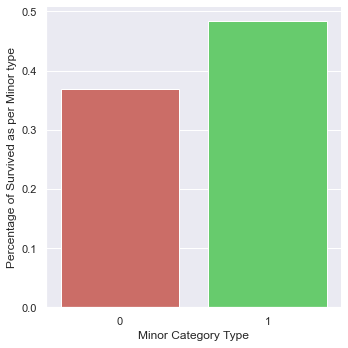

In [105]:
# Set Variable Types
Titanic_Train['Minor'] = Titanic_Train['Minor'].astype('category')
Titanic_Train['Survived'] = to_numeric(Titanic_Train['Survived'])

factorplot(x="Minor", y="Survived", data=Titanic_Train, kind="bar", ci=None)
xlabel('Minor Category Type')
ylabel('Percentage of Survived as per Minor type')

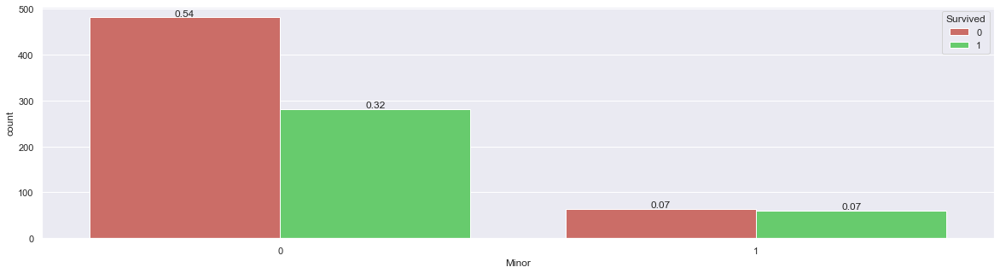

In [106]:
# % of Survived & Not Survived as per each factor of "Minor" Categorical feature
set(style="darkgrid")
set_palette("hls",3) #3 is no of Colours
fig, ax = subplots(figsize=(20,5))
ax = countplot(x="Minor", hue="Survived", data=Titanic_Train)
for p in ax.patches:
    height = p.get_height()
    ax.text(p.get_x()+p.get_width()/2., # 2 indicates centre % placement on bar top
            height + 3, # 3 indicates % placement distance from the Bar Top
            '{:1.2f}'.format(height/Titanic_Train.shape[0]),
            ha="center")

In [107]:
# Adjusted Bonferroni P-Value=0.05/3, 3 is number of Pairs
# The goal is to examine the P-Value for each of the Paired Comparisons and to use the Adjusted Bonferroni P-Value=0.017
# To evaluate significance
ObsTable=crosstab(Titanic_Train['Survived'],Titanic_Train['Minor'])
chiVal, pVal, df, ExpTable = chi2_contingency(ObsTable)
colTotals = ObsTable.sum()
nCols = len(colTotals)
print(nCols, colTotals)

rowTotals = ObsTable.sum(axis=1)
nRows = len(rowTotals)
print(nRows, rowTotals)

n = sum(rowTotals)

phRes = DataFrame(columns=['Survived', 'Minor', 'Adj. Res.'])
for i in range(nRows):
    for j in range(nCols):
        AdjRes = (ObsTable.iloc[i,j] - ExpTable[i,j]) / (ExpTable[i,j]*(1-rowTotals[i]/n)*(1-colTotals[j]/n))**0.5
        phRes = phRes.append({'Survived':ObsTable.index[i], 'Minor':ObsTable.columns[j], 'Adj. Res.':AdjRes}, ignore_index=True)
phRes
#These adjusted residuals are so-called z-values. So we can convert them to corresponding probabilities (p-values / sig.) using the standard normal distribution.
#For this we can use the 'norm.cdf' function from scipy.stats, so lets import that:
#The significance can then be added using:
phRes['Sig.'] = 2*(1-norm.cdf(abs(phRes['Adj. Res.'])))
phRes
#However, since we are doing multiple testing, we would have to adjust our found p-values.
#I'll use the Bonferroni correction, which simply multiplies the found p-value by the number of tests performed:
phRes['Adj. Sig.'] = phRes.shape[0]*phRes['Sig.']
phRes
#Ai, it worked but now some of our adj. sig. are above 1, which is in theory impossible.
#So lets replace those with a 1:
phRes.loc[phRes['Adj. Sig.']> 1, 'Adj. Sig.'] = 1
phRes

2 Minor
0    763
1    124
dtype: int64
2 Survived
0    545
1    342
dtype: int64


,Survived,Minor,Adj. Res.,Sig.,Adj. Sig.
0,0.0,0.0,2.424842,0.015315,0.06126
1,0.0,1.0,-2.424842,0.015315,0.06126
2,1.0,0.0,-2.424842,0.015315,0.06126
3,1.0,1.0,2.424842,0.015315,0.06126


Adjusted Bonferroni P-Value=0.05/4=0.0125, Check for Adj. Sig. < 0.0125

In [108]:
# Association between "Survived" & "Cabin"
# Nominal Dichotomous With Nominal Cabin
# Scipy ---> Scientific Python ---> All formulaes related to math and stats to be applied
# Acceptable p-value for my hypothesis is 0.05
# Chi-Square test (Association between two Categorical variables, Nominal With Nominal Or Nominal With Ordinal)
# (Each Variable having multiple level of Factors, 80% cells of Contingency Table Should have expected frequency >= 5)
# (Expected Frequency of Each Cell = [Row Total x Column Total]/Total Sample Size)
# (No Cell Should Have expected frequency < 3)
# (Apply Chi-Square When Sample Size > Total no of Cells x 5)
# (If We Take Square Root of Chi-Square then it will tell the avg difference in each pair point of O-E)
# from scipy.stats import chisquare
# Contingency table of observed counts
# "Survived" is Response/Dependent Variable
# "Cabin" is Explanatory/Independent Variable
ObsTable=researchpy.crosstab(Titanic_Train['Survived'],Titanic_Train['Cabin'])
print('ObsTable:-',ObsTable)

# Row Proportion/Percentage
RowProp=researchpy.crosstab(Titanic_Train['Survived'],Titanic_Train['Cabin'], prop="row")
print('RowProp:-',RowProp)

# Column Proportion/Percentage
# The Percentages of Response variable for each value of Explanatory variable
# Since the Explanatory variable is "Cabin" we would calculate the percentage for each Factor of "Survived" variable Seperately
# Percentage with Respect to Column Total Frequency for each Factor of "Survived" variable
ColProp=researchpy.crosstab(Titanic_Train['Survived'],Titanic_Train['Cabin'], prop="col")
print('ColProp:-',ColProp)

# Cell Proportion/Percentage
CellProp=researchpy.crosstab(Titanic_Train['Survived'],Titanic_Train['Cabin'], prop="cell")
print('CellProp:-',CellProp)

# Chi-square
# Expected Count = Column Total*Row Total/Table Total
# Degrees of Freedom: (rows-1) * (cols-1)
ObsTable, Chi_Result, ExpTable=researchpy.crosstab(Titanic_Train['Survived'],Titanic_Train['Cabin'], test="chi-square", expected_freqs=True)
print("ObsTable:-",ObsTable)
print('ExpTable:-',ExpTable)
print(Chi_Result)

#Finding chi_square critical_value
alpha = 0.05
no_of_rows=2
no_of_columns=2
ddof=(no_of_rows-1)*(no_of_columns-1)
critical_value=chi2.ppf(q=1-alpha,df=ddof) #ppf is percent point function
print('critical_value:-',critical_value)
print('Significance level:-',alpha)

# The G-test (Likelihood-ratio chi-square)
ObsTable, G_Result, ExpTable=researchpy.crosstab(Titanic_Train['Survived'],Titanic_Train['Cabin'], test="g-test", expected_freqs=True)
print(G_Result)

#Pearson's Contingency Coefficient(SQRT(chi2/[N+chi2]))
chiSquare=Chi_Result.iloc[0,1]
N=887
PearsonsContingencyCoefficient=sqrt(chiSquare/[N+chiSquare])
print("Pearson's Contingency Coefficient:- %.3f" % PearsonsContingencyCoefficient)

#Tschuprow's T Measures of Association
ϕ2=Chi_Result.iloc[0,1]/N
TschuprowsT=sqrt(ϕ2/[sqrt(ddof)])
print("Tschuprow's T Measures of Association:- %.3f" % TschuprowsT)

# Lambda Coefficient of Correlation
#E1=Ntotal-Nmode
#E2=(Ctotal-Cmode)+(Qtotal-Qmode)+(Stotal-Smode)
E1=887-545
E2=(28-18)+(56-42)+(64-39)+(58-34)+(40-24)+(139-74)+(442-335)+(60-39)
Lambda=(E1-E2)/E1
print("Lambda Coefficient of Correlation:- %.3f" % Lambda)


#Choosing Hypothesis based on Chi-Square Critical_Value & P_Value
chi_square_statistic=Chi_Result.iloc[0,1]
p_value=Chi_Result.iloc[1,1]
if chi_square_statistic>=critical_value:
    print("Alternate Hypothesis (H1) - Survived & Cabin have relationship")
else:
    print("Null Hypothesis (H0)- Survived & Cabin have no relationship")
    
if p_value<=alpha:
    print("Alternate Hypothesis (H1) - Survived & Cabin have relationship")
else:
    print("Null Hypothesis (H0)- Survived & Cabin have no relationship")

ObsTable:-          Cabin                                   
Cabin        A   B   C   D   E    F    G   T  All
Survived                                         
0           18  14  25  24  16   74  335  39  545
1           10  42  39  34  24   65  107  21  342
All         28  56  64  58  40  139  442  60  887
RowProp:-          Cabin                                                     
Cabin        A      B      C     D     E      F      G     T    All
Survived                                                           
0         3.30   2.57   4.59  4.40  2.94  13.58  61.47  7.16  100.0
1         2.92  12.28  11.40  9.94  7.02  19.01  31.29  6.14  100.0
All       3.16   6.31   7.22  6.54  4.51  15.67  49.83  6.76  100.0
ColProp:-            Cabin                                                             
Cabin          A      B       C       D      E       F       G      T     All
Survived                                                                     
0          64.29   25.0   3

In [109]:
# Finding Strength
DegFree=ddof
Cramers_V=Chi_Result.iloc[2,1]
if DegFree == 1:
    if Cramers_V < 0.10:
        Correlation = 'negligible'
    elif Cramers_V < 0.30:
        Correlation = 'small'
    elif Cramers_V < 0.50:
        Correlation = 'medium'
    else:
        Correlation = 'large'
elif DegFree == 2:
    if Cramers_V < 0.07:
        Correlation = 'negligible'
    elif Cramers_V < 0.21:
        Correlation = 'small'
    elif Cramers_V < 0.35:
        Correlation = 'medium'
    else:
        Correlation = 'large'
elif DegFree == 3:
    if Cramers_V < 0.06:
        Correlation = 'negligible'
    elif Cramers_V < 0.17:
        Correlation = 'small'
    elif Cramers_V < 0.29:
        Correlation = 'medium'
    else:
        Correlation = 'large'
elif DegFree == 4:
    if Cramers_V < 0.05:
        Correlation = 'negligible'
    elif Cramers_V < 0.15:
        Correlation = 'small'
    elif Cramers_V < 0.25:
        Correlation = 'medium'
    else:
        Correlation = 'large'
else:
    if Cramers_V < 0.05:
        Correlation = 'negligible'
    elif Cramers_V < 0.13:
        Correlation = 'small'
    elif Cramers_V < 0.22:
        Correlation = 'medium'
    else:
        Correlation = 'large'

Correlation

'medium'

D:\D Program Files\Anaconda\lib\site-packages\seaborn\categorical.py:3666: UserWarning: The `factorplot` function has been renamed to `catplot`. The original name will be removed in a future release. Please update your code. Note that the default `kind` in `factorplot` (`'point'`) has changed `'strip'` in `catplot`.
  warnings.warn(msg)


Text(8.96, 0.5, 'Percentage of Survived as per Cabin type')

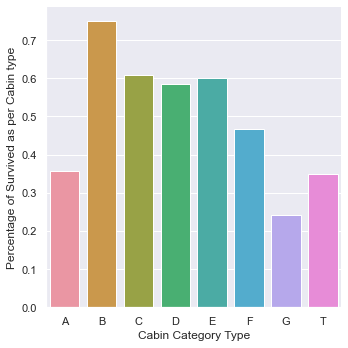

In [110]:
# Set Variable Types
Titanic_Train['Cabin'] = Titanic_Train['Cabin'].astype('category')
Titanic_Train['Survived'] = to_numeric(Titanic_Train['Survived'])

factorplot(x="Cabin", y="Survived", data=Titanic_Train, kind="bar", ci=None)
xlabel('Cabin Category Type')
ylabel('Percentage of Survived as per Cabin type')

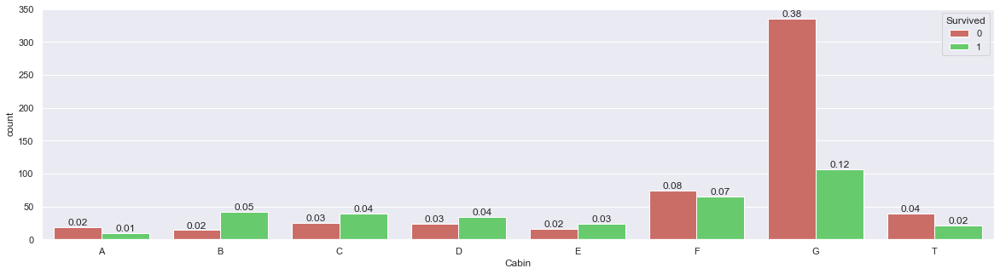

In [111]:
# % of Survived & Not Survived as per each factor of "Cabin" Categorical feature
set(style="darkgrid")
set_palette("hls",3) #3 is no of Colours
fig, ax = subplots(figsize=(20,5))
ax = countplot(x="Cabin", hue="Survived", data=Titanic_Train)
for p in ax.patches:
    height = p.get_height()
    ax.text(p.get_x()+p.get_width()/2., # 2 indicates centre % placement on bar top
            height + 3, # 3 indicates % placement distance from the Bar Top
            '{:1.2f}'.format(height/Titanic_Train.shape[0]),
            ha="center")

In [112]:
# Adjusted Bonferroni P-Value=0.05/3, 3 is number of Pairs
# The goal is to examine the P-Value for each of the Paired Comparisons and to use the Adjusted Bonferroni P-Value=0.017
# To evaluate significance
ObsTable=crosstab(Titanic_Train['Survived'],Titanic_Train['Cabin'])
chiVal, pVal, df, ExpTable = chi2_contingency(ObsTable)
colTotals = ObsTable.sum()
nCols = len(colTotals)
print(nCols, colTotals)

rowTotals = ObsTable.sum(axis=1)
nRows = len(rowTotals)
print(nRows, rowTotals)

n = sum(rowTotals)

phRes = DataFrame(columns=['Survived', 'Cabin', 'Adj. Res.'])
for i in range(nRows):
    for j in range(nCols):
        AdjRes = (ObsTable.iloc[i,j] - ExpTable[i,j]) / (ExpTable[i,j]*(1-rowTotals[i]/n)*(1-colTotals[j]/n))**0.5
        phRes = phRes.append({'Survived':ObsTable.index[i], 'Cabin':ObsTable.columns[j], 'Adj. Res.':AdjRes}, ignore_index=True)
phRes
#These adjusted residuals are so-called z-values. So we can convert them to corresponding probabilities (p-values / sig.) using the standard normal distribution.
#For this we can use the 'norm.cdf' function from scipy.stats, so lets import that:
#The significance can then be added using:
phRes['Sig.'] = 2*(1-norm.cdf(abs(phRes['Adj. Res.'])))
phRes
#However, since we are doing multiple testing, we would have to adjust our found p-values.
#I'll use the Bonferroni correction, which simply multiplies the found p-value by the number of tests performed:
phRes['Adj. Sig.'] = phRes.shape[0]*phRes['Sig.']
phRes
#Ai, it worked but now some of our adj. sig. are above 1, which is in theory impossible.
#So lets replace those with a 1:
phRes.loc[phRes['Adj. Sig.']> 1, 'Adj. Sig.'] = 1
phRes

8 Cabin
A     28
B     56
C     64
D     58
E     40
F    139
G    442
T     60
dtype: int64
2 Survived
0    545
1    342
dtype: int64


,Survived,Cabin,Adj. Res.,Sig.,Adj. Sig.
0,0,A,0.314036,7.534936e-01,1.000000e+00
1,0,B,-5.788720,7.092482e-09,1.134797e-07
2,0,C,-3.818873,1.340625e-04,2.145000e-03
3,0,D,-3.247305,1.165034e-03,1.864055e-02
4,0,E,-2.851342,4.353512e-03,6.965619e-02
5,0,F,-2.164433,3.043117e-02,4.868987e-01
6,0,G,8.750251,0.000000e+00,0.000000e+00
7,0,T,0.586236,5.577167e-01,1.000000e+00
8,1,A,-0.314036,7.534936e-01,1.000000e+00
9,1,B,5.788720,7.092482e-09,1.134797e-07


Adjusted Bonferroni P-Value=0.05/16=0.003125, Check for Adj. Sig. < 0.003125

In [113]:
# Association between "Survived" & "Family_Size"
# Nominal Dichotomous With Ordinal Family_Size
# Scipy ---> Scientific Python ---> All formulaes related to math and stats to be applied
# Acceptable p-value for my hypothesis is 0.05
# Chi-Square test (Association between two Categorical variables, Nominal With Nominal Or Nominal With Ordinal)
# (Each Variable having multiple level of Factors, 80% cells of Contingency Table Should have expected frequency >= 5)
# (Expected Frequency of Each Cell = [Row Total x Column Total]/Total Sample Size)
# (No Cell Should Have expected frequency < 3)
# (Apply Chi-Square When Sample Size > Total no of Cells x 5)
# (If We Take Square Root of Chi-Square then it will tell the avg difference in each pair point of O-E)
# from scipy.stats import chisquare
# Contingency table of observed counts
# "Survived" is Response/Dependent Variable
# "Family_Size" is Explanatory/Independent Variable
ObsTable=researchpy.crosstab(Titanic_Train['Survived'],Titanic_Train['Family_Size'])
print('ObsTable:-',ObsTable)

# Row Proportion/Percentage
RowProp=researchpy.crosstab(Titanic_Train['Survived'],Titanic_Train['Family_Size'], prop="row")
print('RowProp:-',RowProp)

# Column Proportion/Percentage
# The Percentages of Response variable for each value of Explanatory variable
# Since the Explanatory variable is "Family_Size" we would calculate the percentage for each Factor of "Survived" variable Seperately
# Percentage with Respect to Column Total Frequency for each Factor of "Survived" variable
ColProp=researchpy.crosstab(Titanic_Train['Survived'],Titanic_Train['Family_Size'], prop="col")
print('ColProp:-',ColProp)

# Cell Proportion/Percentage
CellProp=researchpy.crosstab(Titanic_Train['Survived'],Titanic_Train['Family_Size'], prop="cell")
print('CellProp:-',CellProp)

# Chi-square
# Expected Count = Column Total*Row Total/Table Total
# Degrees of Freedom: (rows-1) * (cols-1)
ObsTable, Chi_Result, ExpTable=researchpy.crosstab(Titanic_Train['Survived'],Titanic_Train['Family_Size'], test="chi-square", expected_freqs=True)
print("ObsTable:-",ObsTable)
print('ExpTable:-',ExpTable)
print(Chi_Result)

#Finding chi_square critical_value
alpha = 0.05
no_of_rows=2
no_of_columns=2
ddof=(no_of_rows-1)*(no_of_columns-1)
critical_value=chi2.ppf(q=1-alpha,df=ddof) #ppf is percent point function
print('critical_value:-',critical_value)
print('Significance level:-',alpha)

# The G-test (Likelihood-ratio chi-square)
ObsTable, G_Result, ExpTable=researchpy.crosstab(Titanic_Train['Survived'],Titanic_Train['Family_Size'], test="g-test", expected_freqs=True)
print(G_Result)

#Pearson's Contingency Coefficient(SQRT(chi2/[N+chi2]))
chiSquare=Chi_Result.iloc[0,1]
N=887
PearsonsContingencyCoefficient=sqrt(chiSquare/[N+chiSquare])
print("Pearson's Contingency Coefficient:- %.3f" % PearsonsContingencyCoefficient)

#Tschuprow's T Measures of Association
ϕ2=Chi_Result.iloc[0,1]/N
TschuprowsT=sqrt(ϕ2/[sqrt(ddof)])
print("Tschuprow's T Measures of Association:- %.3f" % TschuprowsT)

# Lambda Coefficient of Correlation
#E1=Ntotal-Nmode
#E2=(Ctotal-Cmode)+(Qtotal-Qmode)+(Stotal-Smode)
E1=887-545
E2=(533-370)+(161-89)+(102-59)+(29-21)+(15-12)+(22-19)+(12-8)+(6-6)+(7-7)
Lambda=(E1-E2)/E1
print("Lambda Coefficient of Correlation:- %.3f" % Lambda)

#Choosing Hypothesis based on Chi-Square Critical_Value & P_Value
chi_square_statistic=Chi_Result.iloc[0,1]
p_value=Chi_Result.iloc[1,1]
if chi_square_statistic>=critical_value:
    print("Alternate Hypothesis (H1) - Survived & Family_Size have relationship")
else:
    print("Null Hypothesis (H0)- Survived & Family_Size have no relationship")
    
if p_value<=alpha:
    print("Alternate Hypothesis (H1) - Survived & Family_Size have relationship")
else:
    print("Null Hypothesis (H0)- Survived & Family_Size have no relationship")

ObsTable:-             Family_Size                                     
Family_Size           1    2    3   4   5   6   7  8 11  All
Survived                                                    
0                   370   72   43   8  12  19   8  6  7  545
1                   163   89   59  21   3   3   4  0  0  342
All                 533  161  102  29  15  22  12  6  7  887
RowProp:-             Family_Size                                                    \
Family_Size           1      2      3     4     5     6     7     8    11   
Survived                                                                    
0                 67.89  13.21   7.89  1.47  2.20  3.49  1.47  1.10  1.28   
1                 47.66  26.02  17.25  6.14  0.88  0.88  1.17  0.00  0.00   
All               60.09  18.15  11.50  3.27  1.69  2.48  1.35  0.68  0.79   

                    
Family_Size    All  
Survived            
0            100.0  
1            100.0  
All          100.0  
ColProp:-             Fa

In [114]:
# Finding Strength
DegFree=ddof
Cramers_V=Chi_Result.iloc[2,1]
if DegFree == 1:
    if Cramers_V < 0.10:
        Correlation = 'negligible'
    elif Cramers_V < 0.30:
        Correlation = 'small'
    elif Cramers_V < 0.50:
        Correlation = 'medium'
    else:
        Correlation = 'large'
elif DegFree == 2:
    if Cramers_V < 0.07:
        Correlation = 'negligible'
    elif Cramers_V < 0.21:
        Correlation = 'small'
    elif Cramers_V < 0.35:
        Correlation = 'medium'
    else:
        Correlation = 'large'
elif DegFree == 3:
    if Cramers_V < 0.06:
        Correlation = 'negligible'
    elif Cramers_V < 0.17:
        Correlation = 'small'
    elif Cramers_V < 0.29:
        Correlation = 'medium'
    else:
        Correlation = 'large'
elif DegFree == 4:
    if Cramers_V < 0.05:
        Correlation = 'negligible'
    elif Cramers_V < 0.15:
        Correlation = 'small'
    elif Cramers_V < 0.25:
        Correlation = 'medium'
    else:
        Correlation = 'large'
else:
    if Cramers_V < 0.05:
        Correlation = 'negligible'
    elif Cramers_V < 0.13:
        Correlation = 'small'
    elif Cramers_V < 0.22:
        Correlation = 'medium'
    else:
        Correlation = 'large'

Correlation

'small'

D:\D Program Files\Anaconda\lib\site-packages\seaborn\categorical.py:3666: UserWarning: The `factorplot` function has been renamed to `catplot`. The original name will be removed in a future release. Please update your code. Note that the default `kind` in `factorplot` (`'point'`) has changed `'strip'` in `catplot`.
  warnings.warn(msg)


Text(8.96, 0.5, 'Percentage of Survived as per Family_Size type')

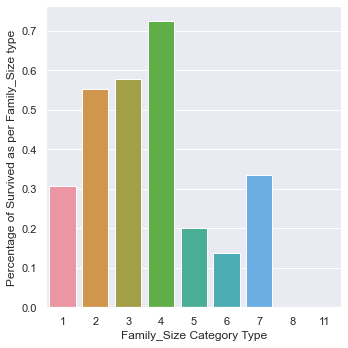

In [115]:
# Set Variable Types
Titanic_Train['Family_Size'] = Titanic_Train['Family_Size'].astype('category')
Titanic_Train['Survived'] = to_numeric(Titanic_Train['Survived'])

factorplot(x="Family_Size", y="Survived", data=Titanic_Train, kind="bar", ci=None)
xlabel('Family_Size Category Type')
ylabel('Percentage of Survived as per Family_Size type')

posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


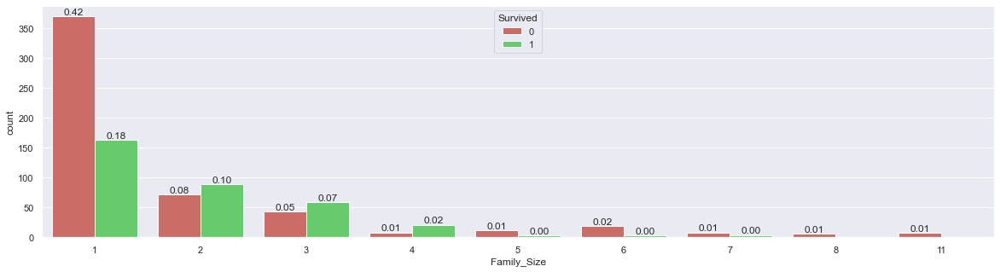

In [116]:
# % of Survived & Not Survived as per each factor of "Family_Size" Categorical feature
set(style="darkgrid")
set_palette("hls",3) #3 is no of Colours
fig, ax = subplots(figsize=(20,5))
ax = countplot(x="Family_Size", hue="Survived", data=Titanic_Train)
for p in ax.patches:
    height = p.get_height()
    ax.text(p.get_x()+p.get_width()/2., # 2 indicates centre % placement on bar top
            height + 3, # 3 indicates % placement distance from the Bar Top
            '{:1.2f}'.format(height/Titanic_Train.shape[0]),
            ha="center")

In [117]:
# Adjusted Bonferroni P-Value=0.05/3, 3 is number of Pairs
# The goal is to examine the P-Value for each of the Paired Comparisons and to use the Adjusted Bonferroni P-Value=0.017
# To evaluate significance
ObsTable=crosstab(Titanic_Train['Survived'],Titanic_Train['Family_Size'])
chiVal, pVal, df, ExpTable = chi2_contingency(ObsTable)
colTotals = ObsTable.sum()
nCols = len(colTotals)
print(nCols, colTotals)

rowTotals = ObsTable.sum(axis=1)
nRows = len(rowTotals)
print(nRows, rowTotals)

n = sum(rowTotals)

phRes = DataFrame(columns=['Survived', 'Family_Size', 'Adj. Res.'])
for i in range(nRows):
    for j in range(nCols):
        AdjRes = (ObsTable.iloc[i,j] - ExpTable[i,j]) / (ExpTable[i,j]*(1-rowTotals[i]/n)*(1-colTotals[j]/n))**0.5
        phRes = phRes.append({'Survived':ObsTable.index[i], 'Family_Size':ObsTable.columns[j], 'Adj. Res.':AdjRes}, ignore_index=True)
phRes
#These adjusted residuals are so-called z-values. So we can convert them to corresponding probabilities (p-values / sig.) using the standard normal distribution.
#For this we can use the 'norm.cdf' function from scipy.stats, so lets import that:
#The significance can then be added using:
phRes['Sig.'] = 2*(1-norm.cdf(abs(phRes['Adj. Res.'])))
phRes
#However, since we are doing multiple testing, we would have to adjust our found p-values.
#I'll use the Bonferroni correction, which simply multiplies the found p-value by the number of tests performed:
phRes['Adj. Sig.'] = phRes.shape[0]*phRes['Sig.']
phRes
#Ai, it worked but now some of our adj. sig. are above 1, which is in theory impossible.
#So lets replace those with a 1:
phRes.loc[phRes['Adj. Sig.']> 1, 'Adj. Sig.'] = 1
phRes

9 Family_Size
1     533
2     161
3     102
4      29
5      15
6      22
7      12
8       6
11      7
dtype: int64
2 Survived
0    545
1    342
dtype: int64


,Survived,Family_Size,Adj. Res.,Sig.,Adj. Sig.
0,0.0,1.0,5.988033,2.123934e-09,3.823082e-08
1,0.0,2.0,-4.818610,1.445619e-06,2.602114e-05
2,0.0,3.0,-4.253889,2.100897e-05,3.781614e-04
3,0.0,4.0,-3.808695,1.397024e-04,2.514642e-03
4,0.0,5.0,1.489250,1.364214e-01,1.000000e+00
5,0.0,6.0,2.431842,1.502225e-02,2.704005e-01
6,0.0,7.0,0.374309,7.081742e-01,1.000000e+00
7,0.0,8.0,1.946993,5.153563e-02,9.276414e-01
8,0.0,11.0,2.104187,3.536215e-02,6.365188e-01
9,1.0,1.0,-5.988033,2.123934e-09,3.823082e-08


Adjusted Bonferroni P-Value=0.05/18=0.0028, Check for Adj. Sig. < 0.0028

In [118]:
# Association between "Survived" & "Family_Group"
# Nominal Dichotomous With Ordinal Family_Group
# Scipy ---> Scientific Python ---> All formulaes related to math and stats to be applied
# Acceptable p-value for my hypothesis is 0.05
# Chi-Square test (Association between two Categorical variables, Nominal With Nominal Or Nominal With Ordinal)
# (Each Variable having multiple level of Factors, 80% cells of Contingency Table Should have expected frequency >= 5)
# (Expected Frequency of Each Cell = [Row Total x Column Total]/Total Sample Size)
# (No Cell Should Have expected frequency < 3)
# (Apply Chi-Square When Sample Size > Total no of Cells x 5)
# (If We Take Square Root of Chi-Square then it will tell the avg difference in each pair point of O-E)
# from scipy.stats import chisquare
# Contingency table of observed counts
# "Survived" is Response/Dependent Variable
# "Family_Group" is Explanatory/Independent Variable
ObsTable=researchpy.crosstab(Titanic_Train['Survived'],Titanic_Train['Family_Group'])
print('ObsTable:-',ObsTable)

# Row Proportion/Percentage
RowProp=researchpy.crosstab(Titanic_Train['Survived'],Titanic_Train['Family_Group'], prop="row")
print('RowProp:-',RowProp)

# Column Proportion/Percentage
# The Percentages of Response variable for each value of Explanatory variable
# Since the Explanatory variable is "Family_Group" we would calculate the percentage for each Factor of "Survived" variable Seperately
# Percentage with Respect to Column Total Frequency for each Factor of "Survived" variable
ColProp=researchpy.crosstab(Titanic_Train['Survived'],Titanic_Train['Family_Group'], prop="col")
print('ColProp:-',ColProp)

# Cell Proportion/Percentage
CellProp=researchpy.crosstab(Titanic_Train['Survived'],Titanic_Train['Family_Group'], prop="cell")
print('CellProp:-',CellProp)

# Chi-square
# Expected Count = Column Total*Row Total/Table Total
# Degrees of Freedom: (rows-1) * (cols-1)
ObsTable, Chi_Result, ExpTable=researchpy.crosstab(Titanic_Train['Survived'],Titanic_Train['Family_Group'], test="chi-square", expected_freqs=True)
print("ObsTable:-",ObsTable)
print('ExpTable:-',ExpTable)
print(Chi_Result)

#Finding chi_square critical_value
alpha = 0.05
no_of_rows=2
no_of_columns=2
ddof=(no_of_rows-1)*(no_of_columns-1)
critical_value=chi2.ppf(q=1-alpha,df=ddof) #ppf is percent point function
print('critical_value:-',critical_value)
print('Significance level:-',alpha)

# The G-test (Likelihood-ratio chi-square)
ObsTable, G_Result, ExpTable=researchpy.crosstab(Titanic_Train['Survived'],Titanic_Train['Family_Group'], test="g-test", expected_freqs=True)
print(G_Result)

#Pearson's Contingency Coefficient(SQRT(chi2/[N+chi2]))
chiSquare=Chi_Result.iloc[0,1]
N=887
PearsonsContingencyCoefficient=sqrt(chiSquare/[N+chiSquare])
print("Pearson's Contingency Coefficient:- %.3f" % PearsonsContingencyCoefficient)

#Tschuprow's T Measures of Association
ϕ2=Chi_Result.iloc[0,1]/N
TschuprowsT=sqrt(ϕ2/[sqrt(ddof)])
print("Tschuprow's T Measures of Association:- %.3f" % TschuprowsT)

# Lambda Coefficient of Correlation
#E1=Ntotal-Nmode
#E2=(Ctotal-Cmode)+(Qtotal-Qmode)+(Stotal-Smode)
E1=887-545
E2=(62-52)+(533-370)+(292-169)
Lambda=(E1-E2)/E1
print("Lambda Coefficient of Correlation:- %.3f" % Lambda)

#Choosing Hypothesis based on Chi-Square Critical_Value & P_Value
chi_square_statistic=Chi_Result.iloc[0,1]
p_value=Chi_Result.iloc[1,1]
if chi_square_statistic>=critical_value:
    print("Alternate Hypothesis (H1) - Survived & Family_Group have relationship")
else:
    print("Null Hypothesis (H0)- Survived & Family_Group have no relationship")
    
if p_value<=alpha:
    print("Alternate Hypothesis (H1) - Survived & Family_Group have relationship")
else:
    print("Null Hypothesis (H0)- Survived & Family_Group have no relationship")

ObsTable:-              Family_Group                 
Family_Group        large loner small  All
Survived                                  
0                      52   370   123  545
1                      10   163   169  342
All                    62   533   292  887
RowProp:-              Family_Group                     
Family_Group        large  loner  small    All
Survived                                      
0                    9.54  67.89  22.57  100.0
1                    2.92  47.66  49.42  100.0
All                  6.99  60.09  32.92  100.0
ColProp:-              Family_Group                        
Family_Group        large   loner   small     All
Survived                                         
0                   83.87   69.42   42.12   61.44
1                   16.13   30.58   57.88   38.56
All                100.00  100.00  100.00  100.00
CellProp:-              Family_Group                      
Family_Group        large  loner  small     All
Survived              

In [119]:
# Finding Strength
DegFree=ddof
Cramers_V=Chi_Result.iloc[2,1]
if DegFree == 1:
    if Cramers_V < 0.10:
        Correlation = 'negligible'
    elif Cramers_V < 0.30:
        Correlation = 'small'
    elif Cramers_V < 0.50:
        Correlation = 'medium'
    else:
        Correlation = 'large'
elif DegFree == 2:
    if Cramers_V < 0.07:
        Correlation = 'negligible'
    elif Cramers_V < 0.21:
        Correlation = 'small'
    elif Cramers_V < 0.35:
        Correlation = 'medium'
    else:
        Correlation = 'large'
elif DegFree == 3:
    if Cramers_V < 0.06:
        Correlation = 'negligible'
    elif Cramers_V < 0.17:
        Correlation = 'small'
    elif Cramers_V < 0.29:
        Correlation = 'medium'
    else:
        Correlation = 'large'
elif DegFree == 4:
    if Cramers_V < 0.05:
        Correlation = 'negligible'
    elif Cramers_V < 0.15:
        Correlation = 'small'
    elif Cramers_V < 0.25:
        Correlation = 'medium'
    else:
        Correlation = 'large'
else:
    if Cramers_V < 0.05:
        Correlation = 'negligible'
    elif Cramers_V < 0.13:
        Correlation = 'small'
    elif Cramers_V < 0.22:
        Correlation = 'medium'
    else:
        Correlation = 'large'

Correlation

'small'

D:\D Program Files\Anaconda\lib\site-packages\seaborn\categorical.py:3666: UserWarning: The `factorplot` function has been renamed to `catplot`. The original name will be removed in a future release. Please update your code. Note that the default `kind` in `factorplot` (`'point'`) has changed `'strip'` in `catplot`.
  warnings.warn(msg)


Text(8.96, 0.5, 'Percentage of Survived as per Family_Group type')

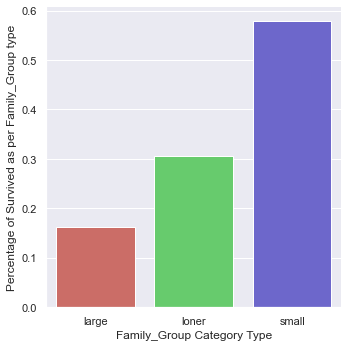

In [120]:
# Set Variable Types
Titanic_Train['Family_Group'] = Titanic_Train['Family_Group'].astype('category')
Titanic_Train['Survived'] = to_numeric(Titanic_Train['Survived'])

factorplot(x="Family_Group", y="Survived", data=Titanic_Train, kind="bar", ci=None)
xlabel('Family_Group Category Type')
ylabel('Percentage of Survived as per Family_Group type')

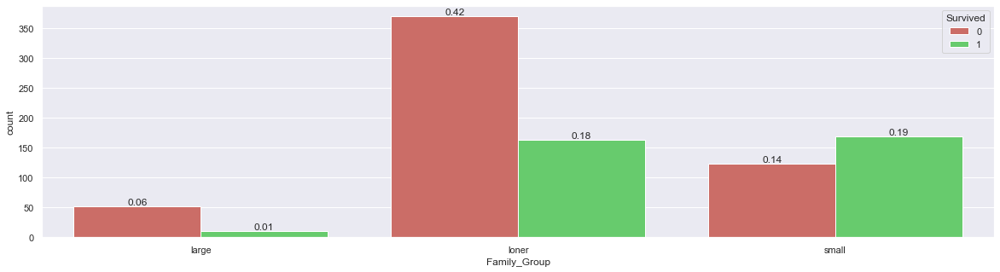

In [121]:
# % of Survived & Not Survived as per each factor of "Family_Group" Categorical feature
set(style="darkgrid")
set_palette("hls",3) #3 is no of Colours
fig, ax = subplots(figsize=(20,5))
ax = countplot(x="Family_Group", hue="Survived", data=Titanic_Train)
for p in ax.patches:
    height = p.get_height()
    ax.text(p.get_x()+p.get_width()/2., # 2 indicates centre % placement on bar top
            height + 3, # 3 indicates % placement distance from the Bar Top
            '{:1.2f}'.format(height/Titanic_Train.shape[0]),
            ha="center")

In [122]:
# Adjusted Bonferroni P-Value=0.05/3, 3 is number of Pairs
# The goal is to examine the P-Value for each of the Paired Comparisons and to use the Adjusted Bonferroni P-Value=0.017
# To evaluate significance
ObsTable=crosstab(Titanic_Train['Survived'],Titanic_Train['Family_Group'])
chiVal, pVal, df, ExpTable = chi2_contingency(ObsTable)
colTotals = ObsTable.sum()
nCols = len(colTotals)
print(nCols, colTotals)

rowTotals = ObsTable.sum(axis=1)
nRows = len(rowTotals)
print(nRows, rowTotals)

n = sum(rowTotals)

phRes = DataFrame(columns=['Survived', 'Family_Group', 'Adj. Res.'])
for i in range(nRows):
    for j in range(nCols):
        AdjRes = (ObsTable.iloc[i,j] - ExpTable[i,j]) / (ExpTable[i,j]*(1-rowTotals[i]/n)*(1-colTotals[j]/n))**0.5
        phRes = phRes.append({'Survived':ObsTable.index[i], 'Family_Group':ObsTable.columns[j], 'Adj. Res.':AdjRes}, ignore_index=True)
phRes
#These adjusted residuals are so-called z-values. So we can convert them to corresponding probabilities (p-values / sig.) using the standard normal distribution.
#For this we can use the 'norm.cdf' function from scipy.stats, so lets import that:
#The significance can then be added using:
phRes['Sig.'] = 2*(1-norm.cdf(abs(phRes['Adj. Res.'])))
phRes
#However, since we are doing multiple testing, we would have to adjust our found p-values.
#I'll use the Bonferroni correction, which simply multiplies the found p-value by the number of tests performed:
phRes['Adj. Sig.'] = phRes.shape[0]*phRes['Sig.']
phRes
#Ai, it worked but now some of our adj. sig. are above 1, which is in theory impossible.
#So lets replace those with a 1:
phRes.loc[phRes['Adj. Sig.']> 1, 'Adj. Sig.'] = 1
phRes

3 Family_Group
large     62
loner    533
small    292
dtype: int64
2 Survived
0    545
1    342
dtype: int64


,Survived,Family_Group,Adj. Res.,Sig.,Adj. Sig.
0,0,large,3.762111,1.684851e-04,1.010911e-03
1,0,loner,5.988033,2.123934e-09,1.274361e-08
2,0,small,-8.281504,2.220446e-16,1.332268e-15
3,1,large,-3.762111,1.684851e-04,1.010911e-03
4,1,loner,-5.988033,2.123934e-09,1.274361e-08
5,1,small,8.281504,2.220446e-16,1.332268e-15


Adjusted Bonferroni P-Value=0.05/6=0.0084, Check for Adj. Sig. < 0.0084

In [123]:
# Association between "Survived" & "Fare_Group"
# Nominal Dichotomous With Ordinal Fare_Group
# Scipy ---> Scientific Python ---> All formulaes related to math and stats to be applied
# Acceptable p-value for my hypothesis is 0.05
# Chi-Square test (Association between two Categorical variables, Nominal With Nominal Or Nominal With Ordinal)
# (Each Variable having multiple level of Factors, 80% cells of Contingency Table Should have expected frequency >= 5)
# (Expected Frequency of Each Cell = [Row Total x Column Total]/Total Sample Size)
# (No Cell Should Have expected frequency < 3)
# (Apply Chi-Square When Sample Size > Total no of Cells x 5)
# (If We Take Square Root of Chi-Square then it will tell the avg difference in each pair point of O-E)
# from scipy.stats import chisquare
# Contingency table of observed counts
# "Survived" is Response/Dependent Variable
# "Fare_Group" is Explanatory/Independent Variable
ObsTable=researchpy.crosstab(Titanic_Train['Survived'],Titanic_Train['Fare_Group'])
print('ObsTable:-',ObsTable)

# Row Proportion/Percentage
RowProp=researchpy.crosstab(Titanic_Train['Survived'],Titanic_Train['Fare_Group'], prop="row")
print('RowProp:-',RowProp)

# Column Proportion/Percentage
# The Percentages of Response variable for each value of Explanatory variable
# Since the Explanatory variable is "Family_Group" we would calculate the percentage for each Factor of "Survived" variable Seperately
# Percentage with Respect to Column Total Frequency for each Factor of "Survived" variable
ColProp=researchpy.crosstab(Titanic_Train['Survived'],Titanic_Train['Fare_Group'], prop="col")
print('ColProp:-',ColProp)

# Cell Proportion/Percentage
CellProp=researchpy.crosstab(Titanic_Train['Survived'],Titanic_Train['Fare_Group'], prop="cell")
print('CellProp:-',CellProp)

# Chi-square
# Expected Count = Column Total*Row Total/Table Total
# Degrees of Freedom: (rows-1) * (cols-1)
ObsTable, Chi_Result, ExpTable=researchpy.crosstab(Titanic_Train['Survived'],Titanic_Train['Fare_Group'], test="chi-square", expected_freqs=True)
print("ObsTable:-",ObsTable)
print('ExpTable:-',ExpTable)
print(Chi_Result)

#Finding chi_square critical_value
alpha = 0.05
no_of_rows=2
no_of_columns=2
ddof=(no_of_rows-1)*(no_of_columns-1)
critical_value=chi2.ppf(q=1-alpha,df=ddof) #ppf is percent point function
print('critical_value:-',critical_value)
print('Significance level:-',alpha)

# The G-test (Likelihood-ratio chi-square)
ObsTable, G_Result, ExpTable=researchpy.crosstab(Titanic_Train['Survived'],Titanic_Train['Fare_Group'], test="g-test", expected_freqs=True)
print(G_Result)

#Pearson's Contingency Coefficient(SQRT(chi2/[N+chi2]))
chiSquare=Chi_Result.iloc[0,1]
N=887
PearsonsContingencyCoefficient=sqrt(chiSquare/[N+chiSquare])
print("Pearson's Contingency Coefficient:- %.3f" % PearsonsContingencyCoefficient)

#Tschuprow's T Measures of Association
ϕ2=Chi_Result.iloc[0,1]/N
TschuprowsT=sqrt(ϕ2/[sqrt(ddof)])
print("Tschuprow's T Measures of Association:- %.3f" % TschuprowsT)

# Lambda Coefficient of Correlation
#E1=Ntotal-Nmode
#E2=(Ctotal-Cmode)+(Qtotal-Qmode)+(Stotal-Smode)
E1=887-545
E2=(41-31)+(154-86)+(468-339)+(152-86)+(72-51)
Lambda=(E1-E2)/E1
print("Lambda Coefficient of Correlation:- %.3f" % Lambda)

#Choosing Hypothesis based on Chi-Square Critical_Value & P_Value
chi_square_statistic=Chi_Result.iloc[0,1]
p_value=Chi_Result.iloc[1,1]
if chi_square_statistic>=critical_value:
    print("Alternate Hypothesis (H1) - Survived & Fare_Group have relationship")
else:
    print("Null Hypothesis (H0)- Survived & Fare_Group have no relationship")
    
if p_value<=alpha:
    print("Alternate Hypothesis (H1) - Survived & Fare_Group have relationship")
else:
    print("Null Hypothesis (H0)- Survived & Fare_Group have no relationship")

ObsTable:-            Fare_Group                              
Fare_Group   Very_low high  low  mid very_high  All
Survived                                           
0                  31   68  339   86        21  545
1                  10   86  129   66        51  342
All                41  154  468  152        72  887
RowProp:-            Fare_Group                                      
Fare_Group   Very_low   high    low    mid very_high    All
Survived                                                   
0                5.69  12.48  62.20  15.78      3.85  100.0
1                2.92  25.15  37.72  19.30     14.91  100.0
All              4.62  17.36  52.76  17.14      8.12  100.0
ColProp:-            Fare_Group                                          
Fare_Group   Very_low    high     low     mid very_high     All
Survived                                                       
0               75.61   44.16   72.44   56.58     29.17   61.44
1               24.39   55.84   27.56   4

In [124]:
# Finding Strength
DegFree=ddof
Cramers_V=Chi_Result.iloc[2,1]
if DegFree == 1:
    if Cramers_V < 0.10:
        Correlation = 'negligible'
    elif Cramers_V < 0.30:
        Correlation = 'small'
    elif Cramers_V < 0.50:
        Correlation = 'medium'
    else:
        Correlation = 'large'
elif DegFree == 2:
    if Cramers_V < 0.07:
        Correlation = 'negligible'
    elif Cramers_V < 0.21:
        Correlation = 'small'
    elif Cramers_V < 0.35:
        Correlation = 'medium'
    else:
        Correlation = 'large'
elif DegFree == 3:
    if Cramers_V < 0.06:
        Correlation = 'negligible'
    elif Cramers_V < 0.17:
        Correlation = 'small'
    elif Cramers_V < 0.29:
        Correlation = 'medium'
    else:
        Correlation = 'large'
elif DegFree == 4:
    if Cramers_V < 0.05:
        Correlation = 'negligible'
    elif Cramers_V < 0.15:
        Correlation = 'small'
    elif Cramers_V < 0.25:
        Correlation = 'medium'
    else:
        Correlation = 'large'
else:
    if Cramers_V < 0.05:
        Correlation = 'negligible'
    elif Cramers_V < 0.13:
        Correlation = 'small'
    elif Cramers_V < 0.22:
        Correlation = 'medium'
    else:
        Correlation = 'large'

Correlation

'medium'

D:\D Program Files\Anaconda\lib\site-packages\seaborn\categorical.py:3666: UserWarning: The `factorplot` function has been renamed to `catplot`. The original name will be removed in a future release. Please update your code. Note that the default `kind` in `factorplot` (`'point'`) has changed `'strip'` in `catplot`.
  warnings.warn(msg)


Text(8.96, 0.5, 'Percentage of Survived as per Fare_Group type')

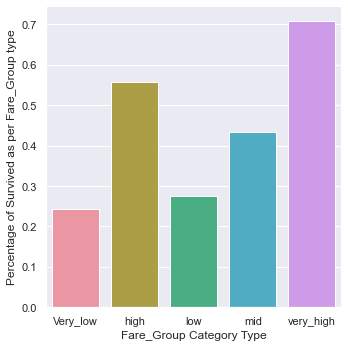

In [125]:
# Set Variable Types
Titanic_Train['Fare_Group'] = Titanic_Train['Fare_Group'].astype('category')
Titanic_Train['Survived'] = to_numeric(Titanic_Train['Survived'])

factorplot(x="Fare_Group", y="Survived", data=Titanic_Train, kind="bar", ci=None)
xlabel('Fare_Group Category Type')
ylabel('Percentage of Survived as per Fare_Group type')

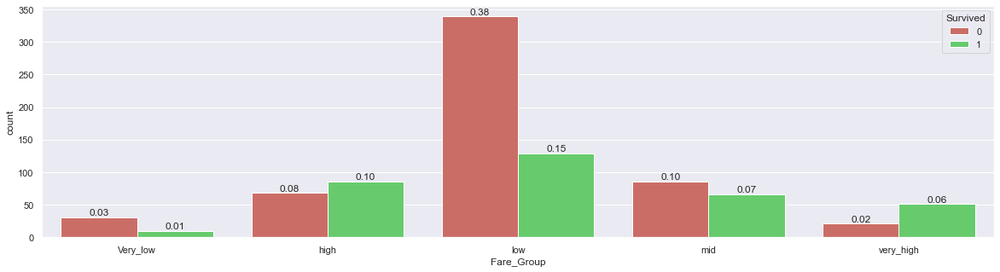

In [126]:
# % of Survived & Not Survived as per each factor of "Fare_Group" Categorical feature
set(style="darkgrid")
set_palette("hls",3) #3 is no of Colours
fig, ax = subplots(figsize=(20,5))
ax = countplot(x="Fare_Group", hue="Survived", data=Titanic_Train)
for p in ax.patches:
    height = p.get_height()
    ax.text(p.get_x()+p.get_width()/2., # 2 indicates centre % placement on bar top
            height + 3, # 3 indicates % placement distance from the Bar Top
            '{:1.2f}'.format(height/Titanic_Train.shape[0]),
            ha="center")

In [127]:
# Adjusted Bonferroni P-Value=0.05/3, 3 is number of Pairs
# The goal is to examine the P-Value for each of the Paired Comparisons and to use the Adjusted Bonferroni P-Value=0.017
# To evaluate significance
ObsTable=crosstab(Titanic_Train['Survived'],Titanic_Train['Fare_Group'])
chiVal, pVal, df, ExpTable = chi2_contingency(ObsTable)
colTotals = ObsTable.sum()
nCols = len(colTotals)
print(nCols, colTotals)

rowTotals = ObsTable.sum(axis=1)
nRows = len(rowTotals)
print(nRows, rowTotals)

n = sum(rowTotals)

phRes = DataFrame(columns=['Survived', 'Fare_Group', 'Adj. Res.'])
for i in range(nRows):
    for j in range(nCols):
        AdjRes = (ObsTable.iloc[i,j] - ExpTable[i,j]) / (ExpTable[i,j]*(1-rowTotals[i]/n)*(1-colTotals[j]/n))**0.5
        phRes = phRes.append({'Survived':ObsTable.index[i], 'Fare_Group':ObsTable.columns[j], 'Adj. Res.':AdjRes}, ignore_index=True)
phRes
#These adjusted residuals are so-called z-values. So we can convert them to corresponding probabilities (p-values / sig.) using the standard normal distribution.
#For this we can use the 'norm.cdf' function from scipy.stats, so lets import that:
#The significance can then be added using:
phRes['Sig.'] = 2*(1-norm.cdf(abs(phRes['Adj. Res.'])))
phRes
#However, since we are doing multiple testing, we would have to adjust our found p-values.
#I'll use the Bonferroni correction, which simply multiplies the found p-value by the number of tests performed:
phRes['Adj. Sig.'] = phRes.shape[0]*phRes['Sig.']
phRes
#Ai, it worked but now some of our adj. sig. are above 1, which is in theory impossible.
#So lets replace those with a 1:
phRes.loc[phRes['Adj. Sig.']> 1, 'Adj. Sig.'] = 1
phRes

5 Fare_Group
Very_low      41
high         154
low          468
mid          152
very_high     72
dtype: int64
2 Survived
0    545
1    342
dtype: int64


,Survived,Fare_Group,Adj. Res.,Sig.,Adj. Sig.
0,0,Very_low,1.908311,5.635098e-02,5.635098e-01
1,0,high,-4.848504,1.243963e-06,1.243963e-05
2,0,low,7.108854,1.170175e-12,1.170175e-11
3,0,mid,-1.353494,1.758977e-01,1.000000e+00
4,0,very_high,-5.870116,4.354913e-09,4.354913e-08
5,1,Very_low,-1.908311,5.635098e-02,5.635098e-01
6,1,high,4.848504,1.243963e-06,1.243963e-05
7,1,low,-7.108854,1.170175e-12,1.170175e-11
8,1,mid,1.353494,1.758977e-01,1.000000e+00
9,1,very_high,5.870116,4.354913e-09,4.354913e-08


Adjusted Bonferroni P-Value=0.05/10=0.005, Check for Adj. Sig. < 0.005

In [128]:
# Association between "Survived" & "Age_Group"
# Nominal Dichotomous With Ordinal Age_Group
# Scipy ---> Scientific Python ---> All formulaes related to math and stats to be applied
# Acceptable p-value for my hypothesis is 0.05
# Chi-Square test (Association between two Categorical variables, Nominal With Nominal Or Nominal With Ordinal)
# (Each Variable having multiple level of Factors, 80% cells of Contingency Table Should have expected frequency >= 5)
# (Expected Frequency of Each Cell = [Row Total x Column Total]/Total Sample Size)
# (No Cell Should Have expected frequency < 3)
# (Apply Chi-Square When Sample Size > Total no of Cells x 5)
# (If We Take Square Root of Chi-Square then it will tell the avg difference in each pair point of O-E)
# from scipy.stats import chisquare
# Contingency table of observed counts
# "Survived" is Response/Dependent Variable
# "Age_Group" is Explanatory/Independent Variable
ObsTable=researchpy.crosstab(Titanic_Train['Survived'],Titanic_Train['Age_Group'])
print('ObsTable:-',ObsTable)

# Row Proportion/Percentage
RowProp=researchpy.crosstab(Titanic_Train['Survived'],Titanic_Train['Age_Group'], prop="row")
print('RowProp:-',RowProp)

# Column Proportion/Percentage
# The Percentages of Response variable for each value of Explanatory variable
# Since the Explanatory variable is "Age_Group" we would calculate the percentage for each Factor of "Survived" variable Seperately
# Percentage with Respect to Column Total Frequency for each Factor of "Survived" variable
ColProp=researchpy.crosstab(Titanic_Train['Survived'],Titanic_Train['Age_Group'], prop="col")
print('ColProp:-',ColProp)

# Cell Proportion/Percentage
CellProp=researchpy.crosstab(Titanic_Train['Survived'],Titanic_Train['Age_Group'], prop="cell")
print('CellProp:-',CellProp)

# Chi-square
# Expected Count = Column Total*Row Total/Table Total
# Degrees of Freedom: (rows-1) * (cols-1)
ObsTable, Chi_Result, ExpTable=researchpy.crosstab(Titanic_Train['Survived'],Titanic_Train['Age_Group'], test="chi-square", expected_freqs=True)
print("ObsTable:-",ObsTable)
print('ExpTable:-',ExpTable)
print(Chi_Result)

#Finding chi_square critical_value
alpha = 0.05
no_of_rows=2
no_of_columns=2
ddof=(no_of_rows-1)*(no_of_columns-1)
critical_value=chi2.ppf(q=1-alpha,df=ddof) #ppf is percent point function
print('critical_value:-',critical_value)
print('Significance level:-',alpha)

# The G-test (Likelihood-ratio chi-square)
ObsTable, G_Result, ExpTable=researchpy.crosstab(Titanic_Train['Survived'],Titanic_Train['Age_Group'], test="g-test", expected_freqs=True)
print(G_Result)

#Pearson's Contingency Coefficient(SQRT(chi2/[N+chi2]))
chiSquare=Chi_Result.iloc[0,1]
N=887
PearsonsContingencyCoefficient=sqrt(chiSquare/[N+chiSquare])
print("Pearson's Contingency Coefficient:- %.3f" % PearsonsContingencyCoefficient)

#Tschuprow's T Measures of Association
ϕ2=Chi_Result.iloc[0,1]/N
TschuprowsT=sqrt(ϕ2/[sqrt(ddof)])
print("Tschuprow's T Measures of Association:- %.3f" % TschuprowsT)

# Lambda Coefficient of Correlation
#E1=Ntotal-Nmode
#E2=(Ctotal-Cmode)+(Qtotal-Qmode)+(Stotal-Smode)
E1=887-545
E2=(445-281)+(145-90)+(37-21)+(18-13)+(75-46)+(9-7)+(43-28)+(81-50)+(34-17)
Lambda=(E1-E2)/E1
print("Lambda Coefficient of Correlation:- %.3f" % Lambda)


#Choosing Hypothesis based on Chi-Square Critical_Value & P_Value
chi_square_statistic=Chi_Result.iloc[0,1]
p_value=Chi_Result.iloc[1,1]
if chi_square_statistic>=critical_value:
    print("Alternate Hypothesis (H1) - Survived & Age_Group have relationship")
else:
    print("Null Hypothesis (H0)- Survived & Age_Group have no relationship")
    
if p_value<=alpha:
    print("Alternate Hypothesis (H1) - Survived & Age_Group have relationship")
else:
    print("Null Hypothesis (H0)- Survived & Age_Group have no relationship")

ObsTable:-             Age_Group                                                    \
Age_Group Young_Adult adult child infant middle_aged old senior_citizen   
Survived                                                                  
0                 281    90    21      5          46   7             28   
1                 164    55    16     13          29   2             15   
All               445   145    37     18          75   9             43   

                                 
Age_Group teenager toddler  All  
Survived                         
0               50      17  545  
1               31      17  342  
All             81      34  887  
RowProp:-             Age_Group                                                       \
Age_Group Young_Adult  adult child infant middle_aged   old senior_citizen   
Survived                                                                     
0               51.56  16.51  3.85   0.92        8.44  1.28           5.14   
1           

In [129]:
# Finding Strength
DegFree=ddof
Cramers_V=Chi_Result.iloc[2,1]
if DegFree == 1:
    if Cramers_V < 0.10:
        Correlation = 'negligible'
    elif Cramers_V < 0.30:
        Correlation = 'small'
    elif Cramers_V < 0.50:
        Correlation = 'medium'
    else:
        Correlation = 'large'
elif DegFree == 2:
    if Cramers_V < 0.07:
        Correlation = 'negligible'
    elif Cramers_V < 0.21:
        Correlation = 'small'
    elif Cramers_V < 0.35:
        Correlation = 'medium'
    else:
        Correlation = 'large'
elif DegFree == 3:
    if Cramers_V < 0.06:
        Correlation = 'negligible'
    elif Cramers_V < 0.17:
        Correlation = 'small'
    elif Cramers_V < 0.29:
        Correlation = 'medium'
    else:
        Correlation = 'large'
elif DegFree == 4:
    if Cramers_V < 0.05:
        Correlation = 'negligible'
    elif Cramers_V < 0.15:
        Correlation = 'small'
    elif Cramers_V < 0.25:
        Correlation = 'medium'
    else:
        Correlation = 'large'
else:
    if Cramers_V < 0.05:
        Correlation = 'negligible'
    elif Cramers_V < 0.13:
        Correlation = 'small'
    elif Cramers_V < 0.22:
        Correlation = 'medium'
    else:
        Correlation = 'large'

Correlation

'small'

D:\D Program Files\Anaconda\lib\site-packages\seaborn\categorical.py:3666: UserWarning: The `factorplot` function has been renamed to `catplot`. The original name will be removed in a future release. Please update your code. Note that the default `kind` in `factorplot` (`'point'`) has changed `'strip'` in `catplot`.
  warnings.warn(msg)


Text(8.96, 0.5, 'Percentage of Survived as per Age_Group type')

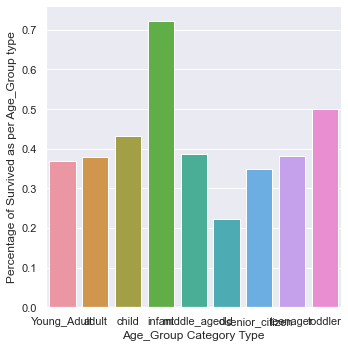

In [130]:
# Set Variable Types
Titanic_Train['Age_Group'] = Titanic_Train['Age_Group'].astype('category')
Titanic_Train['Survived'] = to_numeric(Titanic_Train['Survived'])

factorplot(x="Age_Group", y="Survived", data=Titanic_Train, kind="bar", ci=None)
xlabel('Age_Group Category Type')
ylabel('Percentage of Survived as per Age_Group type')

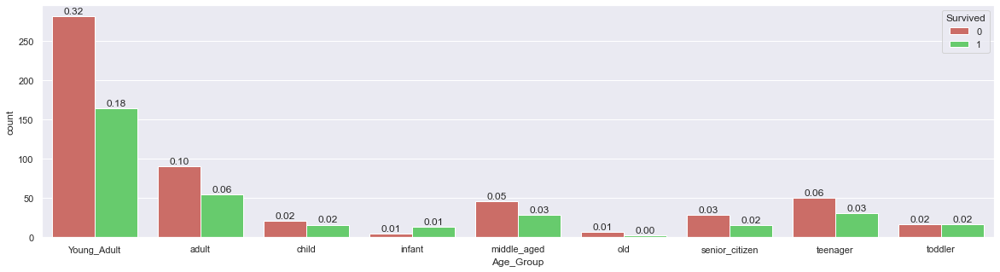

In [131]:
# % of Survived & Not Survived as per each factor of "Age_Group" Categorical feature
set(style="darkgrid")
set_palette("hls",3) #3 is no of Colours
fig, ax = subplots(figsize=(20,5))
ax = countplot(x="Age_Group", hue="Survived", data=Titanic_Train)
for p in ax.patches:
    height = p.get_height()
    ax.text(p.get_x()+p.get_width()/2., # 2 indicates centre % placement on bar top
            height + 3, # 3 indicates % placement distance from the Bar Top
            '{:1.2f}'.format(height/Titanic_Train.shape[0]),
            ha="center")

In [132]:
# Adjusted Bonferroni P-Value=0.05/3, 3 is number of Pairs
# The goal is to examine the P-Value for each of the Paired Comparisons and to use the Adjusted Bonferroni P-Value=0.017
# To evaluate significance
ObsTable=crosstab(Titanic_Train['Survived'],Titanic_Train['Age_Group'])
chiVal, pVal, df, ExpTable = chi2_contingency(ObsTable)
colTotals = ObsTable.sum()
nCols = len(colTotals)
print(nCols, colTotals)

rowTotals = ObsTable.sum(axis=1)
nRows = len(rowTotals)
print(nRows, rowTotals)

n = sum(rowTotals)

phRes = DataFrame(columns=['Survived', 'Age_Group', 'Adj. Res.'])
for i in range(nRows):
    for j in range(nCols):
        AdjRes = (ObsTable.iloc[i,j] - ExpTable[i,j]) / (ExpTable[i,j]*(1-rowTotals[i]/n)*(1-colTotals[j]/n))**0.5
        phRes = phRes.append({'Survived':ObsTable.index[i], 'Age_Group':ObsTable.columns[j], 'Adj. Res.':AdjRes}, ignore_index=True)
phRes
#These adjusted residuals are so-called z-values. So we can convert them to corresponding probabilities (p-values / sig.) using the standard normal distribution.
#For this we can use the 'norm.cdf' function from scipy.stats, so lets import that:
#The significance can then be added using:
phRes['Sig.'] = 2*(1-norm.cdf(abs(phRes['Adj. Res.'])))
phRes
#However, since we are doing multiple testing, we would have to adjust our found p-values.
#I'll use the Bonferroni correction, which simply multiplies the found p-value by the number of tests performed:
phRes['Adj. Sig.'] = phRes.shape[0]*phRes['Sig.']
phRes
#Ai, it worked but now some of our adj. sig. are above 1, which is in theory impossible.
#So lets replace those with a 1:
phRes.loc[phRes['Adj. Sig.']> 1, 'Adj. Sig.'] = 1
phRes

9 Age_Group
Young_Adult       445
adult             145
child              37
infant             18
middle_aged        75
old                 9
senior_citizen     43
teenager           81
toddler            34
dtype: int64
2 Survived
0    545
1    342
dtype: int64


,Survived,Age_Group,Adj. Res.,Sig.,Adj. Sig.
0,0,Young_Adult,1.045581,0.295754,1.000000
1,0,adult,0.169301,0.865560,1.000000
2,0,child,-0.598269,0.549660,1.000000
3,0,infant,-2.964714,0.003030,0.054534
4,0,middle_aged,-0.020406,0.983719,1.000000
5,0,old,1.011951,0.311561,1.000000
6,0,senior_citizen,0.507321,0.611929,1.000000
7,0,teenager,0.055347,0.955862,1.000000
8,0,toddler,-1.397917,0.162138,1.000000
9,1,Young_Adult,-1.045581,0.295754,1.000000


Adjusted Bonferroni P-Value=0.05/18=0.0028, Check for Adj. Sig. < 0.0028

In [133]:
# Association between "Survived" & "nLength_group"
# Nominal Dichotomous With Ordinal nLength_group
# Scipy ---> Scientific Python ---> All formulaes related to math and stats to be applied
# Acceptable p-value for my hypothesis is 0.05
# Chi-Square test (Association between two Categorical variables, Nominal With Nominal Or Nominal With Ordinal)
# (Each Variable having multiple level of Factors, 80% cells of Contingency Table Should have expected frequency >= 5)
# (Expected Frequency of Each Cell = [Row Total x Column Total]/Total Sample Size)
# (No Cell Should Have expected frequency < 3)
# (Apply Chi-Square When Sample Size > Total no of Cells x 5)
# (If We Take Square Root of Chi-Square then it will tell the avg difference in each pair point of O-E)
# from scipy.stats import chisquare
# Contingency table of observed counts
# "Survived" is Response/Dependent Variable
# "nLength_group" is Explanatory/Independent Variable
ObsTable=researchpy.crosstab(Titanic_Train['Survived'],Titanic_Train['nLength_group'])
print('ObsTable:-',ObsTable)

# Row Proportion/Percentage
RowProp=researchpy.crosstab(Titanic_Train['Survived'],Titanic_Train['nLength_group'], prop="row")
print('RowProp:-',RowProp)

# Column Proportion/Percentage
# The Percentages of Response variable for each value of Explanatory variable
# Since the Explanatory variable is "nLength_group" we would calculate the percentage for each Factor of "Survived" variable Seperately
# Percentage with Respect to Column Total Frequency for each Factor of "Survived" variable
ColProp=researchpy.crosstab(Titanic_Train['Survived'],Titanic_Train['nLength_group'], prop="col")
print('ColProp:-',ColProp)

# Cell Proportion/Percentage
CellProp=researchpy.crosstab(Titanic_Train['Survived'],Titanic_Train['nLength_group'], prop="cell")
print('CellProp:-',CellProp)

# Chi-square
# Expected Count = Column Total*Row Total/Table Total
# Degrees of Freedom: (rows-1) * (cols-1)
ObsTable, Chi_Result, ExpTable=researchpy.crosstab(Titanic_Train['Survived'],Titanic_Train['nLength_group'], test="chi-square", expected_freqs=True)
print("ObsTable:-",ObsTable)
print('ExpTable:-',ExpTable)
print(Chi_Result)

#Finding chi_square critical_value
alpha = 0.05
no_of_rows=2
no_of_columns=2
ddof=(no_of_rows-1)*(no_of_columns-1)
critical_value=chi2.ppf(q=1-alpha,df=ddof) #ppf is percent point function
print('critical_value:-',critical_value)
print('Significance level:-',alpha)

# The G-test (Likelihood-ratio chi-square)
ObsTable, G_Result, ExpTable=researchpy.crosstab(Titanic_Train['Survived'],Titanic_Train['nLength_group'], test="g-test", expected_freqs=True)
print(G_Result)

#Pearson's Contingency Coefficient(SQRT(chi2/[N+chi2]))
chiSquare=Chi_Result.iloc[0,1]
N=887
PearsonsContingencyCoefficient=sqrt(chiSquare/[N+chiSquare])
print("Pearson's Contingency Coefficient:- %.3f" % PearsonsContingencyCoefficient)

#Tschuprow's T Measures of Association
ϕ2=Chi_Result.iloc[0,1]/N
TschuprowsT=sqrt(ϕ2/[sqrt(ddof)])
print("Tschuprow's T Measures of Association:- %.3f" % TschuprowsT)

# Lambda Coefficient of Correlation
#E1=Ntotal-Nmode
#E2=(Ctotal-Cmode)+(Qtotal-Qmode)+(Stotal-Smode)
E1=887-545
E2=(79-49)+(55-44)+(513-320)+(240-184)
Lambda=(E1-E2)/E1
print("Lambda Coefficient of Correlation:- %.3f" % Lambda)


#Choosing Hypothesis based on Critical_Value & P_Value
chi_square_statistic=Chi_Result.iloc[0,1]
p_value=Chi_Result.iloc[1,1]
if chi_square_statistic>=critical_value:
    print("Alternate Hypothesis (H1) - Survived & nLength_group have relationship")
else:
    print("Null Hypothesis (H0)- Survived & nLength_group have no relationship")
    
if p_value<=alpha:
    print("Alternate Hypothesis (H1) - Survived & nLength_group have relationship")
else:
    print("Null Hypothesis (H0)- Survived & nLength_group have no relationship")

ObsTable:-               nLength_group                       
nLength_group          good long medium short  All
Survived                                          
0                        30   11    320   184  545
1                        49   44    193    56  342
All                      79   55    513   240  887
RowProp:-               nLength_group                            
nLength_group          good   long medium  short    All
Survived                                               
0                      5.50   2.02  58.72  33.76  100.0
1                     14.33  12.87  56.43  16.37  100.0
All                    8.91   6.20  57.84  27.06  100.0
ColProp:-               nLength_group                               
nLength_group          good   long  medium   short     All
Survived                                                  
0                     37.97   20.0   62.38   76.67   61.44
1                     62.03   80.0   37.62   23.33   38.56
All                  100.00  100

In [134]:
# Finding Strength
DegFree=ddof
Cramers_V=Chi_Result.iloc[2,1]
if DegFree == 1:
    if Cramers_V < 0.10:
        Correlation = 'negligible'
    elif Cramers_V < 0.30:
        Correlation = 'small'
    elif Cramers_V < 0.50:
        Correlation = 'medium'
    else:
        Correlation = 'large'
elif DegFree == 2:
    if Cramers_V < 0.07:
        Correlation = 'negligible'
    elif Cramers_V < 0.21:
        Correlation = 'small'
    elif Cramers_V < 0.35:
        Correlation = 'medium'
    else:
        Correlation = 'large'
elif DegFree == 3:
    if Cramers_V < 0.06:
        Correlation = 'negligible'
    elif Cramers_V < 0.17:
        Correlation = 'small'
    elif Cramers_V < 0.29:
        Correlation = 'medium'
    else:
        Correlation = 'large'
elif DegFree == 4:
    if Cramers_V < 0.05:
        Correlation = 'negligible'
    elif Cramers_V < 0.15:
        Correlation = 'small'
    elif Cramers_V < 0.25:
        Correlation = 'medium'
    else:
        Correlation = 'large'
else:
    if Cramers_V < 0.05:
        Correlation = 'negligible'
    elif Cramers_V < 0.13:
        Correlation = 'small'
    elif Cramers_V < 0.22:
        Correlation = 'medium'
    else:
        Correlation = 'large'

Correlation

'medium'

D:\D Program Files\Anaconda\lib\site-packages\seaborn\categorical.py:3666: UserWarning: The `factorplot` function has been renamed to `catplot`. The original name will be removed in a future release. Please update your code. Note that the default `kind` in `factorplot` (`'point'`) has changed `'strip'` in `catplot`.
  warnings.warn(msg)


Text(8.96, 0.5, 'Percentage of Survived as per nLength_group type')

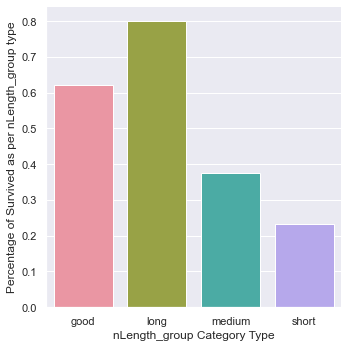

In [135]:
# Set Variable Types
Titanic_Train['nLength_group'] = Titanic_Train['nLength_group'].astype('category')
Titanic_Train['Survived'] = to_numeric(Titanic_Train['Survived'])

factorplot(x="nLength_group", y="Survived", data=Titanic_Train, kind="bar", ci=None)
xlabel('nLength_group Category Type')
ylabel('Percentage of Survived as per nLength_group type')

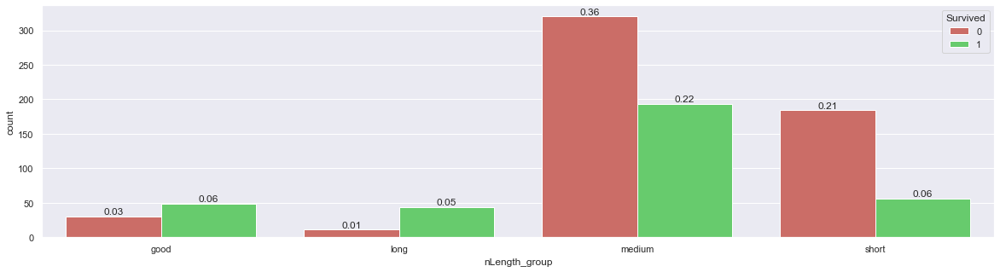

In [136]:
# % of Survived & Not Survived as per each factor of "nLength_group" Categorical feature
set(style="darkgrid")
set_palette("hls",3) #3 is no of Colours
fig, ax = subplots(figsize=(20,5))
ax = countplot(x="nLength_group", hue="Survived", data=Titanic_Train)
for p in ax.patches:
    height = p.get_height()
    ax.text(p.get_x()+p.get_width()/2., # 2 indicates centre % placement on bar top
            height + 3, # 3 indicates % placement distance from the Bar Top
            '{:1.2f}'.format(height/Titanic_Train.shape[0]),
            ha="center")

In [137]:
# Adjusted Bonferroni P-Value=0.05/3, 3 is number of Pairs
# The goal is to examine the P-Value for each of the Paired Comparisons and to use the Adjusted Bonferroni P-Value=0.017
# To evaluate significance
ObsTable=crosstab(Titanic_Train['Survived'],Titanic_Train['nLength_group'])
chiVal, pVal, df, ExpTable = chi2_contingency(ObsTable)
colTotals = ObsTable.sum()
nCols = len(colTotals)
print(nCols, colTotals)

rowTotals = ObsTable.sum(axis=1)
nRows = len(rowTotals)
print(nRows, rowTotals)

n = sum(rowTotals)

phRes = DataFrame(columns=['Survived', 'nLength_group', 'Adj. Res.'])
for i in range(nRows):
    for j in range(nCols):
        AdjRes = (ObsTable.iloc[i,j] - ExpTable[i,j]) / (ExpTable[i,j]*(1-rowTotals[i]/n)*(1-colTotals[j]/n))**0.5
        phRes = phRes.append({'Survived':ObsTable.index[i], 'nLength_group':ObsTable.columns[j], 'Adj. Res.':AdjRes}, ignore_index=True)
phRes
#These adjusted residuals are so-called z-values. So we can convert them to corresponding probabilities (p-values / sig.) using the standard normal distribution.
#For this we can use the 'norm.cdf' function from scipy.stats, so lets import that:
#The significance can then be added using:
phRes['Sig.'] = 2*(1-norm.cdf(abs(phRes['Adj. Res.'])))
phRes
#However, since we are doing multiple testing, we would have to adjust our found p-values.
#I'll use the Bonferroni correction, which simply multiplies the found p-value by the number of tests performed:
phRes['Adj. Sig.'] = phRes.shape[0]*phRes['Sig.']
phRes
#Ai, it worked but now some of our adj. sig. are above 1, which is in theory impossible.
#So lets replace those with a 1:
phRes.loc[phRes['Adj. Sig.']> 1, 'Adj. Sig.'] = 1
phRes

4 nLength_group
good       79
long       55
medium    513
short     240
dtype: int64
2 Survived
0    545
1    342
dtype: int64


,Survived,nLength_group,Adj. Res.,Sig.,Adj. Sig.
0,0,good,-4.490195,7.115815e-06,5.692652e-05
1,0,long,-6.519971,7.032086e-11,5.625669e-10
2,0,medium,0.670125,5.027783e-01,1.000000e+00
3,0,short,5.673421,1.399741e-08,1.119793e-07
4,1,good,4.490195,7.115815e-06,5.692652e-05
5,1,long,6.519971,7.032086e-11,5.625669e-10
6,1,medium,-0.670125,5.027783e-01,1.000000e+00
7,1,short,-5.673421,1.399741e-08,1.119793e-07


Adjusted Bonferroni P-Value=0.05/8=0.00625, Check for Adj. Sig. < 0.00625

In [138]:
# Association between "Survived" & "title"
# Nominal Dichotomous With Nominal title
# Scipy ---> Scientific Python ---> All formulaes related to math and stats to be applied
# Acceptable p-value for my hypothesis is 0.05
# Chi-Square test (Association between two Categorical variables, Nominal With Nominal Or Nominal With Ordinal)
# (Each Variable having multiple level of Factors, 80% cells of Contingency Table Should have expected frequency >= 5)
# (Expected Frequency of Each Cell = [Row Total x Column Total]/Total Sample Size)
# (No Cell Should Have expected frequency < 3)
# (Apply Chi-Square When Sample Size > Total no of Cells x 5)
# (If We Take Square Root of Chi-Square then it will tell the avg difference in each pair point of O-E)
# from scipy.stats import chisquare
# Contingency table of observed counts
# "Survived" is Response/Dependent Variable
# "title" is Explanatory/Independent Variable
ObsTable=researchpy.crosstab(Titanic_Train['Survived'],Titanic_Train['title'])
print('ObsTable:-',ObsTable)

# Row Proportion/Percentage
RowProp=researchpy.crosstab(Titanic_Train['Survived'],Titanic_Train['title'], prop="row")
print('RowProp:-',RowProp)

# Column Proportion/Percentage
# The Percentages of Response variable for each value of Explanatory variable
# Since the Explanatory variable is "title" we would calculate the percentage for each Factor of "Survived" variable Seperately
# Percentage with Respect to Column Total Frequency for each Factor of "Survived" variable
ColProp=researchpy.crosstab(Titanic_Train['Survived'],Titanic_Train['title'], prop="col")
print('ColProp:-',ColProp)

# Cell Proportion/Percentage
CellProp=researchpy.crosstab(Titanic_Train['Survived'],Titanic_Train['title'], prop="cell")
print('CellProp:-',CellProp)

# Chi-square
# Expected Count = Column Total*Row Total/Table Total
# Degrees of Freedom: (rows-1) * (cols-1)
ObsTable, Chi_Result, ExpTable=researchpy.crosstab(Titanic_Train['Survived'],Titanic_Train['title'], test="chi-square", expected_freqs=True)
print("ObsTable:-",ObsTable)
print('ExpTable:-',ExpTable)
print(Chi_Result)

#Finding chi_square critical_value
alpha = 0.05
no_of_rows=2
no_of_columns=2
ddof=(no_of_rows-1)*(no_of_columns-1)
critical_value=chi2.ppf(q=1-alpha,df=ddof) #ppf is percent point function
print('critical_value:-',critical_value)
print('Significance level:-',alpha)

# The G-test (Likelihood-ratio chi-square)
ObsTable, G_Result, ExpTable=researchpy.crosstab(Titanic_Train['Survived'],Titanic_Train['title'], test="g-test", expected_freqs=True)
print(G_Result)

#Pearson's Contingency Coefficient(SQRT(chi2/[N+chi2]))
chiSquare=Chi_Result.iloc[0,1]
N=887
PearsonsContingencyCoefficient=sqrt(chiSquare/[N+chiSquare])
print("Pearson's Contingency Coefficient:- %.3f" % PearsonsContingencyCoefficient)

#Tschuprow's T Measures of Association
ϕ2=Chi_Result.iloc[0,1]/N
TschuprowsT=sqrt(ϕ2/[sqrt(ddof)])
print("Tschuprow's T Measures of Association:- %.3f" % TschuprowsT)

# Lambda Coefficient of Correlation
#E1=Ntotal-Nmode
#E2=(Ctotal-Cmode)+(Qtotal-Qmode)+(Stotal-Smode)
E1=887-545
E2=(40-23)+(185-130)+(513-432)+(126-100)+(23-15)
Lambda=(E1-E2)/E1
print("Lambda Coefficient of Correlation:- %.3f" % Lambda)


#Choosing Hypothesis based on Critical_Value & P_Value
chi_square_statistic=Chi_Result.iloc[0,1]
p_value=Chi_Result.iloc[1,1]
if chi_square_statistic>=critical_value:
    print("Alternate Hypothesis (H1) - Survived & title have relationship")
else:
    print("Null Hypothesis (H0)- Survived & title have no relationship")
    
if p_value<=alpha:
    print("Alternate Hypothesis (H1) - Survived & title have relationship")
else:
    print("Null Hypothesis (H0)- Survived & title have no relationship")

ObsTable:-           title                         
title    Master Miss   Mr  Mrs rare  All
Survived                                
0            17   55  432   26   15  545
1            23  130   81  100    8  342
All          40  185  513  126   23  887
RowProp:-           title                                  
title    Master   Miss     Mr    Mrs  rare    All
Survived                                         
0          3.12  10.09  79.27   4.77  2.75  100.0
1          6.73  38.01  23.68  29.24  2.34  100.0
All        4.51  20.86  57.84  14.21  2.59  100.0
ColProp:-           title                                        
title    Master    Miss      Mr     Mrs    rare     All
Survived                                               
0          42.5   29.73   84.21   20.63   65.22   61.44
1          57.5   70.27   15.79   79.37   34.78   38.56
All       100.0  100.00  100.00  100.00  100.00  100.00
CellProp:-           title                                   
title    Master   Miss   

In [139]:
# Finding Strength
DegFree=ddof
Cramers_V=Chi_Result.iloc[2,1]
if DegFree == 1:
    if Cramers_V < 0.10:
        Correlation = 'negligible'
    elif Cramers_V < 0.30:
        Correlation = 'small'
    elif Cramers_V < 0.50:
        Correlation = 'medium'
    else:
        Correlation = 'large'
elif DegFree == 2:
    if Cramers_V < 0.07:
        Correlation = 'negligible'
    elif Cramers_V < 0.21:
        Correlation = 'small'
    elif Cramers_V < 0.35:
        Correlation = 'medium'
    else:
        Correlation = 'large'
elif DegFree == 3:
    if Cramers_V < 0.06:
        Correlation = 'negligible'
    elif Cramers_V < 0.17:
        Correlation = 'small'
    elif Cramers_V < 0.29:
        Correlation = 'medium'
    else:
        Correlation = 'large'
elif DegFree == 4:
    if Cramers_V < 0.05:
        Correlation = 'negligible'
    elif Cramers_V < 0.15:
        Correlation = 'small'
    elif Cramers_V < 0.25:
        Correlation = 'medium'
    else:
        Correlation = 'large'
else:
    if Cramers_V < 0.05:
        Correlation = 'negligible'
    elif Cramers_V < 0.13:
        Correlation = 'small'
    elif Cramers_V < 0.22:
        Correlation = 'medium'
    else:
        Correlation = 'large'

Correlation

'large'

D:\D Program Files\Anaconda\lib\site-packages\seaborn\categorical.py:3666: UserWarning: The `factorplot` function has been renamed to `catplot`. The original name will be removed in a future release. Please update your code. Note that the default `kind` in `factorplot` (`'point'`) has changed `'strip'` in `catplot`.
  warnings.warn(msg)


Text(8.96, 0.5, 'Percentage of Survived as per title')

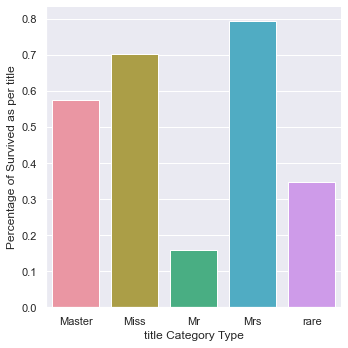

In [140]:
# Set Variable Types
Titanic_Train['title'] = Titanic_Train['title'].astype('category')
Titanic_Train['Survived'] = to_numeric(Titanic_Train['Survived'])

factorplot(x="title", y="Survived", data=Titanic_Train, kind="bar", ci=None)
xlabel('title Category Type')
ylabel('Percentage of Survived as per title')

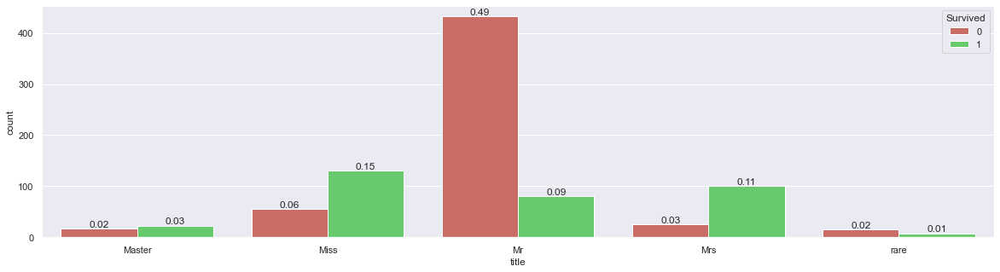

In [141]:
# % of Survived & Not Survived as per each factor of "title" Categorical feature
set(style="darkgrid")
set_palette("hls",3) #3 is no of Colours
fig, ax = subplots(figsize=(20,5))
ax = countplot(x="title", hue="Survived", data=Titanic_Train)
for p in ax.patches:
    height = p.get_height()
    ax.text(p.get_x()+p.get_width()/2., # 2 indicates centre % placement on bar top
            height + 3, # 3 indicates % placement distance from the Bar Top
            '{:1.2f}'.format(height/Titanic_Train.shape[0]),
            ha="center")

In [142]:
# Adjusted Bonferroni P-Value=0.05/3, 3 is number of Pairs
# The goal is to examine the P-Value for each of the Paired Comparisons and to use the Adjusted Bonferroni P-Value=0.017
# To evaluate significance
ObsTable=crosstab(Titanic_Train['Survived'],Titanic_Train['title'])
chiVal, pVal, df, ExpTable = chi2_contingency(ObsTable)
colTotals = ObsTable.sum()
nCols = len(colTotals)
print(nCols, colTotals)

rowTotals = ObsTable.sum(axis=1)
nRows = len(rowTotals)
print(nRows, rowTotals)

n = sum(rowTotals)

phRes = DataFrame(columns=['Survived', 'title', 'Adj. Res.'])
for i in range(nRows):
    for j in range(nCols):
        AdjRes = (ObsTable.iloc[i,j] - ExpTable[i,j]) / (ExpTable[i,j]*(1-rowTotals[i]/n)*(1-colTotals[j]/n))**0.5
        phRes = phRes.append({'Survived':ObsTable.index[i], 'title':ObsTable.columns[j], 'Adj. Res.':AdjRes}, ignore_index=True)
phRes
#These adjusted residuals are so-called z-values. So we can convert them to corresponding probabilities (p-values / sig.) using the standard normal distribution.
#For this we can use the 'norm.cdf' function from scipy.stats, so lets import that:
#The significance can then be added using:
phRes['Sig.'] = 2*(1-norm.cdf(abs(phRes['Adj. Res.'])))
phRes
#However, since we are doing multiple testing, we would have to adjust our found p-values.
#I'll use the Bonferroni correction, which simply multiplies the found p-value by the number of tests performed:
phRes['Adj. Sig.'] = phRes.shape[0]*phRes['Sig.']
phRes
#Ai, it worked but now some of our adj. sig. are above 1, which is in theory impossible.
#So lets replace those with a 1:
phRes.loc[phRes['Adj. Sig.']> 1, 'Adj. Sig.'] = 1
phRes

5 title
Master     40
Miss      185
Mr        513
Mrs       126
rare       23
dtype: int64
2 Survived
0    545
1    342
dtype: int64


,Survived,title,Adj. Res.,Sig.,Adj. Sig.
0,0,Master,-2.518910,0.011772,0.117719
1,0,Miss,-9.961698,0.000000,0.000000
2,0,Mr,16.315921,0.000000,0.000000
3,0,Mrs,-10.160473,0.000000,0.000000
4,0,rare,0.376808,0.706316,1.000000
5,1,Master,2.518910,0.011772,0.117719
6,1,Miss,9.961698,0.000000,0.000000
7,1,Mr,-16.315921,0.000000,0.000000
8,1,Mrs,10.160473,0.000000,0.000000
9,1,rare,-0.376808,0.706316,1.000000


Adjusted Bonferroni P-Value=0.05/10=0.005, Check for Adj. Sig. < 0.005

In [143]:
# Let's see the total Age of Passengers in each category of "Survived" feature
# groupby() will be applied to "Survived" & sum() will be applied to "Age" as per gropby() of "Survived"
# There is Significant Differences in the Total Age of Passengers in each category of "Survived" feature
Titanic_Train.Age.groupby(Titanic_Train.Survived).sum()

Survived
0    16484.92
1     9877.09
Name: Age, dtype: float64

In [144]:
# Let's see the Average Age of Passengers in each category of "Survived" feature
# groupby() will be applied to "Survived" & mean() will be applied to "Age" as per gropby() of "Survived"
# There is No Significant Differences in the Average Age of Passengers in each category of "Survived" feature
Titanic_Train.Age.groupby(Titanic_Train.Survived).mean()

Survived
0    30.24756
1    28.88038
Name: Age, dtype: float64

In [145]:
#Shows the frequency of each unique Entry/Element/Category of "Survived" Column
Titanic_Train.Survived.value_counts()

0    545
1    342
Name: Survived, dtype: int64

# Measures of Association between Categorical & Continuous Variable

In [146]:
#"Survived" is Nominal(Categorical) Independent Variable
#"Age" is Continuous(Ratio Scale) Dependent Variable

#There Should Be No Outliers for the Continuous Variable ie "Age" for each category of the "Survived" variable
#Continuous Variable Should be approximately normally distributed for each category of the "Survived" variable
#Continuous Variable Should have equal Variances for Each Category of the "Survived" variable
from scipy.stats import pointbiserialr
stat,pvalue=pointbiserialr(Titanic_Train['Survived'], Titanic_Train['Age'])
if pvalue <= 0.05:
    print("Alternate Hypothesis (H1): Survived and Age have some form of relationship.")
else:
    print("Null Hypothesis (H0) : Survived and Age are independent of each other.")
print("Confidence Level : {} %".format(((1- pvalue)*100)))
print('Statistics=%.3f, p=%.3f' % (stat, pvalue))

#Lets do Mann Whiteny U Test First
#Sampling of "Age" for each category of "Survived"
Survived_0=Titanic_Train[Titanic_Train.Survived==0]
Survived_1=Titanic_Train[Titanic_Train.Survived==1]
from scipy.stats import mannwhitneyu
stat,pvalue=mannwhitneyu(Survived_0.Age,Survived_1.Age)
if pvalue <= 0.05:
    print("Alternate Hypothesis (H1): Survived and Age have some form of relationship.")
else:
    print("Null Hypothesis (H0) : Survived and Age are independent of each other.")
print("Confidence Level : {} %".format(((1- pvalue)*100)))
print('Statistics=%.3f, p=%.3f' % (stat, pvalue))

#To find Correlation between "Age" & "Survived" we will Perform Kruskal Wallis H Test
#It is Non Parametric Version of One-Way-Anova
#Correlation between Titanic "Age" & Titanic "Survived"
from scipy.stats import kruskal
#Each Sample Must have at least 5 measurements
#At least two or more samples work for this test
#The samples are not required to have the same length
stat,pvalue=kruskal(Survived_0.Age,Survived_1.Age)
if pvalue <= 0.05:
    print("Alternate Hypothesis (H1): Survived and Age have some form of relationship.")
else:
    print("Null Hypothesis (H0) : Survived and Age are independent of each other.")
print("Confidence Level : {} %".format(((1- pvalue)*100)))
print('Statistics=%.3f, p=%.3f' % (stat, pvalue))

#To find Correlation between "Survived" & "Age" we will Perform Moods Median Test
#It is Non Parametric Version of One-Way-Anova
#Correlation between Titanic "Age" & Titanic "Survived"
#Each Sample Must have at least 1 measurements
#At least two or more samples work for this test
#The samples are not required to have the same length
from scipy.stats import median_test
stat,pvalue,GrandMedian,ContigTable=median_test(Survived_0.Age,Survived_1.Age)
print(GrandMedian)
print(ContigTable)
if pvalue <= 0.05:
    print("Alternate Hypothesis (H1): Survived and Age have some form of relationship.")
else:
    print("Null Hypothesis (H0) : Survived and Age are independent of each other.")
print("Confidence Level : {} %".format(((1- pvalue)*100)))
print('Statistics=%.3f, p=%.3f' % (stat, pvalue))

#To find Correlation between "Age" & "Survived" we will Perform Spearman Rank Correlation
#Correlation between Rank of "Age" & Rank of "Survived"
#Distribution of Ranking Squared Differences
#Spearman Rank Correlation is not much efficient here due to lots of Tied Rank Scores in "Survived"
#The Magnitude of Each Variable doesnt really matter
#The only thing that we care about the Rank of Each Variable
#The Manual Binning of "Age" for each category of "Survived"
#The Manual Ranking of "Age" & "Survived"
TotalAge=[16484.92,9877.09]
MeanAge=[30.24756,28.88038]
Survived=['0','1']
SurvivedFreq=[545,342]
correlation,pvalue = spearmanr(TotalAge,SurvivedFreq)
print('Spearmans correlation coefficient:%.3f' % correlation)
print(pvalue)
print("Confidence Level : {} %".format(((1- pvalue)*100)))
if pvalue <= 0.05:
    print("Alternate Hypothesis (H1) - Survived and Age have non linear relationship")
else:
    print("Null Hypothesis (H0)- Survived and Age have no non linear relationship")
    
#We will Perform Kendall's Rank Correlation due to lots of Tied Rank Scores in "Survived"
#To find Correlation between "Age" & "Survived" we will Perform Kendall's Rank Correlation
#Correlation between Rank of "Age" & Rank of "Survived"
#Kendall's Tau=(Concordant-Discordant/Concordant+Discordant)
from scipy.stats import kendalltau
correlation,pvalue = kendalltau(TotalAge,SurvivedFreq)
print("Kendall's Rank correlation coefficient:%.3f" % correlation)
print(pvalue)
print("Confidence Level : {} %".format(((1- pvalue)*100)))
if pvalue <= 0.05:
    print("Alternate Hypothesis (H1) - Survived and Age have non linear relationship")
else:
    print("Null Hypothesis (H0)- Survived and Age have no non linear relationship")


#To find Correlation between "Age" & "Survived" we will Perform Wilcoxon Rank Sum Test
#It is Non Parametric Version of independent 2 sample T test
#Correlation between Titanic "Age" & Titanic "Survived"
#Each Sample Must have at least 1 measurements
#Only two samples work for this test
#The samples are not required to have the same length
correlation,pvalue = ranksums(Survived_0.Age,Survived_1.Age)
print("Wilcoxon Rank Sum correlation coefficient:%.3f" % correlation)
print(pvalue)
print("Confidence Level : {} %".format(((1- pvalue)*100)))
if pvalue <= 0.05:
    print("Alternate Hypothesis (H1) - Survived and Age have non linear relationship")
else:
    print("Null Hypothesis (H0)- Survived and Age have no non linear relationship")

Null Hypothesis (H0) : Survived and Age are independent of each other.
Confidence Level : nan %
Statistics=nan, p=nan
Null Hypothesis (H0) : Survived and Age are independent of each other.
Confidence Level : 79.85865599004602 %
Statistics=90088.500, p=0.201
Null Hypothesis (H0) : Survived and Age are independent of each other.
Confidence Level : 59.72488411140762 %
Statistics=0.700, p=0.403
28.0
[[266 171]
 [279 171]]
Null Hypothesis (H0) : Survived and Age are independent of each other.
Confidence Level : 21.80836631337948 %
Statistics=0.077, p=0.782
Spearmans correlation coefficient:1.000
nan
Confidence Level : nan %
Null Hypothesis (H0)- Survived and Age have no non linear relationship
Kendall's Rank correlation coefficient:1.000
1.0
Confidence Level : 0.0 %
Null Hypothesis (H0)- Survived and Age have no non linear relationship
Wilcoxon Rank Sum correlation coefficient:0.836
0.4028972359375448
Confidence Level : 59.71027640624552 %
Null Hypothesis (H0)- Survived and Age have no non 

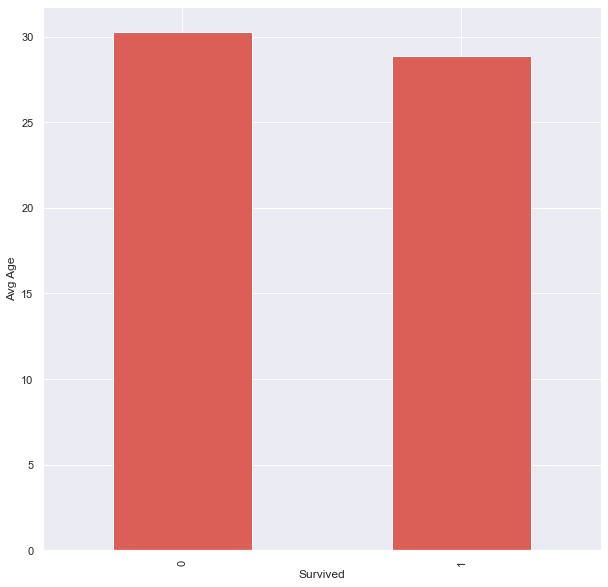

In [147]:
#Measures of Association between Titanic "Age" & Titanic "Survived"
#Let's see the average Age of Passengers in each category of "Survived" feature
#groupby() will be applied to "Survived" & mean() will be applied to "Age" as per gropby() of "Survived"
Titanic_Train[['Survived','Age']].groupby("Survived").mean().plot(kind='bar',legend = False).set(xlabel='Survived', ylabel='Avg Age')
xticks(rotation = 90) # 90 degree Vertical alignment of "Survived" category names
show()
#There is No significant impact of Titanic "Survived" change with respect to Titanic "Age" feature
#So Titanic "Survived" is not Titanic "Age" feature sensitive

<AxesSubplot:title={'center':'Age'}, xlabel='Survived'>

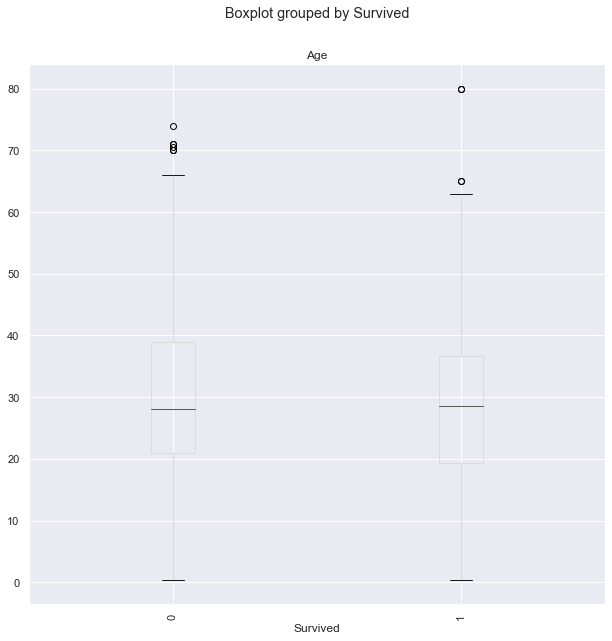

In [148]:
#Lets see the Boxplot of Titanic "Age" grouped by "Survived" feature
Titanic_Train.boxplot("Age",by="Survived",rot=90)

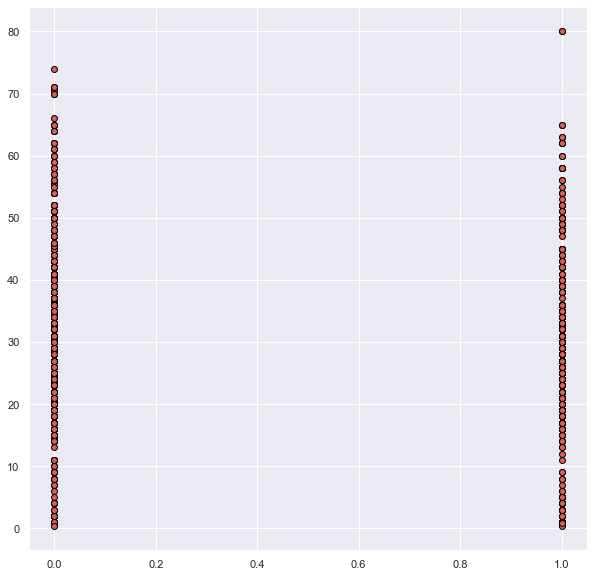

In [149]:
#"Survived" is Nominal(Categorical) Independent Variable
#"Age" is Continuous(Ratio Scale) Dependent Variable
scatter(Titanic_Train['Survived'],Titanic_Train['Age'],edgecolor='black') #Scatter plot

In [150]:
# Let's see the total Fare of Passengers in each category of "Survived" feature
# groupby() will be applied to "Survived" & sum() will be applied to "Fare" as per gropby() of "Survived"
# There is Significant Differences in the Total Fare of Passengers in each category of "Survived" feature
Titanic_Train.name_length.groupby(Titanic_Train.Survived).sum()

Survived
0    13383
1    10558
Name: name_length, dtype: int64

In [151]:
# Let's see the Average Age of Passengers in each category of "Survived" feature
# groupby() will be applied to "Survived" & mean() will be applied to "Fare" as per gropby() of "Survived"
# There is No Significant Differences in the Average Fare of Passengers in each category of "Survived" feature
Titanic_Train.name_length.groupby(Titanic_Train.Survived).mean()

Survived
0    24.555963
1    30.871345
Name: name_length, dtype: float64

In [152]:
#"Survived" is Nominal(Categorical) Independent Variable
#"name_length" is Continuous(Ratio Scale) Dependent Variable

#There Should Be No Outliers for the Continuous Variable ie "DEBTINC" for each category of the "DEFAULTER" variable
#Continuous Variable Should be approximately normally distributed for each category of the "DEFAULTER" variable
#Continuous Variable Should have equal Variances for Each Category of the "DEFAULTER" variable
from scipy.stats import pointbiserialr
stat,pvalue=pointbiserialr(Titanic_Train['Survived'], Titanic_Train['name_length'])
if pvalue <= 0.05:
    print("Alternate Hypothesis (H1): Survived and name_length have some form of relationship.")
else:
    print("Null Hypothesis (H0) : Survived and name_length are independent of each other.")
print("Confidence Level : {} %".format(((1- pvalue)*100)))
print('Statistics=%.3f, p=%.3f' % (stat, pvalue))

#Lets do Mann Whiteny U Test First
#Sampling of "name_length" for each category of "Survived"
Survived_0=Titanic_Train[Titanic_Train.Survived==0]
Survived_1=Titanic_Train[Titanic_Train.Survived==1]
from scipy.stats import mannwhitneyu
stat,pvalue=mannwhitneyu(Survived_0.name_length,Survived_1.name_length)
if pvalue <= 0.05:
    print("Alternate Hypothesis (H1): Survived and name_length have some form of relationship.")
else:
    print("Null Hypothesis (H0) : Survived and name_length are independent of each other.")
print("Confidence Level : {} %".format(((1- pvalue)*100)))
print('Statistics=%.3f, p=%.3f' % (stat, pvalue))

#To find Correlation between "name_length" & "Survived" we will Perform Kruskal Wallis H Test
#It is Non Parametric Version of One-Way-Anova
#Correlation between Titanic "name_length" & Titanic "Survived"
from scipy.stats import kruskal
#Each Sample Must have at least 5 measurements
#At least two or more samples work for this test
#The samples are not required to have the same length
stat,pvalue=kruskal(Survived_0.name_length,Survived_1.name_length)
if pvalue <= 0.05:
    print("Alternate Hypothesis (H1): Survived and name_length have some form of relationship.")
else:
    print("Null Hypothesis (H0) : Survived and name_length are independent of each other.")
print("Confidence Level : {} %".format(((1- pvalue)*100)))
print('Statistics=%.3f, p=%.3f' % (stat, pvalue))

#To find Correlation between "Survived" & "name_length" we will Perform Moods Median Test
#It is Non Parametric Version of One-Way-Anova
#Correlation between Titanic "name_length" & Titanic "Survived"
#Each Sample Must have at least 1 measurements
#At least two or more samples work for this test
#The samples are not required to have the same length
from scipy.stats import median_test
stat,pvalue,GrandMedian,ContigTable=median_test(Survived_0.name_length,Survived_1.name_length)
print(GrandMedian)
print(ContigTable)
if pvalue <= 0.05:
    print("Alternate Hypothesis (H1): Survived and name_length have some form of relationship.")
else:
    print("Null Hypothesis (H0) : Survived and name_length are independent of each other.")
print("Confidence Level : {} %".format(((1- pvalue)*100)))
print('Statistics=%.3f, p=%.3f' % (stat, pvalue))

#To find Correlation between "name_length" & "Survived" we will Perform Spearman Rank Correlation
#Correlation between Rank of "name_length" & Rank of "Survived"
#Distribution of Ranking Squared Differences
#Spearman Rank Correlation is not much efficient here due to lots of Tied Rank Scores in "Survived"
#The Magnitude of Each Variable doesnt really matter
#The only thing that we care about the Rank of Each Variable
#The Manual Binning of "name_length" for each category of "Survived"
#The Manual Ranking of "name_length" & "Survived"
Totalname_length=[13383,10558]
Meanname_length=[24.555963,30.871345]
Survived=['0','1']
SurvivedFreq=[545,342]
correlation,pvalue = spearmanr(Totalname_length,SurvivedFreq)
print('Spearmans correlation coefficient:%.3f' % correlation)
print(pvalue)
print("Confidence Level : {} %".format(((1- pvalue)*100)))
if pvalue <= 0.05:
    print("Alternate Hypothesis (H1) - Survived and name_length have non linear relationship")
else:
    print("Null Hypothesis (H0)- Survived and name_length have no non linear relationship")
    
#We will Perform Kendall's Rank Correlation due to lots of Tied Rank Scores in "Survived"
#To find Correlation between "name_length" & "Survived" we will Perform Kendall's Rank Correlation
#Correlation between Rank of "name_length" & Rank of "Survived"
#Kendall's Tau=(Concordant-Discordant/Concordant+Discordant)
from scipy.stats import kendalltau
correlation,pvalue = kendalltau(Totalname_length,SurvivedFreq)
print("Kendall's Rank correlation coefficient:%.3f" % correlation)
print(pvalue)
print("Confidence Level : {} %".format(((1- pvalue)*100)))
if pvalue <= 0.05:
    print("Alternate Hypothesis (H1) - Survived and name_length have non linear relationship")
else:
    print("Null Hypothesis (H0)- Survived and name_length have no non linear relationship")


#To find Correlation between "name_length" & "Survived" we will Perform Wilcoxon Rank Sum Test
#It is Non Parametric Version of independent 2 sample T test
#Correlation between Titanic "name_length" & Titanic "Survived"
#Each Sample Must have at least 1 measurements
#Only two samples work for this test
#The samples are not required to have the same length
correlation,pvalue = ranksums(Survived_0.name_length,Survived_1.name_length)
print("Wilcoxon Rank Sum correlation coefficient:%.3f" % correlation)
print(pvalue)
print("Confidence Level : {} %".format(((1- pvalue)*100)))
if pvalue <= 0.05:
    print("Alternate Hypothesis (H1) - Survived and name_length have non linear relationship")
else:
    print("Null Hypothesis (H0)- Survived and name_length have no non linear relationship")

Null Hypothesis (H0) : Survived and name_length are independent of each other.
Confidence Level : nan %
Statistics=nan, p=nan
Alternate Hypothesis (H1): Survived and name_length have some form of relationship.
Confidence Level : 100.0 %
Statistics=59554.500, p=0.000
Alternate Hypothesis (H1): Survived and name_length have some form of relationship.
Confidence Level : 100.0 %
Statistics=82.213, p=0.000
25.0
[[216 216]
 [329 126]]
Alternate Hypothesis (H1): Survived and name_length have some form of relationship.
Confidence Level : 99.99999999855815 %
Statistics=45.612, p=0.000
Spearmans correlation coefficient:1.000
nan
Confidence Level : nan %
Null Hypothesis (H0)- Survived and name_length have no non linear relationship
Kendall's Rank correlation coefficient:1.000
1.0
Confidence Level : 0.0 %
Null Hypothesis (H0)- Survived and name_length have no non linear relationship
Wilcoxon Rank Sum correlation coefficient:-9.058
1.3278904894159915e-19
Confidence Level : 100.0 %
Alternate Hypothe

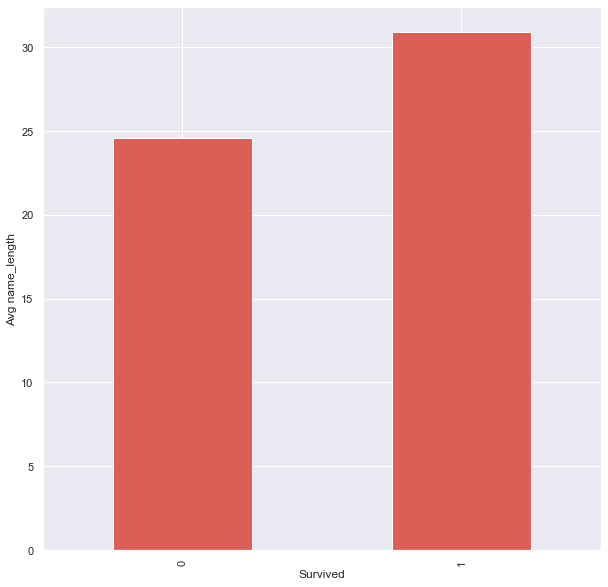

In [153]:
#Measures of Association between Titanic "name_length" & Titanic "Survived"
#Let's see the average Fare for each Passenger in each category of "Survived" feature
#groupby() will be applied to "Survived" & mean() will be applied to "Fare" as per gropby() of "Survived"
Titanic_Train[['Survived','name_length']].groupby("Survived").mean().plot(kind='bar',legend = False).set(xlabel='Survived', ylabel='Avg name_length')
xticks(rotation = 90) # 90 degree Vertical alignment of "Survived" category names
show()
#There is significant impact of Titanic "Survived" change with respect to Titanic "Fare" feature
#So Titanic "Survived" is Titanic "Fare" feature sensitive

<AxesSubplot:title={'center':'name_length'}, xlabel='Survived'>

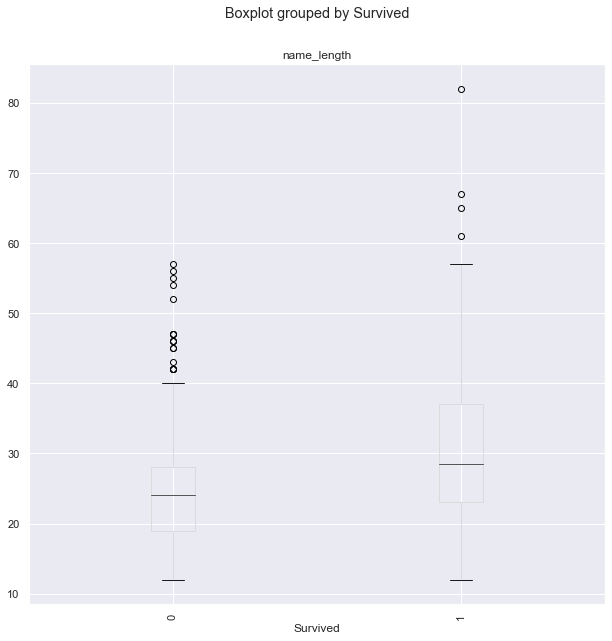

In [154]:
#Lets see the Boxplot of Titanic "Fare" grouped by "Survived" feature
Titanic_Train.boxplot("name_length",by="Survived",rot=90)

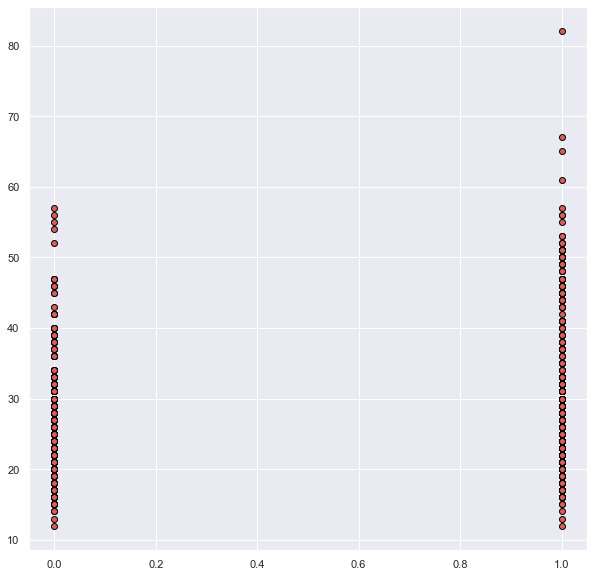

In [155]:
#"Survived" is Nominal(Categorical) Independent Variable
#"name_length" is Continuous(Ratio Scale) Dependent Variable
scatter(Titanic_Train['Survived'],Titanic_Train['name_length'],edgecolor='black') #Scatter plot

In [156]:
# Let's see the total Fare of Passengers in each category of "Survived" feature
# groupby() will be applied to "Survived" & sum() will be applied to "Fare" as per gropby() of "Survived"
# There is Significant Differences in the Total Fare of Passengers in each category of "Survived" feature
Titanic_Train.Fare.groupby(Titanic_Train.Survived).sum()

Survived
0    12106.0325
1    16551.2294
Name: Fare, dtype: float64

In [157]:
# Let's see the Average Age of Passengers in each category of "Survived" feature
# groupby() will be applied to "Survived" & mean() will be applied to "Fare" as per gropby() of "Survived"
# There is No Significant Differences in the Average Fare of Passengers in each category of "Survived" feature
Titanic_Train.Fare.groupby(Titanic_Train.Survived).mean()

Survived
0    22.212904
1    48.395408
Name: Fare, dtype: float64

In [158]:
#"Survived" is Nominal(Categorical) Independent Variable
#"Fare" is Continuous(Ratio Scale) Dependent Variable

#To find Correlation between "Fare" & "Survived" we will Perform Kruskal Wallis H Test
#It is Non Parametric Version of One-Way-Anova
#Correlation between Titanic "Fare" & Titanic "Survived"
#Sampling of "Fare" for each category of "Survived"
Survived_0=Titanic_Train[Titanic_Train.Survived==0]
Survived_1=Titanic_Train[Titanic_Train.Survived==1]

#There Should Be No Outliers for the Continuous Variable ie "DEBTINC" for each category of the "DEFAULTER" variable
#Continuous Variable Should be approximately normally distributed for each category of the "DEFAULTER" variable
#Continuous Variable Should have equal Variances for Each Category of the "DEFAULTER" variable
stat,pvalue=pointbiserialr(Titanic_Train['Survived'], Titanic_Train['Fare'])
if pvalue <= 0.05:
    print("Alternate Hypothesis (H1): Survived and Fare have some form of relationship.")
else:
    print("Null Hypothesis (H0) : Survived and Fare are independent of each other.")
print("Confidence Level : {} %".format(((1- pvalue)*100)))
print('Statistics=%.3f, p=%.3f' % (stat, pvalue))

#Lets do Mann Whiteny U Test First
stat,pvalue=mannwhitneyu(Survived_0.Fare,Survived_1.Fare)
if pvalue <= 0.05:
    print("Alternate Hypothesis (H1): Survived and Fare have some form of relationship.")
else:
    print("Null Hypothesis (H0) : Survived and Fare are independent of each other.")
print("Confidence Level : {} %".format(((1- pvalue)*100)))
print('Statistics=%.3f, p=%.3f' % (stat, pvalue))

#Each Sample Must have at least 5 measurements
#At least two or more samples work for this test
#The samples are not required to have the same length
stat,pvalue=kruskal(Survived_0.Fare,Survived_1.Fare)
if pvalue <= 0.05:
    print("Alternate Hypothesis (H1): Survived and Fare have some form of relationship.")
else:
    print("Null Hypothesis (H0) : Survived and Fare are independent of each other.")
print("Confidence Level : {} %".format(((1- pvalue)*100)))
print('Statistics=%.3f, p=%.3f' % (stat, pvalue))

#To find Correlation between "Survived" & "Fare" we will Perform Moods Median Test
#It is Non Parametric Version of One-Way-Anova
#Correlation between Titanic "Fare" & Titanic "Survived"
#Each Sample Must have at least 1 measurements
#At least two or more samples work for this test
#The samples are not required to have the same length
stat,pvalue,GrandMedian,ContigTable=median_test(Survived_0.Fare,Survived_1.Fare)
print(GrandMedian)
print(ContigTable)
if pvalue <= 0.05:
    print("Alternate Hypothesis (H1): Survived and Fare have some form of relationship.")
else:
    print("Null Hypothesis (H0) : Survived and Fare are independent of each other.")
print("Confidence Level : {} %".format(((1- pvalue)*100)))
print('Statistics=%.3f, p=%.3f' % (stat, pvalue))

#To find Correlation between "Fare" & "Survived" we will Perform Spearman Rank Correlation
#Correlation between Rank of "Fare" & Rank of "Survived"
#Distribution of Ranking Squared Differences
#Spearman Rank Correlation is not much efficient here due to lots of Tied Rank Scores in "Survived"
#The Magnitude of Each Variable doesnt really matter
#The only thing that we care about the Rank of Each Variable
#The Manual Binning of "Fare" for each category of "Survived"
#The Manual Ranking of "Fare" & "Survived"
TotalFare=[12106.0325,16551.2294]
MeanFare=[22.117887,48.395408]
Survived=['0','1']
SurvivedFreq=[545,342]

correlation,pvalue = spearmanr(TotalFare,SurvivedFreq)
print('Spearmans correlation coefficient:%.3f' % correlation)
print(pvalue)
print("Confidence Level : {} %".format(((1- pvalue)*100)))
if pvalue <= 0.05:
    print("Alternate Hypothesis (H1) - Survived and Fare have non linear relationship")
else:
    print("Null Hypothesis (H0)- Survived and Fare have no non linear relationship")
    
#We will Perform Kendall's Rank Correlation due to lots of Tied Rank Scores in "Survived"
#To find Correlation between "Fare" & "Survived" we will Perform Kendall's Rank Correlation
#Correlation between Rank of "Fare" & Rank of "Survived"
#Kendall's Tau=(Concordant-Discordant/Concordant+Discordant)
correlation,pvalue = kendalltau(TotalFare,SurvivedFreq)
print("Kendall's Rank correlation coefficient:%.3f" % correlation)
print(pvalue)
print("Confidence Level : {} %".format(((1- pvalue)*100)))
if pvalue <= 0.05:
    print("Alternate Hypothesis (H1) - Survived and Fare have non linear relationship")
else:
    print("Null Hypothesis (H0)- Survived and Fare have no non linear relationship")

    
#To find Correlation between "Price" & "fueltype" we will Perform Wilcoxon Rank Sum Test
#It is Non Parametric Version of independent 2 sample T test
#Correlation between CAR "Price" & CAR "fueltype"
#Each Sample Must have at least 1 measurements
#Only two samples work for this test
#The samples are not required to have the same length
correlation,pvalue = ranksums(Survived_0.Fare,Survived_1.Fare)
print("Wilcoxon Rank Sum correlation coefficient:%.3f" % correlation)
print(pvalue)
print("Confidence Level : {} %".format(((1- pvalue)*100)))
if pvalue <= 0.05:
    print("Alternate Hypothesis (H1) - Survived and Fare have non linear relationship")
else:
    print("Null Hypothesis (H0)- Survived and Fare have no non linear relationship")

Null Hypothesis (H0) : Survived and Fare are independent of each other.
Confidence Level : nan %
Statistics=nan, p=nan
Alternate Hypothesis (H1): Survived and Fare have some form of relationship.
Confidence Level : 100.0 %
Statistics=57578.000, p=0.000
Alternate Hypothesis (H1): Survived and Fare have some form of relationship.
Confidence Level : 100.0 %
Statistics=92.014, p=0.000
14.4583
[[211 230]
 [334 112]]
Alternate Hypothesis (H1): Survived and Fare have some form of relationship.
Confidence Level : 99.99999999999997 %
Statistics=67.310, p=0.000
Spearmans correlation coefficient:-1.000
nan
Confidence Level : nan %
Null Hypothesis (H0)- Survived and Fare have no non linear relationship
Kendall's Rank correlation coefficient:-1.000
1.0
Confidence Level : 0.0 %
Null Hypothesis (H0)- Survived and Fare have no non linear relationship
Wilcoxon Rank Sum correlation coefficient:-9.590
8.786725287964793e-22
Confidence Level : 100.0 %
Alternate Hypothesis (H1) - Survived and Fare have non 

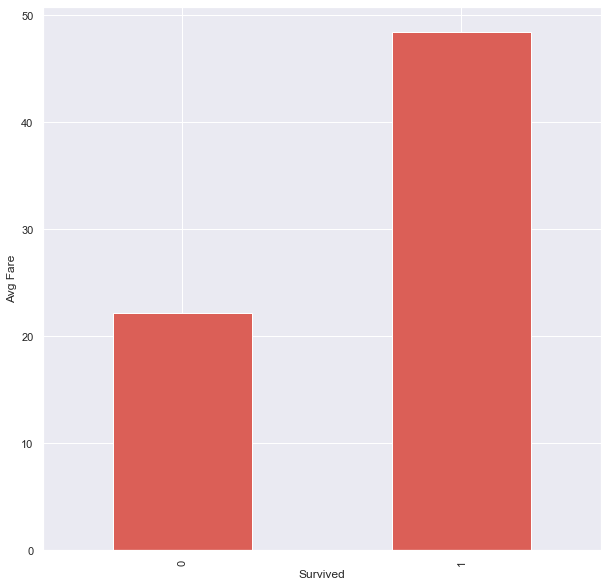

In [159]:
#Measures of Association between Titanic "Fare" & Titanic "Survived"
#Let's see the average Fare for each Passenger in each category of "Survived" feature
#groupby() will be applied to "Survived" & mean() will be applied to "Fare" as per gropby() of "Survived"
Titanic_Train[['Survived','Fare']].groupby("Survived").mean().plot(kind='bar',legend = False).set(xlabel='Survived', ylabel='Avg Fare')
xticks(rotation = 90) # 90 degree Vertical alignment of "Survived" category names
show()
#There is significant impact of Titanic "Survived" change with respect to Titanic "Fare" feature
#So Titanic "Survived" is Titanic "Fare" feature sensitive

<AxesSubplot:title={'center':'Fare'}, xlabel='Survived'>

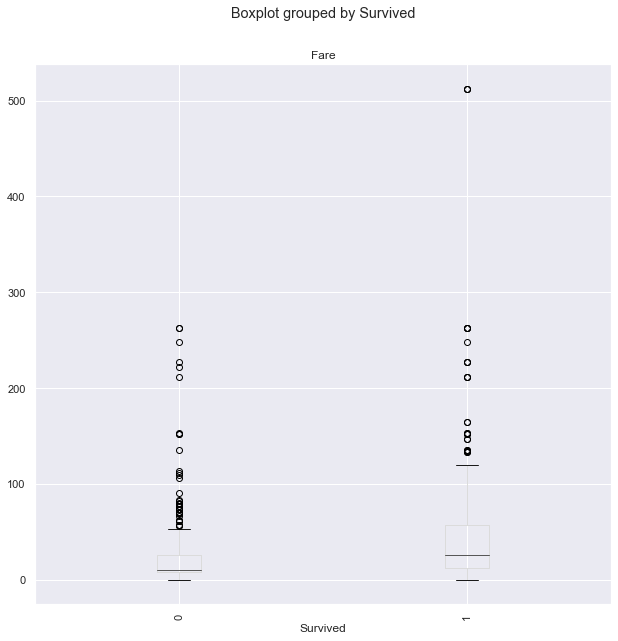

In [160]:
#Lets see the Boxplot of Titanic "Fare" grouped by "Survived" feature
Titanic_Train.boxplot("Fare",by="Survived",rot=90)

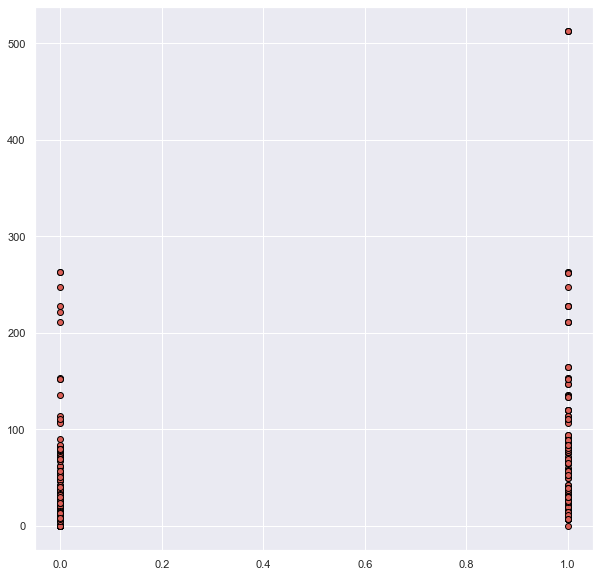

In [161]:
#"Survived" is Nominal(Categorical) Independent Variable
#"Fare" is Continuous(Ratio Scale) Dependent Variable
scatter(Titanic_Train['Survived'],Titanic_Train['Fare'],edgecolor='black') #Scatter plot

This BoxPlot unveils a couple of interesting insights. Let's find out.
* The BoxPlot above clearly demonstrates the One outlier with Fare of over \$500. At this point, I think we are quite confident that this outlier should be deleted.
* Most of the passengers were with in the Fare range of \$300. 

In [162]:
# Let's see the total Fare of Passengers in each category of "Survived" feature
# groupby() will be applied to "Survived" & sum() will be applied to "Fare" as per gropby() of "Survived"
# There is Significant Differences in the Total Fare of Passengers in each category of "Survived" feature
Titanic_Train.Average_Fare.groupby(Titanic_Train.Survived).sum()

Survived
0     7457.800613
1    10251.002212
Name: Average_Fare, dtype: float64

In [163]:
# Let's see the Average Age of Passengers in each category of "Survived" feature
# groupby() will be applied to "Survived" & mean() will be applied to "Fare" as per gropby() of "Survived"
# There is No Significant Differences in the Average Fare of Passengers in each category of "Survived" feature
Titanic_Train.Average_Fare.groupby(Titanic_Train.Survived).mean()

Survived
0    13.684038
1    29.973691
Name: Average_Fare, dtype: float64

In [164]:
#"Survived" is Nominal(Categorical) Independent Variable
#"Fare" is Continuous(Ratio Scale) Dependent Variable

#To find Correlation between "Fare" & "Survived" we will Perform Kruskal Wallis H Test
#It is Non Parametric Version of One-Way-Anova
#Correlation between Titanic "Fare" & Titanic "Survived"
#Sampling of "Fare" for each category of "Survived"
Survived_0=Titanic_Train[Titanic_Train.Survived==0]
Survived_1=Titanic_Train[Titanic_Train.Survived==1]

#There Should Be No Outliers for the Continuous Variable ie "DEBTINC" for each category of the "DEFAULTER" variable
#Continuous Variable Should be approximately normally distributed for each category of the "DEFAULTER" variable
#Continuous Variable Should have equal Variances for Each Category of the "DEFAULTER" variable
stat,pvalue=pointbiserialr(Titanic_Train['Survived'], Titanic_Train['Average_Fare'])
if pvalue <= 0.05:
    print("Alternate Hypothesis (H1): Survived and Average_Fare have some form of relationship.")
else:
    print("Null Hypothesis (H0) : Survived and Average_Fare are independent of each other.")
print("Confidence Level : {} %".format(((1- pvalue)*100)))
print('Statistics=%.3f, p=%.3f' % (stat, pvalue))

#Lets do Mann Whiteny U Test First
stat,pvalue=mannwhitneyu(Survived_0.Average_Fare,Survived_1.Average_Fare)
if pvalue <= 0.05:
    print("Alternate Hypothesis (H1): Survived and Average_Fare have some form of relationship.")
else:
    print("Null Hypothesis (H0) : Survived and Average_Fare are independent of each other.")
print("Confidence Level : {} %".format(((1- pvalue)*100)))
print('Statistics=%.3f, p=%.3f' % (stat, pvalue))

#Each Sample Must have at least 5 measurements
#At least two or more samples work for this test
#The samples are not required to have the same length
stat,pvalue=kruskal(Survived_0.Average_Fare,Survived_1.Average_Fare)
if pvalue <= 0.05:
    print("Alternate Hypothesis (H1): Survived and Average_Fare have some form of relationship.")
else:
    print("Null Hypothesis (H0) : Survived and Average_Fare are independent of each other.")
print("Confidence Level : {} %".format(((1- pvalue)*100)))
print('Statistics=%.3f, p=%.3f' % (stat, pvalue))

#To find Correlation between "Survived" & "Fare" we will Perform Moods Median Test
#It is Non Parametric Version of One-Way-Anova
#Correlation between Titanic "Fare" & Titanic "Survived"
#Each Sample Must have at least 1 measurements
#At least two or more samples work for this test
#The samples are not required to have the same length
stat,pvalue,GrandMedian,ContigTable=median_test(Survived_0.Average_Fare,Survived_1.Average_Fare)
print(GrandMedian)
print(ContigTable)
if pvalue <= 0.05:
    print("Alternate Hypothesis (H1): Survived and Average_Fare have some form of relationship.")
else:
    print("Null Hypothesis (H0) : Survived and Average_Fare are independent of each other.")
print("Confidence Level : {} %".format(((1- pvalue)*100)))
print('Statistics=%.3f, p=%.3f' % (stat, pvalue))

#To find Correlation between "Fare" & "Survived" we will Perform Spearman Rank Correlation
#Correlation between Rank of "Fare" & Rank of "Survived"
#Distribution of Ranking Squared Differences
#Spearman Rank Correlation is not much efficient here due to lots of Tied Rank Scores in "Survived"
#The Magnitude of Each Variable doesnt really matter
#The only thing that we care about the Rank of Each Variable
#The Manual Binning of "Fare" for each category of "Survived"
#The Manual Ranking of "Fare" & "Survived"
TotalFare=[7457.800613,10251.002212]
MeanFare=[13.651162,29.460706]
Survived=['0','1']
SurvivedFreq=[545,342]

correlation,pvalue = spearmanr(TotalFare,SurvivedFreq)
print('Spearmans correlation coefficient:%.3f' % correlation)
print(pvalue)
print("Confidence Level : {} %".format(((1- pvalue)*100)))
if pvalue <= 0.05:
    print("Alternate Hypothesis (H1) - Survived and Average_Fare have non linear relationship")
else:
    print("Null Hypothesis (H0)- Survived and Average_Fare have no non linear relationship")
    
#We will Perform Kendall's Rank Correlation due to lots of Tied Rank Scores in "Survived"
#To find Correlation between "Fare" & "Survived" we will Perform Kendall's Rank Correlation
#Correlation between Rank of "Fare" & Rank of "Survived"
#Kendall's Tau=(Concordant-Discordant/Concordant+Discordant)
correlation,pvalue = kendalltau(TotalFare,SurvivedFreq)
print("Kendall's Rank correlation coefficient:%.3f" % correlation)
print(pvalue)
print("Confidence Level : {} %".format(((1- pvalue)*100)))
if pvalue <= 0.05:
    print("Alternate Hypothesis (H1) - Survived and Average_Fare have non linear relationship")
else:
    print("Null Hypothesis (H0)- Survived and Average_Fare have no non linear relationship")

    
#To find Correlation between "Average_Fare" & "Survived" we will Perform Wilcoxon Rank Sum Test
#It is Non Parametric Version of independent 2 sample T test
#Correlation between Titanic "Average_Fare" & Titanic "Survived"
#Each Sample Must have at least 1 measurements
#Only two samples work for this test
#The samples are not required to have the same length
correlation,pvalue = ranksums(Survived_0.Average_Fare,Survived_1.Average_Fare)
print("Wilcoxon Rank Sum correlation coefficient:%.3f" % correlation)
print(pvalue)
print("Confidence Level : {} %".format(((1- pvalue)*100)))
if pvalue <= 0.05:
    print("Alternate Hypothesis (H1) - Survived and Average_Fare have non linear relationship")
else:
    print("Null Hypothesis (H0)- Survived and Average_Fare have no non linear relationship")

Null Hypothesis (H0) : Survived and Average_Fare are independent of each other.
Confidence Level : nan %
Statistics=nan, p=nan
Alternate Hypothesis (H1): Survived and Average_Fare have some form of relationship.
Confidence Level : 99.99999999999991 %
Statistics=63629.500, p=0.000
Alternate Hypothesis (H1): Survived and Average_Fare have some form of relationship.
Confidence Level : 99.99999999999983 %
Statistics=63.419, p=0.000
8.3625
[[217 226]
 [328 116]]
Alternate Hypothesis (H1): Survived and Average_Fare have some form of relationship.
Confidence Level : 99.99999999999551 %
Statistics=56.941, p=0.000
Spearmans correlation coefficient:-1.000
nan
Confidence Level : nan %
Null Hypothesis (H0)- Survived and Average_Fare have no non linear relationship
Kendall's Rank correlation coefficient:-1.000
1.0
Confidence Level : 0.0 %
Null Hypothesis (H0)- Survived and Average_Fare have no non linear relationship
Wilcoxon Rank Sum correlation coefficient:-7.961
1.7089628007608673e-15
Confidence

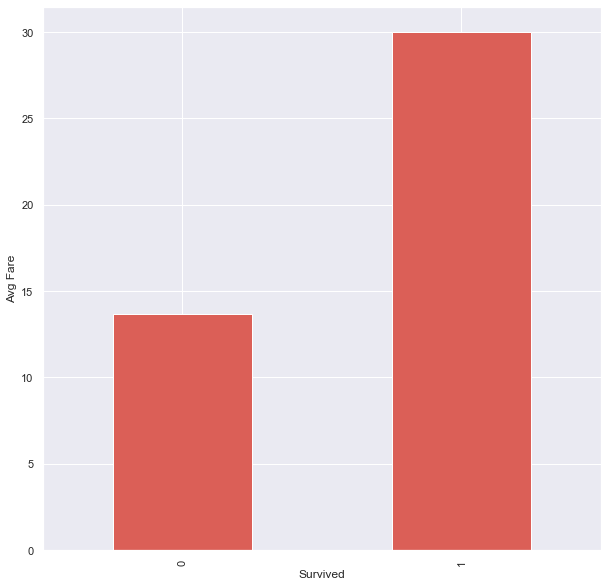

In [165]:
#Measures of Association between Titanic "Average_Fare" & Titanic "Survived"
#Let's see the average Fare for each Passenger in each category of "Survived" feature
#groupby() will be applied to "Survived" & mean() will be applied to "Fare" as per gropby() of "Survived"
Titanic_Train[['Survived','Average_Fare']].groupby("Survived").mean().plot(kind='bar',legend = False).set(xlabel='Survived', ylabel='Avg Fare')
xticks(rotation = 90) # 90 degree Vertical alignment of "Survived" category names
show()
#There is significant impact of Titanic "Survived" change with respect to Titanic "Fare" feature
#So Titanic "Survived" is Titanic "Fare" feature sensitive

<AxesSubplot:title={'center':'Average_Fare'}, xlabel='Survived'>

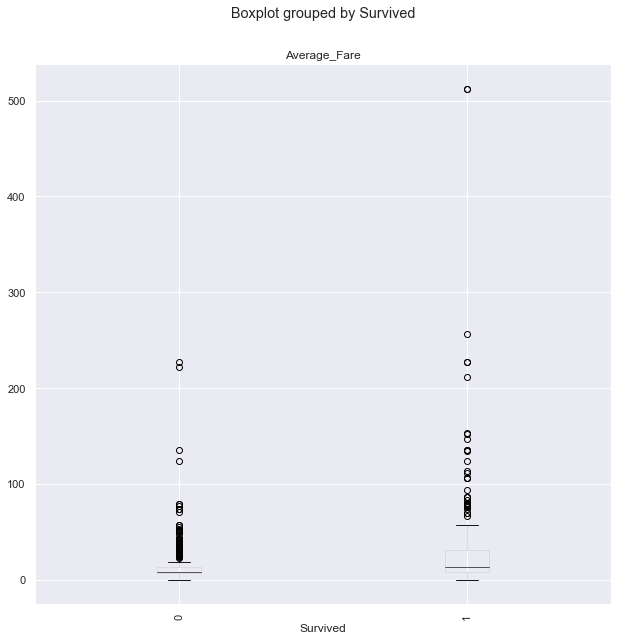

In [166]:
#Lets see the Boxplot of Titanic "Fare" grouped by "Survived" feature
Titanic_Train.boxplot("Average_Fare",by="Survived",rot=90)

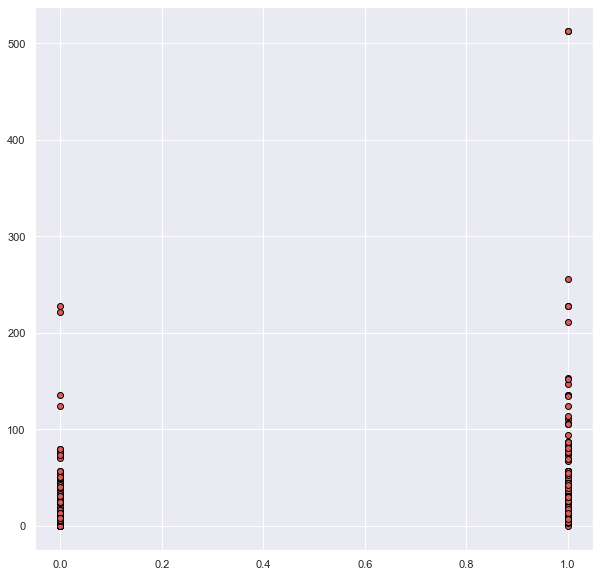

In [167]:
#"Survived" is Nominal(Categorical) Independent Variable
#"Average_Fare" is Continuous(Ratio Scale) Dependent Variable
scatter(Titanic_Train['Survived'],Titanic_Train['Average_Fare'],edgecolor='black') #Scatter plot

In [168]:
## dropping the outliers where Fare is over $500 for both Train & Test
Titanic_Train = Titanic_Train[Titanic_Train.Fare < 500]
Titanic_Test = Titanic_Test[Titanic_Test.Fare < 500]

In [169]:
## dropping the outliers where Fare is over $500 for both Train & Test
Titanic_Train = Titanic_Train[Titanic_Train.Average_Fare < 500]
Titanic_Test = Titanic_Test[Titanic_Test.Average_Fare < 500]

In [170]:
Titanic_Train

,Survived,Pclass,Gender,Age,Fare,Cabin,BoardPort,Age_Group,WithFamily,Family_Size,Family_Group,Average_Fare,Fare_Group,name_length,nLength_group,title,Minor
0,0,3,male,22.00,7.2500,G,S,Young_Adult,1,2,small,3.625000,Very_low,23,medium,Mr,0
1,1,1,female,38.00,71.2833,C,C,adult,1,2,small,35.641650,high,51,long,Mrs,0
2,1,3,female,26.00,7.9250,G,S,Young_Adult,0,1,loner,7.925000,low,22,medium,Miss,0
3,1,1,female,35.00,53.1000,C,S,Young_Adult,1,2,small,26.550000,high,44,good,Mrs,0
4,0,3,male,35.00,8.0500,G,S,Young_Adult,0,1,loner,8.050000,low,24,medium,Mr,0
5,0,3,male,28.00,8.4583,G,Q,Young_Adult,0,1,loner,8.458300,low,16,short,Mr,0
6,0,1,male,54.00,51.8625,E,S,middle_aged,0,1,loner,51.862500,very_high,23,medium,Mr,0
7,0,3,male,2.00,21.0750,F,S,toddler,1,5,large,4.215000,low,30,medium,Master,1
8,1,3,female,27.00,11.1333,G,S,Young_Adult,1,3,small,3.711100,Very_low,49,long,Mrs,0
9,1,2,female,14.00,30.0708,T,C,teenager,1,2,small,15.035400,mid,35,medium,Mrs,1


In [171]:
# detect duplicate DataFrame rows: True if an entire row is identical to a previous row
Titanic_Train.duplicated().tail()

886    False
887    False
888    False
889    False
890    False
dtype: bool

In [172]:
# examine the duplicate rows (ignoring the first occurrence)
Titanic_Train.loc[Titanic_Train.duplicated(keep='first'), :]

,Survived,Pclass,Gender,Age,Fare,Cabin,BoardPort,Age_Group,WithFamily,Family_Size,Family_Group,Average_Fare,Fare_Group,name_length,nLength_group,title,Minor


In [173]:
# drop the duplicate rows (inplace=False by default)
Titanic_Train.drop_duplicates(keep='first', inplace=True)
Titanic_Train.shape

(884, 17)

In [174]:
# detect duplicate DataFrame rows: True if an entire row is identical to a previous row
Titanic_Train.duplicated().tail()

886    False
887    False
888    False
889    False
890    False
dtype: bool

In [175]:
# Now we will remove these Rows filled with NaN
# If any cell of a Row/Rows having a NaN value then remove that Row/Rows
# Removal will be not original
# .shape will show the remaining no of rows after dropping the NaN rows
Titanic_Train.dropna(how="any",inplace=True)
Titanic_Train.shape

(884, 17)

# Saving Processed Data

In [176]:
#Saving This CAR DataFrame into DataFile folder as CleanCar.csv file
Titanic_Train.to_csv(r'D:\Python Data\Anwesh Python\DataFile\Titanic_Clean_Train.csv', index=False)

In [161]:
Titanic_Train=read_csv("DataFile\\Titanic_Clean_Train.csv",sep=',',header='infer',na_values=None,keep_default_na=True,na_filter=True,index_col=None) #Write the file path & name inside ("")
Titanic_Train

,Survived,Pclass,Gender,Age,Fare,Cabin,BoardPort,Age_Group,WithFamily,Family_Size,Family_Group,Average_Fare,Fare_Group,name_length,nLength_group,title,Minor
0,0,3,male,22.00,7.2500,G,S,Young_Adult,1,2,small,3.625000,Very_low,23,medium,Mr,0
1,1,1,female,38.00,71.2833,C,C,adult,1,2,small,35.641650,high,51,long,Mrs,0
2,1,3,female,26.00,7.9250,G,S,Young_Adult,0,1,loner,7.925000,low,22,medium,Miss,0
3,1,1,female,35.00,53.1000,C,S,Young_Adult,1,2,small,26.550000,high,44,good,Mrs,0
4,0,3,male,35.00,8.0500,G,S,Young_Adult,0,1,loner,8.050000,low,24,medium,Mr,0
5,0,3,male,28.00,8.4583,G,Q,Young_Adult,0,1,loner,8.458300,low,16,short,Mr,0
6,0,1,male,54.00,51.8625,E,S,middle_aged,0,1,loner,51.862500,very_high,23,medium,Mr,0
7,0,3,male,2.00,21.0750,F,S,toddler,1,5,large,4.215000,low,30,medium,Master,1
8,1,3,female,27.00,11.1333,G,S,Young_Adult,1,3,small,3.711100,Very_low,49,long,Mrs,0
9,1,2,female,14.00,30.0708,T,C,teenager,1,2,small,15.035400,mid,35,medium,Mrs,1


# Correlation/Association Check using Phik

In [162]:
# Phi_K is a new and practical correlation coefficient based on several refinements to Pearson’s hypothesis test of independence of two variables.
# The combined features of Phi_K form an advantage over existing coefficients. First, it works consistently between
# categorical, ordinal and interval variables. Second, it captures non-linear dependency. Third, it reverts to the Pearson
# correlation coefficient in case of a bi-variate normal input distribution. These are useful features when studying the
# correlation matrix of variables with mixed types.
# Phi-Correlation plot by using Heatmap
# All Categorical Columns
import phik
from phik import report
# get the phi-K correlation matrix between all variables
Titanic_Train.phik_matrix(interval_cols=['Age','Fare','Average_Fare','name_length'])

,Survived,Pclass,Gender,Age,Fare,Cabin,BoardPort,Age_Group,WithFamily,Family_Size,Family_Group,Average_Fare,Fare_Group,name_length,nLength_group,title,Minor
Survived,1.000000,0.202263,0.751708,0.136320,0.276722,0.436656,0.097830,0.074966,0.305124,0.286720,0.173200,0.349538,0.234801,0.325622,0.447359,0.467261,0.113912
Pclass,0.202263,1.000000,0.078062,0.349647,0.834124,0.725432,0.581789,0.450351,0.076840,0.417708,0.470439,0.733160,0.793549,0.337576,0.170027,0.244881,0.086061
Gender,0.751708,0.078062,1.000000,0.074311,0.197003,0.332919,0.070132,0.105210,0.454287,0.315029,0.183048,0.219393,0.124778,0.445440,0.623864,0.907816,0.112078
Age,0.136320,0.349647,0.074311,1.000000,0.223540,0.288512,0.103506,0.906030,0.346661,0.308765,0.367697,0.241881,0.389813,0.151719,0.162031,0.648287,1.000000
Fare,0.276722,0.834124,0.197003,0.223540,1.000000,0.737207,0.449048,0.299373,0.351815,0.646927,0.664951,0.767069,0.652738,0.337298,0.195381,0.240791,0.177494
Cabin,0.436656,0.725432,0.332919,0.288512,0.737207,1.000000,0.315124,0.301864,0.730440,0.602507,0.604956,0.745897,0.609185,0.296125,0.409466,0.345301,0.337001
BoardPort,0.097830,0.581789,0.070132,0.103506,0.449048,0.315124,1.000000,0.120531,0.064973,0.289231,0.356618,0.322790,0.299556,0.230605,0.143097,0.174770,0.000000
Age_Group,0.074966,0.450351,0.105210,0.906030,0.299373,0.301864,0.120531,1.000000,0.281657,0.469535,0.519328,0.227170,0.288239,0.184542,0.109434,0.534671,0.867185
WithFamily,0.305124,0.076840,0.454287,0.346661,0.351815,0.730440,0.064973,0.281657,1.000000,1.000000,1.000000,0.165337,0.126668,0.390676,0.570418,0.407493,0.383459
Family_Size,0.286720,0.417708,0.315029,0.308765,0.646927,0.602507,0.289231,0.469535,1.000000,1.000000,1.000000,0.077708,0.244088,0.467666,0.358443,0.489969,0.408494


In [163]:
# get global correlations based on phi_K correlation matrix
Titanic_Train.global_phik(interval_cols=['Age', 'Fare','Average_Fare','name_length'])

D:\D Program Files\Anaconda\lib\site-packages\phik\phik.py:248: RuntimeWarning: invalid value encountered in sqrt
  global_correlations = np.array([[np.sqrt(1 - 1/(V[i][i] * Vinv[i][i]))] for i in range(V.shape[0])])


(array([[0.69571715],
        [1.55184284],
        [1.38392712],
        [0.94442225],
        [0.87250157],
        [0.81699529],
        [0.59486184],
        [0.8752394 ],
        [1.50335468],
        [6.57808137],
        [       nan],
        [       nan],
        [0.80227458],
        [0.89648887],
        [0.89442468],
        [1.64089133],
        [0.73980101]]),
 array(['Survived', 'Pclass', 'Gender', 'Age', 'Fare', 'Cabin',
        'BoardPort', 'Age_Group', 'WithFamily', 'Family_Size',
        'Family_Group', 'Average_Fare', 'Fare_Group', 'name_length',
        'nLength_group', 'title', 'Minor'], dtype=object))

In [164]:
# get the significance matrix (expressed as one-sided Z)
# of the hypothesis test of each variable-pair dependency
Titanic_Train.significance_matrix(interval_cols=['Age', 'Fare','Average_Fare','name_length'])

,Survived,Pclass,Gender,Age,Fare,Cabin,BoardPort,Age_Group,WithFamily,Family_Size,Family_Group,Average_Fare,Fare_Group,name_length,nLength_group,title,Minor
Survived,34.068258,9.651476,16.275750,1.748604,6.964983,8.812118,4.397246,1.013794,5.843794,7.574830,8.265615,6.773836,7.889612,8.777614,8.567302,16.776392,2.102787
Pclass,9.651476,41.525880,3.475933,7.471219,22.057409,25.822047,10.377511,7.395188,3.420064,6.991745,7.508274,25.725609,32.364308,4.944093,5.997093,7.395862,4.166262
Gender,16.275750,3.475933,33.658838,0.813882,4.445187,6.396532,2.973294,2.298257,8.930733,8.151154,8.652737,3.754076,3.714362,12.613689,12.665178,33.290462,2.115887
Age,1.748604,7.471219,0.813882,55.207331,5.088505,6.548559,0.915867,41.248400,6.706567,6.549353,7.172042,5.858689,7.288753,3.286230,2.991801,13.495547,25.876926
Fare,6.964983,22.057409,4.445187,5.088505,41.229130,31.307084,7.172362,4.897567,9.531392,13.314795,12.370912,24.525961,23.011083,3.410593,3.679398,5.060413,3.892436
Cabin,8.812118,25.822047,6.396532,6.548559,31.307084,50.606465,7.333401,6.744430,16.441462,18.490474,17.654430,23.152687,24.434320,7.859681,8.033381,9.763142,5.874445
BoardPort,4.397246,10.377511,2.973294,0.915867,7.172362,7.333401,36.352054,0.858475,2.884460,4.513422,4.890062,7.059738,8.743952,3.009087,4.535028,4.115738,-0.998250
Age_Group,1.013794,7.395188,2.298257,41.248400,4.897567,6.744430,0.858475,49.978746,7.283535,7.611529,7.883605,5.450701,7.146524,2.697495,2.063560,13.966079,23.737523
WithFamily,5.843794,3.420064,8.930733,6.706567,9.531392,16.441462,2.884460,7.283535,34.253028,33.797810,34.354689,2.775014,3.811603,10.802029,11.543581,14.928877,7.391929
Family_Size,7.574830,6.991745,8.151154,6.549353,13.314795,18.490474,4.513422,7.611529,33.797810,44.350487,37.590066,2.952332,6.823492,9.779186,10.036349,14.595478,9.293046


D:\D Program Files\Anaconda\lib\site-packages\phik\phik.py:248: RuntimeWarning: invalid value encountered in sqrt
  global_correlations = np.array([[np.sqrt(1 - 1/(V[i][i] * Vinv[i][i]))] for i in range(V.shape[0])])
D:\D Program Files\Anaconda\lib\site-packages\phik\report.py:135: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)
D:\D Program Files\Anaconda\lib\site-packages\phik\outliers.py:198: RuntimeWarning: invalid value encountered in double_scalars
  logmidp = np.log(0.5) + lp + np.log( 1 + np.exp(lp1-lp) )
D:\D Program Files\Anaconda\lib\site-packages\scipy\stats\_distn_infrastructure.py:2017: RuntimeWarning: invalid value encountered in greater
  cond1 = (0 < q) & (q < 1)
D:\D Program Files\Anaconda\lib\site-packages\sc

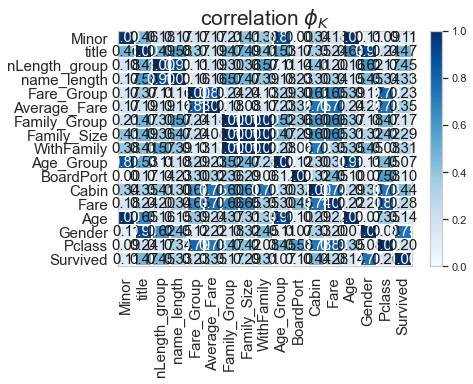

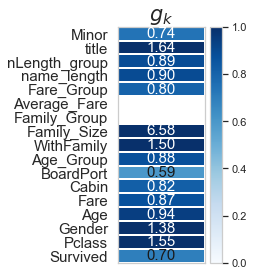

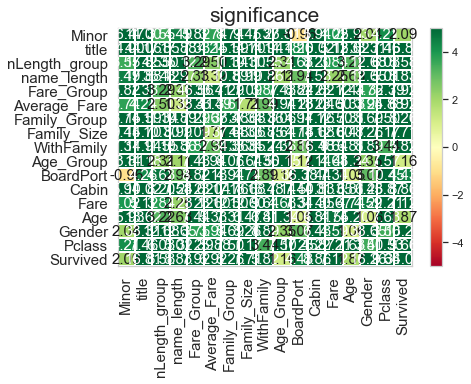

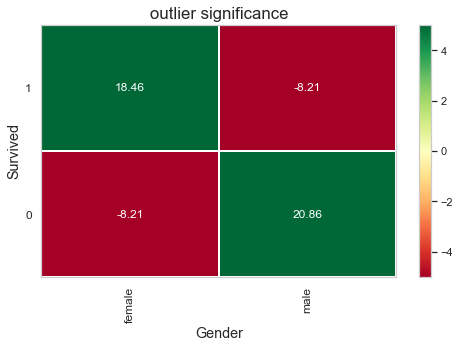

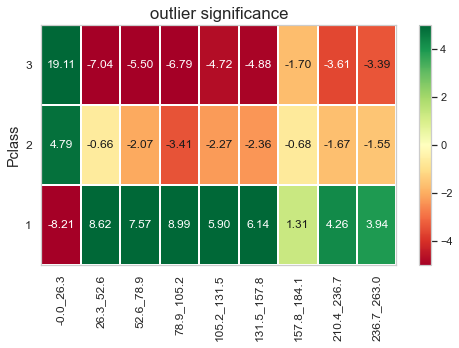

...

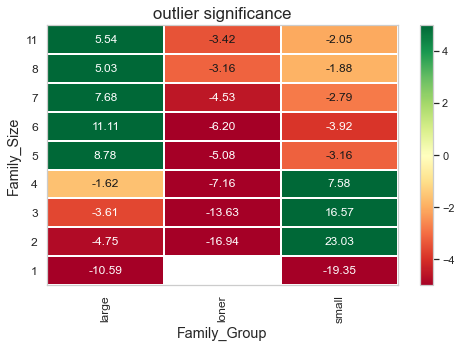

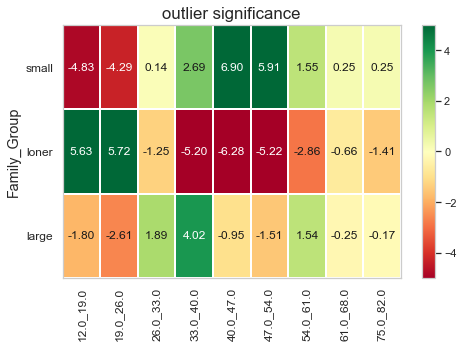

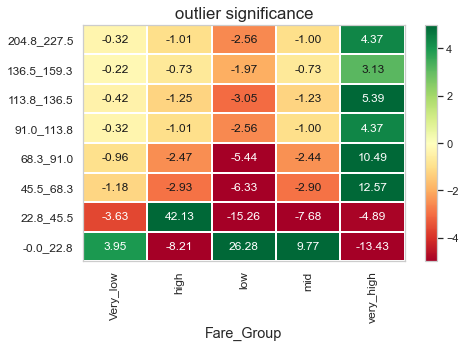

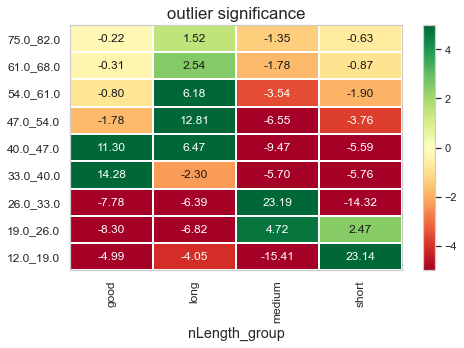

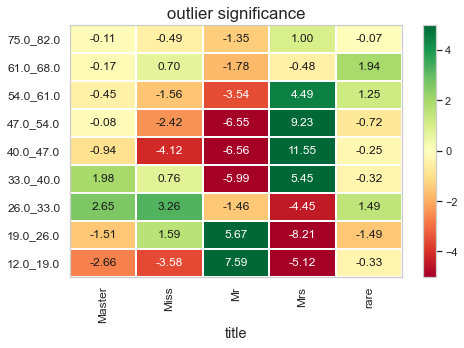

In [165]:
# generate a phik correlation report and save as test.pdf
report.correlation_report(data=Titanic_Train,interval_cols=['Age','Fare','Average_Fare','name_length'])
show()

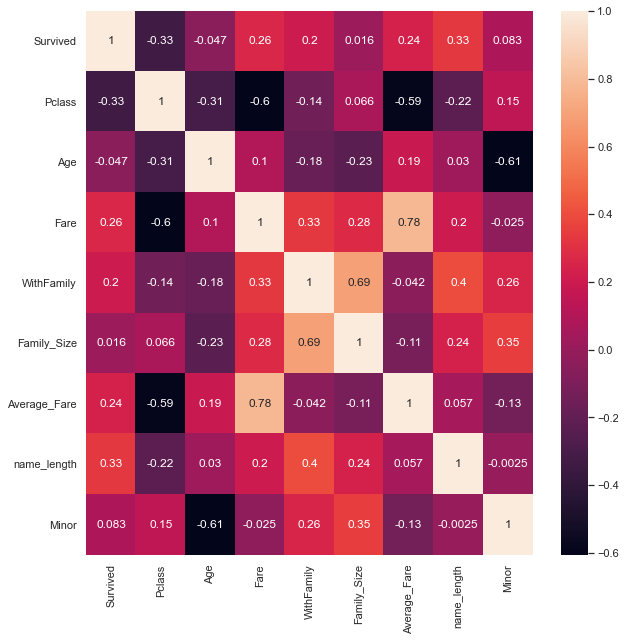

In [166]:
# Correlation plot by using heatmap
figure(figsize=(10,10)) # Assign the Plotting Figure Size of 10 by 10
heatmap(Titanic_Train.corr(), annot=True)
show()

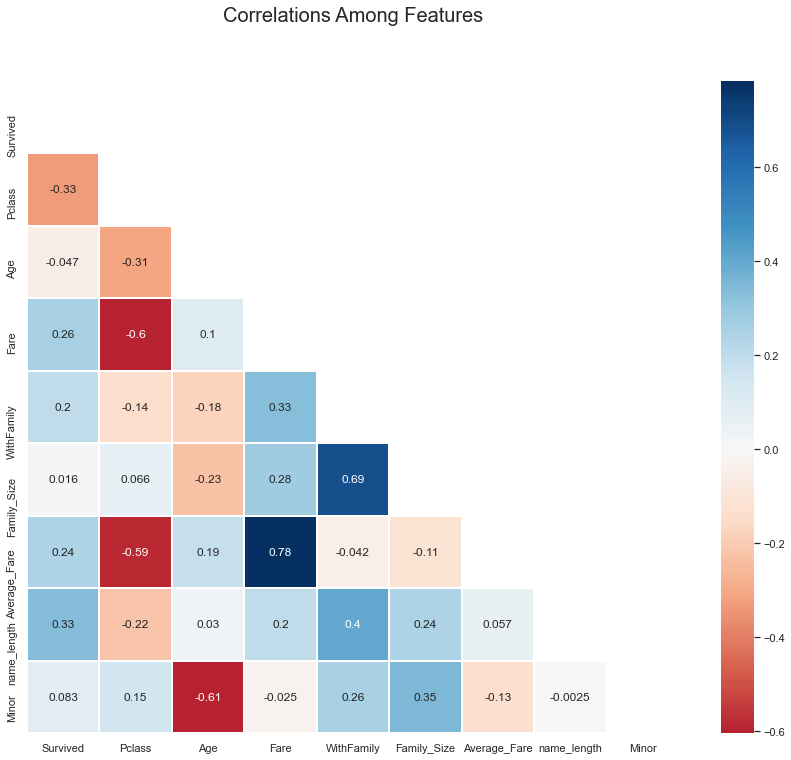

In [167]:
## heatmeap to see the correlation between features. 
# Generate a mask for the upper triangle (taken from seaborn example gallery)
mask = zeros_like(Titanic_Train.corr(), dtype=bool)
mask[triu_indices_from(mask)] = True
set_style('whitegrid')
subplots(figsize = (15,12))
heatmap(Titanic_Train.corr(), 
            annot=True,
            mask = mask,
            cmap = 'RdBu', ## in order to reverse the bar replace "RdBu" with "RdBu_r"
            linewidths=.9, 
            linecolor='white',
            fmt='.2g',
            center = 0,
            square=True)
title("Correlations Among Features", y = 1.03,fontsize = 20, pad = 40);

In [168]:
# Each Pair Combination of Feature & Label Correlation List
Titanic_Train.corr().Survived.sort_values(ascending=False)

Survived        1.000000
name_length     0.333749
Fare            0.260417
Average_Fare    0.238363
WithFamily      0.202505
Minor           0.083394
Family_Size     0.016249
Age            -0.047435
Pclass         -0.333079
Name: Survived, dtype: float64

In [169]:
#Displaying correlation among all the columns 
Titanic_Train.corr()

,Survived,Pclass,Age,Fare,WithFamily,Family_Size,Average_Fare,name_length,Minor
Survived,1.000000,-0.333079,-0.047435,0.260417,0.202505,0.016249,0.238363,0.333749,0.083394
Pclass,-0.333079,1.000000,-0.310017,-0.604718,-0.135124,0.065872,-0.588490,-0.221006,0.150013
Age,-0.047435,-0.310017,1.000000,0.100796,-0.176858,-0.226609,0.186577,0.030466,-0.605421
Fare,0.260417,-0.604718,0.100796,1.000000,0.333099,0.275626,0.783431,0.200083,-0.025452
WithFamily,0.202505,-0.135124,-0.176858,0.333099,1.000000,0.690624,-0.042365,0.404196,0.255966
Family_Size,0.016249,0.065872,-0.226609,0.275626,0.690624,1.000000,-0.114536,0.236977,0.350649
Average_Fare,0.238363,-0.588490,0.186577,0.783431,-0.042365,-0.114536,1.000000,0.057150,-0.129478
name_length,0.333749,-0.221006,0.030466,0.200083,0.404196,0.236977,0.057150,1.000000,-0.002504
Minor,0.083394,0.150013,-0.605421,-0.025452,0.255966,0.350649,-0.129478,-0.002504,1.000000


In [170]:
# Each Pair Combination of Feature & Label Correlation List
DataFrame(abs(Titanic_Train.corr()['Survived']).sort_values(ascending = False))

,Survived
Survived,1.000000
name_length,0.333749
Pclass,0.333079
Fare,0.260417
Average_Fare,0.238363
WithFamily,0.202505
Minor,0.083394
Age,0.047435
Family_Size,0.016249


# Feature Selection/Removal

In [171]:
Titanic_Train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 884 entries, 0 to 883
Data columns (total 17 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Survived       884 non-null    int64  
 1   Pclass         884 non-null    int64  
 2   Gender         884 non-null    object 
 3   Age            884 non-null    float64
 4   Fare           884 non-null    float64
 5   Cabin          884 non-null    object 
 6   BoardPort      884 non-null    object 
 7   Age_Group      884 non-null    object 
 8   WithFamily     884 non-null    int64  
 9   Family_Size    884 non-null    int64  
 10  Family_Group   884 non-null    object 
 11  Average_Fare   884 non-null    float64
 12  Fare_Group     884 non-null    object 
 13  name_length    884 non-null    int64  
 14  nLength_group  884 non-null    object 
 15  title          884 non-null    object 
 16  Minor          884 non-null    int64  
dtypes: float64(3), int64(6), object(8)
memory usage: 117.5

In [173]:
#"Age","Fare","Average_Fare","Family_Size","Age_Group" Column Will Be Removed because they have very Low Correlation value with "Survived".
#"Family_Group"
#DataFrame Separation for Encoding
#Label will be 1D Series
#Ordinal & Nominal will remain 2D DataFrame only
#Test1
Label=Titanic_Train['Survived']
Ordinal=Titanic_Train[['Pclass','Family_Group','Fare_Group','Age_Group','BoardPort','nLength_group']]
Nominal=Titanic_Train[['Gender','Cabin','title']]

# Encoding Features

In [174]:
# We will rename/replace the Unique Elements/Entries of "Pclass" & "Gender" Column
Ordinal["Pclass"].replace({1:'1',2:'2',3:'3'},inplace=True)
Nominal["Gender"].replace({'female':1,'male':0},inplace=True)

D:\D Program Files\Anaconda\lib\site-packages\pandas\core\series.py:4569: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  method=method,


In [175]:
#You can Dummify 'string' value "Columns" only
#Dummy Encoding for Nominal Categorical Features 'Gender','Cabin','title'
#Nominal will remain DataFrame
Nominal=get_dummies(Nominal,drop_first=False)
Nominal.shape,type(Nominal),ndim(Nominal)

((884, 14), pandas.core.frame.DataFrame, 2)

In [176]:
#Dummy Encoding for Ordinal Categorical Features 'Pclass','Family_Group','Fare_Group','Age_Group','BoardPort','nLength_group'
#Ordinal will remain 2D DataFrame
Ordinal=get_dummies(Ordinal,drop_first=False)
Ordinal.shape,type(Ordinal),ndim(Ordinal)

((884, 27), pandas.core.frame.DataFrame, 2)

In [177]:
Ordinal["Pclass_1"].replace({1:3},inplace=True)
Ordinal["Pclass_2"].replace({1:2},inplace=True)
Ordinal["Pclass_3"].replace({1:1},inplace=True)
Ordinal["Family_Group_loner"].replace({1:1},inplace=True)
Ordinal["Family_Group_small"].replace({1:2},inplace=True)
Ordinal["Family_Group_large"].replace({1:3},inplace=True)
Ordinal["Fare_Group_Very_low"].replace({1:1},inplace=True)
Ordinal["Fare_Group_low"].replace({1:2},inplace=True)
Ordinal["Fare_Group_mid"].replace({1:3},inplace=True)
Ordinal["Fare_Group_high"].replace({1:4},inplace=True)
Ordinal["Fare_Group_very_high"].replace({1:5},inplace=True)
Ordinal["Age_Group_Young_Adult"].replace({1:5},inplace=True)
Ordinal["Age_Group_adult"].replace({1:4},inplace=True)
Ordinal["Age_Group_middle_aged"].replace({1:3},inplace=True)
Ordinal["Age_Group_teenager"].replace({1:6},inplace=True)
Ordinal["Age_Group_infant"].replace({1:9},inplace=True)
Ordinal["Age_Group_toddler"].replace({1:8},inplace=True)
Ordinal["Age_Group_child"].replace({1:7},inplace=True)
Ordinal["Age_Group_senior_citizen"].replace({1:2},inplace=True)
Ordinal["Age_Group_old"].replace({1:1},inplace=True)
Ordinal["BoardPort_C"].replace({1:3},inplace=True)
Ordinal["BoardPort_S"].replace({1:2},inplace=True)
Ordinal["BoardPort_Q"].replace({1:1},inplace=True)
Ordinal["nLength_group_medium"].replace({1:2},inplace=True)
Ordinal["nLength_group_long"].replace({1:3},inplace=True)
Ordinal["nLength_group_good"].replace({1:4},inplace=True)

In [178]:
#Final ConCatination For Creating Features
#Features will be 2D DataFrame
#No Continuous
Features=concat([Ordinal,Nominal],axis=1)
Features

,Pclass_1,Pclass_2,Pclass_3,Family_Group_large,Family_Group_loner,Family_Group_small,Fare_Group_Very_low,Fare_Group_high,Fare_Group_low,Fare_Group_mid,Fare_Group_very_high,Age_Group_Young_Adult,Age_Group_adult,Age_Group_child,Age_Group_infant,Age_Group_middle_aged,Age_Group_old,Age_Group_senior_citizen,Age_Group_teenager,Age_Group_toddler,BoardPort_C,BoardPort_Q,BoardPort_S,nLength_group_good,nLength_group_long,nLength_group_medium,nLength_group_short,Gender,Cabin_A,Cabin_B,Cabin_C,Cabin_D,Cabin_E,Cabin_F,Cabin_G,Cabin_T,title_Master,title_Miss,title_Mr,title_Mrs,title_rare
0,0,0,1,0,0,2,1,0,0,0,0,5,0,0,0,0,0,0,0,0,0,0,2,0,0,2,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0
1,3,0,0,0,0,2,0,4,0,0,0,0,4,0,0,0,0,0,0,0,3,0,0,0,3,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0
2,0,0,1,0,1,0,0,0,2,0,0,5,0,0,0,0,0,0,0,0,0,0,2,0,0,2,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0
3,3,0,0,0,0,2,0,4,0,0,0,5,0,0,0,0,0,0,0,0,0,0,2,4,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0
4,0,0,1,0,1,0,0,0,2,0,0,5,0,0,0,0,0,0,0,0,0,0,2,0,0,2,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0
5,0,0,1,0,1,0,0,0,2,0,0,5,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0,0
6,3,0,0,0,1,0,0,0,0,0,5,0,0,0,0,3,0,0,0,0,0,0,2,0,0,2,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0
7,0,0,1,3,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,8,0,0,2,0,0,2,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0
8,0,0,1,0,0,2,1,0,0,0,0,5,0,0,0,0,0,0,0,0,0,0,2,0,3,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1,0
9,0,2,0,0,0,2,0,0,0,3,0,0,0,0,0,0,0,0,6,0,3,0,0,0,0,2,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0


In [179]:
#Due to lowest frequency we will drop these Categorical columns
Features.drop(columns=["Pclass_2","Family_Group_large","Fare_Group_Very_low","Age_Group_old","Cabin_A","BoardPort_Q","nLength_group_long","title_rare"],axis=1,inplace=True)
Features.columns

Index(['Pclass_1', 'Pclass_3', 'Family_Group_loner', 'Family_Group_small',
       'Fare_Group_high', 'Fare_Group_low', 'Fare_Group_mid',
       'Fare_Group_very_high', 'Age_Group_Young_Adult', 'Age_Group_adult',
       'Age_Group_child', 'Age_Group_infant', 'Age_Group_middle_aged',
       'Age_Group_senior_citizen', 'Age_Group_teenager', 'Age_Group_toddler',
       'BoardPort_C', 'BoardPort_S', 'nLength_group_good',
       'nLength_group_medium', 'nLength_group_short', 'Gender', 'Cabin_B',
       'Cabin_C', 'Cabin_D', 'Cabin_E', 'Cabin_F', 'Cabin_G', 'Cabin_T',
       'title_Master', 'title_Miss', 'title_Mr', 'title_Mrs'],
      dtype='object')

# Train & Test Split Selection (Logistic Regression)

In [180]:
# For loop to check ideal sample that will give generalized model
#Test1
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression

for i in range(1,5000):
    X_train,X_test,Y_train,Y_test = train_test_split(Features, Label, test_size=0.20, random_state=i)
    
    TitanicModel=LogisticRegression(solver='liblinear', penalty= 'l1')
    
    TitanicModel.fit(X_train,Y_train)
    
    train_score=TitanicModel.score(X_train,Y_train)
    
    test_score=TitanicModel.score(X_test,Y_test)
    
    if test_score > train_score:
        print("Test: {} Train: {} RandomState: {}".format(test_score,train_score,i))

Test: 0.8587570621468926 Train: 0.8147100424328148 RandomState: 3
Test: 0.8361581920903954 Train: 0.8359264497878359 RandomState: 5
Test: 0.8418079096045198 Train: 0.8330975954738331 RandomState: 6
Test: 0.8531073446327684 Train: 0.8316831683168316 RandomState: 10
Test: 0.8813559322033898 Train: 0.8274398868458275 RandomState: 12
Test: 0.8700564971751412 Train: 0.8246110325318247 RandomState: 14
Test: 0.8926553672316384 Train: 0.8076379066478077 RandomState: 15
Test: 0.8418079096045198 Train: 0.8316831683168316 RandomState: 18
Test: 0.8305084745762712 Train: 0.8302687411598303 RandomState: 19
Test: 0.847457627118644 Train: 0.8288543140028288 RandomState: 23
Test: 0.8248587570621468 Train: 0.8217821782178217 RandomState: 28
Test: 0.8418079096045198 Train: 0.8274398868458275 RandomState: 31
Test: 0.8361581920903954 Train: 0.8345120226308345 RandomState: 32
Test: 0.8361581920903954 Train: 0.8316831683168316 RandomState: 33
Test: 0.8587570621468926 Train: 0.8246110325318247 RandomState: 36

Test: 0.8418079096045198 Train: 0.8231966053748232 RandomState: 411
Test: 0.8305084745762712 Train: 0.8302687411598303 RandomState: 414
Test: 0.8418079096045198 Train: 0.8345120226308345 RandomState: 417
Test: 0.847457627118644 Train: 0.8359264497878359 RandomState: 419
Test: 0.864406779661017 Train: 0.8246110325318247 RandomState: 421
Test: 0.8418079096045198 Train: 0.8330975954738331 RandomState: 423
Test: 0.8587570621468926 Train: 0.8231966053748232 RandomState: 436
Test: 0.8587570621468926 Train: 0.8274398868458275 RandomState: 437
Test: 0.8531073446327684 Train: 0.8359264497878359 RandomState: 441
Test: 0.8361581920903954 Train: 0.8345120226308345 RandomState: 442
Test: 0.8305084745762712 Train: 0.8217821782178217 RandomState: 444
Test: 0.8813559322033898 Train: 0.8217821782178217 RandomState: 448
Test: 0.847457627118644 Train: 0.8316831683168316 RandomState: 449
Test: 0.8361581920903954 Train: 0.8274398868458275 RandomState: 450
Test: 0.847457627118644 Train: 0.8274398868458275 R

Test: 0.8587570621468926 Train: 0.8274398868458275 RandomState: 838
Test: 0.8418079096045198 Train: 0.8330975954738331 RandomState: 848
Test: 0.8361581920903954 Train: 0.8316831683168316 RandomState: 849
Test: 0.8361581920903954 Train: 0.8316831683168316 RandomState: 850
Test: 0.8531073446327684 Train: 0.8345120226308345 RandomState: 853
Test: 0.8418079096045198 Train: 0.8302687411598303 RandomState: 856
Test: 0.8757062146892656 Train: 0.8274398868458275 RandomState: 860
Test: 0.8418079096045198 Train: 0.8246110325318247 RandomState: 865
Test: 0.8361581920903954 Train: 0.8330975954738331 RandomState: 867
Test: 0.847457627118644 Train: 0.8359264497878359 RandomState: 868
Test: 0.8418079096045198 Train: 0.8302687411598303 RandomState: 873
Test: 0.8700564971751412 Train: 0.8231966053748232 RandomState: 874
Test: 0.8418079096045198 Train: 0.8330975954738331 RandomState: 880
Test: 0.864406779661017 Train: 0.8288543140028288 RandomState: 885
Test: 0.8418079096045198 Train: 0.8302687411598303

Test: 0.8305084745762712 Train: 0.826025459688826 RandomState: 1244
Test: 0.8305084745762712 Train: 0.8246110325318247 RandomState: 1247
Test: 0.847457627118644 Train: 0.8274398868458275 RandomState: 1248
Test: 0.864406779661017 Train: 0.8246110325318247 RandomState: 1249
Test: 0.8305084745762712 Train: 0.8288543140028288 RandomState: 1259
Test: 0.8757062146892656 Train: 0.8231966053748232 RandomState: 1266
Test: 0.847457627118644 Train: 0.8288543140028288 RandomState: 1270
Test: 0.8531073446327684 Train: 0.8359264497878359 RandomState: 1275
Test: 0.8361581920903954 Train: 0.826025459688826 RandomState: 1279
Test: 0.8361581920903954 Train: 0.8302687411598303 RandomState: 1283
Test: 0.8587570621468926 Train: 0.8288543140028288 RandomState: 1287
Test: 0.8418079096045198 Train: 0.8274398868458275 RandomState: 1291
Test: 0.8361581920903954 Train: 0.826025459688826 RandomState: 1294
Test: 0.8700564971751412 Train: 0.826025459688826 RandomState: 1298
Test: 0.847457627118644 Train: 0.82178217

Test: 0.8531073446327684 Train: 0.8231966053748232 RandomState: 1683
Test: 0.8531073446327684 Train: 0.826025459688826 RandomState: 1687
Test: 0.8418079096045198 Train: 0.8316831683168316 RandomState: 1689
Test: 0.8418079096045198 Train: 0.8288543140028288 RandomState: 1690
Test: 0.8587570621468926 Train: 0.8217821782178217 RandomState: 1693
Test: 0.8531073446327684 Train: 0.8274398868458275 RandomState: 1701
Test: 0.864406779661017 Train: 0.8203677510608204 RandomState: 1705
Test: 0.8418079096045198 Train: 0.8274398868458275 RandomState: 1707
Test: 0.8700564971751412 Train: 0.8217821782178217 RandomState: 1708
Test: 0.8361581920903954 Train: 0.8359264497878359 RandomState: 1715
Test: 0.8361581920903954 Train: 0.8217821782178217 RandomState: 1720
Test: 0.8531073446327684 Train: 0.8288543140028288 RandomState: 1721
Test: 0.8757062146892656 Train: 0.8217821782178217 RandomState: 1722
Test: 0.8418079096045198 Train: 0.8302687411598303 RandomState: 1725
Test: 0.8418079096045198 Train: 0.82

Test: 0.8361581920903954 Train: 0.8217821782178217 RandomState: 2148
Test: 0.8700564971751412 Train: 0.8302687411598303 RandomState: 2157
Test: 0.847457627118644 Train: 0.8246110325318247 RandomState: 2166
Test: 0.8418079096045198 Train: 0.8373408769448374 RandomState: 2167
Test: 0.847457627118644 Train: 0.8302687411598303 RandomState: 2170
Test: 0.8305084745762712 Train: 0.8302687411598303 RandomState: 2175
Test: 0.8587570621468926 Train: 0.8288543140028288 RandomState: 2177
Test: 0.8587570621468926 Train: 0.8217821782178217 RandomState: 2184
Test: 0.8305084745762712 Train: 0.8274398868458275 RandomState: 2189
Test: 0.8418079096045198 Train: 0.8302687411598303 RandomState: 2191
Test: 0.847457627118644 Train: 0.8189533239038189 RandomState: 2194
Test: 0.8361581920903954 Train: 0.8345120226308345 RandomState: 2195
Test: 0.8418079096045198 Train: 0.8288543140028288 RandomState: 2198
Test: 0.8361581920903954 Train: 0.826025459688826 RandomState: 2208
Test: 0.847457627118644 Train: 0.82036

Test: 0.847457627118644 Train: 0.8246110325318247 RandomState: 2630
Test: 0.8305084745762712 Train: 0.8189533239038189 RandomState: 2633
Test: 0.8361581920903954 Train: 0.8274398868458275 RandomState: 2634
Test: 0.8531073446327684 Train: 0.8246110325318247 RandomState: 2635
Test: 0.847457627118644 Train: 0.8302687411598303 RandomState: 2636
Test: 0.8531073446327684 Train: 0.826025459688826 RandomState: 2637
Test: 0.864406779661017 Train: 0.8359264497878359 RandomState: 2642
Test: 0.847457627118644 Train: 0.8274398868458275 RandomState: 2643
Test: 0.8361581920903954 Train: 0.8330975954738331 RandomState: 2646
Test: 0.8418079096045198 Train: 0.8302687411598303 RandomState: 2648
Test: 0.8418079096045198 Train: 0.8246110325318247 RandomState: 2659
Test: 0.8418079096045198 Train: 0.8217821782178217 RandomState: 2660
Test: 0.8361581920903954 Train: 0.8288543140028288 RandomState: 2665
Test: 0.8361581920903954 Train: 0.8316831683168316 RandomState: 2666
Test: 0.8418079096045198 Train: 0.83168

Test: 0.8926553672316384 Train: 0.8189533239038189 RandomState: 2993
Test: 0.8531073446327684 Train: 0.8288543140028288 RandomState: 2998
Test: 0.8531073446327684 Train: 0.8330975954738331 RandomState: 3000
Test: 0.847457627118644 Train: 0.8231966053748232 RandomState: 3002
Test: 0.847457627118644 Train: 0.8288543140028288 RandomState: 3004
Test: 0.8587570621468926 Train: 0.8246110325318247 RandomState: 3007
Test: 0.8531073446327684 Train: 0.8175388967468176 RandomState: 3012
Test: 0.8361581920903954 Train: 0.8316831683168316 RandomState: 3014
Test: 0.864406779661017 Train: 0.8217821782178217 RandomState: 3015
Test: 0.8418079096045198 Train: 0.8288543140028288 RandomState: 3016
Test: 0.8418079096045198 Train: 0.8373408769448374 RandomState: 3017
Test: 0.8418079096045198 Train: 0.8359264497878359 RandomState: 3019
Test: 0.847457627118644 Train: 0.8302687411598303 RandomState: 3020
Test: 0.847457627118644 Train: 0.8288543140028288 RandomState: 3027
Test: 0.8757062146892656 Train: 0.81753

Test: 0.8418079096045198 Train: 0.8274398868458275 RandomState: 3366
Test: 0.864406779661017 Train: 0.8231966053748232 RandomState: 3369
Test: 0.8418079096045198 Train: 0.8203677510608204 RandomState: 3370
Test: 0.8361581920903954 Train: 0.8274398868458275 RandomState: 3371
Test: 0.8418079096045198 Train: 0.8316831683168316 RandomState: 3372
Test: 0.8361581920903954 Train: 0.8302687411598303 RandomState: 3373
Test: 0.847457627118644 Train: 0.8217821782178217 RandomState: 3378
Test: 0.8361581920903954 Train: 0.8359264497878359 RandomState: 3380
Test: 0.8361581920903954 Train: 0.8274398868458275 RandomState: 3383
Test: 0.8531073446327684 Train: 0.8373408769448374 RandomState: 3386
Test: 0.8587570621468926 Train: 0.8274398868458275 RandomState: 3389
Test: 0.8418079096045198 Train: 0.8330975954738331 RandomState: 3390
Test: 0.8700564971751412 Train: 0.8203677510608204 RandomState: 3395
Test: 0.8587570621468926 Train: 0.8246110325318247 RandomState: 3407
Test: 0.8418079096045198 Train: 0.82

Test: 0.8418079096045198 Train: 0.8302687411598303 RandomState: 3779
Test: 0.8531073446327684 Train: 0.8274398868458275 RandomState: 3783
Test: 0.8531073446327684 Train: 0.8217821782178217 RandomState: 3786
Test: 0.8248587570621468 Train: 0.8231966053748232 RandomState: 3787
Test: 0.8531073446327684 Train: 0.8302687411598303 RandomState: 3788
Test: 0.8305084745762712 Train: 0.8302687411598303 RandomState: 3792
Test: 0.8418079096045198 Train: 0.8288543140028288 RandomState: 3800
Test: 0.847457627118644 Train: 0.8288543140028288 RandomState: 3808
Test: 0.8531073446327684 Train: 0.8302687411598303 RandomState: 3809
Test: 0.8531073446327684 Train: 0.8302687411598303 RandomState: 3810
Test: 0.8418079096045198 Train: 0.8203677510608204 RandomState: 3812
Test: 0.8531073446327684 Train: 0.8288543140028288 RandomState: 3818
Test: 0.8361581920903954 Train: 0.826025459688826 RandomState: 3819
Test: 0.8305084745762712 Train: 0.8274398868458275 RandomState: 3821
Test: 0.8531073446327684 Train: 0.82

Test: 0.847457627118644 Train: 0.8316831683168316 RandomState: 4176
Test: 0.8587570621468926 Train: 0.8231966053748232 RandomState: 4185
Test: 0.8757062146892656 Train: 0.8231966053748232 RandomState: 4186
Test: 0.8418079096045198 Train: 0.8302687411598303 RandomState: 4187
Test: 0.8587570621468926 Train: 0.8288543140028288 RandomState: 4188
Test: 0.8418079096045198 Train: 0.8288543140028288 RandomState: 4192
Test: 0.8531073446327684 Train: 0.8288543140028288 RandomState: 4198
Test: 0.8361581920903954 Train: 0.8330975954738331 RandomState: 4199
Test: 0.8361581920903954 Train: 0.8316831683168316 RandomState: 4201
Test: 0.8418079096045198 Train: 0.8288543140028288 RandomState: 4202
Test: 0.8361581920903954 Train: 0.8217821782178217 RandomState: 4213
Test: 0.8248587570621468 Train: 0.8246110325318247 RandomState: 4223
Test: 0.847457627118644 Train: 0.8316831683168316 RandomState: 4229
Test: 0.8418079096045198 Train: 0.8387553041018387 RandomState: 4230
Test: 0.847457627118644 Train: 0.827

Test: 0.8418079096045198 Train: 0.8288543140028288 RandomState: 4568
Test: 0.8305084745762712 Train: 0.8203677510608204 RandomState: 4569
Test: 0.8418079096045198 Train: 0.8217821782178217 RandomState: 4570
Test: 0.864406779661017 Train: 0.826025459688826 RandomState: 4573
Test: 0.8531073446327684 Train: 0.8288543140028288 RandomState: 4575
Test: 0.864406779661017 Train: 0.8316831683168316 RandomState: 4576
Test: 0.8305084745762712 Train: 0.8217821782178217 RandomState: 4579
Test: 0.8361581920903954 Train: 0.8302687411598303 RandomState: 4580
Test: 0.8587570621468926 Train: 0.8302687411598303 RandomState: 4582
Test: 0.8531073446327684 Train: 0.8345120226308345 RandomState: 4589
Test: 0.8700564971751412 Train: 0.8302687411598303 RandomState: 4592
Test: 0.8418079096045198 Train: 0.8373408769448374 RandomState: 4593
Test: 0.8418079096045198 Train: 0.8231966053748232 RandomState: 4596
Test: 0.8361581920903954 Train: 0.8316831683168316 RandomState: 4599
Test: 0.8757062146892656 Train: 0.820

Test: 0.8757062146892656 Train: 0.8203677510608204 RandomState: 4988


In [181]:
#Train Test Split, 80% Training Data & 20% Testing Data
from sklearn.model_selection import train_test_split
X_train, X_test, Y_train, Y_test = train_test_split(Features,Label,test_size=0.20,random_state=3482)

In [182]:
# Statistical Implementation of Linear Regression Model
# VIF & Multicolinearity finding
# Summary table from OLS Statsmodels of Linear Regression
# In Python's OLS, it is used for variance inflation factor calculation, does not add an intercept by default.
from statsmodels.api import *
Features_with_constant=add_constant(X_train)
TitanicModel_Stat=Logit(Y_train,Features_with_constant)

D:\D Program Files\Anaconda\lib\site-packages\numpy\linalg\linalg.py:1872: RuntimeWarning: invalid value encountered in greater
  return count_nonzero(S > tol, axis=-1)


In [183]:
# Here we will Check the Summary of Jpimodel
# Many Features having P-value > 0.05
# Rest of the Features are Significant
Results=TitanicModel_Stat.fit()
Results.params
print(Results.summary())

         Current function value: 0.414810
         Iterations: 35
                           Logit Regression Results                           
Dep. Variable:               Survived   No. Observations:                  707
Model:                          Logit   Df Residuals:                      707
Method:                           MLE   Df Model:                           -1
Date:                Sat, 05 Dec 2020   Pseudo R-squ.:                  0.3762
Time:                        23:12:40   Log-Likelihood:                -293.27
converged:                      False   LL-Null:                       -470.14
Covariance Type:            nonrobust   LLR p-value:                       nan
                               coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------
const                       -3.8838      1.567     -2.479      0.013      -6.955      -0.813
Pclass_1               

D:\D Program Files\Anaconda\lib\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


In [184]:
Features.drop(columns=["title_Miss","title_Mrs","Gender","nLength_group_short","Age_Group_adult"],axis=1,inplace=True)
Features.columns

Index(['Pclass_1', 'Pclass_3', 'Family_Group_loner', 'Family_Group_small',
       'Fare_Group_high', 'Fare_Group_low', 'Fare_Group_mid',
       'Fare_Group_very_high', 'Age_Group_Young_Adult', 'Age_Group_child',
       'Age_Group_infant', 'Age_Group_middle_aged', 'Age_Group_senior_citizen',
       'Age_Group_teenager', 'Age_Group_toddler', 'BoardPort_C', 'BoardPort_S',
       'nLength_group_good', 'nLength_group_medium', 'Cabin_B', 'Cabin_C',
       'Cabin_D', 'Cabin_E', 'Cabin_F', 'Cabin_G', 'Cabin_T', 'title_Master',
       'title_Mr'],
      dtype='object')

In [185]:
# For loop to check ideal sample that will give generalized model
#Test1
for i in range(1,5000):
    X_train,X_test,Y_train,Y_test = train_test_split(Features, Label, test_size=0.20, random_state=i)
    
    TitanicModel=LogisticRegression(solver='liblinear', penalty= 'l1')
    
    TitanicModel.fit(X_train,Y_train)
    
    train_score=TitanicModel.score(X_train,Y_train)
    
    test_score=TitanicModel.score(X_test,Y_test)
    
    if test_score > train_score:
        print("Test: {} Train: {} RandomState: {}".format(test_score,train_score,i))

Test: 0.864406779661017 Train: 0.801980198019802 RandomState: 3
Test: 0.8305084745762712 Train: 0.8189533239038189 RandomState: 4
Test: 0.8248587570621468 Train: 0.8217821782178217 RandomState: 5
Test: 0.8305084745762712 Train: 0.8231966053748232 RandomState: 9
Test: 0.8531073446327684 Train: 0.8132956152758133 RandomState: 10
Test: 0.864406779661017 Train: 0.8147100424328148 RandomState: 12
Test: 0.8700564971751412 Train: 0.8062234794908062 RandomState: 14
Test: 0.8757062146892656 Train: 0.7949080622347949 RandomState: 15
Test: 0.8305084745762712 Train: 0.8147100424328148 RandomState: 18
Test: 0.8361581920903954 Train: 0.8132956152758133 RandomState: 19
Test: 0.8248587570621468 Train: 0.809052333804809 RandomState: 21
Test: 0.8361581920903954 Train: 0.8189533239038189 RandomState: 23
Test: 0.8248587570621468 Train: 0.8203677510608204 RandomState: 25
Test: 0.8361581920903954 Train: 0.8132956152758133 RandomState: 28
Test: 0.8248587570621468 Train: 0.8217821782178217 RandomState: 32
Tes

Test: 0.8192090395480226 Train: 0.8132956152758133 RandomState: 347
Test: 0.8248587570621468 Train: 0.8147100424328148 RandomState: 350
Test: 0.8418079096045198 Train: 0.8104667609618105 RandomState: 354
Test: 0.8248587570621468 Train: 0.8132956152758133 RandomState: 355
Test: 0.8135593220338984 Train: 0.8104667609618105 RandomState: 356
Test: 0.847457627118644 Train: 0.8132956152758133 RandomState: 362
Test: 0.8248587570621468 Train: 0.8161244695898161 RandomState: 364
Test: 0.847457627118644 Train: 0.8175388967468176 RandomState: 365
Test: 0.8305084745762712 Train: 0.8147100424328148 RandomState: 366
Test: 0.847457627118644 Train: 0.8147100424328148 RandomState: 375
Test: 0.8305084745762712 Train: 0.8203677510608204 RandomState: 378
Test: 0.8587570621468926 Train: 0.809052333804809 RandomState: 384
Test: 0.8418079096045198 Train: 0.8175388967468176 RandomState: 388
Test: 0.847457627118644 Train: 0.826025459688826 RandomState: 392
Test: 0.847457627118644 Train: 0.8104667609618105 Rand

Test: 0.8248587570621468 Train: 0.8062234794908062 RandomState: 716
Test: 0.8248587570621468 Train: 0.8175388967468176 RandomState: 717
Test: 0.8361581920903954 Train: 0.8217821782178217 RandomState: 721
Test: 0.8361581920903954 Train: 0.8217821782178217 RandomState: 725
Test: 0.8531073446327684 Train: 0.8048090523338048 RandomState: 728
Test: 0.847457627118644 Train: 0.8175388967468176 RandomState: 731
Test: 0.8361581920903954 Train: 0.8147100424328148 RandomState: 734
Test: 0.8192090395480226 Train: 0.8175388967468176 RandomState: 737
Test: 0.8361581920903954 Train: 0.8132956152758133 RandomState: 738
Test: 0.8361581920903954 Train: 0.8189533239038189 RandomState: 740
Test: 0.8305084745762712 Train: 0.8189533239038189 RandomState: 742
Test: 0.8700564971751412 Train: 0.8033946251768034 RandomState: 743
Test: 0.8248587570621468 Train: 0.8132956152758133 RandomState: 744
Test: 0.8192090395480226 Train: 0.8189533239038189 RandomState: 746
Test: 0.8361581920903954 Train: 0.814710042432814

Test: 0.8305084745762712 Train: 0.8175388967468176 RandomState: 1089
Test: 0.8305084745762712 Train: 0.8189533239038189 RandomState: 1090
Test: 0.8418079096045198 Train: 0.8189533239038189 RandomState: 1091
Test: 0.8192090395480226 Train: 0.8104667609618105 RandomState: 1092
Test: 0.8361581920903954 Train: 0.8132956152758133 RandomState: 1097
Test: 0.847457627118644 Train: 0.8161244695898161 RandomState: 1098
Test: 0.8305084745762712 Train: 0.8147100424328148 RandomState: 1100
Test: 0.8305084745762712 Train: 0.826025459688826 RandomState: 1101
Test: 0.8248587570621468 Train: 0.8217821782178217 RandomState: 1107
Test: 0.8531073446327684 Train: 0.8175388967468176 RandomState: 1108
Test: 0.8135593220338984 Train: 0.8104667609618105 RandomState: 1110
Test: 0.8361581920903954 Train: 0.8104667609618105 RandomState: 1114
Test: 0.8305084745762712 Train: 0.8203677510608204 RandomState: 1118
Test: 0.8248587570621468 Train: 0.8189533239038189 RandomState: 1120
Test: 0.8531073446327684 Train: 0.80

Test: 0.8192090395480226 Train: 0.8189533239038189 RandomState: 1474
Test: 0.8305084745762712 Train: 0.8217821782178217 RandomState: 1478
Test: 0.8248587570621468 Train: 0.8246110325318247 RandomState: 1479
Test: 0.8248587570621468 Train: 0.8175388967468176 RandomState: 1480
Test: 0.847457627118644 Train: 0.809052333804809 RandomState: 1481
Test: 0.8305084745762712 Train: 0.8161244695898161 RandomState: 1482
Test: 0.8531073446327684 Train: 0.8118811881188119 RandomState: 1483
Test: 0.8305084745762712 Train: 0.8161244695898161 RandomState: 1486
Test: 0.8305084745762712 Train: 0.8175388967468176 RandomState: 1487
Test: 0.847457627118644 Train: 0.8048090523338048 RandomState: 1489
Test: 0.8248587570621468 Train: 0.8161244695898161 RandomState: 1490
Test: 0.864406779661017 Train: 0.8048090523338048 RandomState: 1498
Test: 0.8926553672316384 Train: 0.8033946251768034 RandomState: 1499
Test: 0.8192090395480226 Train: 0.8189533239038189 RandomState: 1502
Test: 0.8587570621468926 Train: 0.8033

Test: 0.8192090395480226 Train: 0.8175388967468176 RandomState: 1883
Test: 0.8305084745762712 Train: 0.8203677510608204 RandomState: 1885
Test: 0.8248587570621468 Train: 0.8203677510608204 RandomState: 1887
Test: 0.8531073446327684 Train: 0.8104667609618105 RandomState: 1889
Test: 0.8361581920903954 Train: 0.8161244695898161 RandomState: 1891
Test: 0.8305084745762712 Train: 0.809052333804809 RandomState: 1894
Test: 0.8361581920903954 Train: 0.8132956152758133 RandomState: 1896
Test: 0.8248587570621468 Train: 0.8189533239038189 RandomState: 1897
Test: 0.8305084745762712 Train: 0.8104667609618105 RandomState: 1899
Test: 0.8361581920903954 Train: 0.8175388967468176 RandomState: 1911
Test: 0.8361581920903954 Train: 0.8175388967468176 RandomState: 1918
Test: 0.8192090395480226 Train: 0.8132956152758133 RandomState: 1921
Test: 0.8248587570621468 Train: 0.8175388967468176 RandomState: 1927
Test: 0.8361581920903954 Train: 0.8217821782178217 RandomState: 1929
Test: 0.8305084745762712 Train: 0.8

Test: 0.8305084745762712 Train: 0.8132956152758133 RandomState: 2282
Test: 0.8248587570621468 Train: 0.8203677510608204 RandomState: 2288
Test: 0.8587570621468926 Train: 0.8118811881188119 RandomState: 2294
Test: 0.8248587570621468 Train: 0.8217821782178217 RandomState: 2295
Test: 0.8192090395480226 Train: 0.8175388967468176 RandomState: 2298
Test: 0.8248587570621468 Train: 0.8132956152758133 RandomState: 2301
Test: 0.8192090395480226 Train: 0.8175388967468176 RandomState: 2306
Test: 0.8192090395480226 Train: 0.8175388967468176 RandomState: 2307
Test: 0.8305084745762712 Train: 0.8203677510608204 RandomState: 2308
Test: 0.8248587570621468 Train: 0.8104667609618105 RandomState: 2309
Test: 0.8248587570621468 Train: 0.8203677510608204 RandomState: 2312
Test: 0.847457627118644 Train: 0.8048090523338048 RandomState: 2314
Test: 0.8418079096045198 Train: 0.8104667609618105 RandomState: 2318
Test: 0.8305084745762712 Train: 0.8147100424328148 RandomState: 2324
Test: 0.8418079096045198 Train: 0.8

Test: 0.8305084745762712 Train: 0.8231966053748232 RandomState: 2642
Test: 0.8587570621468926 Train: 0.8062234794908062 RandomState: 2643
Test: 0.8305084745762712 Train: 0.8231966053748232 RandomState: 2646
Test: 0.8305084745762712 Train: 0.8189533239038189 RandomState: 2648
Test: 0.8361581920903954 Train: 0.8048090523338048 RandomState: 2659
Test: 0.8418079096045198 Train: 0.8118811881188119 RandomState: 2660
Test: 0.8248587570621468 Train: 0.8175388967468176 RandomState: 2665
Test: 0.8248587570621468 Train: 0.8118811881188119 RandomState: 2669
Test: 0.8135593220338984 Train: 0.8076379066478077 RandomState: 2671
Test: 0.8305084745762712 Train: 0.8246110325318247 RandomState: 2676
Test: 0.8305084745762712 Train: 0.8161244695898161 RandomState: 2677
Test: 0.8361581920903954 Train: 0.8189533239038189 RandomState: 2680
Test: 0.8418079096045198 Train: 0.8189533239038189 RandomState: 2682
Test: 0.8361581920903954 Train: 0.8203677510608204 RandomState: 2683
Test: 0.8418079096045198 Train: 0.

Test: 0.8305084745762712 Train: 0.8076379066478077 RandomState: 2978
Test: 0.8700564971751412 Train: 0.809052333804809 RandomState: 2980
Test: 0.8192090395480226 Train: 0.8189533239038189 RandomState: 2982
Test: 0.8248587570621468 Train: 0.8203677510608204 RandomState: 2983
Test: 0.8700564971751412 Train: 0.8005657708628006 RandomState: 2985
Test: 0.847457627118644 Train: 0.8118811881188119 RandomState: 2986
Test: 0.8305084745762712 Train: 0.8203677510608204 RandomState: 2989
Test: 0.8248587570621468 Train: 0.8203677510608204 RandomState: 2992
Test: 0.8757062146892656 Train: 0.8005657708628006 RandomState: 2993
Test: 0.8700564971751412 Train: 0.8076379066478077 RandomState: 2998
Test: 0.8531073446327684 Train: 0.8104667609618105 RandomState: 3000
Test: 0.8418079096045198 Train: 0.801980198019802 RandomState: 3002
Test: 0.8248587570621468 Train: 0.8132956152758133 RandomState: 3003
Test: 0.8361581920903954 Train: 0.8132956152758133 RandomState: 3004
Test: 0.8418079096045198 Train: 0.813

Test: 0.8361581920903954 Train: 0.8118811881188119 RandomState: 3326
Test: 0.8248587570621468 Train: 0.8161244695898161 RandomState: 3327
Test: 0.8418079096045198 Train: 0.8217821782178217 RandomState: 3329
Test: 0.8587570621468926 Train: 0.8175388967468176 RandomState: 3331
Test: 0.8587570621468926 Train: 0.8048090523338048 RandomState: 3333
Test: 0.8305084745762712 Train: 0.8076379066478077 RandomState: 3335
Test: 0.8700564971751412 Train: 0.7991513437057991 RandomState: 3338
Test: 0.8192090395480226 Train: 0.8161244695898161 RandomState: 3341
Test: 0.8587570621468926 Train: 0.8062234794908062 RandomState: 3343
Test: 0.8192090395480226 Train: 0.8147100424328148 RandomState: 3345
Test: 0.8305084745762712 Train: 0.8175388967468176 RandomState: 3346
Test: 0.8305084745762712 Train: 0.8104667609618105 RandomState: 3348
Test: 0.8248587570621468 Train: 0.8217821782178217 RandomState: 3353
Test: 0.8305084745762712 Train: 0.8203677510608204 RandomState: 3354
Test: 0.8361581920903954 Train: 0.

Test: 0.8305084745762712 Train: 0.8147100424328148 RandomState: 3676
Test: 0.8248587570621468 Train: 0.8203677510608204 RandomState: 3683
Test: 0.8418079096045198 Train: 0.8118811881188119 RandomState: 3685
Test: 0.8248587570621468 Train: 0.8118811881188119 RandomState: 3702
Test: 0.8248587570621468 Train: 0.8175388967468176 RandomState: 3704
Test: 0.8531073446327684 Train: 0.8118811881188119 RandomState: 3711
Test: 0.847457627118644 Train: 0.8104667609618105 RandomState: 3712
Test: 0.8926553672316384 Train: 0.8005657708628006 RandomState: 3714
Test: 0.8531073446327684 Train: 0.8118811881188119 RandomState: 3717
Test: 0.8305084745762712 Train: 0.8147100424328148 RandomState: 3723
Test: 0.847457627118644 Train: 0.8132956152758133 RandomState: 3731
Test: 0.8361581920903954 Train: 0.8147100424328148 RandomState: 3732
Test: 0.8305084745762712 Train: 0.8147100424328148 RandomState: 3733
Test: 0.8248587570621468 Train: 0.8161244695898161 RandomState: 3735
Test: 0.847457627118644 Train: 0.818

Test: 0.8361581920903954 Train: 0.8246110325318247 RandomState: 4050
Test: 0.8418079096045198 Train: 0.8217821782178217 RandomState: 4054
Test: 0.864406779661017 Train: 0.8062234794908062 RandomState: 4055
Test: 0.8305084745762712 Train: 0.8175388967468176 RandomState: 4056
Test: 0.8248587570621468 Train: 0.8147100424328148 RandomState: 4057
Test: 0.8361581920903954 Train: 0.809052333804809 RandomState: 4062
Test: 0.8361581920903954 Train: 0.8231966053748232 RandomState: 4063
Test: 0.8248587570621468 Train: 0.8161244695898161 RandomState: 4065
Test: 0.8531073446327684 Train: 0.8132956152758133 RandomState: 4068
Test: 0.8418079096045198 Train: 0.8175388967468176 RandomState: 4070
Test: 0.8531073446327684 Train: 0.8104667609618105 RandomState: 4072
Test: 0.847457627118644 Train: 0.8147100424328148 RandomState: 4074
Test: 0.8361581920903954 Train: 0.8203677510608204 RandomState: 4075
Test: 0.8418079096045198 Train: 0.8203677510608204 RandomState: 4078
Test: 0.8531073446327684 Train: 0.804

Test: 0.8248587570621468 Train: 0.8147100424328148 RandomState: 4417
Test: 0.864406779661017 Train: 0.8104667609618105 RandomState: 4423
Test: 0.8418079096045198 Train: 0.8062234794908062 RandomState: 4427
Test: 0.8248587570621468 Train: 0.8246110325318247 RandomState: 4430
Test: 0.8305084745762712 Train: 0.8161244695898161 RandomState: 4432
Test: 0.8248587570621468 Train: 0.8147100424328148 RandomState: 4435
Test: 0.8305084745762712 Train: 0.8175388967468176 RandomState: 4436
Test: 0.8192090395480226 Train: 0.8161244695898161 RandomState: 4437
Test: 0.8192090395480226 Train: 0.8189533239038189 RandomState: 4438
Test: 0.8361581920903954 Train: 0.8104667609618105 RandomState: 4440
Test: 0.847457627118644 Train: 0.8161244695898161 RandomState: 4441
Test: 0.8418079096045198 Train: 0.8076379066478077 RandomState: 4442
Test: 0.8248587570621468 Train: 0.8203677510608204 RandomState: 4446
Test: 0.8192090395480226 Train: 0.8118811881188119 RandomState: 4452
Test: 0.8248587570621468 Train: 0.80

Test: 0.8248587570621468 Train: 0.8147100424328148 RandomState: 4744
Test: 0.8418079096045198 Train: 0.8118811881188119 RandomState: 4748
Test: 0.8531073446327684 Train: 0.801980198019802 RandomState: 4756
Test: 0.8361581920903954 Train: 0.809052333804809 RandomState: 4761
Test: 0.8248587570621468 Train: 0.8189533239038189 RandomState: 4766
Test: 0.8305084745762712 Train: 0.8189533239038189 RandomState: 4773
Test: 0.8192090395480226 Train: 0.8104667609618105 RandomState: 4775
Test: 0.8305084745762712 Train: 0.8203677510608204 RandomState: 4776
Test: 0.8248587570621468 Train: 0.8203677510608204 RandomState: 4780
Test: 0.8870056497175142 Train: 0.7934936350777935 RandomState: 4781
Test: 0.8305084745762712 Train: 0.826025459688826 RandomState: 4784
Test: 0.8418079096045198 Train: 0.8048090523338048 RandomState: 4785
Test: 0.8248587570621468 Train: 0.8175388967468176 RandomState: 4787
Test: 0.8248587570621468 Train: 0.8161244695898161 RandomState: 4796
Test: 0.8418079096045198 Train: 0.809

In [187]:
#Train Test Split, 80% Training Data & 20% Testing Data
X_train, X_test, Y_train, Y_test = train_test_split(Features,Label,test_size=0.20,random_state=967)

In [188]:
# Statistical Implementation of Linear Regression Model
# VIF & Multicolinearity finding
# Summary table from OLS Statsmodels of Linear Regression
# In Python's OLS, it is used for variance inflation factor calculation, does not add an intercept by default.
Features_with_constant=add_constant(X_train)
TitanicModel_Stat=Logit(Y_train,Features_with_constant)

In [189]:
# Here we will Check the Summary of Jpimodel
# Many Features having P-value > 0.05
# Rest of the Features are Significant
Results=TitanicModel_Stat.fit()
Results.params
print(Results.summary())

Optimization terminated successfully.
         Current function value: 0.434148
         Iterations 6
                           Logit Regression Results                           
Dep. Variable:               Survived   No. Observations:                  707
Model:                          Logit   Df Residuals:                      678
Method:                           MLE   Df Model:                           28
Date:                Sat, 05 Dec 2020   Pseudo R-squ.:                  0.3458
Time:                        23:22:59   Log-Likelihood:                -306.94
converged:                       True   LL-Null:                       -469.17
Covariance Type:            nonrobust   LLR p-value:                 3.306e-52
                               coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------
const                       -1.9808      1.068     -1.855      0.064      -4.073

In [190]:
Features.drop(columns=["Cabin_G","Age_Group_child","Fare_Group_mid"],axis=1,inplace=True)
Features.columns

Index(['Pclass_1', 'Pclass_3', 'Family_Group_loner', 'Family_Group_small',
       'Fare_Group_high', 'Fare_Group_low', 'Fare_Group_very_high',
       'Age_Group_Young_Adult', 'Age_Group_infant', 'Age_Group_middle_aged',
       'Age_Group_senior_citizen', 'Age_Group_teenager', 'Age_Group_toddler',
       'BoardPort_C', 'BoardPort_S', 'nLength_group_good',
       'nLength_group_medium', 'Cabin_B', 'Cabin_C', 'Cabin_D', 'Cabin_E',
       'Cabin_F', 'Cabin_T', 'title_Master', 'title_Mr'],
      dtype='object')

In [191]:
# For loop to check ideal sample that will give generalized model
#Test1
for i in range(1,5000):
    X_train,X_test,Y_train,Y_test = train_test_split(Features, Label, test_size=0.20, random_state=i)
    
    TitanicModel=LogisticRegression(solver='liblinear', penalty= 'l1')
    
    TitanicModel.fit(X_train,Y_train)
    
    train_score=TitanicModel.score(X_train,Y_train)
    
    test_score=TitanicModel.score(X_test,Y_test)
    
    if test_score > train_score:
        print("Test: {} Train: {} RandomState: {}".format(test_score,train_score,i))

Test: 0.864406779661017 Train: 0.801980198019802 RandomState: 3
Test: 0.8305084745762712 Train: 0.8161244695898161 RandomState: 4
Test: 0.8305084745762712 Train: 0.8161244695898161 RandomState: 5
Test: 0.8248587570621468 Train: 0.8189533239038189 RandomState: 9
Test: 0.8531073446327684 Train: 0.8132956152758133 RandomState: 10
Test: 0.8700564971751412 Train: 0.8132956152758133 RandomState: 12
Test: 0.8700564971751412 Train: 0.8062234794908062 RandomState: 14
Test: 0.8757062146892656 Train: 0.7963224893917963 RandomState: 15
Test: 0.8418079096045198 Train: 0.8161244695898161 RandomState: 18
Test: 0.8305084745762712 Train: 0.8132956152758133 RandomState: 19
Test: 0.8192090395480226 Train: 0.8104667609618105 RandomState: 21
Test: 0.8361581920903954 Train: 0.8175388967468176 RandomState: 23
Test: 0.8248587570621468 Train: 0.8189533239038189 RandomState: 25
Test: 0.8248587570621468 Train: 0.8161244695898161 RandomState: 28
Test: 0.8192090395480226 Train: 0.8175388967468176 RandomState: 32
T

Test: 0.8361581920903954 Train: 0.8132956152758133 RandomState: 332
Test: 0.8305084745762712 Train: 0.8161244695898161 RandomState: 336
Test: 0.8418079096045198 Train: 0.8175388967468176 RandomState: 341
Test: 0.8361581920903954 Train: 0.8147100424328148 RandomState: 342
Test: 0.8192090395480226 Train: 0.8132956152758133 RandomState: 347
Test: 0.8192090395480226 Train: 0.8161244695898161 RandomState: 350
Test: 0.8192090395480226 Train: 0.8161244695898161 RandomState: 352
Test: 0.8361581920903954 Train: 0.8104667609618105 RandomState: 354
Test: 0.8248587570621468 Train: 0.8118811881188119 RandomState: 355
Test: 0.8135593220338984 Train: 0.8118811881188119 RandomState: 356
Test: 0.8135593220338984 Train: 0.8132956152758133 RandomState: 358
Test: 0.8418079096045198 Train: 0.8132956152758133 RandomState: 362
Test: 0.8192090395480226 Train: 0.8189533239038189 RandomState: 364
Test: 0.8418079096045198 Train: 0.8161244695898161 RandomState: 365
Test: 0.8361581920903954 Train: 0.81329561527581

Test: 0.8587570621468926 Train: 0.7991513437057991 RandomState: 683
Test: 0.847457627118644 Train: 0.8104667609618105 RandomState: 689
Test: 0.8361581920903954 Train: 0.8175388967468176 RandomState: 690
Test: 0.8361581920903954 Train: 0.8062234794908062 RandomState: 693
Test: 0.8361581920903954 Train: 0.8161244695898161 RandomState: 699
Test: 0.8305084745762712 Train: 0.8246110325318247 RandomState: 703
Test: 0.8248587570621468 Train: 0.8189533239038189 RandomState: 704
Test: 0.847457627118644 Train: 0.8132956152758133 RandomState: 706
Test: 0.8418079096045198 Train: 0.8217821782178217 RandomState: 708
Test: 0.847457627118644 Train: 0.8161244695898161 RandomState: 710
Test: 0.8305084745762712 Train: 0.8203677510608204 RandomState: 712
Test: 0.8361581920903954 Train: 0.8147100424328148 RandomState: 715
Test: 0.8248587570621468 Train: 0.8062234794908062 RandomState: 716
Test: 0.8305084745762712 Train: 0.8175388967468176 RandomState: 717
Test: 0.8192090395480226 Train: 0.8118811881188119 

Test: 0.8135593220338984 Train: 0.8104667609618105 RandomState: 1049
Test: 0.847457627118644 Train: 0.809052333804809 RandomState: 1054
Test: 0.8192090395480226 Train: 0.8118811881188119 RandomState: 1055
Test: 0.8587570621468926 Train: 0.8147100424328148 RandomState: 1060
Test: 0.8587570621468926 Train: 0.8062234794908062 RandomState: 1064
Test: 0.847457627118644 Train: 0.8104667609618105 RandomState: 1066
Test: 0.8418079096045198 Train: 0.8118811881188119 RandomState: 1072
Test: 0.8248587570621468 Train: 0.8161244695898161 RandomState: 1073
Test: 0.8248587570621468 Train: 0.8161244695898161 RandomState: 1074
Test: 0.8248587570621468 Train: 0.8189533239038189 RandomState: 1079
Test: 0.8587570621468926 Train: 0.8175388967468176 RandomState: 1083
Test: 0.8305084745762712 Train: 0.8189533239038189 RandomState: 1089
Test: 0.8305084745762712 Train: 0.8147100424328148 RandomState: 1090
Test: 0.8418079096045198 Train: 0.8175388967468176 RandomState: 1091
Test: 0.8135593220338984 Train: 0.810

Test: 0.8418079096045198 Train: 0.8161244695898161 RandomState: 1404
Test: 0.847457627118644 Train: 0.809052333804809 RandomState: 1409
Test: 0.8248587570621468 Train: 0.8231966053748232 RandomState: 1412
Test: 0.8531073446327684 Train: 0.8076379066478077 RandomState: 1420
Test: 0.8135593220338984 Train: 0.8118811881188119 RandomState: 1425
Test: 0.8700564971751412 Train: 0.801980198019802 RandomState: 1430
Test: 0.847457627118644 Train: 0.8104667609618105 RandomState: 1431
Test: 0.8305084745762712 Train: 0.8246110325318247 RandomState: 1432
Test: 0.8192090395480226 Train: 0.8147100424328148 RandomState: 1435
Test: 0.8192090395480226 Train: 0.8175388967468176 RandomState: 1436
Test: 0.8248587570621468 Train: 0.8203677510608204 RandomState: 1439
Test: 0.8192090395480226 Train: 0.8189533239038189 RandomState: 1442
Test: 0.8248587570621468 Train: 0.8217821782178217 RandomState: 1443
Test: 0.8418079096045198 Train: 0.8147100424328148 RandomState: 1445
Test: 0.8305084745762712 Train: 0.8189

Test: 0.8418079096045198 Train: 0.8203677510608204 RandomState: 1784
Test: 0.864406779661017 Train: 0.8104667609618105 RandomState: 1785
Test: 0.8361581920903954 Train: 0.8104667609618105 RandomState: 1793
Test: 0.8418079096045198 Train: 0.8118811881188119 RandomState: 1795
Test: 0.8361581920903954 Train: 0.8076379066478077 RandomState: 1797
Test: 0.8305084745762712 Train: 0.8246110325318247 RandomState: 1802
Test: 0.8248587570621468 Train: 0.8189533239038189 RandomState: 1803
Test: 0.8418079096045198 Train: 0.8104667609618105 RandomState: 1804
Test: 0.8418079096045198 Train: 0.8147100424328148 RandomState: 1805
Test: 0.8531073446327684 Train: 0.8161244695898161 RandomState: 1809
Test: 0.8418079096045198 Train: 0.8217821782178217 RandomState: 1816
Test: 0.8192090395480226 Train: 0.8189533239038189 RandomState: 1825
Test: 0.8305084745762712 Train: 0.8231966053748232 RandomState: 1839
Test: 0.8531073446327684 Train: 0.809052333804809 RandomState: 1841
Test: 0.8248587570621468 Train: 0.81

Test: 0.8418079096045198 Train: 0.8161244695898161 RandomState: 2157
Test: 0.8192090395480226 Train: 0.8175388967468176 RandomState: 2160
Test: 0.8305084745762712 Train: 0.8217821782178217 RandomState: 2162
Test: 0.8418079096045198 Train: 0.8132956152758133 RandomState: 2166
Test: 0.8361581920903954 Train: 0.8203677510608204 RandomState: 2167
Test: 0.8305084745762712 Train: 0.8175388967468176 RandomState: 2170
Test: 0.8305084745762712 Train: 0.809052333804809 RandomState: 2172
Test: 0.8248587570621468 Train: 0.8175388967468176 RandomState: 2174
Test: 0.8248587570621468 Train: 0.8161244695898161 RandomState: 2175
Test: 0.8361581920903954 Train: 0.8118811881188119 RandomState: 2177
Test: 0.8305084745762712 Train: 0.8231966053748232 RandomState: 2179
Test: 0.8418079096045198 Train: 0.8147100424328148 RandomState: 2184
Test: 0.8305084745762712 Train: 0.8161244695898161 RandomState: 2186
Test: 0.8248587570621468 Train: 0.8175388967468176 RandomState: 2195
Test: 0.8531073446327684 Train: 0.8

Test: 0.8248587570621468 Train: 0.8231966053748232 RandomState: 2500
Test: 0.8418079096045198 Train: 0.8076379066478077 RandomState: 2503
Test: 0.8192090395480226 Train: 0.8161244695898161 RandomState: 2515
Test: 0.8248587570621468 Train: 0.8246110325318247 RandomState: 2516
Test: 0.847457627118644 Train: 0.8161244695898161 RandomState: 2520
Test: 0.847457627118644 Train: 0.8231966053748232 RandomState: 2521
Test: 0.8305084745762712 Train: 0.8175388967468176 RandomState: 2522
Test: 0.8192090395480226 Train: 0.8118811881188119 RandomState: 2525
Test: 0.8361581920903954 Train: 0.8104667609618105 RandomState: 2526
Test: 0.8305084745762712 Train: 0.8118811881188119 RandomState: 2529
Test: 0.8305084745762712 Train: 0.8246110325318247 RandomState: 2532
Test: 0.8305084745762712 Train: 0.8217821782178217 RandomState: 2533
Test: 0.8361581920903954 Train: 0.8132956152758133 RandomState: 2534
Test: 0.847457627118644 Train: 0.8161244695898161 RandomState: 2537
Test: 0.8192090395480226 Train: 0.818

Test: 0.8248587570621468 Train: 0.8175388967468176 RandomState: 2832
Test: 0.8361581920903954 Train: 0.8147100424328148 RandomState: 2834
Test: 0.8361581920903954 Train: 0.8132956152758133 RandomState: 2841
Test: 0.8757062146892656 Train: 0.7991513437057991 RandomState: 2843
Test: 0.8248587570621468 Train: 0.8161244695898161 RandomState: 2847
Test: 0.8248587570621468 Train: 0.8175388967468176 RandomState: 2850
Test: 0.8248587570621468 Train: 0.8161244695898161 RandomState: 2851
Test: 0.8361581920903954 Train: 0.8175388967468176 RandomState: 2852
Test: 0.847457627118644 Train: 0.809052333804809 RandomState: 2853
Test: 0.8192090395480226 Train: 0.809052333804809 RandomState: 2854
Test: 0.8305084745762712 Train: 0.8033946251768034 RandomState: 2859
Test: 0.8305084745762712 Train: 0.8288543140028288 RandomState: 2861
Test: 0.8305084745762712 Train: 0.8147100424328148 RandomState: 2862
Test: 0.8248587570621468 Train: 0.8147100424328148 RandomState: 2863
Test: 0.8248587570621468 Train: 0.810

Test: 0.8418079096045198 Train: 0.8246110325318247 RandomState: 3147
Test: 0.8926553672316384 Train: 0.801980198019802 RandomState: 3149
Test: 0.8248587570621468 Train: 0.8203677510608204 RandomState: 3151
Test: 0.8361581920903954 Train: 0.8203677510608204 RandomState: 3153
Test: 0.8305084745762712 Train: 0.8147100424328148 RandomState: 3156
Test: 0.8700564971751412 Train: 0.8033946251768034 RandomState: 3157
Test: 0.8248587570621468 Train: 0.8161244695898161 RandomState: 3158
Test: 0.8305084745762712 Train: 0.8203677510608204 RandomState: 3168
Test: 0.8587570621468926 Train: 0.8104667609618105 RandomState: 3171
Test: 0.8305084745762712 Train: 0.8203677510608204 RandomState: 3174
Test: 0.8248587570621468 Train: 0.8118811881188119 RandomState: 3175
Test: 0.8305084745762712 Train: 0.8203677510608204 RandomState: 3176
Test: 0.8192090395480226 Train: 0.8189533239038189 RandomState: 3179
Test: 0.8305084745762712 Train: 0.8132956152758133 RandomState: 3181
Test: 0.8192090395480226 Train: 0.8

Test: 0.8361581920903954 Train: 0.8132956152758133 RandomState: 3472
Test: 0.8418079096045198 Train: 0.8217821782178217 RandomState: 3474
Test: 0.8248587570621468 Train: 0.8118811881188119 RandomState: 3475
Test: 0.8248587570621468 Train: 0.8203677510608204 RandomState: 3476
Test: 0.8361581920903954 Train: 0.8076379066478077 RandomState: 3480
Test: 0.8870056497175142 Train: 0.8048090523338048 RandomState: 3482
Test: 0.8305084745762712 Train: 0.8217821782178217 RandomState: 3485
Test: 0.8531073446327684 Train: 0.8161244695898161 RandomState: 3490
Test: 0.8248587570621468 Train: 0.8175388967468176 RandomState: 3491
Test: 0.8192090395480226 Train: 0.8147100424328148 RandomState: 3496
Test: 0.8305084745762712 Train: 0.8161244695898161 RandomState: 3498
Test: 0.8361581920903954 Train: 0.801980198019802 RandomState: 3500
Test: 0.8418079096045198 Train: 0.8104667609618105 RandomState: 3504
Test: 0.8361581920903954 Train: 0.8147100424328148 RandomState: 3505
Test: 0.8305084745762712 Train: 0.8

Test: 0.8531073446327684 Train: 0.8189533239038189 RandomState: 3818
Test: 0.8248587570621468 Train: 0.8147100424328148 RandomState: 3819
Test: 0.8587570621468926 Train: 0.809052333804809 RandomState: 3823
Test: 0.8700564971751412 Train: 0.801980198019802 RandomState: 3825
Test: 0.8305084745762712 Train: 0.8189533239038189 RandomState: 3833
Test: 0.864406779661017 Train: 0.8118811881188119 RandomState: 3834
Test: 0.8361581920903954 Train: 0.8189533239038189 RandomState: 3837
Test: 0.8305084745762712 Train: 0.8203677510608204 RandomState: 3845
Test: 0.8418079096045198 Train: 0.8147100424328148 RandomState: 3848
Test: 0.8361581920903954 Train: 0.8104667609618105 RandomState: 3852
Test: 0.8418079096045198 Train: 0.8175388967468176 RandomState: 3853
Test: 0.8305084745762712 Train: 0.8104667609618105 RandomState: 3855
Test: 0.8192090395480226 Train: 0.8175388967468176 RandomState: 3859
Test: 0.8305084745762712 Train: 0.809052333804809 RandomState: 3863
Test: 0.8248587570621468 Train: 0.8189

Test: 0.8248587570621468 Train: 0.8161244695898161 RandomState: 4140
Test: 0.8361581920903954 Train: 0.8203677510608204 RandomState: 4145
Test: 0.8305084745762712 Train: 0.8231966053748232 RandomState: 4148
Test: 0.8757062146892656 Train: 0.8062234794908062 RandomState: 4150
Test: 0.8305084745762712 Train: 0.8203677510608204 RandomState: 4151
Test: 0.847457627118644 Train: 0.8161244695898161 RandomState: 4152
Test: 0.847457627118644 Train: 0.8161244695898161 RandomState: 4156
Test: 0.8361581920903954 Train: 0.8076379066478077 RandomState: 4158
Test: 0.8135593220338984 Train: 0.8118811881188119 RandomState: 4162
Test: 0.8248587570621468 Train: 0.8175388967468176 RandomState: 4164
Test: 0.8192090395480226 Train: 0.8161244695898161 RandomState: 4166
Test: 0.8248587570621468 Train: 0.8189533239038189 RandomState: 4167
Test: 0.8418079096045198 Train: 0.809052333804809 RandomState: 4172
Test: 0.8418079096045198 Train: 0.8118811881188119 RandomState: 4174
Test: 0.8305084745762712 Train: 0.814

Test: 0.8587570621468926 Train: 0.8076379066478077 RandomState: 4476
Test: 0.8418079096045198 Train: 0.8189533239038189 RandomState: 4477
Test: 0.8361581920903954 Train: 0.8203677510608204 RandomState: 4480
Test: 0.8305084745762712 Train: 0.8217821782178217 RandomState: 4484
Test: 0.8248587570621468 Train: 0.8203677510608204 RandomState: 4485
Test: 0.8248587570621468 Train: 0.8132956152758133 RandomState: 4487
Test: 0.8248587570621468 Train: 0.8147100424328148 RandomState: 4489
Test: 0.8361581920903954 Train: 0.8231966053748232 RandomState: 4490
Test: 0.8531073446327684 Train: 0.8048090523338048 RandomState: 4494
Test: 0.8192090395480226 Train: 0.8189533239038189 RandomState: 4498
Test: 0.8248587570621468 Train: 0.8189533239038189 RandomState: 4499
Test: 0.8135593220338984 Train: 0.8132956152758133 RandomState: 4501
Test: 0.8361581920903954 Train: 0.8175388967468176 RandomState: 4503
Test: 0.8248587570621468 Train: 0.8147100424328148 RandomState: 4506
Test: 0.8192090395480226 Train: 0.

Test: 0.8305084745762712 Train: 0.8203677510608204 RandomState: 4801
Test: 0.8418079096045198 Train: 0.8189533239038189 RandomState: 4802
Test: 0.8248587570621468 Train: 0.8175388967468176 RandomState: 4804
Test: 0.8192090395480226 Train: 0.8104667609618105 RandomState: 4807
Test: 0.8418079096045198 Train: 0.8161244695898161 RandomState: 4813
Test: 0.8361581920903954 Train: 0.8147100424328148 RandomState: 4816
Test: 0.8305084745762712 Train: 0.8203677510608204 RandomState: 4823
Test: 0.8531073446327684 Train: 0.8161244695898161 RandomState: 4831
Test: 0.847457627118644 Train: 0.8203677510608204 RandomState: 4833
Test: 0.8305084745762712 Train: 0.8189533239038189 RandomState: 4836
Test: 0.8361581920903954 Train: 0.8189533239038189 RandomState: 4838
Test: 0.8418079096045198 Train: 0.8203677510608204 RandomState: 4839
Test: 0.8305084745762712 Train: 0.8189533239038189 RandomState: 4845
Test: 0.8248587570621468 Train: 0.8246110325318247 RandomState: 4847
Test: 0.8361581920903954 Train: 0.8

In [192]:
#Train Test Split, 80% Training Data & 20% Testing Data
X_train, X_test, Y_train, Y_test = train_test_split(Features,Label,test_size=0.20,random_state=2229)

In [193]:
# Statistical Implementation of Linear Regression Model
# VIF & Multicolinearity finding
# Summary table from OLS Statsmodels of Linear Regression
# In Python's OLS, it is used for variance inflation factor calculation, does not add an intercept by default.
Features_with_constant=add_constant(X_train)
TitanicModel_Stat=Logit(Y_train,Features_with_constant)

In [194]:
# Here we will Check the Summary of Jpimodel
# Many Features having P-value > 0.05
# Rest of the Features are Significant
Results=TitanicModel_Stat.fit()
Results.params
print(Results.summary())

Optimization terminated successfully.
         Current function value: 0.438473
         Iterations 6
                           Logit Regression Results                           
Dep. Variable:               Survived   No. Observations:                  707
Model:                          Logit   Df Residuals:                      681
Method:                           MLE   Df Model:                           25
Date:                Sat, 05 Dec 2020   Pseudo R-squ.:                  0.3497
Time:                        23:27:14   Log-Likelihood:                -310.00
converged:                       True   LL-Null:                       -476.70
Covariance Type:            nonrobust   LLR p-value:                 1.126e-55
                               coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------
const                       -2.0088      0.774     -2.596      0.009      -3.525

In [195]:
Features.drop(columns=["Age_Group_teenager"],axis=1,inplace=True)
Features.columns

Index(['Pclass_1', 'Pclass_3', 'Family_Group_loner', 'Family_Group_small',
       'Fare_Group_high', 'Fare_Group_low', 'Fare_Group_very_high',
       'Age_Group_Young_Adult', 'Age_Group_infant', 'Age_Group_middle_aged',
       'Age_Group_senior_citizen', 'Age_Group_toddler', 'BoardPort_C',
       'BoardPort_S', 'nLength_group_good', 'nLength_group_medium', 'Cabin_B',
       'Cabin_C', 'Cabin_D', 'Cabin_E', 'Cabin_F', 'Cabin_T', 'title_Master',
       'title_Mr'],
      dtype='object')

In [196]:
# For loop to check ideal sample that will give generalized model
#Test1
for i in range(1,3500):
    X_train,X_test,Y_train,Y_test = train_test_split(Features, Label, test_size=0.20, random_state=i)
    
    TitanicModel=LogisticRegression(solver='liblinear', penalty= 'l1')
    
    TitanicModel.fit(X_train,Y_train)
    
    train_score=TitanicModel.score(X_train,Y_train)
    
    test_score=TitanicModel.score(X_test,Y_test)
    
    if test_score > train_score:
        print("Test: {} Train: {} RandomState: {}".format(test_score,train_score,i))

Test: 0.864406779661017 Train: 0.801980198019802 RandomState: 3
Test: 0.8305084745762712 Train: 0.8161244695898161 RandomState: 4
Test: 0.8361581920903954 Train: 0.8161244695898161 RandomState: 5
Test: 0.8248587570621468 Train: 0.8189533239038189 RandomState: 9
Test: 0.8531073446327684 Train: 0.8132956152758133 RandomState: 10
Test: 0.8700564971751412 Train: 0.8132956152758133 RandomState: 12
Test: 0.8700564971751412 Train: 0.8062234794908062 RandomState: 14
Test: 0.8757062146892656 Train: 0.7963224893917963 RandomState: 15
Test: 0.8418079096045198 Train: 0.8161244695898161 RandomState: 18
Test: 0.8305084745762712 Train: 0.8132956152758133 RandomState: 19
Test: 0.8192090395480226 Train: 0.8104667609618105 RandomState: 21
Test: 0.8361581920903954 Train: 0.8246110325318247 RandomState: 23
Test: 0.8248587570621468 Train: 0.8189533239038189 RandomState: 25
Test: 0.8248587570621468 Train: 0.8175388967468176 RandomState: 28
Test: 0.8700564971751412 Train: 0.8062234794908062 RandomState: 36
T

Test: 0.8192090395480226 Train: 0.8161244695898161 RandomState: 347
Test: 0.8248587570621468 Train: 0.8203677510608204 RandomState: 350
Test: 0.8192090395480226 Train: 0.8161244695898161 RandomState: 352
Test: 0.8418079096045198 Train: 0.8104667609618105 RandomState: 354
Test: 0.8248587570621468 Train: 0.8147100424328148 RandomState: 355
Test: 0.8135593220338984 Train: 0.8118811881188119 RandomState: 356
Test: 0.8531073446327684 Train: 0.8118811881188119 RandomState: 362
Test: 0.8192090395480226 Train: 0.8175388967468176 RandomState: 364
Test: 0.8418079096045198 Train: 0.8161244695898161 RandomState: 365
Test: 0.8361581920903954 Train: 0.8132956152758133 RandomState: 366
Test: 0.8248587570621468 Train: 0.8203677510608204 RandomState: 368
Test: 0.847457627118644 Train: 0.8147100424328148 RandomState: 375
Test: 0.8361581920903954 Train: 0.8203677510608204 RandomState: 378
Test: 0.8305084745762712 Train: 0.8217821782178217 RandomState: 380
Test: 0.8135593220338984 Train: 0.813295615275813

Test: 0.8361581920903954 Train: 0.8161244695898161 RandomState: 699
Test: 0.8305084745762712 Train: 0.8246110325318247 RandomState: 703
Test: 0.8248587570621468 Train: 0.8175388967468176 RandomState: 704
Test: 0.847457627118644 Train: 0.8132956152758133 RandomState: 706
Test: 0.8361581920903954 Train: 0.8217821782178217 RandomState: 708
Test: 0.847457627118644 Train: 0.8161244695898161 RandomState: 710
Test: 0.8305084745762712 Train: 0.8189533239038189 RandomState: 712
Test: 0.8248587570621468 Train: 0.8203677510608204 RandomState: 714
Test: 0.8361581920903954 Train: 0.8147100424328148 RandomState: 715
Test: 0.8248587570621468 Train: 0.8076379066478077 RandomState: 716
Test: 0.8305084745762712 Train: 0.8175388967468176 RandomState: 717
Test: 0.8192090395480226 Train: 0.8118811881188119 RandomState: 719
Test: 0.8361581920903954 Train: 0.8203677510608204 RandomState: 721
Test: 0.8361581920903954 Train: 0.8231966053748232 RandomState: 725
Test: 0.8531073446327684 Train: 0.8048090523338048

Test: 0.8361581920903954 Train: 0.8147100424328148 RandomState: 1041
Test: 0.8192090395480226 Train: 0.8175388967468176 RandomState: 1042
Test: 0.8248587570621468 Train: 0.8175388967468176 RandomState: 1043
Test: 0.8700564971751412 Train: 0.8048090523338048 RandomState: 1044
Test: 0.8531073446327684 Train: 0.8161244695898161 RandomState: 1045
Test: 0.8135593220338984 Train: 0.8104667609618105 RandomState: 1049
Test: 0.847457627118644 Train: 0.8062234794908062 RandomState: 1054
Test: 0.8192090395480226 Train: 0.8132956152758133 RandomState: 1055
Test: 0.8248587570621468 Train: 0.8175388967468176 RandomState: 1057
Test: 0.8587570621468926 Train: 0.8147100424328148 RandomState: 1060
Test: 0.8587570621468926 Train: 0.8104667609618105 RandomState: 1064
Test: 0.847457627118644 Train: 0.8118811881188119 RandomState: 1066
Test: 0.8418079096045198 Train: 0.8104667609618105 RandomState: 1072
Test: 0.8248587570621468 Train: 0.8161244695898161 RandomState: 1073
Test: 0.8361581920903954 Train: 0.81

Test: 0.847457627118644 Train: 0.8076379066478077 RandomState: 1374
Test: 0.8531073446327684 Train: 0.8104667609618105 RandomState: 1378
Test: 0.8531073446327684 Train: 0.809052333804809 RandomState: 1381
Test: 0.8587570621468926 Train: 0.8062234794908062 RandomState: 1382
Test: 0.8361581920903954 Train: 0.826025459688826 RandomState: 1385
Test: 0.847457627118644 Train: 0.8132956152758133 RandomState: 1388
Test: 0.8305084745762712 Train: 0.8189533239038189 RandomState: 1390
Test: 0.8418079096045198 Train: 0.8161244695898161 RandomState: 1398
Test: 0.8305084745762712 Train: 0.8161244695898161 RandomState: 1400
Test: 0.8587570621468926 Train: 0.8033946251768034 RandomState: 1403
Test: 0.8418079096045198 Train: 0.8118811881188119 RandomState: 1404
Test: 0.847457627118644 Train: 0.8147100424328148 RandomState: 1409
Test: 0.8248587570621468 Train: 0.8246110325318247 RandomState: 1412
Test: 0.8135593220338984 Train: 0.8132956152758133 RandomState: 1415
Test: 0.8531073446327684 Train: 0.80622

Test: 0.8531073446327684 Train: 0.809052333804809 RandomState: 2083
Test: 0.8305084745762712 Train: 0.8104667609618105 RandomState: 2085
Test: 0.8248587570621468 Train: 0.8118811881188119 RandomState: 2090
Test: 0.8361581920903954 Train: 0.8217821782178217 RandomState: 2092
Test: 0.8192090395480226 Train: 0.8189533239038189 RandomState: 2094
Test: 0.8361581920903954 Train: 0.8076379066478077 RandomState: 2096
Test: 0.8305084745762712 Train: 0.8203677510608204 RandomState: 2102
Test: 0.8135593220338984 Train: 0.8033946251768034 RandomState: 2113
Test: 0.8305084745762712 Train: 0.8161244695898161 RandomState: 2115
Test: 0.864406779661017 Train: 0.8076379066478077 RandomState: 2121
Test: 0.8192090395480226 Train: 0.8189533239038189 RandomState: 2123
Test: 0.8361581920903954 Train: 0.8118811881188119 RandomState: 2125
Test: 0.864406779661017 Train: 0.8076379066478077 RandomState: 2128
Test: 0.8531073446327684 Train: 0.8076379066478077 RandomState: 2130
Test: 0.8418079096045198 Train: 0.813

Test: 0.8305084745762712 Train: 0.8203677510608204 RandomState: 2457
Test: 0.8418079096045198 Train: 0.8161244695898161 RandomState: 2458
Test: 0.8418079096045198 Train: 0.8076379066478077 RandomState: 2463
Test: 0.8248587570621468 Train: 0.8246110325318247 RandomState: 2467
Test: 0.8418079096045198 Train: 0.8147100424328148 RandomState: 2469
Test: 0.8248587570621468 Train: 0.8132956152758133 RandomState: 2471
Test: 0.8192090395480226 Train: 0.8161244695898161 RandomState: 2472
Test: 0.8418079096045198 Train: 0.8048090523338048 RandomState: 2477
Test: 0.8418079096045198 Train: 0.8104667609618105 RandomState: 2479
Test: 0.8361581920903954 Train: 0.8217821782178217 RandomState: 2480
Test: 0.8531073446327684 Train: 0.8147100424328148 RandomState: 2482
Test: 0.8361581920903954 Train: 0.8161244695898161 RandomState: 2487
Test: 0.8305084745762712 Train: 0.8175388967468176 RandomState: 2488
Test: 0.8361581920903954 Train: 0.826025459688826 RandomState: 2494
Test: 0.8248587570621468 Train: 0.8

Test: 0.8248587570621468 Train: 0.8217821782178217 RandomState: 2794
Test: 0.8361581920903954 Train: 0.8147100424328148 RandomState: 2796
Test: 0.8305084745762712 Train: 0.8147100424328148 RandomState: 2798
Test: 0.8192090395480226 Train: 0.8161244695898161 RandomState: 2800
Test: 0.864406779661017 Train: 0.8118811881188119 RandomState: 2802
Test: 0.864406779661017 Train: 0.8076379066478077 RandomState: 2804
Test: 0.8531073446327684 Train: 0.801980198019802 RandomState: 2806
Test: 0.8361581920903954 Train: 0.8217821782178217 RandomState: 2807
Test: 0.8531073446327684 Train: 0.8132956152758133 RandomState: 2808
Test: 0.847457627118644 Train: 0.8062234794908062 RandomState: 2809
Test: 0.8192090395480226 Train: 0.8161244695898161 RandomState: 2814
Test: 0.864406779661017 Train: 0.8076379066478077 RandomState: 2815
Test: 0.8700564971751412 Train: 0.8062234794908062 RandomState: 2816
Test: 0.8361581920903954 Train: 0.8246110325318247 RandomState: 2817
Test: 0.8361581920903954 Train: 0.81329

Test: 0.8418079096045198 Train: 0.8189533239038189 RandomState: 3092
Test: 0.8305084745762712 Train: 0.8147100424328148 RandomState: 3095
Test: 0.8361581920903954 Train: 0.8132956152758133 RandomState: 3096
Test: 0.8305084745762712 Train: 0.8175388967468176 RandomState: 3099
Test: 0.8305084745762712 Train: 0.8104667609618105 RandomState: 3101
Test: 0.8587570621468926 Train: 0.8076379066478077 RandomState: 3105
Test: 0.8192090395480226 Train: 0.8132956152758133 RandomState: 3106
Test: 0.8135593220338984 Train: 0.809052333804809 RandomState: 3108
Test: 0.8305084745762712 Train: 0.8161244695898161 RandomState: 3113
Test: 0.8531073446327684 Train: 0.8062234794908062 RandomState: 3115
Test: 0.8135593220338984 Train: 0.8118811881188119 RandomState: 3119
Test: 0.8418079096045198 Train: 0.8175388967468176 RandomState: 3122
Test: 0.8361581920903954 Train: 0.8147100424328148 RandomState: 3123
Test: 0.847457627118644 Train: 0.8104667609618105 RandomState: 3124
Test: 0.8305084745762712 Train: 0.82

Test: 0.8248587570621468 Train: 0.8104667609618105 RandomState: 3389
Test: 0.8361581920903954 Train: 0.8161244695898161 RandomState: 3390
Test: 0.8587570621468926 Train: 0.8104667609618105 RandomState: 3395
Test: 0.8305084745762712 Train: 0.8189533239038189 RandomState: 3399
Test: 0.8135593220338984 Train: 0.8132956152758133 RandomState: 3401
Test: 0.8418079096045198 Train: 0.8104667609618105 RandomState: 3407
Test: 0.8192090395480226 Train: 0.8189533239038189 RandomState: 3414
Test: 0.8305084745762712 Train: 0.8147100424328148 RandomState: 3415
Test: 0.8248587570621468 Train: 0.8189533239038189 RandomState: 3419
Test: 0.847457627118644 Train: 0.8147100424328148 RandomState: 3423
Test: 0.8192090395480226 Train: 0.8118811881188119 RandomState: 3424
Test: 0.8587570621468926 Train: 0.8175388967468176 RandomState: 3425
Test: 0.8135593220338984 Train: 0.8132956152758133 RandomState: 3429
Test: 0.8587570621468926 Train: 0.8132956152758133 RandomState: 3430
Test: 0.8531073446327684 Train: 0.8

In [197]:
#Train Test Split, 80% Training Data & 20% Testing Data
X_train, X_test, Y_train, Y_test = train_test_split(Features,Label,test_size=0.20,random_state=15)

In [198]:
# Statistical Implementation of Linear Regression Model
# VIF & Multicolinearity finding
# Summary table from OLS Statsmodels of Linear Regression
# In Python's OLS, it is used for variance inflation factor calculation, does not add an intercept by default.
Features_with_constant=add_constant(X_train)
TitanicModel_Stat=Logit(Y_train,Features_with_constant)

In [199]:
# Here we will Check the Summary of Jpimodel
# Many Features having P-value > 0.05
# Rest of the Features are Significant
Results=TitanicModel_Stat.fit()
Results.params
print(Results.summary())

Optimization terminated successfully.
         Current function value: 0.445552
         Iterations 6
                           Logit Regression Results                           
Dep. Variable:               Survived   No. Observations:                  707
Model:                          Logit   Df Residuals:                      682
Method:                           MLE   Df Model:                           24
Date:                Sat, 05 Dec 2020   Pseudo R-squ.:                  0.3364
Time:                        23:30:01   Log-Likelihood:                -315.01
converged:                       True   LL-Null:                       -474.66
Covariance Type:            nonrobust   LLR p-value:                 2.123e-53
                               coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------
const                       -1.6375      0.767     -2.134      0.033      -3.141

In [200]:
Features.drop(columns=["Cabin_C","Fare_Group_low"],axis=1,inplace=True)
Features.columns

Index(['Pclass_1', 'Pclass_3', 'Family_Group_loner', 'Family_Group_small',
       'Fare_Group_high', 'Fare_Group_very_high', 'Age_Group_Young_Adult',
       'Age_Group_infant', 'Age_Group_middle_aged', 'Age_Group_senior_citizen',
       'Age_Group_toddler', 'BoardPort_C', 'BoardPort_S', 'nLength_group_good',
       'nLength_group_medium', 'Cabin_B', 'Cabin_D', 'Cabin_E', 'Cabin_F',
       'Cabin_T', 'title_Master', 'title_Mr'],
      dtype='object')

In [201]:
# For loop to check ideal sample that will give generalized model
#Test1
for i in range(1,3500):
    X_train,X_test,Y_train,Y_test = train_test_split(Features, Label, test_size=0.20, random_state=i)
    
    TitanicModel=LogisticRegression(solver='liblinear', penalty= 'l1')
    
    TitanicModel.fit(X_train,Y_train)
    
    train_score=TitanicModel.score(X_train,Y_train)
    
    test_score=TitanicModel.score(X_test,Y_test)
    
    if test_score > train_score:
        print("Test: {} Train: {} RandomState: {}".format(test_score,train_score,i))

Test: 0.864406779661017 Train: 0.8005657708628006 RandomState: 3
Test: 0.8305084745762712 Train: 0.8161244695898161 RandomState: 4
Test: 0.8305084745762712 Train: 0.8147100424328148 RandomState: 5
Test: 0.8248587570621468 Train: 0.8189533239038189 RandomState: 9
Test: 0.8531073446327684 Train: 0.8147100424328148 RandomState: 10
Test: 0.8700564971751412 Train: 0.8132956152758133 RandomState: 12
Test: 0.8700564971751412 Train: 0.8062234794908062 RandomState: 14
Test: 0.8757062146892656 Train: 0.7963224893917963 RandomState: 15
Test: 0.8418079096045198 Train: 0.8161244695898161 RandomState: 18
Test: 0.8305084745762712 Train: 0.8132956152758133 RandomState: 19
Test: 0.8192090395480226 Train: 0.8104667609618105 RandomState: 21
Test: 0.8361581920903954 Train: 0.8231966053748232 RandomState: 23
Test: 0.8248587570621468 Train: 0.8189533239038189 RandomState: 25
Test: 0.8248587570621468 Train: 0.8175388967468176 RandomState: 28
Test: 0.8192090395480226 Train: 0.8189533239038189 RandomState: 32


Test: 0.8361581920903954 Train: 0.8161244695898161 RandomState: 332
Test: 0.8305084745762712 Train: 0.8161244695898161 RandomState: 336
Test: 0.8361581920903954 Train: 0.8161244695898161 RandomState: 341
Test: 0.8305084745762712 Train: 0.8161244695898161 RandomState: 342
Test: 0.8192090395480226 Train: 0.8161244695898161 RandomState: 347
Test: 0.8192090395480226 Train: 0.8175388967468176 RandomState: 350
Test: 0.8192090395480226 Train: 0.8175388967468176 RandomState: 352
Test: 0.8361581920903954 Train: 0.8104667609618105 RandomState: 354
Test: 0.8248587570621468 Train: 0.8147100424328148 RandomState: 355
Test: 0.8135593220338984 Train: 0.8104667609618105 RandomState: 356
Test: 0.8135593220338984 Train: 0.8132956152758133 RandomState: 358
Test: 0.8531073446327684 Train: 0.8118811881188119 RandomState: 362
Test: 0.8418079096045198 Train: 0.8161244695898161 RandomState: 365
Test: 0.8361581920903954 Train: 0.8132956152758133 RandomState: 366
Test: 0.847457627118644 Train: 0.814710042432814

Test: 0.8418079096045198 Train: 0.809052333804809 RandomState: 689
Test: 0.8361581920903954 Train: 0.8147100424328148 RandomState: 690
Test: 0.8418079096045198 Train: 0.8062234794908062 RandomState: 693
Test: 0.8192090395480226 Train: 0.8189533239038189 RandomState: 697
Test: 0.8361581920903954 Train: 0.8161244695898161 RandomState: 699
Test: 0.8305084745762712 Train: 0.826025459688826 RandomState: 703
Test: 0.8248587570621468 Train: 0.8175388967468176 RandomState: 704
Test: 0.847457627118644 Train: 0.8132956152758133 RandomState: 706
Test: 0.8418079096045198 Train: 0.8203677510608204 RandomState: 708
Test: 0.847457627118644 Train: 0.8147100424328148 RandomState: 710
Test: 0.8305084745762712 Train: 0.8189533239038189 RandomState: 712
Test: 0.8248587570621468 Train: 0.8175388967468176 RandomState: 714
Test: 0.847457627118644 Train: 0.809052333804809 RandomState: 715
Test: 0.8248587570621468 Train: 0.809052333804809 RandomState: 716
Test: 0.8248587570621468 Train: 0.8147100424328148 Rand

Test: 0.8305084745762712 Train: 0.8147100424328148 RandomState: 1323
Test: 0.8305084745762712 Train: 0.8246110325318247 RandomState: 1327
Test: 0.8248587570621468 Train: 0.8161244695898161 RandomState: 1328
Test: 0.8418079096045198 Train: 0.8076379066478077 RandomState: 1331
Test: 0.8418079096045198 Train: 0.8189533239038189 RandomState: 1333
Test: 0.8192090395480226 Train: 0.8161244695898161 RandomState: 1343
Test: 0.8361581920903954 Train: 0.8161244695898161 RandomState: 1351
Test: 0.8305084745762712 Train: 0.8132956152758133 RandomState: 1354
Test: 0.8248587570621468 Train: 0.8246110325318247 RandomState: 1360
Test: 0.8248587570621468 Train: 0.8175388967468176 RandomState: 1363
Test: 0.8361581920903954 Train: 0.8189533239038189 RandomState: 1368
Test: 0.8587570621468926 Train: 0.8118811881188119 RandomState: 1371
Test: 0.847457627118644 Train: 0.8076379066478077 RandomState: 1374
Test: 0.8531073446327684 Train: 0.8104667609618105 RandomState: 1378
Test: 0.8531073446327684 Train: 0.8

Test: 0.847457627118644 Train: 0.8132956152758133 RandomState: 1701
Test: 0.8305084745762712 Train: 0.8217821782178217 RandomState: 1703
Test: 0.8305084745762712 Train: 0.8161244695898161 RandomState: 1704
Test: 0.8587570621468926 Train: 0.8048090523338048 RandomState: 1705
Test: 0.8757062146892656 Train: 0.7934936350777935 RandomState: 1708
Test: 0.8248587570621468 Train: 0.8147100424328148 RandomState: 1719
Test: 0.8361581920903954 Train: 0.809052333804809 RandomState: 1720
Test: 0.847457627118644 Train: 0.8175388967468176 RandomState: 1721
Test: 0.8531073446327684 Train: 0.809052333804809 RandomState: 1722
Test: 0.8248587570621468 Train: 0.8147100424328148 RandomState: 1725
Test: 0.8305084745762712 Train: 0.8175388967468176 RandomState: 1727
Test: 0.8248587570621468 Train: 0.8104667609618105 RandomState: 1728
Test: 0.8192090395480226 Train: 0.8147100424328148 RandomState: 1730
Test: 0.8305084745762712 Train: 0.8217821782178217 RandomState: 1733
Test: 0.847457627118644 Train: 0.81612

Test: 0.8305084745762712 Train: 0.8189533239038189 RandomState: 2046
Test: 0.8587570621468926 Train: 0.8076379066478077 RandomState: 2054
Test: 0.8192090395480226 Train: 0.8189533239038189 RandomState: 2055
Test: 0.8361581920903954 Train: 0.8132956152758133 RandomState: 2056
Test: 0.8531073446327684 Train: 0.8175388967468176 RandomState: 2058
Test: 0.8418079096045198 Train: 0.8104667609618105 RandomState: 2059
Test: 0.8587570621468926 Train: 0.801980198019802 RandomState: 2064
Test: 0.864406779661017 Train: 0.8048090523338048 RandomState: 2068
Test: 0.8248587570621468 Train: 0.8161244695898161 RandomState: 2070
Test: 0.8418079096045198 Train: 0.8033946251768034 RandomState: 2073
Test: 0.8418079096045198 Train: 0.8132956152758133 RandomState: 2078
Test: 0.8305084745762712 Train: 0.826025459688826 RandomState: 2080
Test: 0.8305084745762712 Train: 0.8118811881188119 RandomState: 2081
Test: 0.8531073446327684 Train: 0.809052333804809 RandomState: 2083
Test: 0.8305084745762712 Train: 0.8104

Test: 0.8248587570621468 Train: 0.8161244695898161 RandomState: 2411
Test: 0.8305084745762712 Train: 0.8118811881188119 RandomState: 2412
Test: 0.8361581920903954 Train: 0.8076379066478077 RandomState: 2415
Test: 0.8192090395480226 Train: 0.8175388967468176 RandomState: 2416
Test: 0.8587570621468926 Train: 0.8076379066478077 RandomState: 2421
Test: 0.8248587570621468 Train: 0.8217821782178217 RandomState: 2426
Test: 0.8305084745762712 Train: 0.8132956152758133 RandomState: 2431
Test: 0.8305084745762712 Train: 0.8175388967468176 RandomState: 2435
Test: 0.8361581920903954 Train: 0.8203677510608204 RandomState: 2441
Test: 0.8418079096045198 Train: 0.8161244695898161 RandomState: 2443
Test: 0.8361581920903954 Train: 0.8033946251768034 RandomState: 2446
Test: 0.8361581920903954 Train: 0.8175388967468176 RandomState: 2447
Test: 0.8305084745762712 Train: 0.8175388967468176 RandomState: 2448
Test: 0.8531073446327684 Train: 0.8175388967468176 RandomState: 2449
Test: 0.8305084745762712 Train: 0.

Test: 0.8192090395480226 Train: 0.8147100424328148 RandomState: 2740
Test: 0.8248587570621468 Train: 0.8189533239038189 RandomState: 2744
Test: 0.8305084745762712 Train: 0.8048090523338048 RandomState: 2746
Test: 0.8361581920903954 Train: 0.8161244695898161 RandomState: 2747
Test: 0.8248587570621468 Train: 0.8175388967468176 RandomState: 2748
Test: 0.8305084745762712 Train: 0.8189533239038189 RandomState: 2749
Test: 0.8305084745762712 Train: 0.8104667609618105 RandomState: 2751
Test: 0.8305084745762712 Train: 0.8189533239038189 RandomState: 2752
Test: 0.8361581920903954 Train: 0.8147100424328148 RandomState: 2754
Test: 0.8305084745762712 Train: 0.8189533239038189 RandomState: 2755
Test: 0.8361581920903954 Train: 0.8175388967468176 RandomState: 2762
Test: 0.8418079096045198 Train: 0.8118811881188119 RandomState: 2763
Test: 0.8135593220338984 Train: 0.8132956152758133 RandomState: 2764
Test: 0.8305084745762712 Train: 0.8175388967468176 RandomState: 2768
Test: 0.8361581920903954 Train: 0.

Test: 0.864406779661017 Train: 0.7949080622347949 RandomState: 3028
Test: 0.8135593220338984 Train: 0.8132956152758133 RandomState: 3033
Test: 0.8192090395480226 Train: 0.8175388967468176 RandomState: 3043
Test: 0.8192090395480226 Train: 0.8132956152758133 RandomState: 3045
Test: 0.847457627118644 Train: 0.809052333804809 RandomState: 3046
Test: 0.8305084745762712 Train: 0.809052333804809 RandomState: 3048
Test: 0.8135593220338984 Train: 0.8104667609618105 RandomState: 3051
Test: 0.8361581920903954 Train: 0.8203677510608204 RandomState: 3056
Test: 0.8192090395480226 Train: 0.8062234794908062 RandomState: 3061
Test: 0.8418079096045198 Train: 0.8132956152758133 RandomState: 3064
Test: 0.8248587570621468 Train: 0.8132956152758133 RandomState: 3065
Test: 0.8192090395480226 Train: 0.8189533239038189 RandomState: 3066
Test: 0.8248587570621468 Train: 0.8231966053748232 RandomState: 3075
Test: 0.8248587570621468 Train: 0.8189533239038189 RandomState: 3077
Test: 0.8248587570621468 Train: 0.8132

Test: 0.8248587570621468 Train: 0.8203677510608204 RandomState: 3341
Test: 0.847457627118644 Train: 0.809052333804809 RandomState: 3343
Test: 0.8305084745762712 Train: 0.8118811881188119 RandomState: 3345
Test: 0.8305084745762712 Train: 0.8189533239038189 RandomState: 3346
Test: 0.8248587570621468 Train: 0.8118811881188119 RandomState: 3348
Test: 0.8305084745762712 Train: 0.8161244695898161 RandomState: 3354
Test: 0.8418079096045198 Train: 0.8033946251768034 RandomState: 3357
Test: 0.8418079096045198 Train: 0.826025459688826 RandomState: 3359
Test: 0.8192090395480226 Train: 0.8132956152758133 RandomState: 3360
Test: 0.8192090395480226 Train: 0.801980198019802 RandomState: 3361
Test: 0.8192090395480226 Train: 0.8189533239038189 RandomState: 3363
Test: 0.8587570621468926 Train: 0.8104667609618105 RandomState: 3366
Test: 0.8418079096045198 Train: 0.8161244695898161 RandomState: 3369
Test: 0.8361581920903954 Train: 0.8231966053748232 RandomState: 3372
Test: 0.8305084745762712 Train: 0.8147

In [202]:
#Train Test Split, 80% Training Data & 20% Testing Data
X_train, X_test, Y_train, Y_test = train_test_split(Features,Label,test_size=0.20,random_state=2955)
Features_with_constant=add_constant(X_train)
TitanicModel_Stat=Logit(Y_train,Features_with_constant)
Results=TitanicModel_Stat.fit()
Results.params
print(Results.summary())

Optimization terminated successfully.
         Current function value: 0.442683
         Iterations 6
                           Logit Regression Results                           
Dep. Variable:               Survived   No. Observations:                  707
Model:                          Logit   Df Residuals:                      684
Method:                           MLE   Df Model:                           22
Date:                Sat, 05 Dec 2020   Pseudo R-squ.:                  0.3376
Time:                        23:31:51   Log-Likelihood:                -312.98
converged:                       True   LL-Null:                       -472.48
Covariance Type:            nonrobust   LLR p-value:                 1.682e-54
                               coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------
const                       -1.5123      0.723     -2.093      0.036      -2.929

In [203]:
Features.drop(columns=["Cabin_T"],axis=1,inplace=True)
Features.columns

Index(['Pclass_1', 'Pclass_3', 'Family_Group_loner', 'Family_Group_small',
       'Fare_Group_high', 'Fare_Group_very_high', 'Age_Group_Young_Adult',
       'Age_Group_infant', 'Age_Group_middle_aged', 'Age_Group_senior_citizen',
       'Age_Group_toddler', 'BoardPort_C', 'BoardPort_S', 'nLength_group_good',
       'nLength_group_medium', 'Cabin_B', 'Cabin_D', 'Cabin_E', 'Cabin_F',
       'title_Master', 'title_Mr'],
      dtype='object')

In [204]:
#Train Test Split, 80% Training Data & 20% Testing Data
X_train, X_test, Y_train, Y_test = train_test_split(Features,Label,test_size=0.20,random_state=2955)
Features_with_constant=add_constant(X_train)
TitanicModel_Stat=Logit(Y_train,Features_with_constant)
Results=TitanicModel_Stat.fit()
Results.params
print(Results.summary())

Optimization terminated successfully.
         Current function value: 0.442683
         Iterations 6
                           Logit Regression Results                           
Dep. Variable:               Survived   No. Observations:                  707
Model:                          Logit   Df Residuals:                      685
Method:                           MLE   Df Model:                           21
Date:                Sat, 05 Dec 2020   Pseudo R-squ.:                  0.3376
Time:                        23:31:55   Log-Likelihood:                -312.98
converged:                       True   LL-Null:                       -472.48
Covariance Type:            nonrobust   LLR p-value:                 4.250e-55
                               coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------
const                       -1.5089      0.673     -2.242      0.025      -2.828

In [205]:
Features.drop(columns=["Pclass_1","BoardPort_C"],axis=1,inplace=True)
Features.columns

Index(['Pclass_3', 'Family_Group_loner', 'Family_Group_small',
       'Fare_Group_high', 'Fare_Group_very_high', 'Age_Group_Young_Adult',
       'Age_Group_infant', 'Age_Group_middle_aged', 'Age_Group_senior_citizen',
       'Age_Group_toddler', 'BoardPort_S', 'nLength_group_good',
       'nLength_group_medium', 'Cabin_B', 'Cabin_D', 'Cabin_E', 'Cabin_F',
       'title_Master', 'title_Mr'],
      dtype='object')

In [206]:
#Train Test Split, 80% Training Data & 20% Testing Data
X_train, X_test, Y_train, Y_test = train_test_split(Features,Label,test_size=0.20,random_state=2955)
Features_with_constant=add_constant(X_train)
TitanicModel_Stat=Logit(Y_train,Features_with_constant)
Results=TitanicModel_Stat.fit()
Results.params
print(Results.summary())

Optimization terminated successfully.
         Current function value: 0.442851
         Iterations 6
                           Logit Regression Results                           
Dep. Variable:               Survived   No. Observations:                  707
Model:                          Logit   Df Residuals:                      687
Method:                           MLE   Df Model:                           19
Date:                Sat, 05 Dec 2020   Pseudo R-squ.:                  0.3373
Time:                        23:31:59   Log-Likelihood:                -313.10
converged:                       True   LL-Null:                       -472.48
Covariance Type:            nonrobust   LLR p-value:                 2.815e-56
                               coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------
const                       -1.5596      0.612     -2.548      0.011      -2.760

In [207]:
Features.drop(columns=["Age_Group_middle_aged","Age_Group_toddler"],axis=1,inplace=True)
Features.columns

Index(['Pclass_3', 'Family_Group_loner', 'Family_Group_small',
       'Fare_Group_high', 'Fare_Group_very_high', 'Age_Group_Young_Adult',
       'Age_Group_infant', 'Age_Group_senior_citizen', 'BoardPort_S',
       'nLength_group_good', 'nLength_group_medium', 'Cabin_B', 'Cabin_D',
       'Cabin_E', 'Cabin_F', 'title_Master', 'title_Mr'],
      dtype='object')

In [208]:
#Train Test Split, 80% Training Data & 20% Testing Data
X_train, X_test, Y_train, Y_test = train_test_split(Features,Label,test_size=0.20,random_state=2955)
Features_with_constant=add_constant(X_train)
TitanicModel_Stat=Logit(Y_train,Features_with_constant)
Results=TitanicModel_Stat.fit()
Results.params
print(Results.summary())

Optimization terminated successfully.
         Current function value: 0.443194
         Iterations 6
                           Logit Regression Results                           
Dep. Variable:               Survived   No. Observations:                  707
Model:                          Logit   Df Residuals:                      689
Method:                           MLE   Df Model:                           17
Date:                Sat, 05 Dec 2020   Pseudo R-squ.:                  0.3368
Time:                        23:32:02   Log-Likelihood:                -313.34
converged:                       True   LL-Null:                       -472.48
Covariance Type:            nonrobust   LLR p-value:                 1.878e-57
                               coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------
const                       -1.5716      0.604     -2.601      0.009      -2.756

In [209]:
Features.drop(columns=["Age_Group_senior_citizen"],axis=1,inplace=True)
Features.columns

Index(['Pclass_3', 'Family_Group_loner', 'Family_Group_small',
       'Fare_Group_high', 'Fare_Group_very_high', 'Age_Group_Young_Adult',
       'Age_Group_infant', 'BoardPort_S', 'nLength_group_good',
       'nLength_group_medium', 'Cabin_B', 'Cabin_D', 'Cabin_E', 'Cabin_F',
       'title_Master', 'title_Mr'],
      dtype='object')

In [210]:
#Train Test Split, 80% Training Data & 20% Testing Data
X_train, X_test, Y_train, Y_test = train_test_split(Features,Label,test_size=0.20,random_state=2955)
Features_with_constant=add_constant(X_train)
TitanicModel_Stat=Logit(Y_train,Features_with_constant)
Results=TitanicModel_Stat.fit()
Results.params
print(Results.summary())

Optimization terminated successfully.
         Current function value: 0.443366
         Iterations 6
                           Logit Regression Results                           
Dep. Variable:               Survived   No. Observations:                  707
Model:                          Logit   Df Residuals:                      690
Method:                           MLE   Df Model:                           16
Date:                Sat, 05 Dec 2020   Pseudo R-squ.:                  0.3366
Time:                        23:32:11   Log-Likelihood:                -313.46
converged:                       True   LL-Null:                       -472.48
Covariance Type:            nonrobust   LLR p-value:                 4.645e-58
                            coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------
const                    -1.5812      0.604     -2.619      0.009      -2.764      -0.

In [211]:
Features.drop(columns=["Cabin_B"],axis=1,inplace=True)
Features.columns

Index(['Pclass_3', 'Family_Group_loner', 'Family_Group_small',
       'Fare_Group_high', 'Fare_Group_very_high', 'Age_Group_Young_Adult',
       'Age_Group_infant', 'BoardPort_S', 'nLength_group_good',
       'nLength_group_medium', 'Cabin_D', 'Cabin_E', 'Cabin_F', 'title_Master',
       'title_Mr'],
      dtype='object')

In [212]:
#Train Test Split, 80% Training Data & 20% Testing Data
X_train, X_test, Y_train, Y_test = train_test_split(Features,Label,test_size=0.20,random_state=2955)
Features_with_constant=add_constant(X_train)
TitanicModel_Stat=Logit(Y_train,Features_with_constant)
Results=TitanicModel_Stat.fit()
Results.params
print(Results.summary())

Optimization terminated successfully.
         Current function value: 0.443513
         Iterations 6
                           Logit Regression Results                           
Dep. Variable:               Survived   No. Observations:                  707
Model:                          Logit   Df Residuals:                      691
Method:                           MLE   Df Model:                           15
Date:                Sat, 05 Dec 2020   Pseudo R-squ.:                  0.3363
Time:                        23:32:18   Log-Likelihood:                -313.56
converged:                       True   LL-Null:                       -472.48
Covariance Type:            nonrobust   LLR p-value:                 1.093e-58
                            coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------
const                    -1.5475      0.598     -2.586      0.010      -2.720      -0.

In [213]:
Features.drop(columns=["Cabin_F"],axis=1,inplace=True)
Features.columns

Index(['Pclass_3', 'Family_Group_loner', 'Family_Group_small',
       'Fare_Group_high', 'Fare_Group_very_high', 'Age_Group_Young_Adult',
       'Age_Group_infant', 'BoardPort_S', 'nLength_group_good',
       'nLength_group_medium', 'Cabin_D', 'Cabin_E', 'title_Master',
       'title_Mr'],
      dtype='object')

In [214]:
# For loop to check ideal sample that will give generalized model
#Test1
for i in range(1,3500):
    X_train,X_test,Y_train,Y_test = train_test_split(Features, Label, test_size=0.20, random_state=i)
    
    TitanicModel=LogisticRegression(solver='liblinear', penalty= 'l1')
    
    TitanicModel.fit(X_train,Y_train)
    
    train_score=TitanicModel.score(X_train,Y_train)
    
    test_score=TitanicModel.score(X_test,Y_test)
    
    if test_score > train_score:
        print("Test: {} Train: {} RandomState: {}".format(test_score,train_score,i))

Test: 0.864406779661017 Train: 0.8033946251768034 RandomState: 3
Test: 0.8305084745762712 Train: 0.8217821782178217 RandomState: 4
Test: 0.8305084745762712 Train: 0.8231966053748232 RandomState: 5
Test: 0.8531073446327684 Train: 0.8203677510608204 RandomState: 10
Test: 0.8700564971751412 Train: 0.8132956152758133 RandomState: 12
Test: 0.8700564971751412 Train: 0.8104667609618105 RandomState: 14
Test: 0.8926553672316384 Train: 0.7991513437057991 RandomState: 15
Test: 0.8418079096045198 Train: 0.8161244695898161 RandomState: 18
Test: 0.8361581920903954 Train: 0.8132956152758133 RandomState: 19
Test: 0.8248587570621468 Train: 0.8147100424328148 RandomState: 20
Test: 0.8248587570621468 Train: 0.8118811881188119 RandomState: 21
Test: 0.8361581920903954 Train: 0.8189533239038189 RandomState: 23
Test: 0.8248587570621468 Train: 0.8246110325318247 RandomState: 25
Test: 0.8418079096045198 Train: 0.8189533239038189 RandomState: 28
Test: 0.8248587570621468 Train: 0.8231966053748232 RandomState: 32

Test: 0.8418079096045198 Train: 0.8132956152758133 RandomState: 323
Test: 0.8361581920903954 Train: 0.8175388967468176 RandomState: 325
Test: 0.8418079096045198 Train: 0.8203677510608204 RandomState: 332
Test: 0.8418079096045198 Train: 0.8147100424328148 RandomState: 336
Test: 0.8418079096045198 Train: 0.8175388967468176 RandomState: 341
Test: 0.8418079096045198 Train: 0.8147100424328148 RandomState: 342
Test: 0.8248587570621468 Train: 0.8076379066478077 RandomState: 347
Test: 0.8305084745762712 Train: 0.8161244695898161 RandomState: 350
Test: 0.8305084745762712 Train: 0.8147100424328148 RandomState: 352
Test: 0.8305084745762712 Train: 0.8132956152758133 RandomState: 354
Test: 0.8305084745762712 Train: 0.8147100424328148 RandomState: 355
Test: 0.8192090395480226 Train: 0.8132956152758133 RandomState: 356
Test: 0.8135593220338984 Train: 0.8104667609618105 RandomState: 358
Test: 0.8305084745762712 Train: 0.826025459688826 RandomState: 361
Test: 0.8531073446327684 Train: 0.810466760961810

Test: 0.8192090395480226 Train: 0.8118811881188119 RandomState: 639
Test: 0.8361581920903954 Train: 0.8203677510608204 RandomState: 643
Test: 0.8248587570621468 Train: 0.8246110325318247 RandomState: 645
Test: 0.8192090395480226 Train: 0.8118811881188119 RandomState: 646
Test: 0.847457627118644 Train: 0.8203677510608204 RandomState: 649
Test: 0.847457627118644 Train: 0.8076379066478077 RandomState: 658
Test: 0.8361581920903954 Train: 0.8104667609618105 RandomState: 659
Test: 0.8361581920903954 Train: 0.8175388967468176 RandomState: 660
Test: 0.8700564971751412 Train: 0.8161244695898161 RandomState: 665
Test: 0.8531073446327684 Train: 0.8161244695898161 RandomState: 669
Test: 0.8418079096045198 Train: 0.8175388967468176 RandomState: 674
Test: 0.8305084745762712 Train: 0.8175388967468176 RandomState: 682
Test: 0.8587570621468926 Train: 0.8005657708628006 RandomState: 683
Test: 0.8361581920903954 Train: 0.8104667609618105 RandomState: 689
Test: 0.8418079096045198 Train: 0.8132956152758133

Test: 0.8418079096045198 Train: 0.8189533239038189 RandomState: 972
Test: 0.8361581920903954 Train: 0.8104667609618105 RandomState: 975
Test: 0.8248587570621468 Train: 0.8189533239038189 RandomState: 976
Test: 0.8418079096045198 Train: 0.8132956152758133 RandomState: 982
Test: 0.8418079096045198 Train: 0.8175388967468176 RandomState: 984
Test: 0.8192090395480226 Train: 0.8147100424328148 RandomState: 985
Test: 0.8248587570621468 Train: 0.8231966053748232 RandomState: 987
Test: 0.8361581920903954 Train: 0.8231966053748232 RandomState: 990
Test: 0.8587570621468926 Train: 0.809052333804809 RandomState: 991
Test: 0.847457627118644 Train: 0.8118811881188119 RandomState: 993
Test: 0.8192090395480226 Train: 0.8147100424328148 RandomState: 998
Test: 0.8587570621468926 Train: 0.8147100424328148 RandomState: 1002
Test: 0.8531073446327684 Train: 0.8132956152758133 RandomState: 1003
Test: 0.8135593220338984 Train: 0.8132956152758133 RandomState: 1006
Test: 0.8192090395480226 Train: 0.8132956152758

Test: 0.864406779661017 Train: 0.8118811881188119 RandomState: 1266
Test: 0.864406779661017 Train: 0.8104667609618105 RandomState: 1270
Test: 0.8700564971751412 Train: 0.8118811881188119 RandomState: 1275
Test: 0.8361581920903954 Train: 0.8231966053748232 RandomState: 1279
Test: 0.8248587570621468 Train: 0.8161244695898161 RandomState: 1282
Test: 0.8248587570621468 Train: 0.8118811881188119 RandomState: 1283
Test: 0.8361581920903954 Train: 0.8132956152758133 RandomState: 1287
Test: 0.8418079096045198 Train: 0.8161244695898161 RandomState: 1291
Test: 0.8305084745762712 Train: 0.8104667609618105 RandomState: 1294
Test: 0.864406779661017 Train: 0.8175388967468176 RandomState: 1298
Test: 0.8305084745762712 Train: 0.8048090523338048 RandomState: 1300
Test: 0.8418079096045198 Train: 0.8033946251768034 RandomState: 1303
Test: 0.864406779661017 Train: 0.809052333804809 RandomState: 1304
Test: 0.8305084745762712 Train: 0.8161244695898161 RandomState: 1307
Test: 0.8305084745762712 Train: 0.81895

Test: 0.8531073446327684 Train: 0.8132956152758133 RandomState: 1962
Test: 0.8248587570621468 Train: 0.8189533239038189 RandomState: 1965
Test: 0.8248587570621468 Train: 0.8175388967468176 RandomState: 1966
Test: 0.8305084745762712 Train: 0.8231966053748232 RandomState: 1970
Test: 0.8305084745762712 Train: 0.8231966053748232 RandomState: 1972
Test: 0.8813559322033898 Train: 0.8062234794908062 RandomState: 1974
Test: 0.847457627118644 Train: 0.8147100424328148 RandomState: 1975
Test: 0.8418079096045198 Train: 0.8175388967468176 RandomState: 1979
Test: 0.8361581920903954 Train: 0.8189533239038189 RandomState: 1980
Test: 0.8192090395480226 Train: 0.8189533239038189 RandomState: 1981
Test: 0.8418079096045198 Train: 0.8104667609618105 RandomState: 1983
Test: 0.8361581920903954 Train: 0.8175388967468176 RandomState: 1988
Test: 0.8135593220338984 Train: 0.8104667609618105 RandomState: 1989
Test: 0.8361581920903954 Train: 0.8132956152758133 RandomState: 1994
Test: 0.8587570621468926 Train: 0.8

Test: 0.8192090395480226 Train: 0.8147100424328148 RandomState: 2301
Test: 0.8248587570621468 Train: 0.8217821782178217 RandomState: 2307
Test: 0.8361581920903954 Train: 0.8147100424328148 RandomState: 2309
Test: 0.847457627118644 Train: 0.809052333804809 RandomState: 2314
Test: 0.8305084745762712 Train: 0.8217821782178217 RandomState: 2318
Test: 0.8248587570621468 Train: 0.8161244695898161 RandomState: 2319
Test: 0.8248587570621468 Train: 0.8217821782178217 RandomState: 2321
Test: 0.8418079096045198 Train: 0.8203677510608204 RandomState: 2324
Test: 0.8305084745762712 Train: 0.8217821782178217 RandomState: 2325
Test: 0.8248587570621468 Train: 0.8231966053748232 RandomState: 2326
Test: 0.8418079096045198 Train: 0.8175388967468176 RandomState: 2329
Test: 0.864406779661017 Train: 0.8147100424328148 RandomState: 2337
Test: 0.8305084745762712 Train: 0.809052333804809 RandomState: 2347
Test: 0.8361581920903954 Train: 0.8203677510608204 RandomState: 2351
Test: 0.864406779661017 Train: 0.80763

Test: 0.8361581920903954 Train: 0.8217821782178217 RandomState: 2616
Test: 0.8305084745762712 Train: 0.8175388967468176 RandomState: 2618
Test: 0.8418079096045198 Train: 0.8217821782178217 RandomState: 2619
Test: 0.8192090395480226 Train: 0.8161244695898161 RandomState: 2622
Test: 0.8248587570621468 Train: 0.8189533239038189 RandomState: 2623
Test: 0.8248587570621468 Train: 0.8246110325318247 RandomState: 2624
Test: 0.8361581920903954 Train: 0.8132956152758133 RandomState: 2625
Test: 0.8418079096045198 Train: 0.8161244695898161 RandomState: 2626
Test: 0.8248587570621468 Train: 0.8231966053748232 RandomState: 2628
Test: 0.8305084745762712 Train: 0.8217821782178217 RandomState: 2629
Test: 0.8418079096045198 Train: 0.8217821782178217 RandomState: 2630
Test: 0.847457627118644 Train: 0.8118811881188119 RandomState: 2633
Test: 0.8248587570621468 Train: 0.8189533239038189 RandomState: 2634
Test: 0.847457627118644 Train: 0.809052333804809 RandomState: 2635
Test: 0.8248587570621468 Train: 0.823

Test: 0.8192090395480226 Train: 0.8161244695898161 RandomState: 2913
Test: 0.8305084745762712 Train: 0.826025459688826 RandomState: 2920
Test: 0.847457627118644 Train: 0.8189533239038189 RandomState: 2922
Test: 0.8418079096045198 Train: 0.809052333804809 RandomState: 2923
Test: 0.847457627118644 Train: 0.8175388967468176 RandomState: 2924
Test: 0.8361581920903954 Train: 0.8217821782178217 RandomState: 2927
Test: 0.8361581920903954 Train: 0.8189533239038189 RandomState: 2928
Test: 0.8248587570621468 Train: 0.8062234794908062 RandomState: 2929
Test: 0.8248587570621468 Train: 0.8189533239038189 RandomState: 2930
Test: 0.8192090395480226 Train: 0.8189533239038189 RandomState: 2934
Test: 0.8305084745762712 Train: 0.8132956152758133 RandomState: 2935
Test: 0.8192090395480226 Train: 0.8175388967468176 RandomState: 2938
Test: 0.8531073446327684 Train: 0.8147100424328148 RandomState: 2939
Test: 0.8305084745762712 Train: 0.8231966053748232 RandomState: 2941
Test: 0.8361581920903954 Train: 0.8161

Test: 0.8418079096045198 Train: 0.8147100424328148 RandomState: 3209
Test: 0.8361581920903954 Train: 0.8203677510608204 RandomState: 3220
Test: 0.8305084745762712 Train: 0.8246110325318247 RandomState: 3221
Test: 0.8587570621468926 Train: 0.8033946251768034 RandomState: 3224
Test: 0.8248587570621468 Train: 0.8231966053748232 RandomState: 3227
Test: 0.8192090395480226 Train: 0.8161244695898161 RandomState: 3228
Test: 0.8418079096045198 Train: 0.8203677510608204 RandomState: 3229
Test: 0.8361581920903954 Train: 0.8274398868458275 RandomState: 3232
Test: 0.8531073446327684 Train: 0.8062234794908062 RandomState: 3233
Test: 0.8531073446327684 Train: 0.8118811881188119 RandomState: 3234
Test: 0.847457627118644 Train: 0.8118811881188119 RandomState: 3235
Test: 0.8248587570621468 Train: 0.8203677510608204 RandomState: 3237
Test: 0.8531073446327684 Train: 0.8147100424328148 RandomState: 3240
Test: 0.8587570621468926 Train: 0.8062234794908062 RandomState: 3244
Test: 0.847457627118644 Train: 0.82

In [215]:
#Train Test Split, 80% Training Data & 20% Testing Data
X_train, X_test, Y_train, Y_test = train_test_split(Features,Label,test_size=0.20,random_state=15)
Features_with_constant=add_constant(X_train)
TitanicModel_Stat=Logit(Y_train,Features_with_constant)
Results=TitanicModel_Stat.fit()
Results.params
print(Results.summary())

Optimization terminated successfully.
         Current function value: 0.448940
         Iterations 6
                           Logit Regression Results                           
Dep. Variable:               Survived   No. Observations:                  707
Model:                          Logit   Df Residuals:                      692
Method:                           MLE   Df Model:                           14
Date:                Sat, 05 Dec 2020   Pseudo R-squ.:                  0.3313
Time:                        23:33:45   Log-Likelihood:                -317.40
converged:                       True   LL-Null:                       -474.66
Covariance Type:            nonrobust   LLR p-value:                 1.102e-58
                            coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------
const                    -1.3459      0.603     -2.233      0.026      -2.527      -0.

In [216]:
Features.drop(columns=["title_Master"],axis=1,inplace=True)
Features.columns

Index(['Pclass_3', 'Family_Group_loner', 'Family_Group_small',
       'Fare_Group_high', 'Fare_Group_very_high', 'Age_Group_Young_Adult',
       'Age_Group_infant', 'BoardPort_S', 'nLength_group_good',
       'nLength_group_medium', 'Cabin_D', 'Cabin_E', 'title_Mr'],
      dtype='object')

In [217]:
#Train Test Split, 80% Training Data & 20% Testing Data
X_train, X_test, Y_train, Y_test = train_test_split(Features,Label,test_size=0.20,random_state=15)
Features_with_constant=add_constant(X_train)
TitanicModel_Stat=Logit(Y_train,Features_with_constant)
Results=TitanicModel_Stat.fit()
Results.params
print(Results.summary())

Optimization terminated successfully.
         Current function value: 0.449338
         Iterations 6
                           Logit Regression Results                           
Dep. Variable:               Survived   No. Observations:                  707
Model:                          Logit   Df Residuals:                      693
Method:                           MLE   Df Model:                           13
Date:                Sat, 05 Dec 2020   Pseudo R-squ.:                  0.3307
Time:                        23:33:50   Log-Likelihood:                -317.68
converged:                       True   LL-Null:                       -474.66
Covariance Type:            nonrobust   LLR p-value:                 2.873e-59
                            coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------
const                    -1.2043      0.567     -2.126      0.034      -2.315      -0.

In [218]:
Features.drop(columns=["nLength_group_medium"],axis=1,inplace=True)
Features.columns

Index(['Pclass_3', 'Family_Group_loner', 'Family_Group_small',
       'Fare_Group_high', 'Fare_Group_very_high', 'Age_Group_Young_Adult',
       'Age_Group_infant', 'BoardPort_S', 'nLength_group_good', 'Cabin_D',
       'Cabin_E', 'title_Mr'],
      dtype='object')

In [219]:
#Train Test Split, 80% Training Data & 20% Testing Data
X_train, X_test, Y_train, Y_test = train_test_split(Features,Label,test_size=0.20,random_state=15)
Features_with_constant=add_constant(X_train)
TitanicModel_Stat=Logit(Y_train,Features_with_constant)
Results=TitanicModel_Stat.fit()
Results.params
print(Results.summary())

Optimization terminated successfully.
         Current function value: 0.449829
         Iterations 6
                           Logit Regression Results                           
Dep. Variable:               Survived   No. Observations:                  707
Model:                          Logit   Df Residuals:                      694
Method:                           MLE   Df Model:                           12
Date:                Sat, 05 Dec 2020   Pseudo R-squ.:                  0.3300
Time:                        23:33:56   Log-Likelihood:                -318.03
converged:                       True   LL-Null:                       -474.66
Covariance Type:            nonrobust   LLR p-value:                 7.674e-60
                            coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------
const                    -1.0508      0.535     -1.966      0.049      -2.099      -0.

In [220]:
Features.drop(columns=["nLength_group_good"],axis=1,inplace=True)
Features.columns

Index(['Pclass_3', 'Family_Group_loner', 'Family_Group_small',
       'Fare_Group_high', 'Fare_Group_very_high', 'Age_Group_Young_Adult',
       'Age_Group_infant', 'BoardPort_S', 'Cabin_D', 'Cabin_E', 'title_Mr'],
      dtype='object')

In [221]:
#Train Test Split, 80% Training Data & 20% Testing Data
X_train, X_test, Y_train, Y_test = train_test_split(Features,Label,test_size=0.20,random_state=15)
Features_with_constant=add_constant(X_train)
TitanicModel_Stat=Logit(Y_train,Features_with_constant)
Results=TitanicModel_Stat.fit()
Results.params
print(Results.summary())

Optimization terminated successfully.
         Current function value: 0.451307
         Iterations 6
                           Logit Regression Results                           
Dep. Variable:               Survived   No. Observations:                  707
Model:                          Logit   Df Residuals:                      695
Method:                           MLE   Df Model:                           11
Date:                Sat, 05 Dec 2020   Pseudo R-squ.:                  0.3278
Time:                        23:34:00   Log-Likelihood:                -319.07
converged:                       True   LL-Null:                       -474.66
Covariance Type:            nonrobust   LLR p-value:                 3.864e-60
                            coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------
const                    -0.9067      0.524     -1.729      0.084      -1.935       0.

In [222]:
Features.drop(columns=["BoardPort_S"],axis=1,inplace=True)
Features.columns

Index(['Pclass_3', 'Family_Group_loner', 'Family_Group_small',
       'Fare_Group_high', 'Fare_Group_very_high', 'Age_Group_Young_Adult',
       'Age_Group_infant', 'Cabin_D', 'Cabin_E', 'title_Mr'],
      dtype='object')

In [223]:
#Train Test Split, 80% Training Data & 20% Testing Data
X_train, X_test, Y_train, Y_test = train_test_split(Features,Label,test_size=0.20,random_state=15)
Features_with_constant=add_constant(X_train)
TitanicModel_Stat=Logit(Y_train,Features_with_constant)
Results=TitanicModel_Stat.fit()
Results.params
print(Results.summary())

Optimization terminated successfully.
         Current function value: 0.452907
         Iterations 6
                           Logit Regression Results                           
Dep. Variable:               Survived   No. Observations:                  707
Model:                          Logit   Df Residuals:                      696
Method:                           MLE   Df Model:                           10
Date:                Sat, 05 Dec 2020   Pseudo R-squ.:                  0.3254
Time:                        23:34:08   Log-Likelihood:                -320.20
converged:                       True   LL-Null:                       -474.66
Covariance Type:            nonrobust   LLR p-value:                 2.028e-60
                            coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------
const                    -1.2494      0.473     -2.644      0.008      -2.176      -0.

In [224]:
Features.drop(columns=["Cabin_E"],axis=1,inplace=True)
Features.columns

Index(['Pclass_3', 'Family_Group_loner', 'Family_Group_small',
       'Fare_Group_high', 'Fare_Group_very_high', 'Age_Group_Young_Adult',
       'Age_Group_infant', 'Cabin_D', 'title_Mr'],
      dtype='object')

In [225]:
#Train Test Split, 80% Training Data & 20% Testing Data
X_train, X_test, Y_train, Y_test = train_test_split(Features,Label,test_size=0.20,random_state=15)
Features_with_constant=add_constant(X_train)
TitanicModel_Stat=Logit(Y_train,Features_with_constant)
Results=TitanicModel_Stat.fit()
Results.params
print(Results.summary())

Optimization terminated successfully.
         Current function value: 0.454413
         Iterations 6
                           Logit Regression Results                           
Dep. Variable:               Survived   No. Observations:                  707
Model:                          Logit   Df Residuals:                      697
Method:                           MLE   Df Model:                            9
Date:                Sat, 05 Dec 2020   Pseudo R-squ.:                  0.3232
Time:                        23:35:25   Log-Likelihood:                -321.27
converged:                       True   LL-Null:                       -474.66
Covariance Type:            nonrobust   LLR p-value:                 9.500e-61
                            coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------
const                    -1.1563      0.465     -2.484      0.013      -2.069      -0.

In [226]:
Features.drop(columns=["Age_Group_Young_Adult"],axis=1,inplace=True)
Features.columns

Index(['Pclass_3', 'Family_Group_loner', 'Family_Group_small',
       'Fare_Group_high', 'Fare_Group_very_high', 'Age_Group_infant',
       'Cabin_D', 'title_Mr'],
      dtype='object')

In [227]:
#Train Test Split, 80% Training Data & 20% Testing Data
X_train, X_test, Y_train, Y_test = train_test_split(Features,Label,test_size=0.20,random_state=15)
Features_with_constant=add_constant(X_train)
TitanicModel_Stat=Logit(Y_train,Features_with_constant)
Results=TitanicModel_Stat.fit()
Results.params
print(Results.summary())

Optimization terminated successfully.
         Current function value: 0.455997
         Iterations 6
                           Logit Regression Results                           
Dep. Variable:               Survived   No. Observations:                  707
Model:                          Logit   Df Residuals:                      698
Method:                           MLE   Df Model:                            8
Date:                Sat, 05 Dec 2020   Pseudo R-squ.:                  0.3208
Time:                        23:35:32   Log-Likelihood:                -322.39
converged:                       True   LL-Null:                       -474.66
Covariance Type:            nonrobust   LLR p-value:                 4.445e-61
                           coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   -1.0950      0.462     -2.370      0.018      -2.000      -0.190

In [228]:
Features.drop(columns=["Cabin_D"],axis=1,inplace=True)
Features.columns

Index(['Pclass_3', 'Family_Group_loner', 'Family_Group_small',
       'Fare_Group_high', 'Fare_Group_very_high', 'Age_Group_infant',
       'title_Mr'],
      dtype='object')

In [229]:
# For loop to check ideal sample that will give generalized model
#Test1
for i in range(1,3500):
    X_train,X_test,Y_train,Y_test = train_test_split(Features, Label, test_size=0.20, random_state=i)
    
    TitanicModel=LogisticRegression(solver='liblinear', penalty= 'l1')
    
    TitanicModel.fit(X_train,Y_train)
    
    train_score=TitanicModel.score(X_train,Y_train)
    
    test_score=TitanicModel.score(X_test,Y_test)
    
    if test_score > train_score:
        print("Test: {} Train: {} RandomState: {}".format(test_score,train_score,i))

Test: 0.8757062146892656 Train: 0.8062234794908062 RandomState: 3
Test: 0.8248587570621468 Train: 0.8217821782178217 RandomState: 5
Test: 0.8248587570621468 Train: 0.8217821782178217 RandomState: 8
Test: 0.8531073446327684 Train: 0.8147100424328148 RandomState: 10
Test: 0.8587570621468926 Train: 0.8132956152758133 RandomState: 12
Test: 0.8700564971751412 Train: 0.8104667609618105 RandomState: 14
Test: 0.8813559322033898 Train: 0.801980198019802 RandomState: 15
Test: 0.8531073446327684 Train: 0.8147100424328148 RandomState: 18
Test: 0.8361581920903954 Train: 0.8189533239038189 RandomState: 19
Test: 0.8418079096045198 Train: 0.8175388967468176 RandomState: 20
Test: 0.8305084745762712 Train: 0.8203677510608204 RandomState: 21
Test: 0.8361581920903954 Train: 0.8189533239038189 RandomState: 23
Test: 0.8531073446327684 Train: 0.8147100424328148 RandomState: 28
Test: 0.8248587570621468 Train: 0.8189533239038189 RandomState: 33
Test: 0.8248587570621468 Train: 0.8189533239038189 RandomState: 34

Test: 0.8305084745762712 Train: 0.8203677510608204 RandomState: 263
Test: 0.8587570621468926 Train: 0.8104667609618105 RandomState: 267
Test: 0.8305084745762712 Train: 0.8175388967468176 RandomState: 270
Test: 0.8305084745762712 Train: 0.8203677510608204 RandomState: 271
Test: 0.8587570621468926 Train: 0.8132956152758133 RandomState: 272
Test: 0.8361581920903954 Train: 0.8189533239038189 RandomState: 273
Test: 0.8361581920903954 Train: 0.8189533239038189 RandomState: 275
Test: 0.8305084745762712 Train: 0.8175388967468176 RandomState: 277
Test: 0.8248587570621468 Train: 0.8189533239038189 RandomState: 278
Test: 0.8587570621468926 Train: 0.8132956152758133 RandomState: 283
Test: 0.8418079096045198 Train: 0.8147100424328148 RandomState: 285
Test: 0.8418079096045198 Train: 0.8147100424328148 RandomState: 287
Test: 0.8305084745762712 Train: 0.8203677510608204 RandomState: 292
Test: 0.8248587570621468 Train: 0.8217821782178217 RandomState: 293
Test: 0.8305084745762712 Train: 0.82036775106082

Test: 0.8531073446327684 Train: 0.8147100424328148 RandomState: 523
Test: 0.8305084745762712 Train: 0.8203677510608204 RandomState: 524
Test: 0.8305084745762712 Train: 0.8203677510608204 RandomState: 525
Test: 0.864406779661017 Train: 0.8118811881188119 RandomState: 528
Test: 0.8305084745762712 Train: 0.8203677510608204 RandomState: 532
Test: 0.847457627118644 Train: 0.8161244695898161 RandomState: 534
Test: 0.8248587570621468 Train: 0.8161244695898161 RandomState: 535
Test: 0.8305084745762712 Train: 0.8175388967468176 RandomState: 536
Test: 0.8361581920903954 Train: 0.8189533239038189 RandomState: 537
Test: 0.847457627118644 Train: 0.8161244695898161 RandomState: 540
Test: 0.8587570621468926 Train: 0.8076379066478077 RandomState: 541
Test: 0.8248587570621468 Train: 0.8217821782178217 RandomState: 543
Test: 0.8757062146892656 Train: 0.809052333804809 RandomState: 544
Test: 0.8418079096045198 Train: 0.8175388967468176 RandomState: 548
Test: 0.8418079096045198 Train: 0.8175388967468176 R

Test: 0.864406779661017 Train: 0.8118811881188119 RandomState: 770
Test: 0.864406779661017 Train: 0.8118811881188119 RandomState: 771
Test: 0.8361581920903954 Train: 0.8189533239038189 RandomState: 773
Test: 0.8305084745762712 Train: 0.8175388967468176 RandomState: 774
Test: 0.8248587570621468 Train: 0.8217821782178217 RandomState: 777
Test: 0.8248587570621468 Train: 0.8161244695898161 RandomState: 778
Test: 0.8361581920903954 Train: 0.8189533239038189 RandomState: 782
Test: 0.8248587570621468 Train: 0.8217821782178217 RandomState: 786
Test: 0.8361581920903954 Train: 0.8189533239038189 RandomState: 787
Test: 0.8418079096045198 Train: 0.8175388967468176 RandomState: 790
Test: 0.8248587570621468 Train: 0.8217821782178217 RandomState: 792
Test: 0.8305084745762712 Train: 0.8203677510608204 RandomState: 794
Test: 0.8531073446327684 Train: 0.8118811881188119 RandomState: 797
Test: 0.847457627118644 Train: 0.8161244695898161 RandomState: 799
Test: 0.864406779661017 Train: 0.809052333804809 Ra

Test: 0.864406779661017 Train: 0.8118811881188119 RandomState: 1049
Test: 0.8757062146892656 Train: 0.809052333804809 RandomState: 1054
Test: 0.8531073446327684 Train: 0.8147100424328148 RandomState: 1055
Test: 0.8248587570621468 Train: 0.8217821782178217 RandomState: 1059
Test: 0.8700564971751412 Train: 0.8104667609618105 RandomState: 1060
Test: 0.864406779661017 Train: 0.8118811881188119 RandomState: 1064
Test: 0.864406779661017 Train: 0.8118811881188119 RandomState: 1066
Test: 0.8248587570621468 Train: 0.8189533239038189 RandomState: 1068
Test: 0.8305084745762712 Train: 0.8203677510608204 RandomState: 1069
Test: 0.847457627118644 Train: 0.8161244695898161 RandomState: 1072
Test: 0.8361581920903954 Train: 0.8189533239038189 RandomState: 1073
Test: 0.8531073446327684 Train: 0.8147100424328148 RandomState: 1074
Test: 0.8305084745762712 Train: 0.8203677510608204 RandomState: 1077
Test: 0.8418079096045198 Train: 0.8175388967468176 RandomState: 1078
Test: 0.8418079096045198 Train: 0.81471

Test: 0.8418079096045198 Train: 0.8118811881188119 RandomState: 1300
Test: 0.8248587570621468 Train: 0.8189533239038189 RandomState: 1302
Test: 0.847457627118644 Train: 0.8104667609618105 RandomState: 1303
Test: 0.864406779661017 Train: 0.8118811881188119 RandomState: 1304
Test: 0.8248587570621468 Train: 0.8217821782178217 RandomState: 1306
Test: 0.8305084745762712 Train: 0.8118811881188119 RandomState: 1307
Test: 0.8248587570621468 Train: 0.8217821782178217 RandomState: 1310
Test: 0.8248587570621468 Train: 0.8189533239038189 RandomState: 1311
Test: 0.8248587570621468 Train: 0.8217821782178217 RandomState: 1314
Test: 0.8192090395480226 Train: 0.8175388967468176 RandomState: 1317
Test: 0.8700564971751412 Train: 0.8104667609618105 RandomState: 1320
Test: 0.847457627118644 Train: 0.8161244695898161 RandomState: 1322
Test: 0.847457627118644 Train: 0.8104667609618105 RandomState: 1323
Test: 0.847457627118644 Train: 0.8161244695898161 RandomState: 1327
Test: 0.847457627118644 Train: 0.816124

Test: 0.8248587570621468 Train: 0.8217821782178217 RandomState: 1874
Test: 0.8418079096045198 Train: 0.8175388967468176 RandomState: 1875
Test: 0.8305084745762712 Train: 0.8203677510608204 RandomState: 1876
Test: 0.8305084745762712 Train: 0.8203677510608204 RandomState: 1877
Test: 0.8248587570621468 Train: 0.8217821782178217 RandomState: 1878
Test: 0.8361581920903954 Train: 0.8132956152758133 RandomState: 1879
Test: 0.8418079096045198 Train: 0.8175388967468176 RandomState: 1883
Test: 0.8248587570621468 Train: 0.8217821782178217 RandomState: 1884
Test: 0.8248587570621468 Train: 0.8217821782178217 RandomState: 1885
Test: 0.8248587570621468 Train: 0.8217821782178217 RandomState: 1888
Test: 0.864406779661017 Train: 0.8118811881188119 RandomState: 1889
Test: 0.8418079096045198 Train: 0.8175388967468176 RandomState: 1891
Test: 0.8531073446327684 Train: 0.8147100424328148 RandomState: 1894
Test: 0.8418079096045198 Train: 0.8175388967468176 RandomState: 1896
Test: 0.8361581920903954 Train: 0.8

Test: 0.8305084745762712 Train: 0.8203677510608204 RandomState: 2142
Test: 0.8305084745762712 Train: 0.8203677510608204 RandomState: 2143
Test: 0.847457627118644 Train: 0.8161244695898161 RandomState: 2145
Test: 0.8418079096045198 Train: 0.8175388967468176 RandomState: 2148
Test: 0.847457627118644 Train: 0.8161244695898161 RandomState: 2157
Test: 0.8305084745762712 Train: 0.8203677510608204 RandomState: 2160
Test: 0.8531073446327684 Train: 0.8147100424328148 RandomState: 2162
Test: 0.8418079096045198 Train: 0.8175388967468176 RandomState: 2166
Test: 0.8305084745762712 Train: 0.8203677510608204 RandomState: 2167
Test: 0.8361581920903954 Train: 0.8189533239038189 RandomState: 2170
Test: 0.8361581920903954 Train: 0.8189533239038189 RandomState: 2172
Test: 0.8361581920903954 Train: 0.8189533239038189 RandomState: 2174
Test: 0.8418079096045198 Train: 0.8147100424328148 RandomState: 2175
Test: 0.8418079096045198 Train: 0.8147100424328148 RandomState: 2177
Test: 0.8305084745762712 Train: 0.82

Test: 0.8418079096045198 Train: 0.8147100424328148 RandomState: 2422
Test: 0.8361581920903954 Train: 0.8189533239038189 RandomState: 2423
Test: 0.8248587570621468 Train: 0.8217821782178217 RandomState: 2426
Test: 0.8248587570621468 Train: 0.8217821782178217 RandomState: 2429
Test: 0.8305084745762712 Train: 0.8203677510608204 RandomState: 2431
Test: 0.847457627118644 Train: 0.8161244695898161 RandomState: 2435
Test: 0.8361581920903954 Train: 0.8189533239038189 RandomState: 2441
Test: 0.8248587570621468 Train: 0.8217821782178217 RandomState: 2442
Test: 0.847457627118644 Train: 0.8132956152758133 RandomState: 2443
Test: 0.864406779661017 Train: 0.809052333804809 RandomState: 2446
Test: 0.8305084745762712 Train: 0.8203677510608204 RandomState: 2447
Test: 0.8587570621468926 Train: 0.8104667609618105 RandomState: 2448
Test: 0.8418079096045198 Train: 0.8147100424328148 RandomState: 2449
Test: 0.8418079096045198 Train: 0.8175388967468176 RandomState: 2451
Test: 0.8305084745762712 Train: 0.8203

Test: 0.847457627118644 Train: 0.8132956152758133 RandomState: 2682
Test: 0.8361581920903954 Train: 0.8189533239038189 RandomState: 2683
Test: 0.8361581920903954 Train: 0.8189533239038189 RandomState: 2684
Test: 0.8192090395480226 Train: 0.8147100424328148 RandomState: 2685
Test: 0.8248587570621468 Train: 0.8217821782178217 RandomState: 2688
Test: 0.8418079096045198 Train: 0.8175388967468176 RandomState: 2691
Test: 0.8192090395480226 Train: 0.7963224893917963 RandomState: 2694
Test: 0.8418079096045198 Train: 0.8175388967468176 RandomState: 2696
Test: 0.8305084745762712 Train: 0.8203677510608204 RandomState: 2698
Test: 0.8361581920903954 Train: 0.8161244695898161 RandomState: 2699
Test: 0.864406779661017 Train: 0.8118811881188119 RandomState: 2700
Test: 0.864406779661017 Train: 0.8118811881188119 RandomState: 2703
Test: 0.864406779661017 Train: 0.8118811881188119 RandomState: 2705
Test: 0.8418079096045198 Train: 0.8175388967468176 RandomState: 2706
Test: 0.8813559322033898 Train: 0.8076

Test: 0.8361581920903954 Train: 0.8189533239038189 RandomState: 2941
Test: 0.8248587570621468 Train: 0.8161244695898161 RandomState: 2943
Test: 0.8248587570621468 Train: 0.8161244695898161 RandomState: 2945
Test: 0.8361581920903954 Train: 0.8189533239038189 RandomState: 2946
Test: 0.847457627118644 Train: 0.8104667609618105 RandomState: 2948
Test: 0.8248587570621468 Train: 0.8217821782178217 RandomState: 2949
Test: 0.8361581920903954 Train: 0.8189533239038189 RandomState: 2951
Test: 0.8757062146892656 Train: 0.809052333804809 RandomState: 2953
Test: 0.8305084745762712 Train: 0.8203677510608204 RandomState: 2954
Test: 0.8757062146892656 Train: 0.809052333804809 RandomState: 2955
Test: 0.8305084745762712 Train: 0.8203677510608204 RandomState: 2956
Test: 0.8248587570621468 Train: 0.8217821782178217 RandomState: 2957
Test: 0.8305084745762712 Train: 0.8203677510608204 RandomState: 2958
Test: 0.8531073446327684 Train: 0.8147100424328148 RandomState: 2963
Test: 0.8418079096045198 Train: 0.817

Test: 0.847457627118644 Train: 0.8161244695898161 RandomState: 3187
Test: 0.8305084745762712 Train: 0.8203677510608204 RandomState: 3189
Test: 0.8305084745762712 Train: 0.8203677510608204 RandomState: 3190
Test: 0.847457627118644 Train: 0.8161244695898161 RandomState: 3194
Test: 0.8531073446327684 Train: 0.8147100424328148 RandomState: 3195
Test: 0.8361581920903954 Train: 0.8189533239038189 RandomState: 3196
Test: 0.847457627118644 Train: 0.8104667609618105 RandomState: 3198
Test: 0.8531073446327684 Train: 0.8147100424328148 RandomState: 3199
Test: 0.8531073446327684 Train: 0.809052333804809 RandomState: 3201
Test: 0.807909604519774 Train: 0.801980198019802 RandomState: 3202
Test: 0.8248587570621468 Train: 0.8217821782178217 RandomState: 3205
Test: 0.8305084745762712 Train: 0.8203677510608204 RandomState: 3208
Test: 0.847457627118644 Train: 0.8161244695898161 RandomState: 3209
Test: 0.8418079096045198 Train: 0.8147100424328148 RandomState: 3220
Test: 0.8248587570621468 Train: 0.8217821

Test: 0.8587570621468926 Train: 0.8132956152758133 RandomState: 3434
Test: 0.8418079096045198 Train: 0.8147100424328148 RandomState: 3435
Test: 0.847457627118644 Train: 0.8161244695898161 RandomState: 3436
Test: 0.8248587570621468 Train: 0.8217821782178217 RandomState: 3438
Test: 0.8361581920903954 Train: 0.8189533239038189 RandomState: 3440
Test: 0.8361581920903954 Train: 0.8189533239038189 RandomState: 3441
Test: 0.8531073446327684 Train: 0.8147100424328148 RandomState: 3444
Test: 0.8305084745762712 Train: 0.8203677510608204 RandomState: 3445
Test: 0.8531073446327684 Train: 0.8147100424328148 RandomState: 3447
Test: 0.8531073446327684 Train: 0.8147100424328148 RandomState: 3450
Test: 0.8248587570621468 Train: 0.8189533239038189 RandomState: 3461
Test: 0.8361581920903954 Train: 0.8104667609618105 RandomState: 3462
Test: 0.8305084745762712 Train: 0.8203677510608204 RandomState: 3463
Test: 0.8418079096045198 Train: 0.8175388967468176 RandomState: 3472
Test: 0.8361581920903954 Train: 0.8

In [230]:
#Train Test Split, 80% Training Data & 20% Testing Data
X_train, X_test, Y_train, Y_test = train_test_split(Features,Label,test_size=0.20,random_state=3482)
Features_with_constant=add_constant(X_train)
TitanicModel_Stat=Logit(Y_train,Features_with_constant)
Results=TitanicModel_Stat.fit()
Results.params
print(Results.summary())

Optimization terminated successfully.
         Current function value: 0.451017
         Iterations 6
                           Logit Regression Results                           
Dep. Variable:               Survived   No. Observations:                  707
Model:                          Logit   Df Residuals:                      699
Method:                           MLE   Df Model:                            7
Date:                Sat, 05 Dec 2020   Pseudo R-squ.:                  0.3218
Time:                        23:41:21   Log-Likelihood:                -318.87
converged:                       True   LL-Null:                       -470.14
Covariance Type:            nonrobust   LLR p-value:                 1.726e-61
                           coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   -1.0912      0.461     -2.365      0.018      -1.996      -0.187

In [231]:
Features.drop(columns=["Age_Group_infant"],axis=1,inplace=True)
Features.columns

Index(['Pclass_3', 'Family_Group_loner', 'Family_Group_small',
       'Fare_Group_high', 'Fare_Group_very_high', 'title_Mr'],
      dtype='object')

In [232]:
# For loop to check ideal sample that will give generalized model
#Test1
for i in range(1,3500):
    X_train,X_test,Y_train,Y_test = train_test_split(Features, Label, test_size=0.20, random_state=i)
    
    TitanicModel=LogisticRegression(solver='liblinear', penalty='l1')
    
    TitanicModel.fit(X_train,Y_train)
    
    train_score=TitanicModel.score(X_train,Y_train)
    
    test_score=TitanicModel.score(X_test,Y_test)
    
    if test_score > train_score:
        print("Test: {} Train: {} RandomState: {}".format(test_score,train_score,i))

Test: 0.8813559322033898 Train: 0.8076379066478077 RandomState: 3
Test: 0.8248587570621468 Train: 0.8217821782178217 RandomState: 4
Test: 0.8248587570621468 Train: 0.8217821782178217 RandomState: 5
Test: 0.8248587570621468 Train: 0.8217821782178217 RandomState: 8
Test: 0.8531073446327684 Train: 0.8147100424328148 RandomState: 10
Test: 0.8587570621468926 Train: 0.8132956152758133 RandomState: 12
Test: 0.8700564971751412 Train: 0.8104667609618105 RandomState: 14
Test: 0.8813559322033898 Train: 0.801980198019802 RandomState: 15
Test: 0.8531073446327684 Train: 0.8147100424328148 RandomState: 18
Test: 0.8361581920903954 Train: 0.8189533239038189 RandomState: 19
Test: 0.8418079096045198 Train: 0.8175388967468176 RandomState: 20
Test: 0.8305084745762712 Train: 0.8203677510608204 RandomState: 21
Test: 0.8361581920903954 Train: 0.8189533239038189 RandomState: 23
Test: 0.8531073446327684 Train: 0.8147100424328148 RandomState: 28
Test: 0.8305084745762712 Train: 0.8203677510608204 RandomState: 33


Test: 0.847457627118644 Train: 0.8104667609618105 RandomState: 259
Test: 0.8305084745762712 Train: 0.8203677510608204 RandomState: 263
Test: 0.864406779661017 Train: 0.8118811881188119 RandomState: 267
Test: 0.8361581920903954 Train: 0.8189533239038189 RandomState: 270
Test: 0.8305084745762712 Train: 0.8203677510608204 RandomState: 271
Test: 0.8587570621468926 Train: 0.8132956152758133 RandomState: 272
Test: 0.8361581920903954 Train: 0.8189533239038189 RandomState: 273
Test: 0.8361581920903954 Train: 0.8189533239038189 RandomState: 275
Test: 0.8418079096045198 Train: 0.8175388967468176 RandomState: 277
Test: 0.8361581920903954 Train: 0.8189533239038189 RandomState: 278
Test: 0.8587570621468926 Train: 0.8132956152758133 RandomState: 283
Test: 0.8531073446327684 Train: 0.8147100424328148 RandomState: 285
Test: 0.847457627118644 Train: 0.8161244695898161 RandomState: 287
Test: 0.8305084745762712 Train: 0.8203677510608204 RandomState: 292
Test: 0.8248587570621468 Train: 0.8217821782178217 

Test: 0.8531073446327684 Train: 0.8147100424328148 RandomState: 523
Test: 0.8305084745762712 Train: 0.8203677510608204 RandomState: 524
Test: 0.8305084745762712 Train: 0.8203677510608204 RandomState: 525
Test: 0.864406779661017 Train: 0.8118811881188119 RandomState: 528
Test: 0.8305084745762712 Train: 0.8203677510608204 RandomState: 532
Test: 0.847457627118644 Train: 0.8161244695898161 RandomState: 534
Test: 0.8248587570621468 Train: 0.8161244695898161 RandomState: 535
Test: 0.8305084745762712 Train: 0.8175388967468176 RandomState: 536
Test: 0.8361581920903954 Train: 0.8189533239038189 RandomState: 537
Test: 0.847457627118644 Train: 0.8161244695898161 RandomState: 540
Test: 0.8587570621468926 Train: 0.8076379066478077 RandomState: 541
Test: 0.8248587570621468 Train: 0.8217821782178217 RandomState: 543
Test: 0.8757062146892656 Train: 0.809052333804809 RandomState: 544
Test: 0.8418079096045198 Train: 0.8175388967468176 RandomState: 548
Test: 0.8418079096045198 Train: 0.8175388967468176 R

Test: 0.864406779661017 Train: 0.8118811881188119 RandomState: 770
Test: 0.864406779661017 Train: 0.8118811881188119 RandomState: 771
Test: 0.8248587570621468 Train: 0.8217821782178217 RandomState: 772
Test: 0.8361581920903954 Train: 0.8189533239038189 RandomState: 773
Test: 0.8361581920903954 Train: 0.8189533239038189 RandomState: 774
Test: 0.8248587570621468 Train: 0.8217821782178217 RandomState: 777
Test: 0.8248587570621468 Train: 0.8161244695898161 RandomState: 778
Test: 0.8361581920903954 Train: 0.8189533239038189 RandomState: 782
Test: 0.8248587570621468 Train: 0.8217821782178217 RandomState: 786
Test: 0.8361581920903954 Train: 0.8189533239038189 RandomState: 787
Test: 0.8418079096045198 Train: 0.8175388967468176 RandomState: 790
Test: 0.8248587570621468 Train: 0.8217821782178217 RandomState: 792
Test: 0.8305084745762712 Train: 0.8203677510608204 RandomState: 794
Test: 0.864406779661017 Train: 0.8118811881188119 RandomState: 797
Test: 0.847457627118644 Train: 0.8161244695898161 R

Test: 0.864406779661017 Train: 0.8118811881188119 RandomState: 1038
Test: 0.847457627118644 Train: 0.8161244695898161 RandomState: 1041
Test: 0.8248587570621468 Train: 0.8217821782178217 RandomState: 1042
Test: 0.8361581920903954 Train: 0.8189533239038189 RandomState: 1043
Test: 0.8757062146892656 Train: 0.809052333804809 RandomState: 1044
Test: 0.8418079096045198 Train: 0.8175388967468176 RandomState: 1045
Test: 0.864406779661017 Train: 0.8118811881188119 RandomState: 1049
Test: 0.8757062146892656 Train: 0.809052333804809 RandomState: 1054
Test: 0.8531073446327684 Train: 0.8147100424328148 RandomState: 1055
Test: 0.8248587570621468 Train: 0.8217821782178217 RandomState: 1059
Test: 0.8700564971751412 Train: 0.8104667609618105 RandomState: 1060
Test: 0.864406779661017 Train: 0.8118811881188119 RandomState: 1064
Test: 0.864406779661017 Train: 0.8118811881188119 RandomState: 1066
Test: 0.8248587570621468 Train: 0.8189533239038189 RandomState: 1068
Test: 0.8305084745762712 Train: 0.8203677

Test: 0.8587570621468926 Train: 0.8132956152758133 RandomState: 1291
Test: 0.8248587570621468 Train: 0.8161244695898161 RandomState: 1294
Test: 0.8248587570621468 Train: 0.8217821782178217 RandomState: 1295
Test: 0.8757062146892656 Train: 0.809052333804809 RandomState: 1298
Test: 0.8418079096045198 Train: 0.8118811881188119 RandomState: 1300
Test: 0.8305084745762712 Train: 0.8203677510608204 RandomState: 1302
Test: 0.847457627118644 Train: 0.8104667609618105 RandomState: 1303
Test: 0.864406779661017 Train: 0.8118811881188119 RandomState: 1304
Test: 0.8305084745762712 Train: 0.8203677510608204 RandomState: 1305
Test: 0.8248587570621468 Train: 0.8217821782178217 RandomState: 1306
Test: 0.8305084745762712 Train: 0.8147100424328148 RandomState: 1307
Test: 0.8248587570621468 Train: 0.8217821782178217 RandomState: 1310
Test: 0.8305084745762712 Train: 0.8203677510608204 RandomState: 1311
Test: 0.8248587570621468 Train: 0.8217821782178217 RandomState: 1314
Test: 0.8192090395480226 Train: 0.817

Test: 0.8587570621468926 Train: 0.8132956152758133 RandomState: 1572
Test: 0.8361581920903954 Train: 0.8189533239038189 RandomState: 1574
Test: 0.8361581920903954 Train: 0.8189533239038189 RandomState: 1578
Test: 0.8305084745762712 Train: 0.8203677510608204 RandomState: 1579
Test: 0.847457627118644 Train: 0.8161244695898161 RandomState: 1580
Test: 0.8418079096045198 Train: 0.8175388967468176 RandomState: 1582
Test: 0.847457627118644 Train: 0.8161244695898161 RandomState: 1586
Test: 0.8418079096045198 Train: 0.8118811881188119 RandomState: 1588
Test: 0.847457627118644 Train: 0.8104667609618105 RandomState: 1591
Test: 0.8361581920903954 Train: 0.8161244695898161 RandomState: 1594
Test: 0.8248587570621468 Train: 0.8217821782178217 RandomState: 1595
Test: 0.8531073446327684 Train: 0.8147100424328148 RandomState: 1597
Test: 0.8361581920903954 Train: 0.8189533239038189 RandomState: 1598
Test: 0.8418079096045198 Train: 0.8175388967468176 RandomState: 1599
Test: 0.864406779661017 Train: 0.8118

Test: 0.8248587570621468 Train: 0.8217821782178217 RandomState: 1874
Test: 0.8418079096045198 Train: 0.8175388967468176 RandomState: 1875
Test: 0.8305084745762712 Train: 0.8203677510608204 RandomState: 1876
Test: 0.8305084745762712 Train: 0.8203677510608204 RandomState: 1877
Test: 0.8248587570621468 Train: 0.8217821782178217 RandomState: 1878
Test: 0.8361581920903954 Train: 0.8132956152758133 RandomState: 1879
Test: 0.8418079096045198 Train: 0.8175388967468176 RandomState: 1883
Test: 0.8248587570621468 Train: 0.8217821782178217 RandomState: 1884
Test: 0.8248587570621468 Train: 0.8217821782178217 RandomState: 1885
Test: 0.8248587570621468 Train: 0.8217821782178217 RandomState: 1888
Test: 0.864406779661017 Train: 0.8118811881188119 RandomState: 1889
Test: 0.8418079096045198 Train: 0.8175388967468176 RandomState: 1891
Test: 0.8531073446327684 Train: 0.8147100424328148 RandomState: 1894
Test: 0.8248587570621468 Train: 0.8217821782178217 RandomState: 1895
Test: 0.8418079096045198 Train: 0.8

Test: 0.8418079096045198 Train: 0.8118811881188119 RandomState: 2140
Test: 0.8305084745762712 Train: 0.8203677510608204 RandomState: 2142
Test: 0.8305084745762712 Train: 0.8203677510608204 RandomState: 2143
Test: 0.847457627118644 Train: 0.8161244695898161 RandomState: 2145
Test: 0.8418079096045198 Train: 0.8175388967468176 RandomState: 2148
Test: 0.847457627118644 Train: 0.8161244695898161 RandomState: 2157
Test: 0.8305084745762712 Train: 0.8203677510608204 RandomState: 2160
Test: 0.8531073446327684 Train: 0.8147100424328148 RandomState: 2162
Test: 0.8418079096045198 Train: 0.8175388967468176 RandomState: 2166
Test: 0.8305084745762712 Train: 0.8203677510608204 RandomState: 2167
Test: 0.8361581920903954 Train: 0.8189533239038189 RandomState: 2170
Test: 0.8361581920903954 Train: 0.8189533239038189 RandomState: 2172
Test: 0.8361581920903954 Train: 0.8189533239038189 RandomState: 2174
Test: 0.8531073446327684 Train: 0.8147100424328148 RandomState: 2175
Test: 0.8418079096045198 Train: 0.81

Test: 0.8248587570621468 Train: 0.8217821782178217 RandomState: 2429
Test: 0.8305084745762712 Train: 0.8203677510608204 RandomState: 2431
Test: 0.847457627118644 Train: 0.8161244695898161 RandomState: 2435
Test: 0.8361581920903954 Train: 0.8189533239038189 RandomState: 2441
Test: 0.8248587570621468 Train: 0.8217821782178217 RandomState: 2442
Test: 0.847457627118644 Train: 0.8132956152758133 RandomState: 2443
Test: 0.8700564971751412 Train: 0.8104667609618105 RandomState: 2446
Test: 0.8305084745762712 Train: 0.8203677510608204 RandomState: 2447
Test: 0.8587570621468926 Train: 0.8132956152758133 RandomState: 2448
Test: 0.847457627118644 Train: 0.8161244695898161 RandomState: 2449
Test: 0.8418079096045198 Train: 0.8175388967468176 RandomState: 2451
Test: 0.8305084745762712 Train: 0.8203677510608204 RandomState: 2457
Test: 0.8531073446327684 Train: 0.8147100424328148 RandomState: 2458
Test: 0.8248587570621468 Train: 0.8217821782178217 RandomState: 2460
Test: 0.8531073446327684 Train: 0.809

Test: 0.8361581920903954 Train: 0.8189533239038189 RandomState: 2684
Test: 0.8248587570621468 Train: 0.8161244695898161 RandomState: 2685
Test: 0.8248587570621468 Train: 0.8217821782178217 RandomState: 2688
Test: 0.8418079096045198 Train: 0.8175388967468176 RandomState: 2691
Test: 0.8248587570621468 Train: 0.7977369165487977 RandomState: 2694
Test: 0.8418079096045198 Train: 0.8175388967468176 RandomState: 2696
Test: 0.8305084745762712 Train: 0.8203677510608204 RandomState: 2698
Test: 0.8361581920903954 Train: 0.8189533239038189 RandomState: 2699
Test: 0.864406779661017 Train: 0.8118811881188119 RandomState: 2700
Test: 0.864406779661017 Train: 0.8118811881188119 RandomState: 2703
Test: 0.864406779661017 Train: 0.8118811881188119 RandomState: 2705
Test: 0.8418079096045198 Train: 0.8175388967468176 RandomState: 2706
Test: 0.8813559322033898 Train: 0.8076379066478077 RandomState: 2711
Test: 0.8531073446327684 Train: 0.8147100424328148 RandomState: 2716
Test: 0.8418079096045198 Train: 0.811

Test: 0.8361581920903954 Train: 0.8189533239038189 RandomState: 2946
Test: 0.847457627118644 Train: 0.8104667609618105 RandomState: 2948
Test: 0.8248587570621468 Train: 0.8217821782178217 RandomState: 2949
Test: 0.8361581920903954 Train: 0.8189533239038189 RandomState: 2951
Test: 0.8757062146892656 Train: 0.809052333804809 RandomState: 2953
Test: 0.8305084745762712 Train: 0.8203677510608204 RandomState: 2954
Test: 0.8757062146892656 Train: 0.809052333804809 RandomState: 2955
Test: 0.8305084745762712 Train: 0.8203677510608204 RandomState: 2956
Test: 0.8248587570621468 Train: 0.8217821782178217 RandomState: 2957
Test: 0.8305084745762712 Train: 0.8203677510608204 RandomState: 2958
Test: 0.8531073446327684 Train: 0.8147100424328148 RandomState: 2963
Test: 0.8418079096045198 Train: 0.8175388967468176 RandomState: 2964
Test: 0.8248587570621468 Train: 0.8217821782178217 RandomState: 2969
Test: 0.8305084745762712 Train: 0.8203677510608204 RandomState: 2974
Test: 0.8248587570621468 Train: 0.821

Test: 0.8248587570621468 Train: 0.8217821782178217 RandomState: 3184
Test: 0.847457627118644 Train: 0.8161244695898161 RandomState: 3187
Test: 0.8305084745762712 Train: 0.8203677510608204 RandomState: 3189
Test: 0.8305084745762712 Train: 0.8203677510608204 RandomState: 3190
Test: 0.847457627118644 Train: 0.8161244695898161 RandomState: 3194
Test: 0.8531073446327684 Train: 0.8147100424328148 RandomState: 3195
Test: 0.8361581920903954 Train: 0.8189533239038189 RandomState: 3196
Test: 0.847457627118644 Train: 0.8104667609618105 RandomState: 3198
Test: 0.8531073446327684 Train: 0.8147100424328148 RandomState: 3199
Test: 0.8531073446327684 Train: 0.809052333804809 RandomState: 3201
Test: 0.807909604519774 Train: 0.801980198019802 RandomState: 3202
Test: 0.8248587570621468 Train: 0.8217821782178217 RandomState: 3205
Test: 0.8305084745762712 Train: 0.8203677510608204 RandomState: 3208
Test: 0.847457627118644 Train: 0.8161244695898161 RandomState: 3209
Test: 0.847457627118644 Train: 0.81612446

Test: 0.8248587570621468 Train: 0.8217821782178217 RandomState: 3415
Test: 0.8361581920903954 Train: 0.8132956152758133 RandomState: 3417
Test: 0.8418079096045198 Train: 0.8175388967468176 RandomState: 3419
Test: 0.8248587570621468 Train: 0.8217821782178217 RandomState: 3420
Test: 0.8531073446327684 Train: 0.8147100424328148 RandomState: 3423
Test: 0.8305084745762712 Train: 0.8147100424328148 RandomState: 3424
Test: 0.8531073446327684 Train: 0.8147100424328148 RandomState: 3425
Test: 0.8361581920903954 Train: 0.8189533239038189 RandomState: 3427
Test: 0.8305084745762712 Train: 0.8147100424328148 RandomState: 3429
Test: 0.8813559322033898 Train: 0.8076379066478077 RandomState: 3430
Test: 0.8531073446327684 Train: 0.8147100424328148 RandomState: 3432
Test: 0.847457627118644 Train: 0.8104667609618105 RandomState: 3434
Test: 0.8418079096045198 Train: 0.8175388967468176 RandomState: 3435
Test: 0.847457627118644 Train: 0.8161244695898161 RandomState: 3436
Test: 0.8248587570621468 Train: 0.82

In [233]:
#Train Test Split, 80% Training Data & 20% Testing Data
X_train, X_test, Y_train, Y_test = train_test_split(Features,Label,test_size=0.20,random_state=3)
Features_with_constant=add_constant(X_train)
TitanicModel_Stat=Logit(Y_train,Features_with_constant)
Results=TitanicModel_Stat.fit()
Results.params
print(Results.summary())

Optimization terminated successfully.
         Current function value: 0.445113
         Iterations 6
                           Logit Regression Results                           
Dep. Variable:               Survived   No. Observations:                  707
Model:                          Logit   Df Residuals:                      700
Method:                           MLE   Df Model:                            6
Date:                Sat, 05 Dec 2020   Pseudo R-squ.:                  0.3376
Time:                        23:44:55   Log-Likelihood:                -314.70
converged:                       True   LL-Null:                       -475.08
Covariance Type:            nonrobust   LLR p-value:                 2.887e-66
                           coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   -0.9252      0.466     -1.984      0.047      -1.839      -0.011

# Multi-Colinearity Check

In [234]:
# Multi-Colinearity
# "WithFamily" Feature have Highest VIF > 5
vif=[variance_inflation_factor(Features_with_constant.values,i) for i in range (Features_with_constant.shape[1])]
DataFrame({"vif":vif[0:]},index=Features_with_constant.columns).T

,const,Pclass_3,Family_Group_loner,Family_Group_small,Fare_Group_high,Fare_Group_very_high,title_Mr
vif,21.111497,1.684394,4.548308,4.332847,1.51126,1.21285,1.254902


# Final Implmentation of Titanic Logistic Regression

In [235]:
#Final Implmentation of Titanic Logistic Regression
TitanicModel = LogisticRegression(solver='liblinear', penalty= 'l1', class_weight='balanced') #Assign Regression model name
TitanicModel.fit(X_train,Y_train) #Used to create equation of line #RegModel generation by feeding Training Data

LogisticRegression(class_weight='balanced', penalty='l1', solver='liblinear')

In [236]:
TitanicModel.score(X_train,Y_train) #RegModel Accuracy check upon Training Data
                                  #Accuracy is 79.49 % (It May change next time)

0.7949080622347949

In [237]:
TitanicModel.score(X_test,Y_test) #RegModel Accuracy check upon Testing Data
                                  #Accuracy is 86.44 % (It May change next time)

0.864406779661017

In [254]:
# Coefficient of Features
coef = TitanicModel.coef_[0]
DataFrame(coef, X_train.columns, columns=['coef'])\.sort_values(by='coef', ascending=False)

,coef
Family_Group_loner,1.709458
Family_Group_small,0.968299
Fare_Group_high,0.271318
Fare_Group_very_high,0.243895
Pclass_3,-0.673740
title_Mr,-2.709776


# Logistic Regression Results

In [255]:
from sklearn.metrics import classification_report, confusion_matrix
# printing confision matrix
DataFrame(confusion_matrix(Y_test,TitanicModel.predict(X_test)),\
            columns=["Predicted Not-Survived", "Predicted Survived"],\
            index=["Not-Survived","Survived"] )

,Predicted Not-Survived,Predicted Survived
Not-Survived,105,14
Survived,10,48


In [256]:
from sklearn.metrics import recall_score
recall_score(Y_test,TitanicModel.predict(X_test))

0.8275862068965517

In [257]:
from sklearn.metrics import precision_score
precision_score(Y_test,TitanicModel.predict(X_test))

0.7741935483870968

In [258]:
from sklearn.metrics import classification_report, balanced_accuracy_score
print(classification_report(Y_test,TitanicModel.predict(X_test)))

              precision    recall  f1-score   support

           0       0.91      0.88      0.90       119
           1       0.77      0.83      0.80        58

    accuracy                           0.86       177
   macro avg       0.84      0.85      0.85       177
weighted avg       0.87      0.86      0.87       177



In [259]:
TitanicModel=LogisticRegression(solver='liblinear', penalty='l1', class_weight='balanced')
TitanicModel.fit(X_train,Y_train)

LogisticRegression(class_weight='balanced', penalty='l1', solver='liblinear')

In [260]:
TitanicModel.score(X_train,Y_train)

0.7949080622347949

In [261]:
TitanicModel.score(X_test,Y_test)

0.864406779661017

In [262]:
from sklearn.metrics import classification_report, confusion_matrix
# printing confision matrix
DataFrame(confusion_matrix(Y_test,TitanicModel.predict(X_test)),\
            columns=["Predicted Not-Survived", "Predicted Survived"],\
            index=["Not-Survived","Survived"] )

,Predicted Not-Survived,Predicted Survived
Not-Survived,105,14
Survived,10,48


In [263]:
from sklearn.metrics import recall_score
recall_score(Y_test,TitanicModel.predict(X_test))

0.8275862068965517

In [264]:
from sklearn.metrics import precision_score
precision_score(Y_test,TitanicModel.predict(X_test))

0.7741935483870968

In [265]:
from sklearn.metrics import classification_report, balanced_accuracy_score
print(classification_report(Y_test,TitanicModel.predict(X_test)))

              precision    recall  f1-score   support

           0       0.91      0.88      0.90       119
           1       0.77      0.83      0.80        58

    accuracy                           0.86       177
   macro avg       0.84      0.85      0.85       177
weighted avg       0.87      0.86      0.87       177



# Logarithmic Loss-or Log Loss-or Cross Entropy Loss

In [270]:
from sklearn.metrics import log_loss
# Running Logarithmic Loss-or Log Loss-or Cross Entropy Loss on training Data
#Predicted_Proba_Y = TitanicModel.predict(X_train)
Predicted_Proba_Y = TitanicModel.predict_proba(X_train)
print("The Log Loss on Training is: ", log_loss(Y_train, Predicted_Proba_Y))

# Running Logarithmic Loss-or Log Loss-or Cross Entropy Loss on testing Data
Predicted_Proba_Y = TitanicModel.predict_proba(X_test)
print("The Log Loss on Testing is: ", log_loss(Y_test, Predicted_Proba_Y)) # Log-Loss has been Down
                                                                           # so our prediction is very good

The Log Loss on Training is:  0.4588140640086427
The Log Loss on Testing is:  0.40680704270772794


# Confusion Matrix (with & without Normalization)

Confusion matrix, without normalization
[[105  14]
 [ 10  48]]
Normalized confusion matrix
[[0.88 0.12]
 [0.17 0.83]]


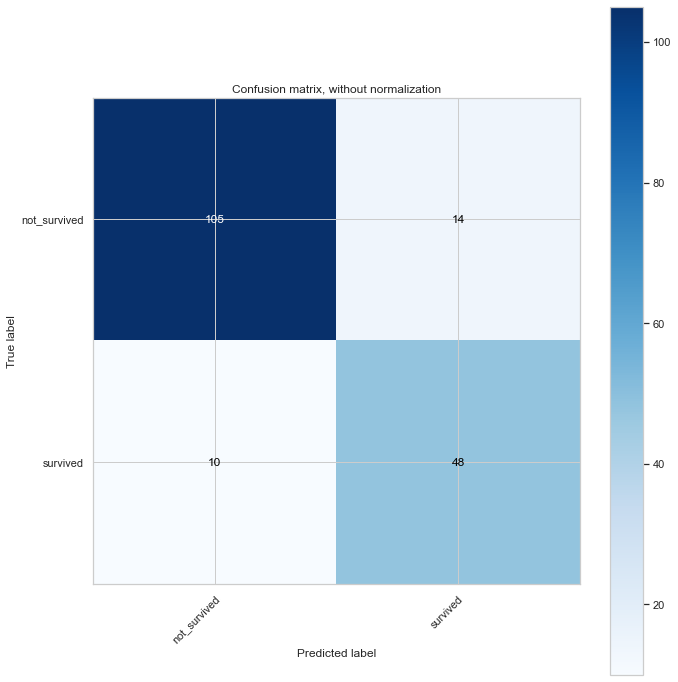

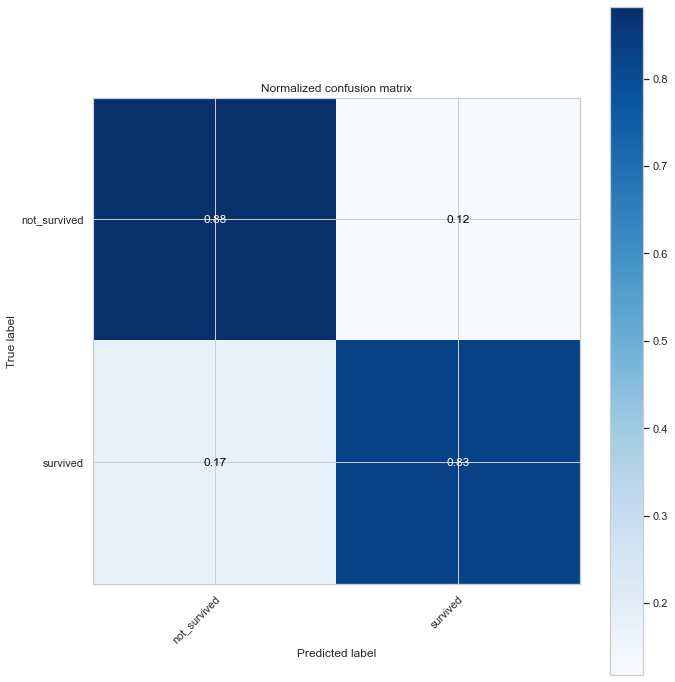

In [271]:
from sklearn.utils.multiclass import unique_labels
from sklearn.metrics import confusion_matrix
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
Y_pred=TitanicModel.predict(X_test)
def plot_confusion_matrix(Y_test,Y_pred, classes,
                          normalize=False,
                          title=None,
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if not title:
        if normalize:
            title = 'Normalized confusion matrix'
        else:
            title = 'Confusion matrix, without normalization'

    # Compute confusion matrix
    cm = confusion_matrix(Y_test,Y_pred)
    # Only use the labels that appear in the data
    classes = classes[unique_labels(Y_test,Y_pred)]
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    print(cm)

    fig, ax = plt.subplots()
    im = ax.imshow(cm, interpolation='nearest', cmap=cmap)
    ax.figure.colorbar(im, ax=ax)
    # We want to show all ticks...
    ax.set(xticks=np.arange(cm.shape[1]),
           yticks=np.arange(cm.shape[0]),
           # ... and label them with the respective list entries
           xticklabels=classes, yticklabels=classes,
           title=title,
           ylabel='True label',
           xlabel='Predicted label')

    # Rotate the tick labels and set their alignment.
    plt.setp(ax.get_xticklabels(), rotation=45, ha="right",
             rotation_mode="anchor")

    # Loop over data dimensions and create text annotations.
    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            ax.text(j, i, format(cm[i, j], fmt),
                    ha="center", va="center",
                    color="white" if cm[i, j] > thresh else "black")
    fig.tight_layout()
    return ax


np.set_printoptions(precision=2)

class_names = np.array(['not_survived','survived'])

# Plot non-normalized confusion matrix
plot_confusion_matrix(Y_test,Y_pred, classes=class_names,
                      title='Confusion matrix, without normalization')

# Plot normalized confusion matrix
plot_confusion_matrix(Y_test,Y_pred, classes=class_names, normalize=True,
                      title='Normalized confusion matrix')

plt.show()

# ROC Curve (Logistic Regression)

0.8714865256447407


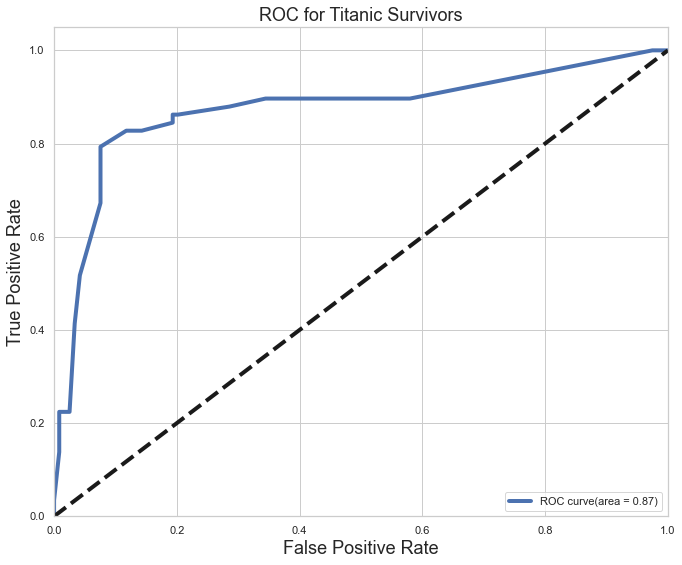

In [272]:
from sklearn.metrics import roc_curve, auc
#plt.style.use('seaborn-pastel')
Y_score = TitanicModel.decision_function(X_test)

FPR, TPR, _ = roc_curve(Y_test, Y_score)
ROC_AUC = auc(FPR, TPR)
print (ROC_AUC)

plt.figure(figsize =[11,9])
plt.plot(FPR, TPR, label= 'ROC curve(area = %0.2f)'%ROC_AUC, linewidth= 4)
plt.plot([0,1],[0,1], 'k--', linewidth = 4)
plt.xlim([0.0,1.0])
plt.ylim([0.0,1.05])
plt.xlabel('False Positive Rate', fontsize = 18)
plt.ylabel('True Positive Rate', fontsize = 18)
plt.title('ROC for Titanic Survivors', fontsize= 18)
plt.legend(loc="lower right")
plt.show()

# Precision Recall Curve (Logistic Regression)

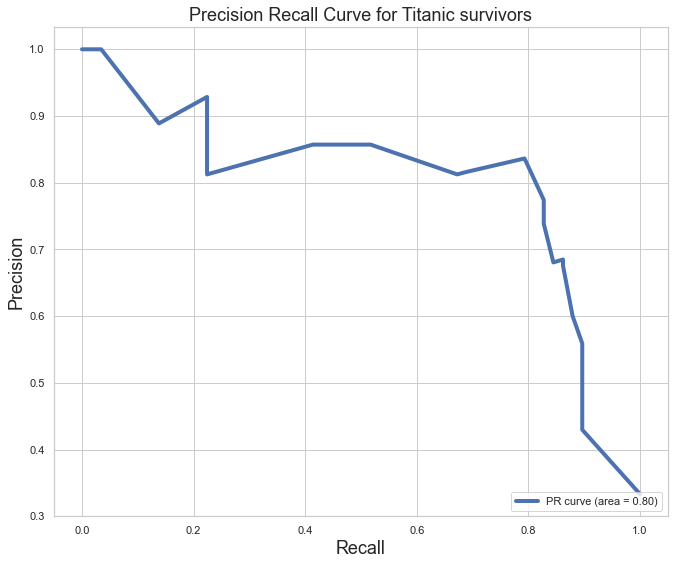

In [273]:
from sklearn.metrics import precision_recall_curve

Y_score = TitanicModel.decision_function(X_test)

precision, recall, _ = precision_recall_curve(Y_test, Y_score)
PR_AUC = auc(recall, precision)

plt.figure(figsize=[11,9])
plt.plot(recall, precision, label='PR curve (area = %0.2f)' % PR_AUC, linewidth=4)
plt.xlabel('Recall', fontsize=18)
plt.ylabel('Precision', fontsize=18)
plt.title('Precision Recall Curve for Titanic survivors', fontsize=18)
plt.legend(loc="lower right")
plt.show()

# Logistic Regression Tuning

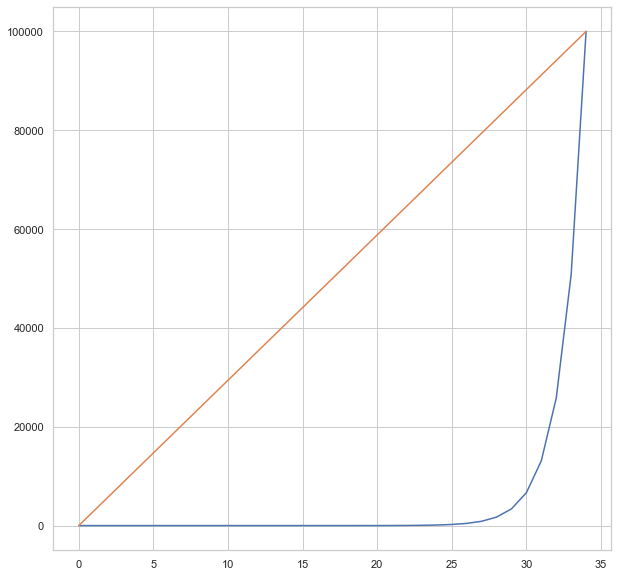

In [283]:
# Creating a Range for C values
# Plotting C values geomspace vs linspace
plot(geomspace(1e-5,1e5,num=35)) # Uniformly distributed in log space
plot(linspace(1e-5,1e5,num=35)) # Uniformly distributed in linear space, instead of log space
show()

# Hyperparameter Tuning Manually

In [345]:
# Looping Over The Parametres
# Here we have selected geomspace range for C value because it is probably best for finding Global Minimum Loss
C_List = np.geomspace(1e-5,1e5,num=35)
Accuracy = []
Log_Loss = []
for c in C_List:
    TitanicModel2=LogisticRegression(solver='liblinear', class_weight='balanced', C=c, penalty='l1')
    TitanicModel2.fit(X_train,Y_train)
    Score=TitanicModel2.score(X_test,Y_test)
    Accuracy.append(Score)
    print("The Accuracy of C parameter {} is {}:".format(c,Score))
    Predicted_Proba_Y = TitanicModel.predict_proba(X_test)
    Log_Loss2 = log_loss(Y_test,Predicted_Proba_Y)
    Log_Loss.append(Log_Loss2)
    print("The Log Loss of parameter {} is {}:".format(c, Log_Loss2))
    print("")

The Accuracy of C parameter 1e-05 is 0.5988700564971752:
The Log Loss of parameter 1e-05 is 0.3612053493298912:

The Accuracy of C parameter 1.968419447286611e-05 is 0.5988700564971752:
The Log Loss of parameter 1.968419447286611e-05 is 0.3612053493298912:

The Accuracy of C parameter 3.874675120456128e-05 is 0.5988700564971752:
The Log Loss of parameter 3.874675120456128e-05 is 0.3612053493298912:

The Accuracy of C parameter 7.626985859023451e-05 is 0.5988700564971752:
The Log Loss of parameter 7.626985859023451e-05 is 0.3612053493298912:

The Accuracy of C parameter 0.00015013107289081742 is 0.5988700564971752:
The Log Loss of parameter 0.00015013107289081742 is 0.3612053493298912:

The Accuracy of C parameter 0.0002955209235202888 is 0.5988700564971752:
The Log Loss of parameter 0.0002955209235202888 is 0.3612053493298912:

The Accuracy of C parameter 0.0005817091329374358 is 0.5988700564971752:
The Log Loss of parameter 0.0005817091329374358 is 0.3612053493298912:

The Accuracy of

In [346]:
# Putting the Outcomes in A Table & Reshaping
accuracy = array(Accuracy).reshape(35,)
LoG_LoSs = array(Log_Loss).reshape(35,)
# Zip
Outcomes = zip(C_List,accuracy,LoG_LoSs)
# DataFrame
DF_Outcomes = DataFrame(Outcomes, columns=["C_List","accuracy","LoG_LoSs"])
# Print DF_Outcomes
DF_Outcomes
# Re-Ordering the DF_Outcomes
DF_Outcomes.sort_values("LoG_LoSs", ascending=True).reset_index()

,index,C_List,accuracy,LoG_LoSs
0,0,0.000010,0.598870,0.361205
1,19,3.874675,0.858757,0.361205
2,20,7.626986,0.858757,0.361205
3,21,15.013107,0.858757,0.361205
4,22,29.552092,0.858757,0.361205
5,23,58.170913,0.858757,0.361205
6,24,114.504757,0.858757,0.361205
7,18,1.968419,0.858757,0.361205
8,25,225.393390,0.858757,0.361205
9,27,873.326162,0.858757,0.361205


In [348]:
# For loop to check ideal sample that will give generalized model
#Test1
for i in range(1,3500):
    X_train,X_test,Y_train,Y_test = train_test_split(Features, Label, test_size=0.20, random_state=i)
    
    TitanicModel2=LogisticRegression(solver='liblinear', penalty='l1', class_weight='balanced', C=0.066608)
    
    TitanicModel2.fit(X_train,Y_train)
    
    train_score=TitanicModel2.score(X_train,Y_train)
    
    test_score=TitanicModel2.score(X_test,Y_test)
    
    if test_score > train_score:
        print("Test: {} Train: {} RandomState: {}".format(test_score,train_score,i))

Test: 0.864406779661017 Train: 0.7949080622347949 RandomState: 3
Test: 0.8361581920903954 Train: 0.801980198019802 RandomState: 5
Test: 0.8135593220338984 Train: 0.8076379066478077 RandomState: 8
Test: 0.8248587570621468 Train: 0.8048090523338048 RandomState: 9
Test: 0.8305084745762712 Train: 0.8033946251768034 RandomState: 10
Test: 0.8531073446327684 Train: 0.7977369165487977 RandomState: 12
Test: 0.8418079096045198 Train: 0.8005657708628006 RandomState: 14
Test: 0.8361581920903954 Train: 0.7878359264497878 RandomState: 15
Test: 0.8305084745762712 Train: 0.8033946251768034 RandomState: 18
Test: 0.8192090395480226 Train: 0.8062234794908062 RandomState: 19
Test: 0.8192090395480226 Train: 0.8062234794908062 RandomState: 20
Test: 0.8135593220338984 Train: 0.8076379066478077 RandomState: 21
Test: 0.8192090395480226 Train: 0.8062234794908062 RandomState: 23
Test: 0.8135593220338984 Train: 0.8076379066478077 RandomState: 25
Test: 0.8361581920903954 Train: 0.801980198019802 RandomState: 28
Te

Test: 0.8248587570621468 Train: 0.8161244695898161 RandomState: 552
Test: 0.8361581920903954 Train: 0.801980198019802 RandomState: 556
Test: 0.8361581920903954 Train: 0.801980198019802 RandomState: 557
Test: 0.8248587570621468 Train: 0.8161244695898161 RandomState: 560
Test: 0.8587570621468926 Train: 0.7821782178217822 RandomState: 562
Test: 0.8192090395480226 Train: 0.8062234794908062 RandomState: 568
Test: 0.8587570621468926 Train: 0.7963224893917963 RandomState: 570
Test: 0.8192090395480226 Train: 0.8062234794908062 RandomState: 571
Test: 0.8248587570621468 Train: 0.7906647807637907 RandomState: 573
Test: 0.8700564971751412 Train: 0.7934936350777935 RandomState: 574
Test: 0.8135593220338984 Train: 0.8076379066478077 RandomState: 575
Test: 0.8248587570621468 Train: 0.8048090523338048 RandomState: 576
Test: 0.8248587570621468 Train: 0.7906647807637907 RandomState: 581
Test: 0.847457627118644 Train: 0.7991513437057991 RandomState: 582
Test: 0.8531073446327684 Train: 0.7977369165487977 

Test: 0.8418079096045198 Train: 0.8005657708628006 RandomState: 839
Test: 0.8248587570621468 Train: 0.8161244695898161 RandomState: 840
Test: 0.8248587570621468 Train: 0.8048090523338048 RandomState: 841
Test: 0.8192090395480226 Train: 0.8062234794908062 RandomState: 845
Test: 0.8305084745762712 Train: 0.8033946251768034 RandomState: 848
Test: 0.8305084745762712 Train: 0.8033946251768034 RandomState: 849
Test: 0.8587570621468926 Train: 0.7963224893917963 RandomState: 856
Test: 0.8700564971751412 Train: 0.7934936350777935 RandomState: 860
Test: 0.8361581920903954 Train: 0.801980198019802 RandomState: 865
Test: 0.847457627118644 Train: 0.7991513437057991 RandomState: 866
Test: 0.8587570621468926 Train: 0.7963224893917963 RandomState: 867
Test: 0.8192090395480226 Train: 0.8062234794908062 RandomState: 868
Test: 0.8192090395480226 Train: 0.8062234794908062 RandomState: 870
Test: 0.8192090395480226 Train: 0.8062234794908062 RandomState: 872
Test: 0.8248587570621468 Train: 0.8048090523338048

Test: 0.8192090395480226 Train: 0.8062234794908062 RandomState: 1110
Test: 0.8135593220338984 Train: 0.8076379066478077 RandomState: 1117
Test: 0.8248587570621468 Train: 0.8048090523338048 RandomState: 1118
Test: 0.8135593220338984 Train: 0.8076379066478077 RandomState: 1119
Test: 0.8192090395480226 Train: 0.8062234794908062 RandomState: 1122
Test: 0.8361581920903954 Train: 0.801980198019802 RandomState: 1123
Test: 0.8192090395480226 Train: 0.8062234794908062 RandomState: 1124
Test: 0.8192090395480226 Train: 0.8062234794908062 RandomState: 1125
Test: 0.847457627118644 Train: 0.7991513437057991 RandomState: 1128
Test: 0.8248587570621468 Train: 0.8048090523338048 RandomState: 1131
Test: 0.8418079096045198 Train: 0.8005657708628006 RandomState: 1132
Test: 0.8587570621468926 Train: 0.7821782178217822 RandomState: 1139
Test: 0.8361581920903954 Train: 0.801980198019802 RandomState: 1140
Test: 0.8135593220338984 Train: 0.8076379066478077 RandomState: 1142
Test: 0.8248587570621468 Train: 0.804

Test: 0.8700564971751412 Train: 0.7934936350777935 RandomState: 1371
Test: 0.8531073446327684 Train: 0.7977369165487977 RandomState: 1374
Test: 0.8248587570621468 Train: 0.8048090523338048 RandomState: 1378
Test: 0.8418079096045198 Train: 0.8005657708628006 RandomState: 1381
Test: 0.8531073446327684 Train: 0.7977369165487977 RandomState: 1382
Test: 0.8418079096045198 Train: 0.8005657708628006 RandomState: 1385
Test: 0.8305084745762712 Train: 0.8033946251768034 RandomState: 1388
Test: 0.8135593220338984 Train: 0.8076379066478077 RandomState: 1390
Test: 0.8135593220338984 Train: 0.8076379066478077 RandomState: 1393
Test: 0.8192090395480226 Train: 0.8062234794908062 RandomState: 1396
Test: 0.847457627118644 Train: 0.7991513437057991 RandomState: 1398
Test: 0.8192090395480226 Train: 0.8062234794908062 RandomState: 1399
Test: 0.8192090395480226 Train: 0.8062234794908062 RandomState: 1400
Test: 0.8248587570621468 Train: 0.8048090523338048 RandomState: 1402
Test: 0.847457627118644 Train: 0.79

Test: 0.8418079096045198 Train: 0.8005657708628006 RandomState: 1705
Test: 0.8192090395480226 Train: 0.8062234794908062 RandomState: 1706
Test: 0.8305084745762712 Train: 0.7892503536067893 RandomState: 1708
Test: 0.8305084745762712 Train: 0.8033946251768034 RandomState: 1717
Test: 0.8531073446327684 Train: 0.7977369165487977 RandomState: 1721
Test: 0.8531073446327684 Train: 0.7977369165487977 RandomState: 1722
Test: 0.8192090395480226 Train: 0.8062234794908062 RandomState: 1725
Test: 0.8135593220338984 Train: 0.8076379066478077 RandomState: 1726
Test: 0.8248587570621468 Train: 0.7906647807637907 RandomState: 1728
Test: 0.807909604519774 Train: 0.7949080622347949 RandomState: 1734
Test: 0.8361581920903954 Train: 0.801980198019802 RandomState: 1735
Test: 0.8192090395480226 Train: 0.8062234794908062 RandomState: 1739
Test: 0.8305084745762712 Train: 0.8033946251768034 RandomState: 1740
Test: 0.8135593220338984 Train: 0.8076379066478077 RandomState: 1742
Test: 0.8587570621468926 Train: 0.79

Test: 0.847457627118644 Train: 0.7991513437057991 RandomState: 2001
Test: 0.8305084745762712 Train: 0.8033946251768034 RandomState: 2007
Test: 0.8531073446327684 Train: 0.7977369165487977 RandomState: 2009
Test: 0.8305084745762712 Train: 0.8033946251768034 RandomState: 2010
Test: 0.8248587570621468 Train: 0.8048090523338048 RandomState: 2011
Test: 0.8587570621468926 Train: 0.7963224893917963 RandomState: 2012
Test: 0.8248587570621468 Train: 0.8048090523338048 RandomState: 2024
Test: 0.8248587570621468 Train: 0.8048090523338048 RandomState: 2026
Test: 0.8135593220338984 Train: 0.8076379066478077 RandomState: 2027
Test: 0.8135593220338984 Train: 0.8076379066478077 RandomState: 2028
Test: 0.8192090395480226 Train: 0.7920792079207921 RandomState: 2029
Test: 0.8248587570621468 Train: 0.7906647807637907 RandomState: 2030
Test: 0.8248587570621468 Train: 0.8048090523338048 RandomState: 2032
Test: 0.8700564971751412 Train: 0.7934936350777935 RandomState: 2033
Test: 0.8361581920903954 Train: 0.8

Test: 0.8361581920903954 Train: 0.801980198019802 RandomState: 2295
Test: 0.8361581920903954 Train: 0.801980198019802 RandomState: 2296
Test: 0.8135593220338984 Train: 0.8076379066478077 RandomState: 2298
Test: 0.8135593220338984 Train: 0.8076379066478077 RandomState: 2301
Test: 0.8192090395480226 Train: 0.8062234794908062 RandomState: 2306
Test: 0.8135593220338984 Train: 0.8076379066478077 RandomState: 2307
Test: 0.8305084745762712 Train: 0.8033946251768034 RandomState: 2308
Test: 0.8192090395480226 Train: 0.8062234794908062 RandomState: 2309
Test: 0.8305084745762712 Train: 0.7892503536067893 RandomState: 2314
Test: 0.8305084745762712 Train: 0.8033946251768034 RandomState: 2318
Test: 0.8248587570621468 Train: 0.8048090523338048 RandomState: 2319
Test: 0.807909604519774 Train: 0.7949080622347949 RandomState: 2324
Test: 0.8248587570621468 Train: 0.8048090523338048 RandomState: 2325
Test: 0.847457627118644 Train: 0.7991513437057991 RandomState: 2326
Test: 0.8192090395480226 Train: 0.8062

Test: 0.8192090395480226 Train: 0.8062234794908062 RandomState: 2605
Test: 0.8248587570621468 Train: 0.8048090523338048 RandomState: 2606
Test: 0.8418079096045198 Train: 0.8005657708628006 RandomState: 2607
Test: 0.8192090395480226 Train: 0.8062234794908062 RandomState: 2609
Test: 0.847457627118644 Train: 0.7991513437057991 RandomState: 2611
Test: 0.8192090395480226 Train: 0.8062234794908062 RandomState: 2612
Test: 0.8192090395480226 Train: 0.8062234794908062 RandomState: 2613
Test: 0.8192090395480226 Train: 0.8062234794908062 RandomState: 2615
Test: 0.8531073446327684 Train: 0.7977369165487977 RandomState: 2616
Test: 0.8361581920903954 Train: 0.801980198019802 RandomState: 2618
Test: 0.8305084745762712 Train: 0.8033946251768034 RandomState: 2619
Test: 0.8192090395480226 Train: 0.8062234794908062 RandomState: 2622
Test: 0.8305084745762712 Train: 0.8033946251768034 RandomState: 2623
Test: 0.8135593220338984 Train: 0.8076379066478077 RandomState: 2624
Test: 0.8192090395480226 Train: 0.80

Test: 0.847457627118644 Train: 0.7991513437057991 RandomState: 2893
Test: 0.807909604519774 Train: 0.7949080622347949 RandomState: 2895
Test: 0.8022598870056498 Train: 0.7920792079207921 RandomState: 2897
Test: 0.8418079096045198 Train: 0.8005657708628006 RandomState: 2900
Test: 0.8192090395480226 Train: 0.8062234794908062 RandomState: 2901
Test: 0.8135593220338984 Train: 0.8076379066478077 RandomState: 2902
Test: 0.8531073446327684 Train: 0.7977369165487977 RandomState: 2903
Test: 0.8305084745762712 Train: 0.8033946251768034 RandomState: 2904
Test: 0.8135593220338984 Train: 0.8076379066478077 RandomState: 2905
Test: 0.8531073446327684 Train: 0.7977369165487977 RandomState: 2909
Test: 0.8022598870056498 Train: 0.7963224893917963 RandomState: 2911
Test: 0.8361581920903954 Train: 0.801980198019802 RandomState: 2912
Test: 0.8305084745762712 Train: 0.8033946251768034 RandomState: 2913
Test: 0.8305084745762712 Train: 0.8033946251768034 RandomState: 2923
Test: 0.8192090395480226 Train: 0.806

Test: 0.8418079096045198 Train: 0.8005657708628006 RandomState: 3187
Test: 0.8305084745762712 Train: 0.8033946251768034 RandomState: 3189
Test: 0.847457627118644 Train: 0.7991513437057991 RandomState: 3194
Test: 0.8192090395480226 Train: 0.8062234794908062 RandomState: 3195
Test: 0.8135593220338984 Train: 0.8076379066478077 RandomState: 3196
Test: 0.8248587570621468 Train: 0.8048090523338048 RandomState: 3198
Test: 0.8531073446327684 Train: 0.7977369165487977 RandomState: 3199
Test: 0.807909604519774 Train: 0.7949080622347949 RandomState: 3202
Test: 0.8192090395480226 Train: 0.8062234794908062 RandomState: 3204
Test: 0.8135593220338984 Train: 0.8076379066478077 RandomState: 3205
Test: 0.8305084745762712 Train: 0.7892503536067893 RandomState: 3209
Test: 0.8192090395480226 Train: 0.8062234794908062 RandomState: 3210
Test: 0.8192090395480226 Train: 0.8062234794908062 RandomState: 3217
Test: 0.8192090395480226 Train: 0.8062234794908062 RandomState: 3218
Test: 0.8361581920903954 Train: 0.80

Test: 0.8418079096045198 Train: 0.8005657708628006 RandomState: 3432
Test: 0.8248587570621468 Train: 0.8048090523338048 RandomState: 3434
Test: 0.8248587570621468 Train: 0.8048090523338048 RandomState: 3435
Test: 0.8248587570621468 Train: 0.8048090523338048 RandomState: 3436
Test: 0.8192090395480226 Train: 0.8062234794908062 RandomState: 3437
Test: 0.8192090395480226 Train: 0.8062234794908062 RandomState: 3438
Test: 0.8192090395480226 Train: 0.8062234794908062 RandomState: 3440
Test: 0.8361581920903954 Train: 0.801980198019802 RandomState: 3441
Test: 0.8361581920903954 Train: 0.801980198019802 RandomState: 3444
Test: 0.8135593220338984 Train: 0.8076379066478077 RandomState: 3445
Test: 0.8135593220338984 Train: 0.8076379066478077 RandomState: 3447
Test: 0.8248587570621468 Train: 0.8048090523338048 RandomState: 3450
Test: 0.8248587570621468 Train: 0.8048090523338048 RandomState: 3461
Test: 0.8305084745762712 Train: 0.8033946251768034 RandomState: 3462
Test: 0.8248587570621468 Train: 0.80

In [349]:
#Train Test Split, 80% Training Data & 20% Testing Data
X_train, X_test, Y_train, Y_test = train_test_split(Features,Label,test_size=0.20,random_state=1275)
Features_with_constant=add_constant(X_train)
TitanicModel2_Stat=Logit(Y_train,Features_with_constant)
Results=TitanicModel2_Stat.fit()
Results.params
print(Results.summary())

Optimization terminated successfully.
         Current function value: 0.455190
         Iterations 6
                           Logit Regression Results                           
Dep. Variable:               Survived   No. Observations:                  707
Model:                          Logit   Df Residuals:                      707
Method:                           MLE   Df Model:                           -1
Date:                Sun, 06 Dec 2020   Pseudo R-squ.:                  0.3141
Time:                        19:47:11   Log-Likelihood:                -321.82
converged:                       True   LL-Null:                       -469.17
Covariance Type:            nonrobust   LLR p-value:                       nan
                           coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   -0.8738      0.444     -1.970      0.049      -1.743      -0.004

D:\D Program Files\Anaconda\lib\site-packages\numpy\linalg\linalg.py:1872: RuntimeWarning: invalid value encountered in greater
  return count_nonzero(S > tol, axis=-1)


In [350]:
# Multi-Colinearity
# "WithFamily" Feature have Highest VIF > 5
vif=[variance_inflation_factor(Features_with_constant.values,i) for i in range (Features_with_constant.shape[1])]
DataFrame({"vif":vif[0:]},index=Features_with_constant.columns).T

,const,Pclass_3,Family_Group_loner,Family_Group_small,Fare_Group_high,Fare_Group_very_high,title_Mr
vif,19.735927,1.607954,4.310883,4.07748,1.446337,1.171689,1.242993


In [351]:
TitanicModel2.score(X_train,Y_train) #RegModel Accuracy check upon Training Data
                                     #Accuracy is 78.78 % (It May change next time)

0.7878359264497878

In [352]:
TitanicModel2.score(X_test,Y_test) #RegModel Accuracy check upon Training Data
                                   #Accuracy is 78.78 % (It May change next time)

0.8926553672316384

In [353]:
# Coefficient of Features
coef = TitanicModel2.coef_[0]
DataFrame(coef, X_train.columns, columns=['coef'])

,coef
Pclass_3,0.000000
Family_Group_loner,0.290683
Family_Group_small,0.502481
Fare_Group_high,0.265243
Fare_Group_very_high,0.285307
title_Mr,-1.787831


# Manual Tuning Result

In [354]:
from sklearn.metrics import classification_report, confusion_matrix
# printing confision matrix
DataFrame(confusion_matrix(Y_test,TitanicModel2.predict(X_test)),\
            columns=["Predicted Not-Survived", "Predicted Survived"],\
            index=["Not-Survived","Survived"] )

,Predicted Not-Survived,Predicted Survived
Not-Survived,92,14
Survived,5,66


In [355]:
from sklearn.metrics import recall_score
recall_score(Y_test,TitanicModel2.predict(X_test))

0.9295774647887324

In [356]:
from sklearn.metrics import precision_score
precision_score(Y_test,TitanicModel2.predict(X_test))

0.825

In [357]:
from sklearn.metrics import classification_report, balanced_accuracy_score
print(classification_report(Y_test,TitanicModel2.predict(X_test)))

              precision    recall  f1-score   support

           0       0.95      0.87      0.91       106
           1       0.82      0.93      0.87        71

    accuracy                           0.89       177
   macro avg       0.89      0.90      0.89       177
weighted avg       0.90      0.89      0.89       177



# Log_Loss Result of Manual Tuning

In [358]:
from sklearn.metrics import log_loss
# Running Logarithmic Loss-or Log Loss-or Cross Entropy Loss on training Data
#Predicted_Proba_Y = TitanicModel2.predict(X_train)
Predicted_Proba_Y = TitanicModel2.predict_proba(X_train)
print("The Log Loss on Training is: ", log_loss(Y_train, Predicted_Proba_Y))

# Running Logarithmic Loss-or Log Loss-or Cross Entropy Loss on testing Data
Predicted_Proba_Y = TitanicModel2.predict_proba(X_test)
print("The Log Loss on Testing is: ", log_loss(Y_test, Predicted_Proba_Y)) # Log-Loss has been Down
                                                                           # so our prediction is very good

The Log Loss on Training is:  0.49859983929082313
The Log Loss on Testing is:  0.40710483081781745


Confusion matrix, without normalization
[[92 14]
 [ 5 66]]
Normalized confusion matrix
[[0.87 0.13]
 [0.07 0.93]]


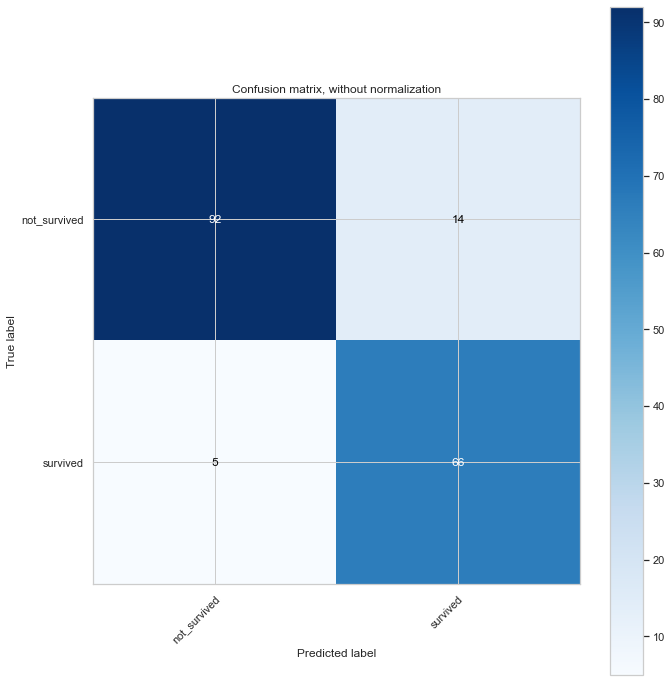

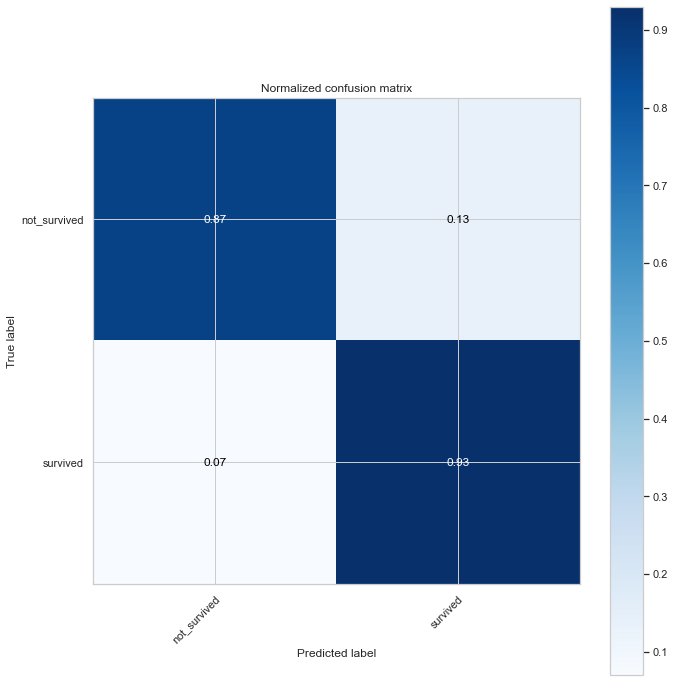

In [359]:
from sklearn.utils.multiclass import unique_labels
from sklearn.metrics import confusion_matrix
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
Y_pred=TitanicModel2.predict(X_test)
def plot_confusion_matrix(Y_test,Y_pred, classes,
                          normalize=False,
                          title=None,
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if not title:
        if normalize:
            title = 'Normalized confusion matrix'
        else:
            title = 'Confusion matrix, without normalization'

    # Compute confusion matrix
    cm = confusion_matrix(Y_test,Y_pred)
    # Only use the labels that appear in the data
    classes = classes[unique_labels(Y_test,Y_pred)]
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    print(cm)

    fig, ax = plt.subplots()
    im = ax.imshow(cm, interpolation='nearest', cmap=cmap)
    ax.figure.colorbar(im, ax=ax)
    # We want to show all ticks...
    ax.set(xticks=np.arange(cm.shape[1]),
           yticks=np.arange(cm.shape[0]),
           # ... and label them with the respective list entries
           xticklabels=classes, yticklabels=classes,
           title=title,
           ylabel='True label',
           xlabel='Predicted label')

    # Rotate the tick labels and set their alignment.
    plt.setp(ax.get_xticklabels(), rotation=45, ha="right",
             rotation_mode="anchor")

    # Loop over data dimensions and create text annotations.
    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            ax.text(j, i, format(cm[i, j], fmt),
                    ha="center", va="center",
                    color="white" if cm[i, j] > thresh else "black")
    fig.tight_layout()
    return ax


np.set_printoptions(precision=2)

class_names = np.array(['not_survived','survived'])

# Plot non-normalized confusion matrix
plot_confusion_matrix(Y_test,Y_pred, classes=class_names,
                      title='Confusion matrix, without normalization')

# Plot normalized confusion matrix
plot_confusion_matrix(Y_test,Y_pred, classes=class_names, normalize=True,
                      title='Normalized confusion matrix')

plt.show()

0.9323013553016211


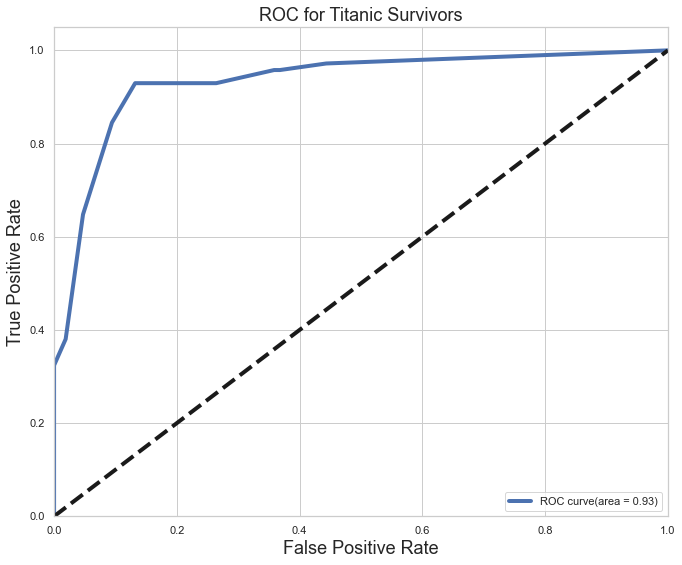

In [360]:
from sklearn.metrics import roc_curve, auc
#plt.style.use('seaborn-pastel')
Y_score = TitanicModel2.decision_function(X_test)

FPR, TPR, _ = roc_curve(Y_test, Y_score)
ROC_AUC = auc(FPR, TPR)
print (ROC_AUC)

plt.figure(figsize =[11,9])
plt.plot(FPR, TPR, label= 'ROC curve(area = %0.2f)'%ROC_AUC, linewidth= 4)
plt.plot([0,1],[0,1], 'k--', linewidth = 4)
plt.xlim([0.0,1.0])
plt.ylim([0.0,1.05])
plt.xlabel('False Positive Rate', fontsize = 18)
plt.ylabel('True Positive Rate', fontsize = 18)
plt.title('ROC for Titanic Survivors', fontsize= 18)
plt.legend(loc="lower right")
plt.show()

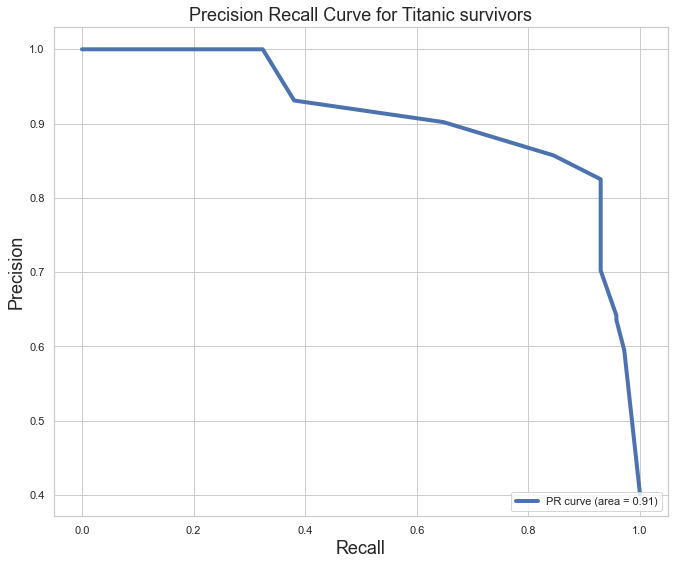

In [361]:
from sklearn.metrics import precision_recall_curve

Y_score = TitanicModel2.decision_function(X_test)

precision, recall, _ = precision_recall_curve(Y_test, Y_score)
PR_AUC = auc(recall, precision)

plt.figure(figsize=[11,9])
plt.plot(recall, precision, label='PR curve (area = %0.2f)' % PR_AUC, linewidth=4)
plt.xlabel('Recall', fontsize=18)
plt.ylabel('Precision', fontsize=18)
plt.title('Precision Recall Curve for Titanic survivors', fontsize=18)
plt.legend(loc="lower right")
plt.show()

# Solver Selection Process

In [362]:
solver_list = ['liblinear', 'newton-cg', 'lbfgs', 'sag', 'saga']
params = dict(solver=solver_list)
cv = StratifiedShuffleSplit(n_splits = 5, test_size = .20, random_state=1275)

Titanic_Solver_Select = LogisticRegression(C=1, n_jobs=-1, random_state=1275, class_weight='balanced', penalty='l1')
Solver_Type = GridSearchCV(Titanic_Solver_Select, params, cv=cv)
Solver_Type.fit(X_train, Y_train)
scores = Solver_Type.cv_results_['mean_test_score']

for score, solver in zip(scores, solver_list):
    print(f"  {solver} {score:.3f}" )

D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_logistic.py:1355: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_logistic.py:1355: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_logistic.py:1355: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_logistic.py:1355: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
D:\D Program Files\Anaconda\lib\

  liblinear 0.762
  newton-cg nan
  lbfgs nan
  sag nan
  saga 0.755


D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_logistic.py:1355: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))


In [363]:
solver_list = ['liblinear', 'newton-cg', 'lbfgs', 'sag', 'saga']
params = dict(solver=solver_list)
cv = StratifiedShuffleSplit(n_splits = 5, test_size = .20, random_state=1275)

Titanic_Solver_Select = LogisticRegression(C=0.066608, n_jobs=-1, random_state=1275, class_weight='balanced', penalty='l1')
Solver_Type = GridSearchCV(Titanic_Solver_Select, params, cv=cv)
Solver_Type.fit(X_train, Y_train)
scores = Solver_Type.cv_results_['mean_test_score']

for score, solver in zip(scores, solver_list):
    print(f"  {solver} {score:.3f}" )

D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_logistic.py:1355: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_logistic.py:1355: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_logistic.py:1355: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
D:\D Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_logistic.py:1355: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
D:\D Program Files\Anaconda\lib\

  liblinear 0.751
  newton-cg nan
  lbfgs nan
  sag nan
  saga 0.742


# Hyperparameter by using LogisticRegressionCV

In [364]:
# Another Way of Doing Hypertuning
from sklearn.linear_model import LogisticRegressionCV
from sklearn.model_selection import StratifiedShuffleSplit
cv = StratifiedShuffleSplit(n_splits = 5, test_size = .20, random_state=1275)
# Logistic Reg CV
LRCV1 = LogisticRegressionCV(cv=cv, random_state=1275, Cs=C_List, solver='liblinear', penalty='l1')
LRCV1.fit(X_train,Y_train)
print("The Accuracy is:",LRCV1.score(X_test,Y_test))
Pred_Proba_T=LRCV1.predict_proba(X_test)
Log_Loss_T=log_loss(Y_test,Pred_Proba_T)
print("The Log Loss is:",Log_Loss_T)
print("The Optimal C parameter is:",LRCV1.C_)

The Accuracy is: 0.8813559322033898
The Log Loss is: 0.3666628399118011
The Optimal C parameter is: [0.26]


In [365]:
# Another Way of Doing Hypertuning @ balanced class weight
from sklearn.linear_model import LogisticRegressionCV
from sklearn.model_selection import StratifiedShuffleSplit
cv = StratifiedShuffleSplit(n_splits = 5, test_size = .20, random_state=1275)
# Logistic Reg CV
LRCV2 = LogisticRegressionCV(cv=cv, random_state=1275, Cs=C_List, solver='liblinear', class_weight='balanced', penalty='l1')
LRCV2.fit(X_train,Y_train)
print("The Accuracy is:",LRCV2.score(X_test,Y_test))
Pred_Proba_T=LRCV2.predict_proba(X_test)
Log_Loss_T=log_loss(Y_test,Pred_Proba_T)
print("The Log Loss is:",Log_Loss_T)
print("The Optimal C parameter is:",LRCV2.C_)

The Accuracy is: 0.8587570621468926
The Log Loss is: 0.39994204528735405
The Optimal C parameter is: [0.13]


# LogisticRegressionCV Tuning Result

In [366]:
from sklearn.metrics import classification_report, balanced_accuracy_score
print(classification_report(Y_test,LRCV1.predict(X_test)))

              precision    recall  f1-score   support

           0       0.90      0.91      0.90       106
           1       0.86      0.85      0.85        71

    accuracy                           0.88       177
   macro avg       0.88      0.88      0.88       177
weighted avg       0.88      0.88      0.88       177



In [367]:
from sklearn.metrics import classification_report, balanced_accuracy_score
print(classification_report(Y_test,LRCV2.predict(X_test)))

              precision    recall  f1-score   support

           0       0.89      0.87      0.88       106
           1       0.81      0.85      0.83        71

    accuracy                           0.86       177
   macro avg       0.85      0.86      0.85       177
weighted avg       0.86      0.86      0.86       177



# LogisticRegressionCV Tuning Log_Loss Result

In [368]:
from sklearn.metrics import log_loss
# Running Logarithmic Loss-or Log Loss-or Cross Entropy Loss on training Data
#Predicted_Proba_Y = TitanicModel2.predict(X_train)
Predicted_Proba_Y = LRCV1.predict_proba(X_train)
print("The Log Loss on Training is: ", log_loss(Y_train, Predicted_Proba_Y))

# Running Logarithmic Loss-or Log Loss-or Cross Entropy Loss on testing Data
Predicted_Proba_Y = LRCV1.predict_proba(X_test)
print("The Log Loss on Testing is: ", log_loss(Y_test, Predicted_Proba_Y)) # Log-Loss has been Down
                                                                           # so our prediction is very good

The Log Loss on Training is:  0.4612737597874816
The Log Loss on Testing is:  0.3666628399118011


In [369]:
from sklearn.metrics import log_loss
# Running Logarithmic Loss-or Log Loss-or Cross Entropy Loss on training Data
#Predicted_Proba_Y = TitanicModel2.predict(X_train)
Predicted_Proba_Y = LRCV2.predict_proba(X_train)
print("The Log Loss on Training is: ", log_loss(Y_train, Predicted_Proba_Y))

# Running Logarithmic Loss-or Log Loss-or Cross Entropy Loss on testing Data
Predicted_Proba_Y = LRCV2.predict_proba(X_test)
print("The Log Loss on Testing is: ", log_loss(Y_test, Predicted_Proba_Y)) # Log-Loss has been Down
                                                                           # so our prediction is very good

The Log Loss on Training is:  0.48225757082992415
The Log Loss on Testing is:  0.39994204528735405


# Mean Classification Accuracy

In [371]:
## Using StratifiedShuffleSplit No of Splits always should be 5 for 80% Train & 20% Test Split Pattern
## Always Provide test_size=.20
## We can use KFold, StratifiedShuffleSplit, StratiriedKFold or ShuffleSplit, They are all close cousins. look at sklearn userguide for more info.   
from sklearn.model_selection import StratifiedShuffleSplit, cross_val_score
cv = StratifiedShuffleSplit(n_splits = 5, test_size=.20, random_state=1275) # run model 10x with 60/30 split intentionally leaving out 10%
accuracies = cross_val_score(LogisticRegression(solver='liblinear', class_weight='balanced', C=0.066608, penalty='l1'), Features, Label, cv = cv)
print ("Cross-Validation accuracy scores:{}".format(accuracies))
print ("Mean Cross-Validation accuracy score: {}".format(round(accuracies.mean(),5)))

Cross-Validation accuracy scores:[0.77 0.83 0.8  0.83 0.81]
Mean Cross-Validation accuracy score: 0.80791


In [372]:
## Using StratifiedShuffleSplit No of Splits always should be 5 for 80% Train & 20% Test Split Pattern
## We can use KFold, StratifiedShuffleSplit, StratiriedKFold or ShuffleSplit, They are all close cousins. look at sklearn userguide for more info.   
from sklearn.model_selection import StratifiedKFold, cross_val_score
cv = StratifiedKFold(n_splits = 5, shuffle=True, random_state=1275) # run model 10x with 60/30 split intentionally leaving out 10%
accuracies = cross_val_score(LogisticRegression(solver='liblinear', class_weight='balanced', C=0.066608, penalty='l1'), Features, Label, cv = cv)
print ("Cross-Validation accuracy scores:{}".format(accuracies))
print ("Mean Cross-Validation accuracy score: {}".format(round(accuracies.mean(),5)))

Cross-Validation accuracy scores:[0.81 0.8  0.82 0.77 0.84]
Mean Cross-Validation accuracy score: 0.80885


# Hyperparameter Tuning by using GridSearchCV

In [87]:
from sklearn.model_selection import GridSearchCV, StratifiedKFold
## C_vals is the alpla value of lasso and ridge regression(as alpha increases the model complexity decreases,)
## remember effective alpha scores are 0<alpha<infinity 
C_vals = [0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1,2,3,4,5,6,7,8,9,10,12,13,14,15,16,16.5,17,17.5,18]
## Choosing penalties(Lasso(l1) or Ridge(l2))
penalties = ['l1','l2']
## Choose a cross validation strategy. 
cv = StratifiedShuffleSplit(n_splits = 5, test_size = .20, random_state=3)

## setting param for param_grid in GridSearchCV. 
param = {'penalty': penalties, 'C': C_vals}

# logreg = LogisticRegression(solver='liblinear', class_weight='balanced')
## Calling on GridSearchCV object. 
TitanicModel = GridSearchCV(estimator=LogisticRegression(solver='liblinear', class_weight='balanced'), 
                           param_grid = param,
                           scoring = 'accuracy',
                            n_jobs =-1,
                           cv = cv
                          )
## Fitting the model
TitanicModel.fit(X_train, Y_train)

GridSearchCV(cv=StratifiedShuffleSplit(n_splits=5, random_state=3, test_size=0.2,
            train_size=None),
             estimator=LogisticRegression(class_weight='balanced',
                                          solver='liblinear'),
             n_jobs=-1,
             param_grid={'C': [0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1, 2, 3,
                               4, 5, 6, 7, 8, 9, 10, 12, 13, 14, 15, 16, 16.5,
                               17, 17.5, 18],
                         'penalty': ['l1', 'l2']},
             scoring='accuracy')

In [88]:
## Getting the best of everything. 
print (TitanicModel.best_score_)
print (TitanicModel.best_params_)
print(TitanicModel.best_estimator_)

0.7774647887323943
{'C': 0.2, 'penalty': 'l1'}
LogisticRegression(C=0.2, class_weight='balanced', penalty='l1',
                   solver='liblinear')


In [89]:
from sklearn.model_selection import GridSearchCV, StratifiedShuffleSplit
## C_vals is the alpla value of lasso and ridge regression(as alpha increases the model complexity decreases,)
## remember effective alpha scores are 0<alpha<infinity 
C_vals = [0.20, 0.21, 0.22, 0.23, 0.24, 0.25, 0.26, 0.27, 0.28, 0.29, 0.30]
## Choosing penalties(Lasso(l1) or Ridge(l2))
penalties = ['l1','l2']
## Choose a cross validation strategy. 
cv = StratifiedShuffleSplit(n_splits = 5, test_size = .20, random_state=3)

## setting param for param_grid in GridSearchCV. 
param = {'penalty': penalties, 'C': C_vals}

# logreg = LogisticRegression(solver='liblinear', class_weight='balanced')
## Calling on GridSearchCV object. 
TitanicModel = GridSearchCV(estimator=LogisticRegression(solver='liblinear', class_weight='balanced'), 
                           param_grid = param,
                           scoring = 'accuracy',
                            n_jobs =-1,
                           cv = cv
                          )
## Fitting the model
TitanicModel.fit(X_train, Y_train)

GridSearchCV(cv=StratifiedShuffleSplit(n_splits=5, random_state=3, test_size=0.2,
            train_size=None),
             estimator=LogisticRegression(class_weight='balanced',
                                          solver='liblinear'),
             n_jobs=-1,
             param_grid={'C': [0.2, 0.21, 0.22, 0.23, 0.24, 0.25, 0.26, 0.27,
                               0.28, 0.29, 0.3],
                         'penalty': ['l1', 'l2']},
             scoring='accuracy')

In [90]:
## Getting the best of everything.
print (TitanicModel.best_score_)
print (TitanicModel.best_params_)
print(TitanicModel.best_estimator_)

0.7774647887323943
{'C': 0.2, 'penalty': 'l1'}
LogisticRegression(C=0.2, class_weight='balanced', penalty='l1',
                   solver='liblinear')


In [91]:
from sklearn.model_selection import GridSearchCV, StratifiedShuffleSplit
## C_vals is the alpla value of lasso and ridge regression(as alpha increases the model complexity decreases,)
## remember effective alpha scores are 0<alpha<infinity 
C_vals = [0.10, 0.11, 0.12, 0.13, 0.14, 0.15, 0.16, 0.17, 0.18, 0.19, 0.20]
## Choosing penalties(Lasso(l1) or Ridge(l2))
penalties = ['l1','l2']
## Choose a cross validation strategy. 
cv = StratifiedShuffleSplit(n_splits = 5, test_size = .20, random_state=3)

## setting param for param_grid in GridSearchCV. 
param = {'penalty': penalties, 'C': C_vals}

# logreg = LogisticRegression(solver='liblinear', class_weight='balanced')
## Calling on GridSearchCV object. 
TitanicModel = GridSearchCV(estimator=LogisticRegression(solver='liblinear', class_weight='balanced'), 
                           param_grid = param,
                           scoring = 'accuracy',
                            n_jobs =-1,
                           cv = cv
                          )
## Fitting the model
TitanicModel.fit(X_train, Y_train)

GridSearchCV(cv=StratifiedShuffleSplit(n_splits=5, random_state=3, test_size=0.2,
            train_size=None),
             estimator=LogisticRegression(class_weight='balanced',
                                          solver='liblinear'),
             n_jobs=-1,
             param_grid={'C': [0.1, 0.11, 0.12, 0.13, 0.14, 0.15, 0.16, 0.17,
                               0.18, 0.19, 0.2],
                         'penalty': ['l1', 'l2']},
             scoring='accuracy')

In [92]:
## Getting the best of everything.
print(TitanicModel.best_score_)
print(TitanicModel.best_params_)
print(TitanicModel.best_estimator_)

0.7788732394366198
{'C': 0.1, 'penalty': 'l1'}
LogisticRegression(C=0.1, class_weight='balanced', penalty='l1',
                   solver='liblinear')


In [93]:
from sklearn.model_selection import GridSearchCV, StratifiedShuffleSplit
## C_vals is the alpla value of lasso and ridge regression(as alpha increases the model complexity decreases,)
## remember effective alpha scores are 0<alpha<infinity 
C_vals = [0.01, 0.02, 0.03, 0.04, 0.05, 0.06, 0.07, 0.08, 0.09, 0.10]
## Choosing penalties(Lasso(l1) or Ridge(l2))
penalties = ['l1','l2']
## Choose a cross validation strategy. 
cv = StratifiedShuffleSplit(n_splits = 5, test_size = .20, random_state=3)

## setting param for param_grid in GridSearchCV. 
param = {'penalty': penalties, 'C': C_vals}

# logreg = LogisticRegression(solver='liblinear', class_weight='balanced')
## Calling on GridSearchCV object. 
TitanicModel = GridSearchCV(estimator=LogisticRegression(solver='liblinear', class_weight='balanced'), 
                           param_grid = param,
                           scoring = 'accuracy',
                            n_jobs =-1,
                           cv = cv
                          )
## Fitting the model
TitanicModel.fit(X_train, Y_train)

GridSearchCV(cv=StratifiedShuffleSplit(n_splits=5, random_state=3, test_size=0.2,
            train_size=None),
             estimator=LogisticRegression(class_weight='balanced',
                                          solver='liblinear'),
             n_jobs=-1,
             param_grid={'C': [0.01, 0.02, 0.03, 0.04, 0.05, 0.06, 0.07, 0.08,
                               0.09, 0.1],
                         'penalty': ['l1', 'l2']},
             scoring='accuracy')

In [94]:
## Getting the best of everything.
print(TitanicModel.best_score_)
print(TitanicModel.best_params_)
print(TitanicModel.best_estimator_)

0.7788732394366198
{'C': 0.08, 'penalty': 'l1'}
LogisticRegression(C=0.08, class_weight='balanced', penalty='l1',
                   solver='liblinear')


In [95]:
# For loop to check ideal sample that will give generalized model
#Test1
for i in range(1,3500):
    X_train,X_test,Y_train,Y_test = train_test_split(Features, Label, test_size=0.20, random_state=i)
    
    TitanicModel=LogisticRegression(solver='liblinear', penalty= 'l1', class_weight='balanced', C=0.1)
    
    TitanicModel.fit(X_train,Y_train)
    
    train_score=TitanicModel.score(X_train,Y_train)
    
    test_score=TitanicModel.score(X_test,Y_test)
    
    if test_score > train_score:
        print("Test: {} Train: {} RandomState: {}".format(test_score,train_score,i))

Test: 0.864406779661017 Train: 0.7949080622347949 RandomState: 3
Test: 0.8361581920903954 Train: 0.801980198019802 RandomState: 5
Test: 0.8135593220338984 Train: 0.8076379066478077 RandomState: 8
Test: 0.8248587570621468 Train: 0.8048090523338048 RandomState: 9
Test: 0.8305084745762712 Train: 0.8033946251768034 RandomState: 10
Test: 0.8531073446327684 Train: 0.7977369165487977 RandomState: 12
Test: 0.8418079096045198 Train: 0.8005657708628006 RandomState: 14
Test: 0.8418079096045198 Train: 0.7821782178217822 RandomState: 15
Test: 0.8305084745762712 Train: 0.8033946251768034 RandomState: 18
Test: 0.8192090395480226 Train: 0.8062234794908062 RandomState: 19
Test: 0.8192090395480226 Train: 0.8062234794908062 RandomState: 20
Test: 0.8135593220338984 Train: 0.8076379066478077 RandomState: 21
Test: 0.8192090395480226 Train: 0.8062234794908062 RandomState: 23
Test: 0.8135593220338984 Train: 0.8076379066478077 RandomState: 25
Test: 0.8361581920903954 Train: 0.801980198019802 RandomState: 28
Te

Test: 0.8135593220338984 Train: 0.8076379066478077 RandomState: 292
Test: 0.8305084745762712 Train: 0.8033946251768034 RandomState: 293
Test: 0.8305084745762712 Train: 0.8147100424328148 RandomState: 294
Test: 0.8418079096045198 Train: 0.8005657708628006 RandomState: 297
Test: 0.8361581920903954 Train: 0.801980198019802 RandomState: 301
Test: 0.8248587570621468 Train: 0.8048090523338048 RandomState: 304
Test: 0.8587570621468926 Train: 0.8076379066478077 RandomState: 307
Test: 0.847457627118644 Train: 0.8104667609618105 RandomState: 314
Test: 0.8305084745762712 Train: 0.8033946251768034 RandomState: 315
Test: 0.8361581920903954 Train: 0.801980198019802 RandomState: 317
Test: 0.8135593220338984 Train: 0.8076379066478077 RandomState: 318
Test: 0.8361581920903954 Train: 0.801980198019802 RandomState: 320
Test: 0.8248587570621468 Train: 0.8048090523338048 RandomState: 323
Test: 0.8192090395480226 Train: 0.8062234794908062 RandomState: 326
Test: 0.8192090395480226 Train: 0.8062234794908062 R

Test: 0.8248587570621468 Train: 0.8048090523338048 RandomState: 589
Test: 0.8135593220338984 Train: 0.8076379066478077 RandomState: 590
Test: 0.8418079096045198 Train: 0.8005657708628006 RandomState: 592
Test: 0.8192090395480226 Train: 0.8175388967468176 RandomState: 594
Test: 0.8418079096045198 Train: 0.8118811881188119 RandomState: 595
Test: 0.8135593220338984 Train: 0.8076379066478077 RandomState: 596
Test: 0.8248587570621468 Train: 0.8048090523338048 RandomState: 597
Test: 0.8361581920903954 Train: 0.801980198019802 RandomState: 600
Test: 0.8192090395480226 Train: 0.8062234794908062 RandomState: 603
Test: 0.8135593220338984 Train: 0.8076379066478077 RandomState: 604
Test: 0.8248587570621468 Train: 0.8048090523338048 RandomState: 605
Test: 0.8305084745762712 Train: 0.785007072135785 RandomState: 606
Test: 0.8192090395480226 Train: 0.8062234794908062 RandomState: 609
Test: 0.8135593220338984 Train: 0.8076379066478077 RandomState: 610
Test: 0.8248587570621468 Train: 0.8048090523338048

Test: 0.8192090395480226 Train: 0.8062234794908062 RandomState: 879
Test: 0.8531073446327684 Train: 0.809052333804809 RandomState: 885
Test: 0.8135593220338984 Train: 0.8076379066478077 RandomState: 886
Test: 0.8248587570621468 Train: 0.7977369165487977 RandomState: 887
Test: 0.847457627118644 Train: 0.8104667609618105 RandomState: 888
Test: 0.8531073446327684 Train: 0.7977369165487977 RandomState: 889
Test: 0.8192090395480226 Train: 0.8062234794908062 RandomState: 890
Test: 0.8418079096045198 Train: 0.8005657708628006 RandomState: 892
Test: 0.8135593220338984 Train: 0.8076379066478077 RandomState: 893
Test: 0.8192090395480226 Train: 0.8175388967468176 RandomState: 894
Test: 0.8361581920903954 Train: 0.801980198019802 RandomState: 899
Test: 0.8135593220338984 Train: 0.8076379066478077 RandomState: 900
Test: 0.8361581920903954 Train: 0.801980198019802 RandomState: 903
Test: 0.8192090395480226 Train: 0.7920792079207921 RandomState: 904
Test: 0.8135593220338984 Train: 0.8076379066478077 R

Test: 0.8361581920903954 Train: 0.7835926449787836 RandomState: 1161
Test: 0.8531073446327684 Train: 0.7977369165487977 RandomState: 1163
Test: 0.8305084745762712 Train: 0.8033946251768034 RandomState: 1166
Test: 0.8135593220338984 Train: 0.8076379066478077 RandomState: 1167
Test: 0.8361581920903954 Train: 0.801980198019802 RandomState: 1169
Test: 0.8192090395480226 Train: 0.8062234794908062 RandomState: 1171
Test: 0.8135593220338984 Train: 0.7934936350777935 RandomState: 1174
Test: 0.8361581920903954 Train: 0.801980198019802 RandomState: 1175
Test: 0.8418079096045198 Train: 0.7821782178217822 RandomState: 1177
Test: 0.8135593220338984 Train: 0.8076379066478077 RandomState: 1178
Test: 0.8305084745762712 Train: 0.8033946251768034 RandomState: 1179
Test: 0.8135593220338984 Train: 0.8076379066478077 RandomState: 1181
Test: 0.8135593220338984 Train: 0.8076379066478077 RandomState: 1182
Test: 0.8248587570621468 Train: 0.8048090523338048 RandomState: 1183
Test: 0.8135593220338984 Train: 0.78

Test: 0.8531073446327684 Train: 0.7977369165487977 RandomState: 1420
Test: 0.8192090395480226 Train: 0.8062234794908062 RandomState: 1427
Test: 0.8870056497175142 Train: 0.7892503536067893 RandomState: 1430
Test: 0.864406779661017 Train: 0.7765205091937766 RandomState: 1431
Test: 0.8248587570621468 Train: 0.7864214992927864 RandomState: 1435
Test: 0.8305084745762712 Train: 0.8033946251768034 RandomState: 1436
Test: 0.8248587570621468 Train: 0.8048090523338048 RandomState: 1439
Test: 0.8248587570621468 Train: 0.8161244695898161 RandomState: 1442
Test: 0.8192090395480226 Train: 0.8175388967468176 RandomState: 1443
Test: 0.8305084745762712 Train: 0.8033946251768034 RandomState: 1445
Test: 0.8305084745762712 Train: 0.8033946251768034 RandomState: 1449
Test: 0.8135593220338984 Train: 0.8076379066478077 RandomState: 1450
Test: 0.8192090395480226 Train: 0.8175388967468176 RandomState: 1451
Test: 0.8305084745762712 Train: 0.785007072135785 RandomState: 1455
Test: 0.864406779661017 Train: 0.794

Test: 0.8248587570621468 Train: 0.8048090523338048 RandomState: 1774
Test: 0.8418079096045198 Train: 0.8005657708628006 RandomState: 1776
Test: 0.8248587570621468 Train: 0.8048090523338048 RandomState: 1777
Test: 0.8361581920903954 Train: 0.801980198019802 RandomState: 1778
Test: 0.8248587570621468 Train: 0.8048090523338048 RandomState: 1779
Test: 0.8531073446327684 Train: 0.7977369165487977 RandomState: 1783
Test: 0.8192090395480226 Train: 0.8062234794908062 RandomState: 1784
Test: 0.8587570621468926 Train: 0.7963224893917963 RandomState: 1785
Test: 0.8192090395480226 Train: 0.8062234794908062 RandomState: 1793
Test: 0.8192090395480226 Train: 0.7878359264497878 RandomState: 1795
Test: 0.8192090395480226 Train: 0.7878359264497878 RandomState: 1797
Test: 0.8135593220338984 Train: 0.8076379066478077 RandomState: 1802
Test: 0.8135593220338984 Train: 0.8076379066478077 RandomState: 1803
Test: 0.8531073446327684 Train: 0.7977369165487977 RandomState: 1804
Test: 0.8192090395480226 Train: 0.8

Test: 0.8361581920903954 Train: 0.7878359264497878 RandomState: 2073
Test: 0.8192090395480226 Train: 0.8062234794908062 RandomState: 2074
Test: 0.8192090395480226 Train: 0.8175388967468176 RandomState: 2077
Test: 0.8135593220338984 Train: 0.8076379066478077 RandomState: 2078
Test: 0.8305084745762712 Train: 0.8033946251768034 RandomState: 2079
Test: 0.8361581920903954 Train: 0.8189533239038189 RandomState: 2080
Test: 0.8192090395480226 Train: 0.8062234794908062 RandomState: 2081
Test: 0.8135593220338984 Train: 0.8076379066478077 RandomState: 2082
Test: 0.8587570621468926 Train: 0.7963224893917963 RandomState: 2083
Test: 0.8135593220338984 Train: 0.7892503536067893 RandomState: 2085
Test: 0.8192090395480226 Train: 0.8062234794908062 RandomState: 2094
Test: 0.8135593220338984 Train: 0.8076379066478077 RandomState: 2096
Test: 0.8305084745762712 Train: 0.8147100424328148 RandomState: 2097
Test: 0.8248587570621468 Train: 0.8048090523338048 RandomState: 2102
Test: 0.8192090395480226 Train: 0.

Test: 0.8305084745762712 Train: 0.8033946251768034 RandomState: 2378
Test: 0.8248587570621468 Train: 0.8048090523338048 RandomState: 2381
Test: 0.8700564971751412 Train: 0.7934936350777935 RandomState: 2382
Test: 0.8531073446327684 Train: 0.7977369165487977 RandomState: 2386
Test: 0.8135593220338984 Train: 0.8076379066478077 RandomState: 2394
Test: 0.8135593220338984 Train: 0.8076379066478077 RandomState: 2395
Test: 0.8192090395480226 Train: 0.8062234794908062 RandomState: 2398
Test: 0.807909604519774 Train: 0.7906647807637907 RandomState: 2404
Test: 0.8192090395480226 Train: 0.8062234794908062 RandomState: 2407
Test: 0.8305084745762712 Train: 0.8033946251768034 RandomState: 2409
Test: 0.8248587570621468 Train: 0.8048090523338048 RandomState: 2411
Test: 0.8192090395480226 Train: 0.8062234794908062 RandomState: 2412
Test: 0.8022598870056498 Train: 0.7920792079207921 RandomState: 2415
Test: 0.847457627118644 Train: 0.7807637906647807 RandomState: 2421
Test: 0.8192090395480226 Train: 0.80

Test: 0.8248587570621468 Train: 0.7864214992927864 RandomState: 2700
Test: 0.8418079096045198 Train: 0.8005657708628006 RandomState: 2703
Test: 0.8361581920903954 Train: 0.801980198019802 RandomState: 2705
Test: 0.8248587570621468 Train: 0.8048090523338048 RandomState: 2706
Test: 0.8531073446327684 Train: 0.7977369165487977 RandomState: 2711
Test: 0.8418079096045198 Train: 0.8005657708628006 RandomState: 2716
Test: 0.8531073446327684 Train: 0.7977369165487977 RandomState: 2725
Test: 0.8418079096045198 Train: 0.8005657708628006 RandomState: 2727
Test: 0.8418079096045198 Train: 0.8005657708628006 RandomState: 2728
Test: 0.8192090395480226 Train: 0.8175388967468176 RandomState: 2729
Test: 0.8192090395480226 Train: 0.8062234794908062 RandomState: 2733
Test: 0.8192090395480226 Train: 0.8062234794908062 RandomState: 2736
Test: 0.847457627118644 Train: 0.7991513437057991 RandomState: 2738
Test: 0.8531073446327684 Train: 0.7977369165487977 RandomState: 2740
Test: 0.8248587570621468 Train: 0.81

Test: 0.8305084745762712 Train: 0.8033946251768034 RandomState: 2998
Test: 0.8135593220338984 Train: 0.8076379066478077 RandomState: 3000
Test: 0.8135593220338984 Train: 0.8076379066478077 RandomState: 3001
Test: 0.864406779661017 Train: 0.7949080622347949 RandomState: 3002
Test: 0.847457627118644 Train: 0.7991513437057991 RandomState: 3004
Test: 0.8022598870056498 Train: 0.7920792079207921 RandomState: 3005
Test: 0.8531073446327684 Train: 0.7977369165487977 RandomState: 3007
Test: 0.8135593220338984 Train: 0.8076379066478077 RandomState: 3008
Test: 0.8135593220338984 Train: 0.8076379066478077 RandomState: 3011
Test: 0.7966101694915254 Train: 0.7934936350777935 RandomState: 3012
Test: 0.8192090395480226 Train: 0.8062234794908062 RandomState: 3014
Test: 0.8531073446327684 Train: 0.7977369165487977 RandomState: 3015
Test: 0.8305084745762712 Train: 0.8033946251768034 RandomState: 3016
Test: 0.8305084745762712 Train: 0.8147100424328148 RandomState: 3017
Test: 0.8361581920903954 Train: 0.80

Test: 0.8192090395480226 Train: 0.8062234794908062 RandomState: 3281
Test: 0.8135593220338984 Train: 0.8076379066478077 RandomState: 3282
Test: 0.8135593220338984 Train: 0.8076379066478077 RandomState: 3285
Test: 0.8135593220338984 Train: 0.8076379066478077 RandomState: 3289
Test: 0.8361581920903954 Train: 0.801980198019802 RandomState: 3290
Test: 0.8135593220338984 Train: 0.8076379066478077 RandomState: 3291
Test: 0.8248587570621468 Train: 0.8048090523338048 RandomState: 3293
Test: 0.8192090395480226 Train: 0.8062234794908062 RandomState: 3294
Test: 0.8248587570621468 Train: 0.8048090523338048 RandomState: 3295
Test: 0.8361581920903954 Train: 0.801980198019802 RandomState: 3296
Test: 0.8305084745762712 Train: 0.785007072135785 RandomState: 3298
Test: 0.8418079096045198 Train: 0.8005657708628006 RandomState: 3299
Test: 0.8305084745762712 Train: 0.8033946251768034 RandomState: 3300
Test: 0.8305084745762712 Train: 0.8033946251768034 RandomState: 3301
Test: 0.8361581920903954 Train: 0.813

In [96]:
#Train Test Split, 80% Training Data & 20% Testing Data
X_train, X_test, Y_train, Y_test = train_test_split(Features,Label,test_size=0.20,random_state=2985)

In [97]:
#Final Implmentation of Titanic Logistic Regression
TitanicModel = LogisticRegression(solver='liblinear', penalty= 'l1', class_weight='balanced', C=0.1) #Assign Regression model name
TitanicModel.fit(X_train,Y_train) #Used to create equation of line #RegModel generation by feeding Training Data

LogisticRegression(C=0.1, class_weight='balanced', penalty='l1',
                   solver='liblinear')

# Logistic Regression GridSearchCV Tuning Result

In [98]:
TitanicModel.score(X_train,Y_train) #RegModel Accuracy check upon Training Data
                                    #Accuracy is 78.64 % (It May change next time)

0.7864214992927864

In [99]:
TitanicModel.score(X_test,Y_test) #RegModel Accuracy check upon Training Data
                                  #Accuracy is 89.83 % (It May change next time)

0.8983050847457628

In [100]:
from sklearn.metrics import classification_report, confusion_matrix
# printing confision matrix
DataFrame(confusion_matrix(Y_test,TitanicModel.predict(X_test)),\
            columns=["Predicted Not-Survived", "Predicted Survived"],\
            index=["Not-Survived","Survived"] )

,Predicted Not-Survived,Predicted Survived
Not-Survived,103,7
Survived,11,56


In [101]:
from sklearn.metrics import recall_score
recall_score(Y_test,TitanicModel.predict(X_test))

0.835820895522388

In [102]:
from sklearn.metrics import precision_score
precision_score(Y_test,TitanicModel.predict(X_test))

0.8888888888888888

In [103]:
from sklearn.metrics import classification_report, balanced_accuracy_score
print(classification_report(Y_test,TitanicModel.predict(X_test)))

              precision    recall  f1-score   support

           0       0.90      0.94      0.92       110
           1       0.89      0.84      0.86        67

    accuracy                           0.90       177
   macro avg       0.90      0.89      0.89       177
weighted avg       0.90      0.90      0.90       177



# Support Vector Machine (Titanic)

In [104]:
# For loop to check ideal sample that will give generalized model
#Test1
from sklearn import svm

for i in range(1,1000):
    X_train,X_test,Y_train,Y_test = train_test_split(Features, Label, test_size=0.20, random_state=i)
    
    TitanicSVM=svm.SVC()
    
    TitanicSVM.fit(X_train,Y_train)
    
    train_score=TitanicSVM.score(X_train,Y_train)
    
    test_score=TitanicSVM.score(X_test,Y_test)
    
    if test_score > train_score:
        print("Test: {} Train: {} RandomState: {}".format(test_score,train_score,i))

Test: 0.8813559322033898 Train: 0.8076379066478077 RandomState: 3
Test: 0.8248587570621468 Train: 0.8217821782178217 RandomState: 4
Test: 0.8248587570621468 Train: 0.8217821782178217 RandomState: 5
Test: 0.8248587570621468 Train: 0.8217821782178217 RandomState: 8
Test: 0.8531073446327684 Train: 0.8147100424328148 RandomState: 10
Test: 0.8587570621468926 Train: 0.8132956152758133 RandomState: 12
Test: 0.8700564971751412 Train: 0.8147100424328148 RandomState: 14
Test: 0.8870056497175142 Train: 0.8104667609618105 RandomState: 15
Test: 0.847457627118644 Train: 0.8203677510608204 RandomState: 18
Test: 0.8361581920903954 Train: 0.8189533239038189 RandomState: 19
Test: 0.8418079096045198 Train: 0.8217821782178217 RandomState: 20
Test: 0.8305084745762712 Train: 0.8246110325318247 RandomState: 21
Test: 0.8361581920903954 Train: 0.8189533239038189 RandomState: 23
Test: 0.8531073446327684 Train: 0.8147100424328148 RandomState: 28
Test: 0.8305084745762712 Train: 0.8203677510608204 RandomState: 33


Test: 0.8361581920903954 Train: 0.8231966053748232 RandomState: 277
Test: 0.8361581920903954 Train: 0.8231966053748232 RandomState: 278
Test: 0.8587570621468926 Train: 0.8132956152758133 RandomState: 283
Test: 0.8531073446327684 Train: 0.8147100424328148 RandomState: 285
Test: 0.847457627118644 Train: 0.8161244695898161 RandomState: 287
Test: 0.8305084745762712 Train: 0.8203677510608204 RandomState: 292
Test: 0.8248587570621468 Train: 0.8217821782178217 RandomState: 293
Test: 0.8305084745762712 Train: 0.8203677510608204 RandomState: 294
Test: 0.8418079096045198 Train: 0.8175388967468176 RandomState: 297
Test: 0.8248587570621468 Train: 0.8217821782178217 RandomState: 299
Test: 0.847457627118644 Train: 0.8203677510608204 RandomState: 301
Test: 0.8418079096045198 Train: 0.8175388967468176 RandomState: 302
Test: 0.8305084745762712 Train: 0.8203677510608204 RandomState: 303
Test: 0.864406779661017 Train: 0.8118811881188119 RandomState: 307
Test: 0.8248587570621468 Train: 0.8217821782178217 

Test: 0.8418079096045198 Train: 0.8175388967468176 RandomState: 549
Test: 0.8305084745762712 Train: 0.8203677510608204 RandomState: 551
Test: 0.8248587570621468 Train: 0.8217821782178217 RandomState: 553
Test: 0.847457627118644 Train: 0.8161244695898161 RandomState: 556
Test: 0.847457627118644 Train: 0.8161244695898161 RandomState: 557
Test: 0.8305084745762712 Train: 0.8246110325318247 RandomState: 560
Test: 0.8926553672316384 Train: 0.809052333804809 RandomState: 562
Test: 0.8305084745762712 Train: 0.8246110325318247 RandomState: 566
Test: 0.8361581920903954 Train: 0.8231966053748232 RandomState: 568
Test: 0.8813559322033898 Train: 0.8118811881188119 RandomState: 570
Test: 0.8305084745762712 Train: 0.8246110325318247 RandomState: 571
Test: 0.8248587570621468 Train: 0.8217821782178217 RandomState: 572
Test: 0.864406779661017 Train: 0.8161244695898161 RandomState: 573
Test: 0.8757062146892656 Train: 0.809052333804809 RandomState: 574
Test: 0.8248587570621468 Train: 0.8217821782178217 Ra

Test: 0.8587570621468926 Train: 0.8175388967468176 RandomState: 805
Test: 0.8361581920903954 Train: 0.8231966053748232 RandomState: 809
Test: 0.847457627118644 Train: 0.8203677510608204 RandomState: 810
Test: 0.8305084745762712 Train: 0.8246110325318247 RandomState: 819
Test: 0.8418079096045198 Train: 0.8175388967468176 RandomState: 820
Test: 0.8361581920903954 Train: 0.8189533239038189 RandomState: 822
Test: 0.8418079096045198 Train: 0.8217821782178217 RandomState: 826
Test: 0.8248587570621468 Train: 0.8217821782178217 RandomState: 831
Test: 0.8305084745762712 Train: 0.8203677510608204 RandomState: 835
Test: 0.8361581920903954 Train: 0.8189533239038189 RandomState: 838
Test: 0.8361581920903954 Train: 0.8189533239038189 RandomState: 839
Test: 0.8361581920903954 Train: 0.8189533239038189 RandomState: 848
Test: 0.8248587570621468 Train: 0.8217821782178217 RandomState: 849
Test: 0.8361581920903954 Train: 0.8231966053748232 RandomState: 850
Test: 0.8418079096045198 Train: 0.817538896746817

In [105]:
#Train Test Split, 80% Training Data & 20% Testing Data
from sklearn.model_selection import train_test_split
X_train, X_test, Y_train, Y_test = train_test_split(Features,Label,test_size=0.2,random_state=15)
TitanicSVM.fit(X_train,Y_train)

SVC()

# SVM Results

In [106]:
TitanicSVM.score(X_train,Y_train)

0.8104667609618105

In [107]:
TitanicSVM.score(X_test,Y_test)

0.8870056497175142

In [108]:
from sklearn.metrics import classification_report, confusion_matrix
# printing confision matrix
DataFrame(confusion_matrix(Y_test,TitanicSVM.predict(X_test)),\
            columns=["Predicted Not-Survived", "Predicted Survived"],\
            index=["Not-Survived","Survived"] )

,Predicted Not-Survived,Predicted Survived
Not-Survived,104,14
Survived,6,53


In [109]:
from sklearn.metrics import recall_score
recall_score(Y_test,TitanicSVM.predict(X_test))

0.8983050847457628

In [110]:
from sklearn.metrics import precision_score
precision_score(Y_test,TitanicSVM.predict(X_test))

0.7910447761194029

In [111]:
from sklearn.metrics import classification_report, balanced_accuracy_score
print(classification_report(Y_test,TitanicSVM.predict(X_test)))

              precision    recall  f1-score   support

           0       0.95      0.88      0.91       118
           1       0.79      0.90      0.84        59

    accuracy                           0.89       177
   macro avg       0.87      0.89      0.88       177
weighted avg       0.89      0.89      0.89       177



# Titanic SVM Confusion Matrix (With & Without Normalization)

Confusion matrix, without normalization
[[104  14]
 [  6  53]]
Normalized confusion matrix
[[0.88 0.12]
 [0.1  0.9 ]]


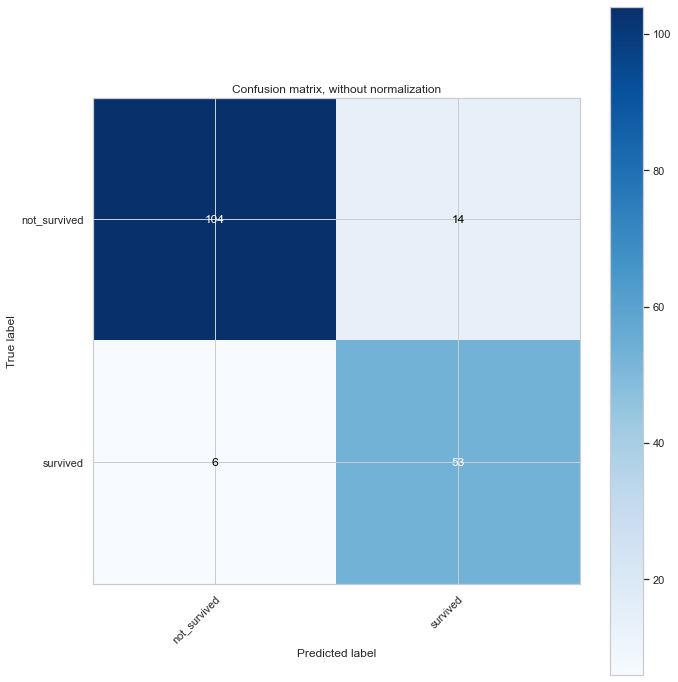

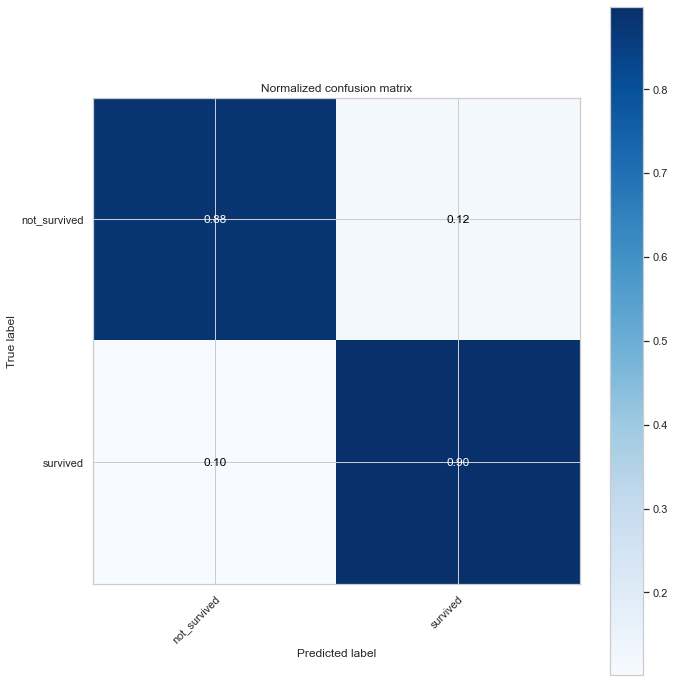

In [112]:
from sklearn.utils.multiclass import unique_labels
from sklearn.metrics import confusion_matrix
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
Y_pred=TitanicSVM.predict(X_test)
def plot_confusion_matrix(Y_test,Y_pred, classes,
                          normalize=False,
                          title=None,
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if not title:
        if normalize:
            title = 'Normalized confusion matrix'
        else:
            title = 'Confusion matrix, without normalization'

    # Compute confusion matrix
    cm = confusion_matrix(Y_test,Y_pred)
    # Only use the labels that appear in the data
    classes = classes[unique_labels(Y_test,Y_pred)]
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    print(cm)

    fig, ax = plt.subplots()
    im = ax.imshow(cm, interpolation='nearest', cmap=cmap)
    ax.figure.colorbar(im, ax=ax)
    # We want to show all ticks...
    ax.set(xticks=np.arange(cm.shape[1]),
           yticks=np.arange(cm.shape[0]),
           # ... and label them with the respective list entries
           xticklabels=classes, yticklabels=classes,
           title=title,
           ylabel='True label',
           xlabel='Predicted label')

    # Rotate the tick labels and set their alignment.
    plt.setp(ax.get_xticklabels(), rotation=45, ha="right",
             rotation_mode="anchor")

    # Loop over data dimensions and create text annotations.
    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            ax.text(j, i, format(cm[i, j], fmt),
                    ha="center", va="center",
                    color="white" if cm[i, j] > thresh else "black")
    fig.tight_layout()
    return ax


np.set_printoptions(precision=2)

class_names = np.array(['not_survived','survived'])

# Plot non-normalized confusion matrix
plot_confusion_matrix(Y_test,Y_pred, classes=class_names,
                      title='Confusion matrix, without normalization')

# Plot normalized confusion matrix
plot_confusion_matrix(Y_test,Y_pred, classes=class_names, normalize=True,
                      title='Normalized confusion matrix')

plt.show()

# SVM ROC Curve for Titanic

0.8870295891985063


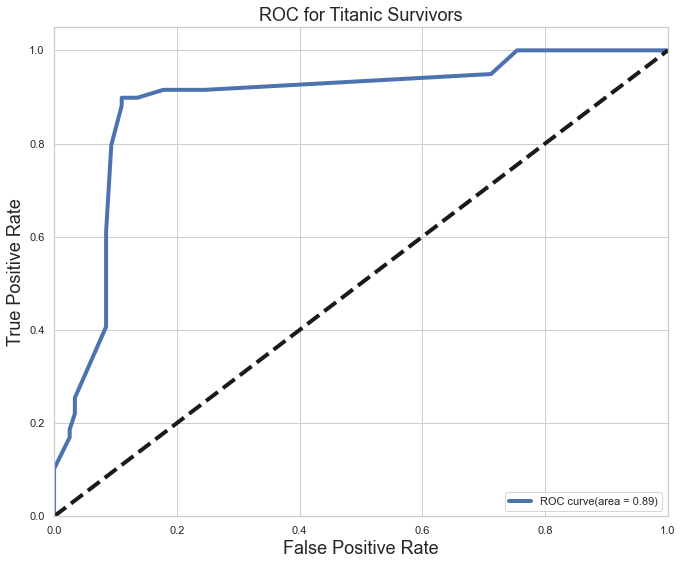

In [113]:
from sklearn.metrics import roc_curve, auc
#plt.style.use('seaborn-pastel')
Y_score = TitanicSVM.decision_function(X_test)

FPR, TPR, _ = roc_curve(Y_test, Y_score)
ROC_AUC = auc(FPR, TPR)
print (ROC_AUC)

plt.figure(figsize =[11,9])
plt.plot(FPR, TPR, label= 'ROC curve(area = %0.2f)'%ROC_AUC, linewidth= 4)
plt.plot([0,1],[0,1], 'k--', linewidth = 4)
plt.xlim([0.0,1.0])
plt.ylim([0.0,1.05])
plt.xlabel('False Positive Rate', fontsize = 18)
plt.ylabel('True Positive Rate', fontsize = 18)
plt.title('ROC for Titanic Survivors', fontsize= 18)
plt.legend(loc="lower right")
plt.show()

# SVM Precision Recall Curve for Titanic

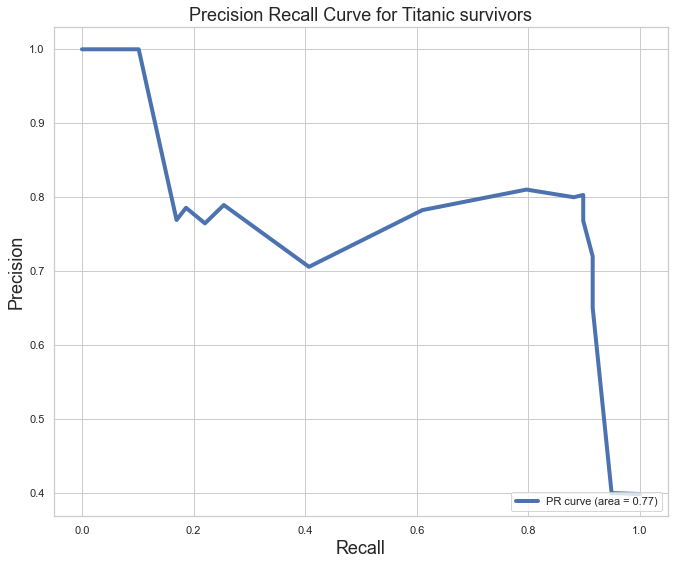

In [114]:
from sklearn.metrics import precision_recall_curve

Y_score = TitanicSVM.decision_function(X_test)

precision, recall, _ = precision_recall_curve(Y_test, Y_score)
PR_AUC = auc(recall, precision)

plt.figure(figsize=[11,9])
plt.plot(recall, precision, label='PR curve (area = %0.2f)' % PR_AUC, linewidth=4)
plt.xlabel('Recall', fontsize=18)
plt.ylabel('Precision', fontsize=18)
plt.title('Precision Recall Curve for Titanic survivors', fontsize=18)
plt.legend(loc="lower right")
plt.show()

# Support Vector Machine Tuning

In [115]:
## Using StratifiedShuffleSplit No of Splits always should be 5 for 80% Train & 20% Test Split Pattern
## Always give test_size=.20
## We can use KFold, StratifiedShuffleSplit, StratiriedKFold or ShuffleSplit, They are all close cousins. look at sklearn userguide for more info.   
from sklearn.model_selection import StratifiedShuffleSplit, cross_val_score
cv = StratifiedShuffleSplit(n_splits = 5, test_size=.20, random_state=15) # run model 10x with 60/30 split intentionally leaving out 10%
accuracies = cross_val_score(svm.SVC(), Features, Label, cv = cv)
print ("Cross-Validation accuracy scores:{}".format(accuracies))
print ("Mean Cross-Validation accuracy score: {}".format(round(accuracies.mean(),5)))

Cross-Validation accuracy scores:[0.88 0.88 0.83 0.82 0.84]
Mean Cross-Validation accuracy score: 0.84859


In [116]:
## Using StratifiedShuffleSplit No of Splits always should be 5 for 80% Train & 20% Test Split Pattern
## We can use KFold, StratifiedShuffleSplit, StratiriedKFold or ShuffleSplit, They are all close cousins. look at sklearn userguide for more info.   
from sklearn.model_selection import StratifiedKFold, cross_val_score
cv = StratifiedKFold(n_splits = 5, shuffle=True, random_state=15) # run model 10x with 60/30 split intentionally leaving out 10%
accuracies = cross_val_score(svm.SVC(), Features, Label, cv = cv)
print ("Cross-Validation accuracy scores:{}".format(accuracies))
print ("Mean Cross-Validation accuracy score: {}".format(round(accuracies.mean(),5)))

Cross-Validation accuracy scores:[0.8  0.84 0.8  0.84 0.82]
Mean Cross-Validation accuracy score: 0.82127


In [117]:
from sklearn.model_selection import GridSearchCV
#Cs = [0.001, 0.01, 0.1, 1,1.5,2,2.5,3,4,5,10]  ## penalty parameter C for the error term.
Cs = [999999, 500000, 90, 50, 30, 25, 20, 15, 10, 5, 4, 3, 2.5, 2, 1.5, 1, 0.1, 0.01, 0.001, 0.0001]
#gammas = [0.0001,0.001, 0.01, 0.1, 1]
gammas = [2, 1.9, 1.8, 1.7, 1.6, 1.5, 1, 0.1, 0.01, 0.001, 0.0001]
param_grid = {'C': Cs, 'gamma' : gammas}
cv = StratifiedShuffleSplit(n_splits=5, test_size=.20, random_state=15)
TitanicSVM = GridSearchCV(svm.SVC(kernel = 'rbf', probability=True), param_grid, cv=cv) ## 'rbf' stands for gaussian kernel
TitanicSVM.fit(X_train,Y_train)

GridSearchCV(cv=StratifiedShuffleSplit(n_splits=5, random_state=15, test_size=0.2,
            train_size=None),
             estimator=SVC(probability=True),
             param_grid={'C': [999999, 500000, 90, 50, 30, 25, 20, 15, 10, 5, 4,
                               3, 2.5, 2, 1.5, 1, 0.1, 0.01, 0.001, 0.0001],
                         'gamma': [2, 1.9, 1.8, 1.7, 1.6, 1.5, 1, 0.1, 0.01,
                                   0.001, 0.0001]})

In [118]:
print(TitanicSVM.best_score_)
print(TitanicSVM.best_params_)
print(TitanicSVM.best_estimator_)

0.8070422535211266
{'C': 999999, 'gamma': 1.6}
SVC(C=999999, gamma=1.6, probability=True)


In [119]:
# using the best found hyper paremeters to get the score. 
TitanicSVM = TitanicSVM.best_estimator_
TitanicSVM.score(X_test,Y_test)

0.8870056497175142

In [120]:
from sklearn.metrics import classification_report, confusion_matrix
# printing confision matrix
DataFrame(confusion_matrix(Y_test,TitanicSVM.predict(X_test)),\
            columns=["Predicted Not-Survived", "Predicted Survived"],\
            index=["Not-Survived","Survived"] )

,Predicted Not-Survived,Predicted Survived
Not-Survived,104,14
Survived,6,53


# SVM Tuning Result (recall_score, precision_score, classification_report)

In [121]:
recall_score(Y_test,TitanicSVM.predict(X_test))

0.8983050847457628

In [122]:
precision_score(Y_test,TitanicSVM.predict(X_test))

0.7910447761194029

In [123]:
print(classification_report(Y_test,TitanicSVM.predict(X_test)))

              precision    recall  f1-score   support

           0       0.95      0.88      0.91       118
           1       0.79      0.90      0.84        59

    accuracy                           0.89       177
   macro avg       0.87      0.89      0.88       177
weighted avg       0.89      0.89      0.89       177



# Decision Tree

In [127]:
# For loop to check ideal sample that will give generalized model
#Test1
from sklearn.tree import DecisionTreeClassifier

for i in range(1,1000):
    X_train,X_test,Y_train,Y_test = train_test_split(Features, Label, test_size=0.20, random_state=i)
    
    TitanicTree=DecisionTreeClassifier()
    
    TitanicTree.fit(X_train,Y_train)
    
    train_score=TitanicTree.score(X_train,Y_train)
    
    test_score=TitanicTree.score(X_test,Y_test)
    
    if test_score > train_score:
        print("Test: {} Train: {} RandomState: {}".format(test_score,train_score,i))

Test: 0.8870056497175142 Train: 0.8132956152758133 RandomState: 3
Test: 0.8248587570621468 Train: 0.8246110325318247 RandomState: 4
Test: 0.8305084745762712 Train: 0.8274398868458275 RandomState: 5
Test: 0.8361581920903954 Train: 0.826025459688826 RandomState: 8
Test: 0.8587570621468926 Train: 0.8161244695898161 RandomState: 10
Test: 0.864406779661017 Train: 0.8189533239038189 RandomState: 12
Test: 0.8813559322033898 Train: 0.8147100424328148 RandomState: 14
Test: 0.8870056497175142 Train: 0.8132956152758133 RandomState: 15
Test: 0.847457627118644 Train: 0.8231966053748232 RandomState: 18
Test: 0.8418079096045198 Train: 0.8246110325318247 RandomState: 19
Test: 0.8418079096045198 Train: 0.8246110325318247 RandomState: 20
Test: 0.8305084745762712 Train: 0.8274398868458275 RandomState: 21
Test: 0.847457627118644 Train: 0.8231966053748232 RandomState: 23
Test: 0.864406779661017 Train: 0.8189533239038189 RandomState: 28
Test: 0.8305084745762712 Train: 0.8274398868458275 RandomState: 32
Test

Test: 0.8700564971751412 Train: 0.8175388967468176 RandomState: 267
Test: 0.8305084745762712 Train: 0.8274398868458275 RandomState: 270
Test: 0.8361581920903954 Train: 0.826025459688826 RandomState: 271
Test: 0.864406779661017 Train: 0.8189533239038189 RandomState: 272
Test: 0.8361581920903954 Train: 0.826025459688826 RandomState: 273
Test: 0.847457627118644 Train: 0.8231966053748232 RandomState: 275
Test: 0.8418079096045198 Train: 0.8246110325318247 RandomState: 277
Test: 0.8361581920903954 Train: 0.826025459688826 RandomState: 278
Test: 0.8305084745762712 Train: 0.8274398868458275 RandomState: 280
Test: 0.8700564971751412 Train: 0.8175388967468176 RandomState: 283
Test: 0.8587570621468926 Train: 0.8203677510608204 RandomState: 285
Test: 0.864406779661017 Train: 0.8189533239038189 RandomState: 287
Test: 0.8305084745762712 Train: 0.8274398868458275 RandomState: 290
Test: 0.8418079096045198 Train: 0.8246110325318247 RandomState: 292
Test: 0.8305084745762712 Train: 0.8274398868458275 Ran

Test: 0.8418079096045198 Train: 0.8203677510608204 RandomState: 507
Test: 0.8361581920903954 Train: 0.826025459688826 RandomState: 510
Test: 0.8361581920903954 Train: 0.826025459688826 RandomState: 512
Test: 0.847457627118644 Train: 0.8231966053748232 RandomState: 514
Test: 0.8305084745762712 Train: 0.8274398868458275 RandomState: 517
Test: 0.8418079096045198 Train: 0.8246110325318247 RandomState: 521
Test: 0.8587570621468926 Train: 0.8203677510608204 RandomState: 523
Test: 0.8361581920903954 Train: 0.826025459688826 RandomState: 524
Test: 0.8418079096045198 Train: 0.8246110325318247 RandomState: 525
Test: 0.8305084745762712 Train: 0.8274398868458275 RandomState: 526
Test: 0.864406779661017 Train: 0.8189533239038189 RandomState: 528
Test: 0.8305084745762712 Train: 0.8274398868458275 RandomState: 532
Test: 0.8531073446327684 Train: 0.8217821782178217 RandomState: 534
Test: 0.8361581920903954 Train: 0.826025459688826 RandomState: 535
Test: 0.8361581920903954 Train: 0.826025459688826 Rand

Test: 0.8531073446327684 Train: 0.8217821782178217 RandomState: 762
Test: 0.8700564971751412 Train: 0.8175388967468176 RandomState: 763
Test: 0.864406779661017 Train: 0.8189533239038189 RandomState: 770
Test: 0.8757062146892656 Train: 0.8161244695898161 RandomState: 771
Test: 0.8305084745762712 Train: 0.8274398868458275 RandomState: 772
Test: 0.8418079096045198 Train: 0.8246110325318247 RandomState: 773
Test: 0.8418079096045198 Train: 0.8246110325318247 RandomState: 774
Test: 0.8361581920903954 Train: 0.826025459688826 RandomState: 777
Test: 0.8361581920903954 Train: 0.826025459688826 RandomState: 778
Test: 0.8418079096045198 Train: 0.8246110325318247 RandomState: 780
Test: 0.8418079096045198 Train: 0.8246110325318247 RandomState: 782
Test: 0.8361581920903954 Train: 0.826025459688826 RandomState: 786
Test: 0.8418079096045198 Train: 0.8246110325318247 RandomState: 787
Test: 0.847457627118644 Train: 0.8231966053748232 RandomState: 790
Test: 0.8305084745762712 Train: 0.8274398868458275 Ra

In [128]:
#Train Test Split, 80% Training Data & 20% Testing Data
from sklearn.model_selection import train_test_split
X_train, X_test, Y_train, Y_test = train_test_split(Features,Label,test_size=0.2,random_state=967)
TitanicTree.fit(X_train,Y_train)

DecisionTreeClassifier()

# Decision Tree Result (classification_report, confusion_matrix, recall_score, precision_score)

In [129]:
TitanicTree.score(X_train,Y_train) # Accuracy Score Upon Training Data 81.18 %

0.8118811881188119

In [130]:
TitanicTree.score(X_test,Y_test) # Accuracy Score Upon Testing Data 89.26 %

0.8926553672316384

In [131]:
from sklearn.metrics import classification_report, confusion_matrix
# printing confision matrix
DataFrame(confusion_matrix(Y_test,TitanicTree.predict(X_test)),\
            columns=["Predicted Not-Survived", "Predicted Survived"],\
            index=["Not-Survived","Survived"] )

,Predicted Not-Survived,Predicted Survived
Not-Survived,99,7
Survived,12,59


In [132]:
recall_score(Y_test,TitanicTree.predict(X_test))

0.8309859154929577

In [133]:
precision_score(Y_test,TitanicTree.predict(X_test))

0.8939393939393939

In [134]:
print(classification_report(Y_test,TitanicTree.predict(X_test)))

              precision    recall  f1-score   support

           0       0.89      0.93      0.91       106
           1       0.89      0.83      0.86        71

    accuracy                           0.89       177
   macro avg       0.89      0.88      0.89       177
weighted avg       0.89      0.89      0.89       177



# Visualizing Decision Tree

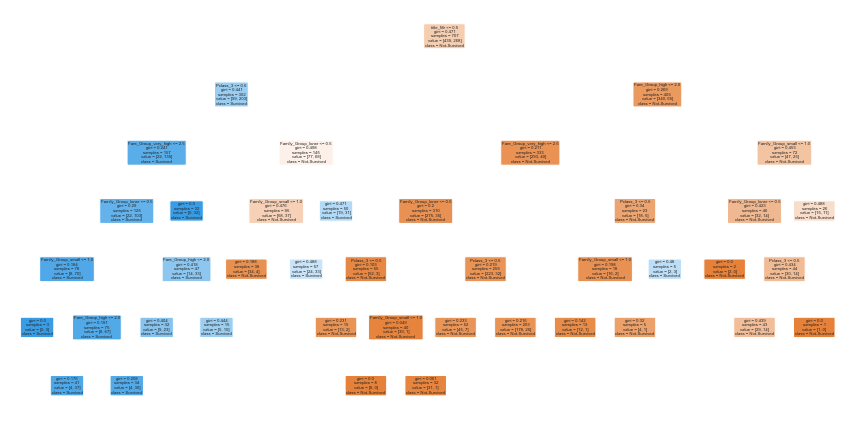

In [135]:
# Visualizing and Plotting the TitanicTree Decision Tree
from sklearn import tree
from sklearn.tree import plot_tree
figure(figsize=(15,7.5))
tree.plot_tree(TitanicTree,
          filled=True,
          rounded=True,
          class_names=["Not-Survived", "Survived"],
          feature_names=Features.columns);

# Decision Tree Tuning

In [136]:
# DecisionTreeClassifier(class_weight=None, criterion=’gini’, max_depth=None,
#                                     max_features=None, max_leaf_nodes=None,
#                                     min_impurity_split=1e-07, min_samples_leaf=1,
#                                     min_samples_split=2, min_weight_fraction_leaf=0.0,
#                                     presort=False, random_state=None, splitter=’best’)

## Using StratifiedShuffleSplit No of Splits always should be 5 for 80% Train & 20% Test Split Pattern
## Always Provide test_size=.20
## We can use KFold, StratifiedShuffleSplit, StratiriedKFold or ShuffleSplit, They are all close cousins. look at sklearn userguide for more info.   
from sklearn.model_selection import StratifiedShuffleSplit, cross_val_score
cv = StratifiedShuffleSplit(n_splits = 5, test_size=.20, random_state=967) # run model 10x with 60/30 split intentionally leaving out 10%
accuracies = cross_val_score(DecisionTreeClassifier(), Features, Label, cv = cv)
print ("Cross-Validation accuracy scores:{}".format(accuracies))
print ("Mean Cross-Validation accuracy score: {}".format(round(accuracies.mean(),5)))

Cross-Validation accuracy scores:[0.84 0.81 0.86 0.82 0.85]
Mean Cross-Validation accuracy score: 0.83616


In [137]:
## Using StratifiedShuffleSplit No of Splits always should be 5 for 80% Train & 20% Test Split Pattern
## We can use KFold, StratifiedShuffleSplit, StratiriedKFold or ShuffleSplit, They are all close cousins. look at sklearn userguide for more info.   
from sklearn.model_selection import StratifiedKFold, cross_val_score
cv = StratifiedKFold(n_splits = 5, shuffle=True, random_state=967) # run model 10x with 60/30 split intentionally leaving out 10%
accuracies = cross_val_score(DecisionTreeClassifier(), Features, Label, cv = cv)
print ("Cross-Validation accuracy scores:{}".format(accuracies))
print ("Mean Cross-Validation accuracy score: {}".format(round(accuracies.mean(),5)))

Cross-Validation accuracy scores:[0.82 0.84 0.8  0.84 0.84]
Mean Cross-Validation accuracy score: 0.82806


In [143]:
## setting param for param_grid in GridSearchCV.
msl = [1,2,3,4,5,6,7,8,9,10]
Criterion = ["gini","entropy"]
Param = {"min_samples_leaf":msl,"criterion":Criterion}
cv = StratifiedShuffleSplit(n_splits = 5, test_size=0.20, random_state=967)


# logreg = LogisticRegression(solver='liblinear', class_weight='balanced')
## Calling on GridSearchCV object. 
TitanicTree = GridSearchCV(estimator=DecisionTreeClassifier(), 
                           param_grid = Param,
                           scoring = 'accuracy',
                            n_jobs =-1,
                           cv = cv)
## Fitting the model
TitanicTree.fit(X_train, Y_train)

GridSearchCV(cv=StratifiedShuffleSplit(n_splits=5, random_state=967, test_size=0.2,
            train_size=None),
             estimator=DecisionTreeClassifier(), n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy'],
                         'min_samples_leaf': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]},
             scoring='accuracy')

In [144]:
print(TitanicTree.best_score_)
print(TitanicTree.best_params_)
print(TitanicTree.best_estimator_)

0.7971830985915493
{'criterion': 'gini', 'min_samples_leaf': 5}
DecisionTreeClassifier(min_samples_leaf=5)


In [145]:
# For loop to check ideal sample that will give generalized model
#Test1
from sklearn.tree import DecisionTreeClassifier

for i in range(1,1000):
    X_train,X_test,Y_train,Y_test = train_test_split(Features, Label, test_size=0.20, random_state=i)
    
    TitanicTree=DecisionTreeClassifier(min_samples_leaf=5)
    
    TitanicTree.fit(X_train,Y_train)
    
    train_score=TitanicTree.score(X_train,Y_train)
    
    test_score=TitanicTree.score(X_test,Y_test)
    
    if test_score > train_score:
        print("Test: {} Train: {} RandomState: {}".format(test_score,train_score,i))

Test: 0.8870056497175142 Train: 0.8132956152758133 RandomState: 3
Test: 0.8248587570621468 Train: 0.8246110325318247 RandomState: 4
Test: 0.8305084745762712 Train: 0.8274398868458275 RandomState: 5
Test: 0.8361581920903954 Train: 0.826025459688826 RandomState: 8
Test: 0.8587570621468926 Train: 0.8161244695898161 RandomState: 10
Test: 0.864406779661017 Train: 0.8189533239038189 RandomState: 12
Test: 0.8813559322033898 Train: 0.8147100424328148 RandomState: 14
Test: 0.8870056497175142 Train: 0.8132956152758133 RandomState: 15
Test: 0.847457627118644 Train: 0.8231966053748232 RandomState: 18
Test: 0.8418079096045198 Train: 0.8246110325318247 RandomState: 19
Test: 0.8418079096045198 Train: 0.8246110325318247 RandomState: 20
Test: 0.8305084745762712 Train: 0.8274398868458275 RandomState: 21
Test: 0.8418079096045198 Train: 0.8203677510608204 RandomState: 23
Test: 0.864406779661017 Train: 0.8189533239038189 RandomState: 28
Test: 0.8248587570621468 Train: 0.8246110325318247 RandomState: 32
Tes

Test: 0.8305084745762712 Train: 0.8274398868458275 RandomState: 270
Test: 0.8361581920903954 Train: 0.826025459688826 RandomState: 271
Test: 0.864406779661017 Train: 0.8189533239038189 RandomState: 272
Test: 0.8361581920903954 Train: 0.826025459688826 RandomState: 273
Test: 0.847457627118644 Train: 0.8231966053748232 RandomState: 275
Test: 0.847457627118644 Train: 0.8189533239038189 RandomState: 277
Test: 0.8361581920903954 Train: 0.826025459688826 RandomState: 278
Test: 0.8305084745762712 Train: 0.8274398868458275 RandomState: 280
Test: 0.8700564971751412 Train: 0.8175388967468176 RandomState: 283
Test: 0.8531073446327684 Train: 0.8175388967468176 RandomState: 285
Test: 0.864406779661017 Train: 0.8189533239038189 RandomState: 287
Test: 0.8305084745762712 Train: 0.8274398868458275 RandomState: 290
Test: 0.8418079096045198 Train: 0.8246110325318247 RandomState: 292
Test: 0.8248587570621468 Train: 0.8246110325318247 RandomState: 293
Test: 0.8361581920903954 Train: 0.826025459688826 Rando

Test: 0.8305084745762712 Train: 0.8274398868458275 RandomState: 526
Test: 0.864406779661017 Train: 0.8189533239038189 RandomState: 528
Test: 0.8305084745762712 Train: 0.8274398868458275 RandomState: 532
Test: 0.8531073446327684 Train: 0.8217821782178217 RandomState: 534
Test: 0.8361581920903954 Train: 0.826025459688826 RandomState: 535
Test: 0.8361581920903954 Train: 0.826025459688826 RandomState: 536
Test: 0.8418079096045198 Train: 0.8203677510608204 RandomState: 537
Test: 0.8587570621468926 Train: 0.8203677510608204 RandomState: 540
Test: 0.864406779661017 Train: 0.8189533239038189 RandomState: 541
Test: 0.8700564971751412 Train: 0.8175388967468176 RandomState: 544
Test: 0.847457627118644 Train: 0.8231966053748232 RandomState: 548
Test: 0.8418079096045198 Train: 0.8203677510608204 RandomState: 549
Test: 0.8418079096045198 Train: 0.8246110325318247 RandomState: 551
Test: 0.8305084745762712 Train: 0.8274398868458275 RandomState: 553
Test: 0.8587570621468926 Train: 0.8203677510608204 Ra

In [146]:
#Train Test Split, 80% Training Data & 20% Testing Data
from sklearn.model_selection import train_test_split
X_train, X_test, Y_train, Y_test = train_test_split(Features,Label,test_size=0.2,random_state=967)
TitanicTree.fit(X_train,Y_train)

DecisionTreeClassifier(min_samples_leaf=5)

In [147]:
TitanicTree.score(X_train,Y_train) # Accuracy Score Upon Training Data 81.18 %

0.8118811881188119

In [148]:
TitanicTree.score(X_test,Y_test) # Accuracy Score Upon Testing Data 89.26 %

0.8926553672316384

In [149]:
from sklearn.metrics import classification_report, confusion_matrix
# printing confision matrix
DataFrame(confusion_matrix(Y_test,TitanicTree.predict(X_test)),\
            columns=["Predicted Not-Survived", "Predicted Survived"],\
            index=["Not-Survived","Survived"] )

,Predicted Not-Survived,Predicted Survived
Not-Survived,99,7
Survived,12,59


In [150]:
recall_score(Y_test,TitanicTree.predict(X_test))

0.8309859154929577

In [151]:
precision_score(Y_test,TitanicTree.predict(X_test))

0.8939393939393939

In [152]:
print(classification_report(Y_test,TitanicTree.predict(X_test)))

              precision    recall  f1-score   support

           0       0.89      0.93      0.91       106
           1       0.89      0.83      0.86        71

    accuracy                           0.89       177
   macro avg       0.89      0.88      0.89       177
weighted avg       0.89      0.89      0.89       177



# Random Forest

In [164]:
# An ensemble of randomized decision trees is known as a random forest.
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import BaggingClassifier
X_train, X_test, Y_train, Y_test = train_test_split(Features,Label,test_size=0.2,random_state=967)
TitanicTree = DecisionTreeClassifier()
TitanicForest = BaggingClassifier(TitanicTree, n_estimators=200, max_samples=0.8,
                        random_state=967)

TitanicForest.fit(X_train, Y_train)

BaggingClassifier(base_estimator=DecisionTreeClassifier(), max_samples=0.8,
                  n_estimators=200, random_state=967)

In [165]:
TitanicForest.score(X_train,Y_train) # Accuracy Score Upon Training Data 81.18 %

0.8118811881188119

In [166]:
TitanicForest.score(X_test,Y_test) # Accuracy Score Upon Testing Data 89.26 %

0.8926553672316384

In [167]:
from sklearn.metrics import classification_report, confusion_matrix
# printing confision matrix
DataFrame(confusion_matrix(Y_test,TitanicForest.predict(X_test)),\
            columns=["Predicted Not-Survived", "Predicted Survived"],\
            index=["Not-Survived","Survived"] )

,Predicted Not-Survived,Predicted Survived
Not-Survived,99,7
Survived,12,59


In [168]:
# Visualizing Random State of Each Tree
TitanicForest.estimators_, len(TitanicForest.estimators_)

([DecisionTreeClassifier(random_state=1616434271),
  DecisionTreeClassifier(random_state=1784513460),
  DecisionTreeClassifier(random_state=248471775),
  DecisionTreeClassifier(random_state=1913926309),
  DecisionTreeClassifier(random_state=408937553),
  DecisionTreeClassifier(random_state=397199554),
  DecisionTreeClassifier(random_state=947637244),
  DecisionTreeClassifier(random_state=441017548),
  DecisionTreeClassifier(random_state=1412353405),
  DecisionTreeClassifier(random_state=1753250267),
  DecisionTreeClassifier(random_state=1153075876),
  DecisionTreeClassifier(random_state=789736291),
  DecisionTreeClassifier(random_state=275453984),
  DecisionTreeClassifier(random_state=1815377127),
  DecisionTreeClassifier(random_state=1072403920),
  DecisionTreeClassifier(random_state=1898580511),
  DecisionTreeClassifier(random_state=1002435812),
  DecisionTreeClassifier(random_state=2125462643),
  DecisionTreeClassifier(random_state=16271071),
  DecisionTreeClassifier(random_state=15

# Visualizing Random Forest Tree

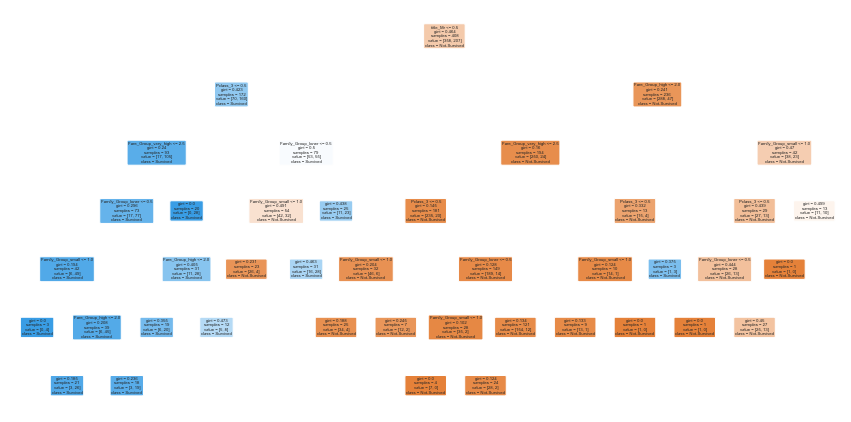

In [169]:
# Visualizing the 4th Tree of the Random Forest
figure(figsize=(15,7.5))
tree.plot_tree(TitanicForest.estimators_[3],
          filled=True,
          rounded=True,
          class_names=["Not-Survived", "Survived"],
          feature_names=Features.columns);

In [170]:
# Visualizing Random Forest Diagram
for i in range(len(TitanicForest.estimators_)):
      print(tree.export_text(TitanicForest.estimators_[i]))

|--- feature_5 <= 0.50
|   |--- feature_0 <= 0.50
|   |   |--- feature_1 <= 0.50
|   |   |   |--- feature_3 <= 2.00
|   |   |   |   |--- feature_4 <= 2.50
|   |   |   |   |   |--- class: 1
|   |   |   |   |--- feature_4 >  2.50
|   |   |   |   |   |--- class: 1
|   |   |   |--- feature_3 >  2.00
|   |   |   |   |--- feature_2 <= 1.00
|   |   |   |   |   |--- class: 1
|   |   |   |   |--- feature_2 >  1.00
|   |   |   |   |   |--- class: 1
|   |   |--- feature_1 >  0.50
|   |   |   |--- feature_4 <= 2.50
|   |   |   |   |--- feature_3 <= 2.00
|   |   |   |   |   |--- class: 1
|   |   |   |   |--- feature_3 >  2.00
|   |   |   |   |   |--- class: 1
|   |   |   |--- feature_4 >  2.50
|   |   |   |   |--- class: 1
|   |--- feature_0 >  0.50
|   |   |--- feature_1 <= 0.50
|   |   |   |--- feature_2 <= 1.00
|   |   |   |   |--- class: 0
|   |   |   |--- feature_2 >  1.00
|   |   |   |   |--- class: 1
|   |   |--- feature_1 >  0.50
|   |   |   |--- class: 1
|--- feature_5 >  0.50
|   |--- fea


|--- feature_5 <= 0.50
|   |--- feature_0 <= 0.50
|   |   |--- feature_4 <= 2.50
|   |   |   |--- feature_1 <= 0.50
|   |   |   |   |--- feature_3 <= 2.00
|   |   |   |   |   |--- feature_2 <= 1.00
|   |   |   |   |   |   |--- class: 1
|   |   |   |   |   |--- feature_2 >  1.00
|   |   |   |   |   |   |--- class: 1
|   |   |   |   |--- feature_3 >  2.00
|   |   |   |   |   |--- feature_2 <= 1.00
|   |   |   |   |   |   |--- class: 1
|   |   |   |   |   |--- feature_2 >  1.00
|   |   |   |   |   |   |--- class: 1
|   |   |   |--- feature_1 >  0.50
|   |   |   |   |--- feature_3 <= 2.00
|   |   |   |   |   |--- class: 1
|   |   |   |   |--- feature_3 >  2.00
|   |   |   |   |   |--- class: 0
|   |   |--- feature_4 >  2.50
|   |   |   |--- class: 1
|   |--- feature_0 >  0.50
|   |   |--- feature_1 <= 0.50
|   |   |   |--- feature_2 <= 1.00
|   |   |   |   |--- class: 0
|   |   |   |--- feature_2 >  1.00
|   |   |   |   |--- class: 0
|   |   |--- feature_1 >  0.50
|   |   |   |--- class: 

# ADA-Boost Forest/Stumps Forest Classifier

In [171]:
# For loop to check ideal sample that will give generalized model
#Test1
from sklearn.ensemble import AdaBoostClassifier
# Learning rate shrinks the contribution of each classifier by learning_rate.
# There is a trade-off between learning_rate and n_estimators.
for i in range(1,1000):
    X_train,X_test,Y_train,Y_test = train_test_split(Features, Label, test_size=0.20, random_state=i)
    
    TitanicAdaB=AdaBoostClassifier(n_estimators=50, learning_rate=1)
    
    TitanicAdaB.fit(X_train,Y_train)
    
    train_score=TitanicAdaB.score(X_train,Y_train)
    
    test_score=TitanicAdaB.score(X_test,Y_test)
    
    if test_score > train_score:
        print("Test: {} Train: {} RandomState: {}".format(test_score,train_score,i))

Test: 0.8813559322033898 Train: 0.801980198019802 RandomState: 3
Test: 0.8248587570621468 Train: 0.8161244695898161 RandomState: 4
Test: 0.8248587570621468 Train: 0.8189533239038189 RandomState: 5
Test: 0.8248587570621468 Train: 0.8161244695898161 RandomState: 8
Test: 0.847457627118644 Train: 0.8104667609618105 RandomState: 10
Test: 0.847457627118644 Train: 0.8132956152758133 RandomState: 12
Test: 0.864406779661017 Train: 0.8033946251768034 RandomState: 14
Test: 0.8587570621468926 Train: 0.7864214992927864 RandomState: 15
Test: 0.8531073446327684 Train: 0.8062234794908062 RandomState: 18
Test: 0.8305084745762712 Train: 0.8118811881188119 RandomState: 19
Test: 0.8418079096045198 Train: 0.8118811881188119 RandomState: 20
Test: 0.8022598870056498 Train: 0.8005657708628006 RandomState: 21
Test: 0.8305084745762712 Train: 0.8118811881188119 RandomState: 23
Test: 0.847457627118644 Train: 0.8076379066478077 RandomState: 28
Test: 0.8192090395480226 Train: 0.8175388967468176 RandomState: 33
Test

Test: 0.8192090395480226 Train: 0.7963224893917963 RandomState: 283
Test: 0.847457627118644 Train: 0.8076379066478077 RandomState: 285
Test: 0.8361581920903954 Train: 0.8132956152758133 RandomState: 287
Test: 0.8192090395480226 Train: 0.8147100424328148 RandomState: 292
Test: 0.8022598870056498 Train: 0.8005657708628006 RandomState: 294
Test: 0.8418079096045198 Train: 0.8147100424328148 RandomState: 297
Test: 0.8248587570621468 Train: 0.8189533239038189 RandomState: 299
Test: 0.847457627118644 Train: 0.8076379066478077 RandomState: 301
Test: 0.8022598870056498 Train: 0.8005657708628006 RandomState: 302
Test: 0.8192090395480226 Train: 0.8147100424328148 RandomState: 304
Test: 0.8192090395480226 Train: 0.8147100424328148 RandomState: 305
Test: 0.8587570621468926 Train: 0.8104667609618105 RandomState: 307
Test: 0.8192090395480226 Train: 0.8147100424328148 RandomState: 308
Test: 0.8418079096045198 Train: 0.8147100424328148 RandomState: 314
Test: 0.847457627118644 Train: 0.8076379066478077 

Test: 0.8587570621468926 Train: 0.7892503536067893 RandomState: 562
Test: 0.8305084745762712 Train: 0.8175388967468176 RandomState: 566
Test: 0.8361581920903954 Train: 0.8104667609618105 RandomState: 568
Test: 0.8757062146892656 Train: 0.8005657708628006 RandomState: 570
Test: 0.8305084745762712 Train: 0.8118811881188119 RandomState: 571
Test: 0.8361581920903954 Train: 0.7920792079207921 RandomState: 573
Test: 0.8700564971751412 Train: 0.8076379066478077 RandomState: 574
Test: 0.8248587570621468 Train: 0.8217821782178217 RandomState: 575
Test: 0.8022598870056498 Train: 0.8005657708628006 RandomState: 576
Test: 0.807909604519774 Train: 0.7991513437057991 RandomState: 581
Test: 0.8531073446327684 Train: 0.8118811881188119 RandomState: 582
Test: 0.8022598870056498 Train: 0.8005657708628006 RandomState: 583
Test: 0.847457627118644 Train: 0.8076379066478077 RandomState: 584
Test: 0.8248587570621468 Train: 0.8161244695898161 RandomState: 589
Test: 0.8248587570621468 Train: 0.8189533239038189

Test: 0.8248587570621468 Train: 0.8132956152758133 RandomState: 848
Test: 0.8248587570621468 Train: 0.8132956152758133 RandomState: 853
Test: 0.8757062146892656 Train: 0.8062234794908062 RandomState: 856
Test: 0.8531073446327684 Train: 0.7878359264497878 RandomState: 860
Test: 0.8135593220338984 Train: 0.7977369165487977 RandomState: 865
Test: 0.8361581920903954 Train: 0.8104667609618105 RandomState: 866
Test: 0.8361581920903954 Train: 0.8161244695898161 RandomState: 867
Test: 0.807909604519774 Train: 0.7991513437057991 RandomState: 868
Test: 0.8192090395480226 Train: 0.8147100424328148 RandomState: 873
Test: 0.8418079096045198 Train: 0.809052333804809 RandomState: 874
Test: 0.8022598870056498 Train: 0.8005657708628006 RandomState: 876
Test: 0.8248587570621468 Train: 0.8132956152758133 RandomState: 877
Test: 0.8248587570621468 Train: 0.8132956152758133 RandomState: 879
Test: 0.8192090395480226 Train: 0.8147100424328148 RandomState: 880
Test: 0.8248587570621468 Train: 0.8132956152758133

In [172]:
#Train Test Split, 80% Training Data & 20% Testing Data
from sklearn.model_selection import train_test_split
X_train, X_test, Y_train, Y_test = train_test_split(Features,Label,test_size=0.2,random_state=3)
TitanicAdaB.fit(X_train,Y_train)

AdaBoostClassifier(learning_rate=1)

In [173]:
TitanicAdaB.score(X_train,Y_train) # Accuracy Upon Training Data is 80.19 %

0.801980198019802

In [174]:
TitanicAdaB.score(X_test,Y_test) # Accuracy Upon Testing Data is 88.13 %

0.8813559322033898

In [175]:
from sklearn.metrics import classification_report, confusion_matrix
# printing confision matrix
DataFrame(confusion_matrix(Y_test,TitanicAdaB.predict(X_test)),\
            columns=["Predicted Not-Survived", "Predicted Survived"],\
            index=["Not-Survived","Survived"] )

,Predicted Not-Survived,Predicted Survived
Not-Survived,110,9
Survived,12,46


In [176]:
print(classification_report(Y_test,TitanicAdaB.predict(X_test)))

              precision    recall  f1-score   support

           0       0.90      0.92      0.91       119
           1       0.84      0.79      0.81        58

    accuracy                           0.88       177
   macro avg       0.87      0.86      0.86       177
weighted avg       0.88      0.88      0.88       177



# ADA-Boost Forest/Stumps Forest Classifier Hyperparametre Tuning

In [178]:
## setting param for param_grid in GridSearchCV.
n_estimators = [50, 100, 150, 200, 250, 300, 350, 400]
LearningRate=[0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0]
Algorithm = ["SAMME","SAMME.R"]
Param = {"n_estimators":n_estimators,"learning_rate":LearningRate,"algorithm":Algorithm}
cv = StratifiedShuffleSplit(n_splits = 5, test_size=0.20, random_state=967)


## Calling on GridSearchCV object. 
TitanicAdaB = GridSearchCV(estimator=AdaBoostClassifier(), 
                           param_grid = Param,
                           scoring = 'accuracy',
                            n_jobs =-1,
                           cv = cv)
## Fitting the model
TitanicAdaB.fit(X_train, Y_train)

GridSearchCV(cv=StratifiedShuffleSplit(n_splits=5, random_state=967, test_size=0.2,
            train_size=None),
             estimator=AdaBoostClassifier(), n_jobs=-1,
             param_grid={'algorithm': ['SAMME', 'SAMME.R'],
                         'learning_rate': [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7,
                                           0.8, 0.9, 1.0],
                         'n_estimators': [50, 100, 150, 200, 250, 300, 350,
                                          400]},
             scoring='accuracy')

In [179]:
print(TitanicAdaB.best_score_)
print(TitanicAdaB.best_params_)
print(TitanicAdaB.best_estimator_)

0.7929577464788733
{'algorithm': 'SAMME', 'learning_rate': 0.3, 'n_estimators': 100}
AdaBoostClassifier(algorithm='SAMME', learning_rate=0.3, n_estimators=100)


In [183]:
## setting param for param_grid in GridSearchCV.
n_estimators = [50, 100, 150, 200, 250, 300, 350, 400]
LearningRate=[0.20,0.21,0.22,0.23,0.24,0.25,0.26,0.27,0.28,0.29,0.30]
Algorithm = ["SAMME","SAMME.R"]
Param = {"n_estimators":n_estimators,"learning_rate":LearningRate,"algorithm":Algorithm}
cv = StratifiedShuffleSplit(n_splits = 5, test_size=0.20, random_state=967)


## Calling on GridSearchCV object. 
TitanicAdaB = GridSearchCV(estimator=AdaBoostClassifier(), 
                           param_grid = Param,
                           scoring = 'accuracy',
                            n_jobs =-1,
                           cv = cv)
## Fitting the model
TitanicAdaB.fit(X_train, Y_train)

GridSearchCV(cv=StratifiedShuffleSplit(n_splits=5, random_state=967, test_size=0.2,
            train_size=None),
             estimator=AdaBoostClassifier(), n_jobs=-1,
             param_grid={'algorithm': ['SAMME', 'SAMME.R'],
                         'learning_rate': [0.2, 0.21, 0.22, 0.23, 0.24, 0.25,
                                           0.26, 0.27, 0.28, 0.29, 0.3],
                         'n_estimators': [50, 100, 150, 200, 250, 300, 350,
                                          400]},
             scoring='accuracy')

In [184]:
print(TitanicAdaB.best_score_)
print(TitanicAdaB.best_params_)
print(TitanicAdaB.best_estimator_)

0.7929577464788733
{'algorithm': 'SAMME', 'learning_rate': 0.22, 'n_estimators': 150}
AdaBoostClassifier(algorithm='SAMME', learning_rate=0.22, n_estimators=150)


In [187]:
# For loop to check ideal sample that will give generalized model
#Test1
from sklearn.ensemble import AdaBoostClassifier
# Learning rate shrinks the contribution of each classifier by learning_rate.
# There is a trade-off between learning_rate and n_estimators.
for i in range(1,1000):
    X_train,X_test,Y_train,Y_test = train_test_split(Features, Label, test_size=0.20, random_state=i)
    
    TitanicAdaB=AdaBoostClassifier(n_estimators=150, learning_rate=0.22, algorithm='SAMME')
    
    TitanicAdaB.fit(X_train,Y_train)
    
    train_score=TitanicAdaB.score(X_train,Y_train)
    
    test_score=TitanicAdaB.score(X_test,Y_test)
    
    if test_score > train_score:
        print("Test: {} Train: {} RandomState: {}".format(test_score,train_score,i))

Test: 0.8813559322033898 Train: 0.8048090523338048 RandomState: 3
Test: 0.8248587570621468 Train: 0.8246110325318247 RandomState: 4
Test: 0.8248587570621468 Train: 0.8246110325318247 RandomState: 5
Test: 0.8305084745762712 Train: 0.8231966053748232 RandomState: 8
Test: 0.8587570621468926 Train: 0.8161244695898161 RandomState: 10
Test: 0.8587570621468926 Train: 0.8161244695898161 RandomState: 12
Test: 0.8813559322033898 Train: 0.8104667609618105 RandomState: 14
Test: 0.8813559322033898 Train: 0.8048090523338048 RandomState: 15
Test: 0.8531073446327684 Train: 0.8175388967468176 RandomState: 18
Test: 0.8305084745762712 Train: 0.8175388967468176 RandomState: 19
Test: 0.8418079096045198 Train: 0.8147100424328148 RandomState: 20
Test: 0.8305084745762712 Train: 0.8231966053748232 RandomState: 21
Test: 0.8418079096045198 Train: 0.8203677510608204 RandomState: 23
Test: 0.8248587570621468 Train: 0.8246110325318247 RandomState: 24
Test: 0.8531073446327684 Train: 0.8175388967468176 RandomState: 28

Test: 0.8418079096045198 Train: 0.8203677510608204 RandomState: 248
Test: 0.8587570621468926 Train: 0.8161244695898161 RandomState: 249
Test: 0.8531073446327684 Train: 0.8175388967468176 RandomState: 251
Test: 0.8192090395480226 Train: 0.8175388967468176 RandomState: 252
Test: 0.8531073446327684 Train: 0.8118811881188119 RandomState: 253
Test: 0.8531073446327684 Train: 0.8175388967468176 RandomState: 256
Test: 0.8531073446327684 Train: 0.8118811881188119 RandomState: 259
Test: 0.8248587570621468 Train: 0.8189533239038189 RandomState: 263
Test: 0.8587570621468926 Train: 0.8104667609618105 RandomState: 267
Test: 0.8361581920903954 Train: 0.8217821782178217 RandomState: 270
Test: 0.8361581920903954 Train: 0.8217821782178217 RandomState: 271
Test: 0.8587570621468926 Train: 0.8161244695898161 RandomState: 272
Test: 0.8361581920903954 Train: 0.8161244695898161 RandomState: 273
Test: 0.8418079096045198 Train: 0.8203677510608204 RandomState: 275
Test: 0.847457627118644 Train: 0.818953323903818

Test: 0.8418079096045198 Train: 0.8203677510608204 RandomState: 490
Test: 0.8531073446327684 Train: 0.8118811881188119 RandomState: 497
Test: 0.847457627118644 Train: 0.8189533239038189 RandomState: 498
Test: 0.847457627118644 Train: 0.8132956152758133 RandomState: 504
Test: 0.8361581920903954 Train: 0.8161244695898161 RandomState: 505
Test: 0.8248587570621468 Train: 0.8189533239038189 RandomState: 506
Test: 0.8418079096045198 Train: 0.8203677510608204 RandomState: 507
Test: 0.8361581920903954 Train: 0.8217821782178217 RandomState: 510
Test: 0.8248587570621468 Train: 0.8161244695898161 RandomState: 514
Test: 0.8305084745762712 Train: 0.8175388967468176 RandomState: 517
Test: 0.8248587570621468 Train: 0.8246110325318247 RandomState: 518
Test: 0.8305084745762712 Train: 0.8231966053748232 RandomState: 521
Test: 0.8587570621468926 Train: 0.8161244695898161 RandomState: 523
Test: 0.8305084745762712 Train: 0.8231966053748232 RandomState: 524
Test: 0.8418079096045198 Train: 0.8203677510608204

Test: 0.8361581920903954 Train: 0.8217821782178217 RandomState: 747
Test: 0.8587570621468926 Train: 0.8161244695898161 RandomState: 748
Test: 0.8418079096045198 Train: 0.8203677510608204 RandomState: 749
Test: 0.8305084745762712 Train: 0.8231966053748232 RandomState: 750
Test: 0.8305084745762712 Train: 0.8203677510608204 RandomState: 751
Test: 0.8531073446327684 Train: 0.8175388967468176 RandomState: 754
Test: 0.8305084745762712 Train: 0.8231966053748232 RandomState: 756
Test: 0.8248587570621468 Train: 0.8217821782178217 RandomState: 757
Test: 0.8248587570621468 Train: 0.8246110325318247 RandomState: 760
Test: 0.847457627118644 Train: 0.8189533239038189 RandomState: 762
Test: 0.8700564971751412 Train: 0.8132956152758133 RandomState: 763
Test: 0.847457627118644 Train: 0.8132956152758133 RandomState: 770
Test: 0.8531073446327684 Train: 0.8118811881188119 RandomState: 771
Test: 0.8248587570621468 Train: 0.8189533239038189 RandomState: 772
Test: 0.8361581920903954 Train: 0.8217821782178217

In [188]:
#Train Test Split, 80% Training Data & 20% Testing Data
X_train, X_test, Y_train, Y_test = train_test_split(Features,Label,test_size=0.2,random_state=14)
TitanicAdaB.fit(X_train,Y_train)

AdaBoostClassifier(algorithm='SAMME', learning_rate=0.22, n_estimators=150)

In [189]:
TitanicAdaB.score(X_train,Y_train) # Accuracy Upon Training Data is 81.04 %

0.8104667609618105

In [190]:
TitanicAdaB.score(X_test,Y_test) # Accuracy Upon Testing Data is 88.13 %

0.8813559322033898

In [191]:
from sklearn.metrics import classification_report, confusion_matrix
# printing confision matrix
DataFrame(confusion_matrix(Y_test,TitanicAdaB.predict(X_test)),\
            columns=["Predicted Not-Survived", "Predicted Survived"],\
            index=["Not-Survived","Survived"] )

,Predicted Not-Survived,Predicted Survived
Not-Survived,99,12
Survived,9,57


In [192]:
print(classification_report(Y_test,TitanicAdaB.predict(X_test)))

              precision    recall  f1-score   support

           0       0.92      0.89      0.90       111
           1       0.83      0.86      0.84        66

    accuracy                           0.88       177
   macro avg       0.87      0.88      0.87       177
weighted avg       0.88      0.88      0.88       177



# GradientBoostingClassifier

In [193]:
# For loop to check ideal sample that will give generalized model
#Test1
from sklearn.ensemble import GradientBoostingClassifier
# Learning rate shrinks the contribution of each classifier by learning_rate.
# There is a trade-off between learning_rate and n_estimators.
for i in range(1,1000):
    X_train,X_test,Y_train,Y_test = train_test_split(Features, Label, test_size=0.20, random_state=i)
    
    TitanicGradB1=GradientBoostingClassifier(n_estimators=350, loss='deviance', learning_rate=0.99, max_depth=50)
    
    TitanicGradB1.fit(X_train,Y_train)
    
    train_score=TitanicGradB1.score(X_train,Y_train)
    
    test_score=TitanicGradB1.score(X_test,Y_test)
    
    if test_score > train_score:
        print("Test: {} Train: {} RandomState: {}".format(test_score,train_score,i))

Test: 0.8870056497175142 Train: 0.8132956152758133 RandomState: 3
Test: 0.8248587570621468 Train: 0.8246110325318247 RandomState: 4
Test: 0.8305084745762712 Train: 0.8274398868458275 RandomState: 5
Test: 0.8361581920903954 Train: 0.826025459688826 RandomState: 8
Test: 0.8587570621468926 Train: 0.8161244695898161 RandomState: 10
Test: 0.864406779661017 Train: 0.8189533239038189 RandomState: 12
Test: 0.8813559322033898 Train: 0.8147100424328148 RandomState: 14
Test: 0.8870056497175142 Train: 0.8132956152758133 RandomState: 15
Test: 0.847457627118644 Train: 0.8231966053748232 RandomState: 18
Test: 0.8418079096045198 Train: 0.8246110325318247 RandomState: 19
Test: 0.8418079096045198 Train: 0.8246110325318247 RandomState: 20
Test: 0.8305084745762712 Train: 0.8274398868458275 RandomState: 21
Test: 0.847457627118644 Train: 0.8231966053748232 RandomState: 23
Test: 0.864406779661017 Train: 0.8189533239038189 RandomState: 28
Test: 0.8305084745762712 Train: 0.8274398868458275 RandomState: 32
Test

Test: 0.8587570621468926 Train: 0.8203677510608204 RandomState: 256
Test: 0.8361581920903954 Train: 0.826025459688826 RandomState: 257
Test: 0.864406779661017 Train: 0.8189533239038189 RandomState: 259
Test: 0.8361581920903954 Train: 0.826025459688826 RandomState: 263
Test: 0.8700564971751412 Train: 0.8175388967468176 RandomState: 267
Test: 0.8305084745762712 Train: 0.8274398868458275 RandomState: 270
Test: 0.8361581920903954 Train: 0.826025459688826 RandomState: 271
Test: 0.864406779661017 Train: 0.8189533239038189 RandomState: 272
Test: 0.8361581920903954 Train: 0.826025459688826 RandomState: 273
Test: 0.847457627118644 Train: 0.8231966053748232 RandomState: 275
Test: 0.8418079096045198 Train: 0.8246110325318247 RandomState: 277
Test: 0.8361581920903954 Train: 0.826025459688826 RandomState: 278
Test: 0.8305084745762712 Train: 0.8274398868458275 RandomState: 280
Test: 0.8700564971751412 Train: 0.8175388967468176 RandomState: 283
Test: 0.8587570621468926 Train: 0.8203677510608204 Rando

Test: 0.8361581920903954 Train: 0.826025459688826 RandomState: 503
Test: 0.8700564971751412 Train: 0.8175388967468176 RandomState: 504
Test: 0.8361581920903954 Train: 0.826025459688826 RandomState: 506
Test: 0.8418079096045198 Train: 0.8203677510608204 RandomState: 507
Test: 0.8361581920903954 Train: 0.826025459688826 RandomState: 510
Test: 0.8361581920903954 Train: 0.826025459688826 RandomState: 512
Test: 0.847457627118644 Train: 0.8231966053748232 RandomState: 514
Test: 0.8305084745762712 Train: 0.8274398868458275 RandomState: 517
Test: 0.8418079096045198 Train: 0.8246110325318247 RandomState: 521
Test: 0.8587570621468926 Train: 0.8203677510608204 RandomState: 523
Test: 0.8361581920903954 Train: 0.826025459688826 RandomState: 524
Test: 0.8418079096045198 Train: 0.8246110325318247 RandomState: 525
Test: 0.8305084745762712 Train: 0.8274398868458275 RandomState: 526
Test: 0.864406779661017 Train: 0.8189533239038189 RandomState: 528
Test: 0.8305084745762712 Train: 0.8274398868458275 Rand

Test: 0.8531073446327684 Train: 0.8217821782178217 RandomState: 740
Test: 0.8531073446327684 Train: 0.8217821782178217 RandomState: 741
Test: 0.8418079096045198 Train: 0.8246110325318247 RandomState: 742
Test: 0.8813559322033898 Train: 0.8147100424328148 RandomState: 743
Test: 0.8531073446327684 Train: 0.8217821782178217 RandomState: 744
Test: 0.8531073446327684 Train: 0.8217821782178217 RandomState: 746
Test: 0.8418079096045198 Train: 0.8246110325318247 RandomState: 747
Test: 0.8587570621468926 Train: 0.8203677510608204 RandomState: 748
Test: 0.8531073446327684 Train: 0.8217821782178217 RandomState: 749
Test: 0.8305084745762712 Train: 0.8274398868458275 RandomState: 750
Test: 0.847457627118644 Train: 0.8231966053748232 RandomState: 751
Test: 0.8587570621468926 Train: 0.8203677510608204 RandomState: 754
Test: 0.8305084745762712 Train: 0.8274398868458275 RandomState: 756
Test: 0.847457627118644 Train: 0.8231966053748232 RandomState: 757
Test: 0.8531073446327684 Train: 0.8217821782178217

Test: 0.8418079096045198 Train: 0.8246110325318247 RandomState: 998


In [194]:
#Train Test Split, 80% Training Data & 20% Testing Data
from sklearn.model_selection import train_test_split
X_train, X_test, Y_train, Y_test = train_test_split(Features,Label,test_size=0.2,random_state=856)
TitanicGradB1.fit(X_train,Y_train)

GradientBoostingClassifier(learning_rate=0.99, max_depth=50, n_estimators=350)

In [195]:
TitanicGradB1.score(X_train,Y_train) # Accuracy Upon Training Data 81.18 %

0.8118811881188119

In [ ]:
TitanicGradB1.score(X_test,Y_test) # Accuracy Upon Testing Data is 89.26 %

In [197]:
from sklearn.metrics import classification_report, confusion_matrix
# printing confision matrix
DataFrame(confusion_matrix(Y_test,TitanicGradB1.predict(X_test)),\
            columns=["Predicted Not-Survived", "Predicted Survived"],\
            index=["Not-Survived","Survived"] )

,Predicted Not-Survived,Predicted Survived
Not-Survived,105,7
Survived,12,53


In [198]:
print(classification_report(Y_test,TitanicGradB1.predict(X_test)))

              precision    recall  f1-score   support

           0       0.90      0.94      0.92       112
           1       0.88      0.82      0.85        65

    accuracy                           0.89       177
   macro avg       0.89      0.88      0.88       177
weighted avg       0.89      0.89      0.89       177



# GradientBoostingClassifier Hyperparameter Tuning

In [199]:
# Tuning
from sklearn.model_selection import GridSearchCV, StratifiedShuffleSplit
cv = StratifiedShuffleSplit(n_splits = 5, test_size = .20, random_state=856)
## setting param for param_grid in GridSearchCV.
Max_Depth = [3,4,5,6,7,8,9,10,11]
Trees = [100,150,200,250,300,350,400]
LearningRate = [0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0]
param = {'n_estimators': Trees, 'max_depth': Max_Depth, 'learning_rate':LearningRate}
TitanicGBC = GridSearchCV(estimator=GradientBoostingClassifier(), param_grid = param, scoring = 'accuracy', n_jobs =-1, cv=cv)
## Fitting the model
TitanicGBC.fit(X_train,Y_train)

GridSearchCV(cv=StratifiedShuffleSplit(n_splits=5, random_state=856, test_size=0.2,
            train_size=None),
             estimator=GradientBoostingClassifier(), n_jobs=-1,
             param_grid={'learning_rate': [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7,
                                           0.8, 0.9, 1.0],
                         'max_depth': [3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14,
                                       15, 16, 17, 18, 19, 20, 21],
                         'n_estimators': [100, 150, 200, 250, 300, 350, 400]},
             scoring='accuracy')

In [200]:
print(TitanicGBC.best_score_)
print(TitanicGBC.best_params_)
print(TitanicGBC.best_estimator_)

0.8112676056338028
{'learning_rate': 0.3, 'max_depth': 5, 'n_estimators': 100}
GradientBoostingClassifier(learning_rate=0.3, max_depth=5)


In [201]:
# Tuning
from sklearn.model_selection import GridSearchCV, StratifiedShuffleSplit
cv = StratifiedShuffleSplit(n_splits = 5, test_size = .20, random_state=856)
## setting param for param_grid in GridSearchCV.
Max_Depth = [3,4,5,6,7,8,9,10,11]
Trees = [100,150,200,250,300,350,400]
LearningRate = [0.20,0.21,0.22,0.23,0.24,0.25,0.26,0.27,0.28,0.29,0.30]
param = {'n_estimators': Trees, 'max_depth': Max_Depth, 'learning_rate':LearningRate}
TitanicGBC = GridSearchCV(estimator=GradientBoostingClassifier(), param_grid = param, scoring = 'accuracy', n_jobs =-1, cv=cv)
## Fitting the model
TitanicGBC.fit(X_train,Y_train)

GridSearchCV(cv=StratifiedShuffleSplit(n_splits=5, random_state=856, test_size=0.2,
            train_size=None),
             estimator=GradientBoostingClassifier(), n_jobs=-1,
             param_grid={'learning_rate': [0.2, 0.21, 0.22, 0.23, 0.24, 0.25,
                                           0.26, 0.27, 0.28, 0.29, 0.3],
                         'max_depth': [3, 4, 5, 6, 7, 8, 9, 10, 11],
                         'n_estimators': [100, 150, 200, 250, 300, 350, 400]},
             scoring='accuracy')

In [202]:
print(TitanicGBC.best_score_)
print(TitanicGBC.best_params_)
print(TitanicGBC.best_estimator_)

0.8112676056338028
{'learning_rate': 0.22, 'max_depth': 5, 'n_estimators': 100}
GradientBoostingClassifier(learning_rate=0.22, max_depth=5)


In [203]:
# Tuning
from sklearn.model_selection import GridSearchCV, StratifiedShuffleSplit
cv = StratifiedShuffleSplit(n_splits = 5, test_size = .20, random_state=856)
## setting param for param_grid in GridSearchCV.
Max_Depth = [4,5,6]
Trees = [100,150,200,250,300,350,400]
LearningRate = [0.30, 0.31, 0.32, 0.33, 0.34, 0.35, 0.36, 0.37, 0.38, 0.39, 0.40]
param = {'n_estimators': Trees, 'max_depth': Max_Depth, 'learning_rate':LearningRate}
TitanicGBC = GridSearchCV(estimator=GradientBoostingClassifier(), param_grid = param, scoring = 'accuracy', n_jobs =-1, cv=cv)
## Fitting the model
TitanicGBC.fit(X_train,Y_train)

GridSearchCV(cv=StratifiedShuffleSplit(n_splits=5, random_state=856, test_size=0.2,
            train_size=None),
             estimator=GradientBoostingClassifier(), n_jobs=-1,
             param_grid={'learning_rate': [0.3, 0.31, 0.32, 0.33, 0.34, 0.35,
                                           0.36, 0.37, 0.38, 0.39, 0.4],
                         'max_depth': [4, 5, 6],
                         'n_estimators': [100, 150, 200, 250, 300, 350, 400]},
             scoring='accuracy')

In [204]:
print(TitanicGBC.best_score_)
print(TitanicGBC.best_params_)
print(TitanicGBC.best_estimator_)

0.8112676056338028
{'learning_rate': 0.3, 'max_depth': 5, 'n_estimators': 100}
GradientBoostingClassifier(learning_rate=0.3, max_depth=5)


In [205]:
# Tuning
from sklearn.model_selection import GridSearchCV, StratifiedShuffleSplit
cv = StratifiedShuffleSplit(n_splits = 5, test_size = .20, random_state=856)
## setting param for param_grid in GridSearchCV.
Max_Depth = [4,5,6]
Trees = [50,100,150]
LearningRate = [0.20, 0.30]
param = {'n_estimators': Trees, 'max_depth': Max_Depth, 'learning_rate':LearningRate}
TitanicGBC = GridSearchCV(estimator=GradientBoostingClassifier(), param_grid = param, scoring = 'accuracy', n_jobs =-1, cv=cv)
## Fitting the model
TitanicGBC.fit(X_train,Y_train)

GridSearchCV(cv=StratifiedShuffleSplit(n_splits=5, random_state=856, test_size=0.2,
            train_size=None),
             estimator=GradientBoostingClassifier(), n_jobs=-1,
             param_grid={'learning_rate': [0.2, 0.3], 'max_depth': [4, 5, 6],
                         'n_estimators': [50, 100, 150]},
             scoring='accuracy')

In [206]:
print(TitanicGBC.best_score_)
print(TitanicGBC.best_params_)
print(TitanicGBC.best_estimator_)

0.8112676056338028
{'learning_rate': 0.3, 'max_depth': 5, 'n_estimators': 100}
GradientBoostingClassifier(learning_rate=0.3, max_depth=5)


In [207]:
# For loop to check ideal sample that will give generalized model
#Test1
from sklearn.ensemble import GradientBoostingClassifier
# Learning rate shrinks the contribution of each classifier by learning_rate.
# There is a trade-off between learning_rate and n_estimators.
for i in range(1,1000):
    X_train,X_test,Y_train,Y_test = train_test_split(Features, Label, test_size=0.20, random_state=i)
    
    TitanicGradB1=GradientBoostingClassifier(n_estimators=100, learning_rate=0.3, max_depth=5)
    
    TitanicGradB1.fit(X_train,Y_train)
    
    train_score=TitanicGradB1.score(X_train,Y_train)
    
    test_score=TitanicGradB1.score(X_test,Y_test)
    
    if test_score > train_score:
        print("Test: {} Train: {} RandomState: {}".format(test_score,train_score,i))

Test: 0.8870056497175142 Train: 0.8132956152758133 RandomState: 3
Test: 0.8248587570621468 Train: 0.8246110325318247 RandomState: 4
Test: 0.8305084745762712 Train: 0.8274398868458275 RandomState: 5
Test: 0.8361581920903954 Train: 0.826025459688826 RandomState: 8
Test: 0.8587570621468926 Train: 0.8161244695898161 RandomState: 10
Test: 0.864406779661017 Train: 0.8189533239038189 RandomState: 12
Test: 0.8813559322033898 Train: 0.8147100424328148 RandomState: 14
Test: 0.8870056497175142 Train: 0.8132956152758133 RandomState: 15
Test: 0.847457627118644 Train: 0.8231966053748232 RandomState: 18
Test: 0.8418079096045198 Train: 0.8246110325318247 RandomState: 19
Test: 0.8418079096045198 Train: 0.8246110325318247 RandomState: 20
Test: 0.8305084745762712 Train: 0.8274398868458275 RandomState: 21
Test: 0.847457627118644 Train: 0.8231966053748232 RandomState: 23
Test: 0.864406779661017 Train: 0.8189533239038189 RandomState: 28
Test: 0.8305084745762712 Train: 0.8274398868458275 RandomState: 32
Test

Test: 0.864406779661017 Train: 0.8189533239038189 RandomState: 259
Test: 0.8361581920903954 Train: 0.826025459688826 RandomState: 263
Test: 0.8700564971751412 Train: 0.8175388967468176 RandomState: 267
Test: 0.8305084745762712 Train: 0.8274398868458275 RandomState: 270
Test: 0.8361581920903954 Train: 0.826025459688826 RandomState: 271
Test: 0.864406779661017 Train: 0.8189533239038189 RandomState: 272
Test: 0.8361581920903954 Train: 0.826025459688826 RandomState: 273
Test: 0.847457627118644 Train: 0.8231966053748232 RandomState: 275
Test: 0.8418079096045198 Train: 0.8246110325318247 RandomState: 277
Test: 0.8361581920903954 Train: 0.826025459688826 RandomState: 278
Test: 0.8305084745762712 Train: 0.8274398868458275 RandomState: 280
Test: 0.8700564971751412 Train: 0.8175388967468176 RandomState: 283
Test: 0.8587570621468926 Train: 0.8203677510608204 RandomState: 285
Test: 0.864406779661017 Train: 0.8189533239038189 RandomState: 287
Test: 0.8305084745762712 Train: 0.8274398868458275 Rando

Test: 0.8361581920903954 Train: 0.826025459688826 RandomState: 506
Test: 0.8418079096045198 Train: 0.8203677510608204 RandomState: 507
Test: 0.8361581920903954 Train: 0.826025459688826 RandomState: 510
Test: 0.8361581920903954 Train: 0.826025459688826 RandomState: 512
Test: 0.847457627118644 Train: 0.8231966053748232 RandomState: 514
Test: 0.8305084745762712 Train: 0.8274398868458275 RandomState: 517
Test: 0.8418079096045198 Train: 0.8246110325318247 RandomState: 521
Test: 0.8587570621468926 Train: 0.8203677510608204 RandomState: 523
Test: 0.8361581920903954 Train: 0.826025459688826 RandomState: 524
Test: 0.8418079096045198 Train: 0.8246110325318247 RandomState: 525
Test: 0.8305084745762712 Train: 0.8274398868458275 RandomState: 526
Test: 0.864406779661017 Train: 0.8189533239038189 RandomState: 528
Test: 0.8305084745762712 Train: 0.8274398868458275 RandomState: 532
Test: 0.8531073446327684 Train: 0.8217821782178217 RandomState: 534
Test: 0.8361581920903954 Train: 0.826025459688826 Rand

Test: 0.8418079096045198 Train: 0.8246110325318247 RandomState: 742
Test: 0.8813559322033898 Train: 0.8147100424328148 RandomState: 743
Test: 0.8531073446327684 Train: 0.8217821782178217 RandomState: 744
Test: 0.8531073446327684 Train: 0.8217821782178217 RandomState: 746
Test: 0.8418079096045198 Train: 0.8246110325318247 RandomState: 747
Test: 0.8587570621468926 Train: 0.8203677510608204 RandomState: 748
Test: 0.8531073446327684 Train: 0.8217821782178217 RandomState: 749
Test: 0.8305084745762712 Train: 0.8274398868458275 RandomState: 750
Test: 0.847457627118644 Train: 0.8231966053748232 RandomState: 751
Test: 0.8587570621468926 Train: 0.8203677510608204 RandomState: 754
Test: 0.8305084745762712 Train: 0.8274398868458275 RandomState: 756
Test: 0.847457627118644 Train: 0.8231966053748232 RandomState: 757
Test: 0.8418079096045198 Train: 0.8217821782178217 RandomState: 762
Test: 0.8700564971751412 Train: 0.8175388967468176 RandomState: 763
Test: 0.864406779661017 Train: 0.8189533239038189 

In [208]:
#Train Test Split, 80% Training Data & 20% Testing Data
from sklearn.model_selection import train_test_split
X_train, X_test, Y_train, Y_test = train_test_split(Features,Label,test_size=0.2,random_state=967)
TitanicGradB1.fit(X_train,Y_train)

GradientBoostingClassifier(learning_rate=0.3, max_depth=5)

In [209]:
TitanicGradB1.score(X_train,Y_train) # Accuracy Upon Training Data 81.18 %

0.8118811881188119

In [210]:
TitanicGradB1.score(X_test,Y_test) # Accuracy Upon Testing Data is 89.26 %

0.8926553672316384

In [211]:
from sklearn.metrics import classification_report, confusion_matrix
# printing confision matrix
DataFrame(confusion_matrix(Y_test,TitanicGradB1.predict(X_test)),\
            columns=["Predicted Not-Survived", "Predicted Survived"],\
            index=["Not-Survived","Survived"] )

,Predicted Not-Survived,Predicted Survived
Not-Survived,99,7
Survived,12,59


In [212]:
print(classification_report(Y_test,TitanicGradB1.predict(X_test)))

              precision    recall  f1-score   support

           0       0.89      0.93      0.91       106
           1       0.89      0.83      0.86        71

    accuracy                           0.89       177
   macro avg       0.89      0.88      0.89       177
weighted avg       0.89      0.89      0.89       177



In [213]:
TitanicGradB1=GradientBoostingClassifier(n_estimators=100, learning_rate=0.3, max_depth=50)

In [214]:
TitanicGradB1.fit(X_train,Y_train)

GradientBoostingClassifier(learning_rate=0.3, max_depth=50)

In [215]:
TitanicGradB1.score(X_train,Y_train) # Accuracy Upon Training Data 81.18 %

0.8118811881188119

In [216]:
TitanicGradB1.score(X_test,Y_test) # Accuracy Upon Testing Data is 89.26 %

0.8926553672316384

In [217]:
from sklearn.metrics import classification_report, confusion_matrix
# printing confision matrix
DataFrame(confusion_matrix(Y_test,TitanicGradB1.predict(X_test)),\
            columns=["Predicted Not-Survived", "Predicted Survived"],\
            index=["Not-Survived","Survived"] )

,Predicted Not-Survived,Predicted Survived
Not-Survived,99,7
Survived,12,59


In [218]:
print(classification_report(Y_test,TitanicGradB1.predict(X_test)))

              precision    recall  f1-score   support

           0       0.89      0.93      0.91       106
           1       0.89      0.83      0.86        71

    accuracy                           0.89       177
   macro avg       0.89      0.88      0.89       177
weighted avg       0.89      0.89      0.89       177



In [219]:
print(classification_report(Y_test,TitanicGradB1.predict(X_test)))

              precision    recall  f1-score   support

           0       0.89      0.93      0.91       106
           1       0.89      0.83      0.86        71

    accuracy                           0.89       177
   macro avg       0.89      0.88      0.89       177
weighted avg       0.89      0.89      0.89       177

